In [1]:
#!/usr/bin/python
# -*- coding:utf-8 -*-

import jieba,os,re
from gensim import corpora, models, similarities
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

In [2]:
input_df=pd.read_csv('Student Engagement Level Prediction - Multiclass Case/Student Engagement Level-Multiclass.csv')

In [3]:
input_df

,Student ID,# Logins,# Content Reads,# Forum Reads,# Forum Posts,# Quiz Reviews before submission,Assignment 1 lateness indicator,Assignment 2 lateness indicator,Assignment 3 lateness indicator,Assignment 1 duration to submit (in hours),Assignment 2 duration to submit (in hours),Assignment 3 duration to submit (in hours),Average time to submit assignment (in hours),Engagement Level
0,student000000,143,344,58,0,3,0,0,0,178.166667,92.716667,116.166667,129.016667,H
1,student000001,70,342,0,0,4,0,0,0,294.033333,196.083333,217.750000,235.955556,M
2,student000002,42,219,0,0,3,0,0,0,169.600000,235.733333,260.333333,221.888889,M
3,student000003,92,271,2,0,6,0,0,0,341.150000,245.900000,271.216667,286.088889,M
4,student000004,116,379,0,0,1,0,0,0,325.500000,236.283333,260.733333,274.172222,M
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
481,student000481,98,281,0,0,1,0,0,0,175.200000,89.966667,109.266667,124.811111,H
482,student000482,85,258,1,0,2,0,0,0,127.633333,58.783333,80.550000,88.988889,H
483,student000483,99,206,0,0,6,0,0,0,177.850000,185.400000,220.216667,194.488889,M
484,student000484,51,158,0,0,2,0,0,0,125.900000,32.450000,44.466667,67.605556,H


In [4]:
input_df['Engagement Level'].unique()

array(['H', 'M', 'L'], dtype=object)

In [5]:
input_df['Engagement Level'].tolist()

['H',
 'M',
 'M',
 'M',
 'M',
 'H',
 'M',
 'H',
 'M',
 'M',
 'M',
 'M',
 'M',
 'M',
 'H',
 'H',
 'H',
 'H',
 'H',
 'H',
 'M',
 'L',
 'H',
 'H',
 'H',
 'M',
 'M',
 'H',
 'H',
 'M',
 'H',
 'M',
 'M',
 'H',
 'M',
 'M',
 'M',
 'M',
 'M',
 'H',
 'H',
 'L',
 'H',
 'H',
 'M',
 'H',
 'M',
 'M',
 'M',
 'H',
 'M',
 'M',
 'M',
 'M',
 'H',
 'M',
 'H',
 'H',
 'H',
 'M',
 'H',
 'H',
 'H',
 'H',
 'H',
 'H',
 'M',
 'H',
 'H',
 'M',
 'H',
 'H',
 'H',
 'H',
 'M',
 'M',
 'H',
 'H',
 'H',
 'M',
 'M',
 'L',
 'M',
 'H',
 'M',
 'H',
 'H',
 'H',
 'M',
 'L',
 'H',
 'M',
 'H',
 'H',
 'H',
 'H',
 'M',
 'M',
 'M',
 'H',
 'L',
 'H',
 'M',
 'M',
 'H',
 'M',
 'M',
 'M',
 'H',
 'H',
 'M',
 'H',
 'H',
 'L',
 'M',
 'M',
 'H',
 'H',
 'M',
 'H',
 'H',
 'H',
 'H',
 'M',
 'H',
 'H',
 'H',
 'H',
 'M',
 'M',
 'M',
 'M',
 'H',
 'H',
 'H',
 'H',
 'M',
 'M',
 'M',
 'H',
 'M',
 'H',
 'M',
 'M',
 'M',
 'M',
 'H',
 'H',
 'M',
 'H',
 'L',
 'H',
 'M',
 'M',
 'H',
 'H',
 'M',
 'H',
 'M',
 'M',
 'M',
 'H',
 'M',
 'M',
 'H',
 'H',
 'M'

In [6]:
input_p_df=pd.read_csv('Student Performance Prediction - Multiclass Case/Student Performance Prediction-Multi.csv')

In [7]:
input_p_df

,Student ID,Quiz01 [10],Assignment01 [8],Midterm Exam [20],Assignment02 [12],Assignment03 [25],Final Exam [35],Course Grade,Total [100],Class
0,student000000,95,91,70,90,84,64,85,85,G
1,student000001,85,76,65,61,73,64,76,76,G
2,student000002,85,41,73,61,73,61,73,73,G
3,student000003,80,78,80,79,79,57,80,79,G
4,student000004,85,91,78,80,84,67,85,85,G
...,...,...,...,...,...,...,...,...,...,...
481,student000481,90,85,93,87,81,77,92,92,G
482,student000482,80,68,93,70,83,83,90,90,G
483,student000483,80,86,93,95,90,83,96,96,G
484,student000484,75,68,80,76,88,50,78,78,G


In [8]:
input_p_df['Class'].value_counts()

Class
G    419
F     59
W      8
Name: count, dtype: int64

In [9]:
input_p_df[(input_p_df['Course Grade']>=90) & (input_p_df['Course Grade']<=100)].value_counts()


Student ID     Quiz01 [10]  Assignment01 [8]  Midterm Exam [20]  Assignment02 [12]  Assignment03 [25]  Final Exam [35]  Course Grade  Total [100]  Class
student000010  90           93                88                 87                 90                 73               92            93           G        1
student000318  90           86                88                 96                 85                 77               93            93           G        1
student000361  85           85                88                 91                 95                 81               96            96           G        1
student000360  85           92                90                 91                 92                 90               99            99           G        1
student000359  70           90                90                 84                 87                 86               94            94           G        1
                                                         

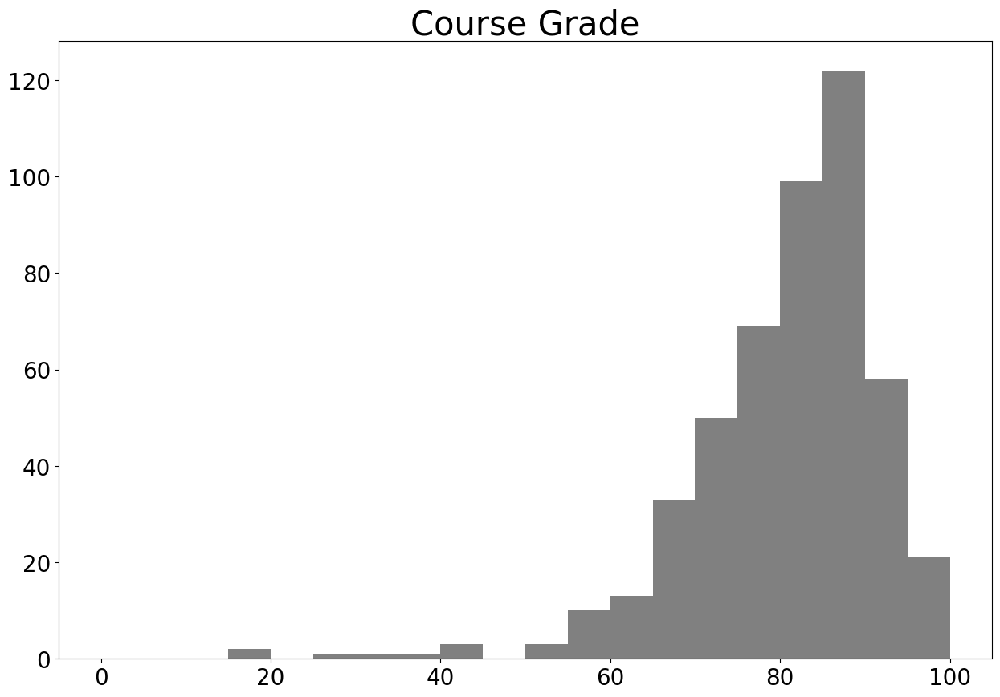

In [10]:
SMALL_SIZE = 8
MEDIUM_SIZE = 10
BIGGER_SIZE = 12
 
#plt.title('test title', fontsize=20)
#axes.titlesize

plt.rc('font', size=SMALL_SIZE)          # controls default text sizes
plt.rc('axes', titlesize=30)     # fontsize of the axes title
plt.rc('axes', labelsize=MEDIUM_SIZE)    # fontsize of the x and y labels
plt.rc('xtick', labelsize=20)    # fontsize of the tick labels
plt.rc('ytick', labelsize=20)    # fontsize of the tick labels
plt.rc('legend', fontsize=SMALL_SIZE)    # legend fontsize
plt.rc('figure', titlesize=BIGGER_SIZE)  # fontsize of the figure title

plt.figure(figsize=(15,10))
ax = plt.hist(data = input_p_df, x='Course Grade', bins=20, range=[0, 100], facecolor='gray', align='mid')
plt.title("Course Grade")
#figure = ax.figure()
plt.savefig('course_hist.png')

In [11]:
merge_pd = pd.merge(input_df, input_p_df, on='Student ID')

In [12]:
merge_pd

,Student ID,# Logins,# Content Reads,# Forum Reads,# Forum Posts,# Quiz Reviews before submission,Assignment 1 lateness indicator,Assignment 2 lateness indicator,Assignment 3 lateness indicator,Assignment 1 duration to submit (in hours),...,Engagement Level,Quiz01 [10],Assignment01 [8],Midterm Exam [20],Assignment02 [12],Assignment03 [25],Final Exam [35],Course Grade,Total [100],Class
0,student000000,143,344,58,0,3,0,0,0,178.166667,...,H,95,91,70,90,84,64,85,85,G
1,student000001,70,342,0,0,4,0,0,0,294.033333,...,M,85,76,65,61,73,64,76,76,G
2,student000002,42,219,0,0,3,0,0,0,169.600000,...,M,85,41,73,61,73,61,73,73,G
3,student000003,92,271,2,0,6,0,0,0,341.150000,...,M,80,78,80,79,79,57,80,79,G
4,student000004,116,379,0,0,1,0,0,0,325.500000,...,M,85,91,78,80,84,67,85,85,G
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
481,student000481,98,281,0,0,1,0,0,0,175.200000,...,H,90,85,93,87,81,77,92,92,G
482,student000482,85,258,1,0,2,0,0,0,127.633333,...,H,80,68,93,70,83,83,90,90,G
483,student000483,99,206,0,0,6,0,0,0,177.850000,...,M,80,86,93,95,90,83,96,96,G
484,student000484,51,158,0,0,2,0,0,0,125.900000,...,H,75,68,80,76,88,50,78,78,G


In [13]:
''' creat columns called 'Assignment0x [n]_rank' for different assignments '''

merge_pd['Assignment01 [8]_rank'] = merge_pd['Assignment01 [8]'].rank(ascending=False, method='max').astype(int)
merge_pd['Assignment02 [12]_rank'] = merge_pd['Assignment02 [12]'].rank(ascending=False, method='max').astype(int)
merge_pd['Assignment03 [25]_rank'] = merge_pd['Assignment03 [25]'].rank(ascending=False, method='max').astype(int)

In [14]:
merge_pd

,Student ID,# Logins,# Content Reads,# Forum Reads,# Forum Posts,# Quiz Reviews before submission,Assignment 1 lateness indicator,Assignment 2 lateness indicator,Assignment 3 lateness indicator,Assignment 1 duration to submit (in hours),...,Midterm Exam [20],Assignment02 [12],Assignment03 [25],Final Exam [35],Course Grade,Total [100],Class,Assignment01 [8]_rank,Assignment02 [12]_rank,Assignment03 [25]_rank
0,student000000,143,344,58,0,3,0,0,0,178.166667,...,70,90,84,64,85,85,G,74,65,232
1,student000001,70,342,0,0,4,0,0,0,294.033333,...,65,61,73,64,76,76,G,297,453,412
2,student000002,42,219,0,0,3,0,0,0,169.600000,...,73,61,73,61,73,73,G,467,453,412
3,student000003,92,271,2,0,6,0,0,0,341.150000,...,80,79,79,57,80,79,G,271,276,333
4,student000004,116,379,0,0,1,0,0,0,325.500000,...,78,80,84,67,85,85,G,74,258,232
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
481,student000481,98,281,0,0,1,0,0,0,175.200000,...,93,87,81,77,92,92,G,160,126,295
482,student000482,85,258,1,0,2,0,0,0,127.633333,...,93,70,83,83,90,90,G,378,391,250
483,student000483,99,206,0,0,6,0,0,0,177.850000,...,93,95,90,83,96,96,G,145,5,115
484,student000484,51,158,0,0,2,0,0,0,125.900000,...,80,76,88,50,78,78,G,378,319,143


## PE: Position embedding

In [15]:
def getPositionEncoding(seq_len, d, n):
    P = np.zeros((seq_len, d))
    for k in range(seq_len):
        for i in np.arange(int(d/2)):
            denominator = np.power(n, 2*i/d)
            P[k, 2*i] = np.sin(k/denominator)
            P[k, 2*i+1] = np.cos(k/denominator)
    return P

In [16]:
def getPositionEmbedding(column_name, short_name):
    seq_len = merge_pd[column_name].max()
    n=10000
    d=10
    
    result = getPositionEncoding(seq_len, d, n)
    df_PE = pd.DataFrame(result)
    df_PE.index = np.arange(1, len(df_PE) + 1)

    df_PE.index.name = column_name

    column_names = []

    for i in range(d):
        column_names.append(short_name + '_' + str(i + 1))
    
    df_PE.columns = column_names
    
    return df_PE

# get the position embedding for each assignment
df_1 = pd.DataFrame(getPositionEmbedding('Assignment01 [8]_rank', 'A1'))
df_2 = pd.DataFrame(getPositionEmbedding('Assignment02 [12]_rank', 'A2'))
df_3 = pd.DataFrame(getPositionEmbedding('Assignment03 [25]_rank', 'A3'))

df_2


,A2_1,A2_2,A2_3,A2_4,A2_5,A2_6,A2_7,A2_8,A2_9,A2_10
Assignment02 [12]_rank,,,,,,,,,,
1,0.000000,1.000000,0.000000,1.000000,0.000000,1.000000,0.000000,1.000000,0.000000,1.000000
2,0.841471,0.540302,0.157827,0.987467,0.025116,0.999685,0.003981,0.999992,0.000631,1.000000
3,0.909297,-0.416147,0.311697,0.950182,0.050217,0.998738,0.007962,0.999968,0.001262,0.999999
4,0.141120,-0.989992,0.457755,0.889079,0.075285,0.997162,0.011943,0.999929,0.001893,0.999998
5,-0.756802,-0.653644,0.592338,0.805690,0.100306,0.994957,0.015924,0.999873,0.002524,0.999997
...,...,...,...,...,...,...,...,...,...,...
482,-0.330019,-0.943974,0.741390,0.671075,-0.465498,0.885049,0.941380,-0.337349,0.298853,0.954299
483,-0.972637,-0.232330,0.838011,0.545653,-0.443122,0.896461,0.940029,-0.341094,0.299455,0.954110
484,-0.721017,0.692918,0.913627,0.406554,-0.420466,0.907308,0.938664,-0.344833,0.300057,0.953921


In [17]:
# merge the position embedding with the original data
merge_pd = pd.merge(pd.merge(pd.merge(merge_pd, df_1, on='Assignment01 [8]_rank'), df_2, on='Assignment02 [12]_rank'), df_3, on='Assignment03 [25]_rank')
merge_pd

,Student ID,# Logins,# Content Reads,# Forum Reads,# Forum Posts,# Quiz Reviews before submission,Assignment 1 lateness indicator,Assignment 2 lateness indicator,Assignment 3 lateness indicator,Assignment 1 duration to submit (in hours),...,A3_1,A3_2,A3_3,A3_4,A3_5,A3_6,A3_7,A3_8,A3_9,A3_10
0,student000000,143,344,58,0,3,0,0,0,178.166667,...,-0.995684,0.092806,-0.885737,0.464188,-0.462424,0.886659,0.795376,0.606116,0.145236,0.989397
1,student000004,116,379,0,0,1,0,0,0,325.500000,...,-0.995684,0.092806,-0.885737,0.464188,-0.462424,0.886659,0.795376,0.606116,0.145236,0.989397
2,student000251,67,264,0,0,1,0,0,0,135.916667,...,-0.995684,0.092806,-0.885737,0.464188,-0.462424,0.886659,0.795376,0.606116,0.145236,0.989397
3,student000239,67,259,1,1,0,0,0,0,170.950000,...,-0.995684,0.092806,-0.885737,0.464188,-0.462424,0.886659,0.795376,0.606116,0.145236,0.989397
4,student000125,76,340,0,0,4,0,0,0,187.400000,...,-0.995684,0.092806,-0.885737,0.464188,-0.462424,0.886659,0.795376,0.606116,0.145236,0.989397
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
481,student000113,21,80,0,0,2,1,1,1,558.000000,...,0.930117,0.367263,0.994833,0.101525,-0.374374,0.927278,0.935889,-0.352296,0.301261,0.953542
482,student000223,31,159,0,0,2,1,1,1,558.000000,...,0.930117,0.367263,0.994833,0.101525,-0.374374,0.927278,0.935889,-0.352296,0.301261,0.953542
483,student000150,18,140,0,0,2,1,0,1,558.000000,...,0.930117,0.367263,0.994833,0.101525,-0.374374,0.927278,0.935889,-0.352296,0.301261,0.953542
484,student000428,121,442,0,0,1,0,0,0,146.966667,...,0.981946,-0.189159,-0.419392,0.907805,-0.632787,0.774326,0.951645,-0.307201,0.294032,0.955796


In [18]:
col1 = df_1.columns.values
col2 = df_2.columns.values
col3 = df_3.columns.values
col_all = np.concatenate ([col1, col2, col3])
col_all

array(['A1_1', 'A1_2', 'A1_3', 'A1_4', 'A1_5', 'A1_6', 'A1_7', 'A1_8',
       'A1_9', 'A1_10', 'A2_1', 'A2_2', 'A2_3', 'A2_4', 'A2_5', 'A2_6',
       'A2_7', 'A2_8', 'A2_9', 'A2_10', 'A3_1', 'A3_2', 'A3_3', 'A3_4',
       'A3_5', 'A3_6', 'A3_7', 'A3_8', 'A3_9', 'A3_10'], dtype=object)

In [19]:
merge_pd[col_all]

,A1_1,A1_2,A1_3,A1_4,A1_5,A1_6,A1_7,A1_8,A1_9,A1_10,...,A3_1,A3_2,A3_3,A3_4,A3_5,A3_6,A3_7,A3_8,A3_9,A3_10
0,-0.676772,-0.736193,-0.839656,0.543118,0.965645,-0.259863,0.286545,0.958067,0.046044,0.998939,...,-0.995684,0.092806,-0.885737,0.464188,-0.462424,0.886659,0.795376,0.606116,0.145236,0.989397
1,-0.676772,-0.736193,-0.839656,0.543118,0.965645,-0.259863,0.286545,0.958067,0.046044,0.998939,...,-0.995684,0.092806,-0.885737,0.464188,-0.462424,0.886659,0.795376,0.606116,0.145236,0.989397
2,0.877590,0.479412,0.219912,-0.975520,-0.964738,-0.263212,0.647767,0.761839,0.111447,0.993770,...,-0.995684,0.092806,-0.885737,0.464188,-0.462424,0.886659,0.795376,0.606116,0.145236,0.989397
3,-0.989354,0.145530,0.832140,0.554566,0.301848,-0.953356,0.992114,0.125337,0.227040,0.973885,...,-0.995684,0.092806,-0.885737,0.464188,-0.462424,0.886659,0.795376,0.606116,0.145236,0.989397
4,0.008881,0.999961,-0.060177,-0.998188,-0.045019,-0.998986,0.997556,0.069875,0.235634,0.971842,...,-0.995684,0.092806,-0.885737,0.464188,-0.462424,0.886659,0.795376,0.606116,0.145236,0.989397
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
481,0.930117,0.367263,0.994833,0.101525,-0.374374,0.927278,0.935889,-0.352296,0.301261,0.953542,...,0.930117,0.367263,0.994833,0.101525,-0.374374,0.927278,0.935889,-0.352296,0.301261,0.953542
482,0.930117,0.367263,0.994833,0.101525,-0.374374,0.927278,0.935889,-0.352296,0.301261,0.953542,...,0.930117,0.367263,0.994833,0.101525,-0.374374,0.927278,0.935889,-0.352296,0.301261,0.953542
483,0.930117,0.367263,0.994833,0.101525,-0.374374,0.927278,0.935889,-0.352296,0.301261,0.953542,...,0.930117,0.367263,0.994833,0.101525,-0.374374,0.927278,0.935889,-0.352296,0.301261,0.953542
484,0.981946,-0.189159,-0.419392,0.907805,-0.632787,0.774326,0.951645,-0.307201,0.294032,0.955796,...,0.981946,-0.189159,-0.419392,0.907805,-0.632787,0.774326,0.951645,-0.307201,0.294032,0.955796


In [20]:
merge_pd['ass1_rate'] = merge_pd['Assignment01 [8]'] / merge_pd['Assignment 1 duration to submit (in hours)']
merge_pd['ass2_rate'] =  merge_pd['Assignment02 [12]'] / merge_pd['Assignment 2 duration to submit (in hours)']
merge_pd['ass3_rate'] =  merge_pd['Assignment03 [25]'] / merge_pd['Assignment 3 duration to submit (in hours)']


In [21]:
merge_pd['ass1_rate_log'] = merge_pd['Assignment01 [8]'] / np.log(merge_pd['Assignment 1 duration to submit (in hours)'])
merge_pd['ass2_rate_log'] = merge_pd['Assignment02 [12]'] / np.log(merge_pd['Assignment 2 duration to submit (in hours)'])
merge_pd['ass3_rate_log'] = merge_pd['Assignment03 [25]'] / np.log(merge_pd['Assignment 3 duration to submit (in hours)'])

In [22]:
merge_pd['ass1_time_minmax_norm'] = (merge_pd['Assignment 1 duration to submit (in hours)']-merge_pd['Assignment 1 duration to submit (in hours)'].min())/(merge_pd['Assignment 1 duration to submit (in hours)'].max()-merge_pd['Assignment 1 duration to submit (in hours)'].min())
merge_pd['ass1_score_minmax_norm'] = (merge_pd['Assignment01 [8]']-merge_pd['Assignment01 [8]'].min())/(merge_pd['Assignment01 [8]'].max()-merge_pd['Assignment01 [8]'].min())
merge_pd['ass1_rate_minmax_norm'] = merge_pd['ass1_score_minmax_norm'] / merge_pd['ass1_time_minmax_norm']


In [23]:
# ML predict score interval

In [24]:
merge_pd['below 60'] = 0
merge_pd.loc[merge_pd['Course Grade']<60, 'below 60'] = 1

In [25]:
merge_pd['below 70'] = 0
merge_pd.loc[merge_pd['Course Grade']<70, 'below 70'] = 1

In [26]:
merge_pd['below 80'] = 0
merge_pd.loc[merge_pd['Course Grade']<80, 'below 80'] = 1

In [27]:
merge_pd.columns

Index(['Student ID', '# Logins', '# Content Reads', '# Forum Reads',
       '# Forum Posts', '# Quiz Reviews before submission',
       'Assignment 1 lateness indicator', 'Assignment 2 lateness indicator',
       'Assignment 3 lateness indicator',
       'Assignment 1 duration to submit (in hours)',
       'Assignment 2 duration to submit (in hours)',
       'Assignment 3 duration to submit (in hours)',
       'Average time to submit assignment (in hours)', 'Engagement Level',
       'Quiz01 [10]', 'Assignment01 [8]', 'Midterm Exam [20]',
       'Assignment02 [12]', 'Assignment03 [25]', 'Final Exam [35]',
       'Course Grade', 'Total [100]', 'Class', 'Assignment01 [8]_rank',
       'Assignment02 [12]_rank', 'Assignment03 [25]_rank', 'A1_1', 'A1_2',
       'A1_3', 'A1_4', 'A1_5', 'A1_6', 'A1_7', 'A1_8', 'A1_9', 'A1_10', 'A2_1',
       'A2_2', 'A2_3', 'A2_4', 'A2_5', 'A2_6', 'A2_7', 'A2_8', 'A2_9', 'A2_10',
       'A3_1', 'A3_2', 'A3_3', 'A3_4', 'A3_5', 'A3_6', 'A3_7', 'A3_8', 'A3_9',
 

In [28]:
Model_Result = {}

# Modelling

In [29]:
from sklearn import preprocessing
from sklearn import metrics
from sklearn.linear_model import LogisticRegression
from sklearn import svm
from sklearn.model_selection import cross_validate, train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, classification_report

from keras.callbacks import EarlyStopping
from keras.models import Sequential
from keras.layers import SimpleRNN, Dense

max_abs_scaler = preprocessing.MaxAbsScaler()

In [444]:
merge_pd['below 60'].value_counts()

below 60
0    465
1     21
Name: count, dtype: int64

## For Assignment 1 only 

### Logistic Model & the Label is below 70

In [156]:
#ASSIGNMENT 1 only

X = np.array(merge_pd[['Assignment01 [8]', 'Assignment 1 duration to submit (in hours)']])
X = max_abs_scaler.fit_transform(X)
Y = np.array(merge_pd['below 70'])
X_train, X_test, y_train, y_test = train_test_split(X, Y, test_size=0.5, random_state=42)
Model_Dict = {}
Model_Dict['X Train'] = X_train
Model_Dict['X Test'] = X_test
Model_Dict['Y Train'] = y_train
Model_Dict['Y Test'] = y_test


# Transfer the SVM model into Logistic Regression model.
model = LogisticRegression(random_state=0)

model.fit(Model_Dict['X Train'], Model_Dict['Y Train'])
y_pred = model.predict(Model_Dict['X Test'])

Model_Dict['Y Prediction'] = y_pred

token = "ass1_N_blow70_LR_"
print("Accuracy:",metrics.accuracy_score(Model_Dict['Y Test'], Model_Dict['Y Prediction']))
Model_Result[token+'Accuracy'] = metrics.accuracy_score(Model_Dict['Y Test'], Model_Dict['Y Prediction'])
print("Precision:",metrics.precision_score(Model_Dict['Y Test'], Model_Dict['Y Prediction'],pos_label=1,average="macro"))
Model_Result[token+'Precision'] = metrics.precision_score(Model_Dict['Y Test'], Model_Dict['Y Prediction'],pos_label=1,average="macro")
print("Recall:",metrics.recall_score(Model_Dict['Y Test'], Model_Dict['Y Prediction'],pos_label=1,average="macro"))
Model_Result[token+'Recall'] = metrics.recall_score(Model_Dict['Y Test'], Model_Dict['Y Prediction'],pos_label=1,average="macro")
print("F1:",metrics.f1_score(Model_Dict['Y Test'], Model_Dict['Y Prediction'],pos_label=1,average="macro"))
Model_Result[token+'F1'] = metrics.f1_score(Model_Dict['Y Test'], Model_Dict['Y Prediction'],pos_label=1,average="macro")
print("#################### \n")

Accuracy: 0.8847736625514403
Precision: 0.8713680387409201
Recall: 0.5885281385281386
F1: 0.6186098654708521
#################### 



In [157]:
# add new feature ratio = score/time for assignment 1

X = np.array(merge_pd[['Assignment01 [8]', 'Assignment 1 duration to submit (in hours)', 'ass1_rate']])
Y = np.array(merge_pd['below 70'])
X_train, X_test, y_train, y_test = train_test_split(X, Y, test_size=0.5, random_state=42)
Model_Dict = {}
Model_Dict['X Train'] = X_train
Model_Dict['X Test'] = X_test
Model_Dict['Y Train'] = y_train
Model_Dict['Y Test'] = y_test


# Transfer the SVM model into Logistic Regression model.
model = LogisticRegression(random_state=0)

model.fit(Model_Dict['X Train'], Model_Dict['Y Train'])
y_pred = model.predict(Model_Dict['X Test'])

Model_Dict['Y Prediction'] = y_pred

token = "ass1_Y_blow70_LR_"
print("Accuracy:",metrics.accuracy_score(Model_Dict['Y Test'], Model_Dict['Y Prediction']))
Model_Result[token+'Accuracy'] = metrics.accuracy_score(Model_Dict['Y Test'], Model_Dict['Y Prediction'])
print("Precision:",metrics.precision_score(Model_Dict['Y Test'], Model_Dict['Y Prediction'],pos_label=1,average="macro"))
Model_Result[token+'Precision'] = metrics.precision_score(Model_Dict['Y Test'], Model_Dict['Y Prediction'],pos_label=1,average="macro")
print("Recall:",metrics.recall_score(Model_Dict['Y Test'], Model_Dict['Y Prediction'],pos_label=1,average="macro"))
Model_Result[token+'Recall'] = metrics.recall_score(Model_Dict['Y Test'], Model_Dict['Y Prediction'],pos_label=1,average="macro")
print("F1:",metrics.f1_score(Model_Dict['Y Test'], Model_Dict['Y Prediction'],pos_label=1,average="macro"))
Model_Result[token+'F1'] = metrics.f1_score(Model_Dict['Y Test'], Model_Dict['Y Prediction'],pos_label=1,average="macro")
print("#################### \n")

Accuracy: 0.8930041152263375
Precision: 0.891025641025641
Recall: 0.6188311688311688
F1: 0.6611969111969113
#################### 



In [158]:
# add new feature ratio = score/ln(time) for assignment 1

X = np.array(merge_pd[['Assignment01 [8]', 'Assignment 1 duration to submit (in hours)', 'ass1_rate_log']])
Y = np.array(merge_pd['below 70'])
X_train, X_test, y_train, y_test = train_test_split(X, Y, test_size=0.5, random_state=42)
Model_Dict = {}
Model_Dict['X Train'] = X_train
Model_Dict['X Test'] = X_test
Model_Dict['Y Train'] = y_train
Model_Dict['Y Test'] = y_test


# Transfer the SVM model into Logistic Regression model.
model = LogisticRegression(random_state=0)

model.fit(Model_Dict['X Train'], Model_Dict['Y Train'])
y_pred = model.predict(Model_Dict['X Test'])

Model_Dict['Y Prediction'] = y_pred

token = "ass1_Y_blow70_LR_"
print("Accuracy:",metrics.accuracy_score(Model_Dict['Y Test'], Model_Dict['Y Prediction']))
Model_Result[token+'Accuracy'] = metrics.accuracy_score(Model_Dict['Y Test'], Model_Dict['Y Prediction'])
print("Precision:",metrics.precision_score(Model_Dict['Y Test'], Model_Dict['Y Prediction'],pos_label=1,average="macro"))
Model_Result[token+'Precision'] = metrics.precision_score(Model_Dict['Y Test'], Model_Dict['Y Prediction'],pos_label=1,average="macro")
print("Recall:",metrics.recall_score(Model_Dict['Y Test'], Model_Dict['Y Prediction'],pos_label=1,average="macro"))
Model_Result[token+'Recall'] = metrics.recall_score(Model_Dict['Y Test'], Model_Dict['Y Prediction'],pos_label=1,average="macro")
print("F1:",metrics.f1_score(Model_Dict['Y Test'], Model_Dict['Y Prediction'],pos_label=1,average="macro"))
Model_Result[token+'F1'] = metrics.f1_score(Model_Dict['Y Test'], Model_Dict['Y Prediction'],pos_label=1,average="macro")
print("#################### \n")

Accuracy: 0.8847736625514403
Precision: 0.7939799331103679
Recall: 0.6268398268398268
F1: 0.6638339920948617
#################### 



### SVM Model (kernel='rbf')

In [159]:
X = np.array(merge_pd[['Assignment01 [8]', 'Assignment 1 duration to submit (in hours)']])
X = max_abs_scaler.fit_transform(X)
Y = np.array(merge_pd['below 70'])
X_train, X_test, y_train, y_test = train_test_split(X, Y, test_size=0.5, random_state=42)
Model_Dict = {}
Model_Dict['X Train'] = X_train
Model_Dict['X Test'] = X_test
Model_Dict['Y Train'] = y_train
Model_Dict['Y Test'] = y_test


# Transfer the SVM model into Logistic Regression model.
model = svm.SVC(kernel='rbf',decision_function_shape='ovo')
#model = svm.SVC(kernel='linear')
#model = svm.SVC(kernel='linear',decision_function_shape='ovo')
#model = svm.SVC(kernel='rbf',decision_function_shape='ovo')
#model = svm.SVC(kernel='poly')
#model = svm.SVC(kernel='poly',decision_function_shape='ovo')
#model = svm.SVC(kernel='sigmoid')
#model = svm.SVC(kernel='sigmoid',decision_function_shape='ovo')

model.fit(Model_Dict['X Train'], Model_Dict['Y Train'])
y_pred = model.predict(Model_Dict['X Test'])

Model_Dict['Y Prediction'] = y_pred

token = "ass1_N_blow70_SVM_"
print("Accuracy:",metrics.accuracy_score(Model_Dict['Y Test'], Model_Dict['Y Prediction']))
Model_Result[token+'Accuracy'] = metrics.accuracy_score(Model_Dict['Y Test'], Model_Dict['Y Prediction'])
print("Precision:",metrics.precision_score(Model_Dict['Y Test'], Model_Dict['Y Prediction'],pos_label=1,average="macro"))
Model_Result[token+'Precision'] = metrics.precision_score(Model_Dict['Y Test'], Model_Dict['Y Prediction'],pos_label=1,average="macro")
print("Recall:",metrics.recall_score(Model_Dict['Y Test'], Model_Dict['Y Prediction'],pos_label=1,average="macro"))
Model_Result[token+'Recall'] = metrics.recall_score(Model_Dict['Y Test'], Model_Dict['Y Prediction'],pos_label=1,average="macro")
print("F1:",metrics.f1_score(Model_Dict['Y Test'], Model_Dict['Y Prediction'],pos_label=1,average="macro"))
Model_Result[token+'F1'] = metrics.f1_score(Model_Dict['Y Test'], Model_Dict['Y Prediction'],pos_label=1,average="macro")
print("#################### \n")

Accuracy: 0.8930041152263375
Precision: 0.891025641025641
Recall: 0.6188311688311688
F1: 0.6611969111969113
#################### 



In [160]:
# add ratio = score/time for assignment 1
X = np.array(merge_pd[['Assignment01 [8]', 'Assignment 1 duration to submit (in hours)', 'ass1_rate']])
X = max_abs_scaler.fit_transform(X)
Y = np.array(merge_pd['below 70'])
X_train, X_test, y_train, y_test = train_test_split(X, Y, test_size=0.5, random_state=42)
Model_Dict = {}
Model_Dict['X Train'] = X_train
Model_Dict['X Test'] = X_test
Model_Dict['Y Train'] = y_train
Model_Dict['Y Test'] = y_test


# Transfer the SVM model into Logistic Regression model.
model = svm.SVC(kernel='rbf',decision_function_shape='ovo')
#model = svm.SVC(kernel='linear')
#model = svm.SVC(kernel='linear',decision_function_shape='ovo')
#model = svm.SVC(kernel='rbf',decision_function_shape='ovo')
#model = svm.SVC(kernel='poly')
#model = svm.SVC(kernel='poly',decision_function_shape='ovo')
#model = svm.SVC(kernel='sigmoid')
#model = svm.SVC(kernel='sigmoid',decision_function_shape='ovo')

model.fit(Model_Dict['X Train'], Model_Dict['Y Train'])
y_pred = model.predict(Model_Dict['X Test'])

Model_Dict['Y Prediction'] = y_pred

token = "ass1_Y_blow70_SVM_"
print("Accuracy:",metrics.accuracy_score(Model_Dict['Y Test'], Model_Dict['Y Prediction']))
Model_Result[token+'Accuracy'] = metrics.accuracy_score(Model_Dict['Y Test'], Model_Dict['Y Prediction'])
print("Precision:",metrics.precision_score(Model_Dict['Y Test'], Model_Dict['Y Prediction'],pos_label=1,average="macro"))
Model_Result[token+'Precision'] = metrics.precision_score(Model_Dict['Y Test'], Model_Dict['Y Prediction'],pos_label=1,average="macro")
print("Recall:",metrics.recall_score(Model_Dict['Y Test'], Model_Dict['Y Prediction'],pos_label=1,average="macro"))
Model_Result[token+'Recall'] = metrics.recall_score(Model_Dict['Y Test'], Model_Dict['Y Prediction'],pos_label=1,average="macro")
print("F1:",metrics.f1_score(Model_Dict['Y Test'], Model_Dict['Y Prediction'],pos_label=1,average="macro"))
Model_Result[token+'F1'] = metrics.f1_score(Model_Dict['Y Test'], Model_Dict['Y Prediction'],pos_label=1,average="macro")
print("#################### \n")

Accuracy: 0.8888888888888888
Precision: 0.8821808510638298
Recall: 0.6036796536796537
F1: 0.6403946286653877
#################### 



In [161]:
# add ratio = score/ln(time)for assignment 1
X = np.array(merge_pd[['Assignment01 [8]', 'Assignment 1 duration to submit (in hours)', 'ass1_rate_log']])
X = max_abs_scaler.fit_transform(X)
Y = np.array(merge_pd['below 70'])
X_train, X_test, y_train, y_test = train_test_split(X, Y, test_size=0.5, random_state=42)
Model_Dict = {}
Model_Dict['X Train'] = X_train
Model_Dict['X Test'] = X_test
Model_Dict['Y Train'] = y_train
Model_Dict['Y Test'] = y_test


# Transfer the SVM model into Logistic Regression model.
model = svm.SVC(kernel='rbf',decision_function_shape='ovo')
#model = svm.SVC(kernel='linear')
#model = svm.SVC(kernel='linear',decision_function_shape='ovo')
#model = svm.SVC(kernel='rbf',decision_function_shape='ovo')
#model = svm.SVC(kernel='poly')
#model = svm.SVC(kernel='poly',decision_function_shape='ovo')
#model = svm.SVC(kernel='sigmoid')
#model = svm.SVC(kernel='sigmoid',decision_function_shape='ovo')

model.fit(Model_Dict['X Train'], Model_Dict['Y Train'])
y_pred = model.predict(Model_Dict['X Test'])

Model_Dict['Y Prediction'] = y_pred

token = "ass1_Y_blow70_SVM_"
print("Accuracy:",metrics.accuracy_score(Model_Dict['Y Test'], Model_Dict['Y Prediction']))
Model_Result[token+'Accuracy'] = metrics.accuracy_score(Model_Dict['Y Test'], Model_Dict['Y Prediction'])
print("Precision:",metrics.precision_score(Model_Dict['Y Test'], Model_Dict['Y Prediction'],pos_label=1,average="macro"))
Model_Result[token+'Precision'] = metrics.precision_score(Model_Dict['Y Test'], Model_Dict['Y Prediction'],pos_label=1,average="macro")
print("Recall:",metrics.recall_score(Model_Dict['Y Test'], Model_Dict['Y Prediction'],pos_label=1,average="macro"))
Model_Result[token+'Recall'] = metrics.recall_score(Model_Dict['Y Test'], Model_Dict['Y Prediction'],pos_label=1,average="macro")
print("F1:",metrics.f1_score(Model_Dict['Y Test'], Model_Dict['Y Prediction'],pos_label=1,average="macro"))
Model_Result[token+'F1'] = metrics.f1_score(Model_Dict['Y Test'], Model_Dict['Y Prediction'],pos_label=1,average="macro")
print("#################### \n")

Accuracy: 0.8930041152263375
Precision: 0.891025641025641
Recall: 0.6188311688311688
F1: 0.6611969111969113
#################### 



### Logistic Model & the Label is below 80

In [162]:
# no ratio
X = np.array(merge_pd[['Assignment01 [8]', 'Assignment 1 duration to submit (in hours)']])
X = max_abs_scaler.fit_transform(X)
Y = np.array(merge_pd['below 80'])
X_train, X_test, y_train, y_test = train_test_split(X, Y, test_size=0.5)
Model_Dict = {}
Model_Dict['X Train'] = X_train
Model_Dict['X Test'] = X_test
Model_Dict['Y Train'] = y_train
Model_Dict['Y Test'] = y_test


# Transfer the SVM model into Logistic Regression model.
model = LogisticRegression(random_state=0)

model.fit(Model_Dict['X Train'], Model_Dict['Y Train'])
y_pred = model.predict(Model_Dict['X Test'])

Model_Dict['Y Prediction'] = y_pred

token = "ass1_N_blow80_LR_"
print("Accuracy:",metrics.accuracy_score(Model_Dict['Y Test'], Model_Dict['Y Prediction']))
Model_Result[token+'Accuracy'] = metrics.accuracy_score(Model_Dict['Y Test'], Model_Dict['Y Prediction'])
print("Precision:",metrics.precision_score(Model_Dict['Y Test'], Model_Dict['Y Prediction'],pos_label=1,average="macro"))
Model_Result[token+'Precision'] = metrics.precision_score(Model_Dict['Y Test'], Model_Dict['Y Prediction'],pos_label=1,average="macro")
print("Recall:",metrics.recall_score(Model_Dict['Y Test'], Model_Dict['Y Prediction'],pos_label=1,average="macro"))
Model_Result[token+'Recall'] = metrics.recall_score(Model_Dict['Y Test'], Model_Dict['Y Prediction'],pos_label=1,average="macro")
print("F1:",metrics.f1_score(Model_Dict['Y Test'], Model_Dict['Y Prediction'],pos_label=1,average="macro"))
Model_Result[token+'F1'] = metrics.f1_score(Model_Dict['Y Test'], Model_Dict['Y Prediction'],pos_label=1,average="macro")
print("#################### \n")

Accuracy: 0.7283950617283951
Precision: 0.7892574558734022
Recall: 0.638698380271414
F1: 0.6348360655737706
#################### 



In [163]:
# cv=5

from sklearn.model_selection import cross_validate
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score

# Define feature set and target variable
X = np.array(merge_pd[['Assignment01 [8]', 'Assignment 1 duration to submit (in hours)']])
Y = np.array(merge_pd['below 80'])

# Transfer the SVM model into Logistic Regression model
model = LogisticRegression(random_state=0)

# Evaluate the model using 5-fold cross-validation
scoring = ['accuracy', 'precision_macro', 'recall_macro', 'f1_macro']
cv_results = cross_validate(model, X, Y, cv=5, scoring=scoring)

# Print the average performance across all folds
print("Accuracy:", np.mean(cv_results['test_accuracy']))
print("Precision:", np.mean(cv_results['test_precision_macro']))
print("Recall:", np.mean(cv_results['test_recall_macro']))
print("F1:", np.mean(cv_results['test_f1_macro']))


Accuracy: 0.746980854197349
Precision: 0.7446407956666578
Recall: 0.7044286391654813
F1: 0.7095508929446656


In [164]:
# add ratio = score/time for assignment 1
X = np.array(merge_pd[['Assignment01 [8]', 'Assignment 1 duration to submit (in hours)', 'ass1_rate']])
Y = np.array(merge_pd['below 80'])
X_train, X_test, y_train, y_test = train_test_split(X, Y, test_size=0.5)
Model_Dict = {}
Model_Dict['X Train'] = X_train
Model_Dict['X Test'] = X_test
Model_Dict['Y Train'] = y_train
Model_Dict['Y Test'] = y_test


# Transfer the SVM model into Logistic Regression model.
model = LogisticRegression(random_state=0)

model.fit(Model_Dict['X Train'], Model_Dict['Y Train'])
y_pred = model.predict(Model_Dict['X Test'])

Model_Dict['Y Prediction'] = y_pred

token = "ass1_Y_blow80_LR_"
print("Accuracy:",metrics.accuracy_score(Model_Dict['Y Test'], Model_Dict['Y Prediction']))
Model_Result[token+'Accuracy'] = metrics.accuracy_score(Model_Dict['Y Test'], Model_Dict['Y Prediction'])
print("Precision:",metrics.precision_score(Model_Dict['Y Test'], Model_Dict['Y Prediction'],pos_label=1,average="macro"))
Model_Result[token+'Precision'] = metrics.precision_score(Model_Dict['Y Test'], Model_Dict['Y Prediction'],pos_label=1,average="macro")
print("Recall:",metrics.recall_score(Model_Dict['Y Test'], Model_Dict['Y Prediction'],pos_label=1,average="macro"))
Model_Result[token+'Recall'] = metrics.recall_score(Model_Dict['Y Test'], Model_Dict['Y Prediction'],pos_label=1,average="macro")
print("F1:",metrics.f1_score(Model_Dict['Y Test'], Model_Dict['Y Prediction'],pos_label=1,average="macro"))
Model_Result[token+'F1'] = metrics.f1_score(Model_Dict['Y Test'], Model_Dict['Y Prediction'],pos_label=1,average="macro")
print("#################### \n")

Accuracy: 0.7983539094650206
Precision: 0.8035187914517318
Recall: 0.7440379203081025
F1: 0.7591869754272424
#################### 



In [165]:
# cv=5

from sklearn.model_selection import cross_validate
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score

# Define feature set and target variable
X = np.array(merge_pd[['Assignment01 [8]', 'Assignment 1 duration to submit (in hours)', 'ass1_rate']])
Y = np.array(merge_pd['below 80'])

# Transfer the SVM model into Logistic Regression model
model = LogisticRegression(random_state=0)

# Evaluate the model using 5-fold cross-validation
scoring = ['accuracy', 'precision_macro', 'recall_macro', 'f1_macro']
cv_results = cross_validate(model, X, Y, cv=5, scoring=scoring)

# Print the average performance across all folds
print("Accuracy:", np.mean(cv_results['test_accuracy']))
print("Precision:", np.mean(cv_results['test_precision_macro']))
print("Recall:", np.mean(cv_results['test_recall_macro']))
print("F1:", np.mean(cv_results['test_f1_macro']))


Accuracy: 0.7428571428571429
Precision: 0.7399893374757258
Recall: 0.6990232337600759
F1: 0.7038200814519724


In [166]:
# add ratio = score/ln(time) for assignment 1
X = np.array(merge_pd[['Assignment01 [8]', 'Assignment 1 duration to submit (in hours)', 'ass1_rate_log']])
Y = np.array(merge_pd['below 80'])
X_train, X_test, y_train, y_test = train_test_split(X, Y, test_size=0.5)
Model_Dict = {}
Model_Dict['X Train'] = X_train
Model_Dict['X Test'] = X_test
Model_Dict['Y Train'] = y_train
Model_Dict['Y Test'] = y_test


# Transfer the SVM model into Logistic Regression model.
model = LogisticRegression(random_state=0)

model.fit(Model_Dict['X Train'], Model_Dict['Y Train'])
y_pred = model.predict(Model_Dict['X Test'])

Model_Dict['Y Prediction'] = y_pred

token = "ass1_Y_blow80_LR_"
print("Accuracy:",metrics.accuracy_score(Model_Dict['Y Test'], Model_Dict['Y Prediction']))
Model_Result[token+'Accuracy'] = metrics.accuracy_score(Model_Dict['Y Test'], Model_Dict['Y Prediction'])
print("Precision:",metrics.precision_score(Model_Dict['Y Test'], Model_Dict['Y Prediction'],pos_label=1,average="macro"))
Model_Result[token+'Precision'] = metrics.precision_score(Model_Dict['Y Test'], Model_Dict['Y Prediction'],pos_label=1,average="macro")
print("Recall:",metrics.recall_score(Model_Dict['Y Test'], Model_Dict['Y Prediction'],pos_label=1,average="macro"))
Model_Result[token+'Recall'] = metrics.recall_score(Model_Dict['Y Test'], Model_Dict['Y Prediction'],pos_label=1,average="macro")
print("F1:",metrics.f1_score(Model_Dict['Y Test'], Model_Dict['Y Prediction'],pos_label=1,average="macro"))
Model_Result[token+'F1'] = metrics.f1_score(Model_Dict['Y Test'], Model_Dict['Y Prediction'],pos_label=1,average="macro")
print("#################### \n")

Accuracy: 0.7242798353909465
Precision: 0.7144170798016951
Recall: 0.6907183499288763
F1: 0.6960969144905083
#################### 



In [167]:
# cv=5

from sklearn.model_selection import cross_validate
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score

# Define feature set and target variable
X = np.array(merge_pd[['Assignment01 [8]', 'Assignment 1 duration to submit (in hours)', 'ass1_rate_log']])
Y = np.array(merge_pd['below 80'])

# Transfer the SVM model into Logistic Regression model
model = LogisticRegression(random_state=0)

# Evaluate the model using 5-fold cross-validation
scoring = ['accuracy', 'precision_macro', 'recall_macro', 'f1_macro']
cv_results = cross_validate(model, X, Y, cv=5, scoring=scoring)

# Print the average performance across all folds
print("Accuracy:", np.mean(cv_results['test_accuracy']))
print("Precision:", np.mean(cv_results['test_precision_macro']))
print("Recall:", np.mean(cv_results['test_recall_macro']))
print("F1:", np.mean(cv_results['test_f1_macro']))


Accuracy: 0.7346728382074479
Precision: 0.7269093837006685
Recall: 0.6914627785680418
F1: 0.6941091319356286


### SVM model (kernel='poly')

In [168]:
# no ratio
X = np.array(merge_pd[['Assignment01 [8]', 'Assignment 1 duration to submit (in hours)']])
X = max_abs_scaler.fit_transform(X)
Y = np.array(merge_pd['below 80'])
X_train, X_test, y_train, y_test = train_test_split(X, Y, test_size=0.5)
Model_Dict = {}
Model_Dict['X Train'] = X_train
Model_Dict['X Test'] = X_test
Model_Dict['Y Train'] = y_train
Model_Dict['Y Test'] = y_test


# Transfer the SVM model into Logistic Regression model.
#model = svm.SVC(kernel='rbf',decision_function_shape='ovo')
#model = svm.SVC(kernel='linear')
#model = svm.SVC(kernel='linear',decision_function_shape='ovo')
#model = svm.SVC(kernel='rbf',decision_function_shape='ovo')
#model = svm.SVC(kernel='poly')
model = svm.SVC(kernel='poly',decision_function_shape='ovo')
#model = svm.SVC(kernel='sigmoid')
#model = svm.SVC(kernel='sigmoid',decision_function_shape='ovo')

model.fit(Model_Dict['X Train'], Model_Dict['Y Train'])
y_pred = model.predict(Model_Dict['X Test'])

Model_Dict['Y Prediction'] = y_pred

token = "ass1_N_blow80_SVM_"
print("Accuracy:",metrics.accuracy_score(Model_Dict['Y Test'], Model_Dict['Y Prediction']))
Model_Result[token+'Accuracy'] = metrics.accuracy_score(Model_Dict['Y Test'], Model_Dict['Y Prediction'])
print("Precision:",metrics.precision_score(Model_Dict['Y Test'], Model_Dict['Y Prediction'],pos_label=1,average="macro"))
Model_Result[token+'Precision'] = metrics.precision_score(Model_Dict['Y Test'], Model_Dict['Y Prediction'],pos_label=1,average="macro")
print("Recall:",metrics.recall_score(Model_Dict['Y Test'], Model_Dict['Y Prediction'],pos_label=1,average="macro"))
Model_Result[token+'Recall'] = metrics.recall_score(Model_Dict['Y Test'], Model_Dict['Y Prediction'],pos_label=1,average="macro")
print("F1:",metrics.f1_score(Model_Dict['Y Test'], Model_Dict['Y Prediction'],pos_label=1,average="macro"))
Model_Result[token+'F1'] = metrics.f1_score(Model_Dict['Y Test'], Model_Dict['Y Prediction'],pos_label=1,average="macro")
print("#################### \n")

Accuracy: 0.6666666666666666
Precision: 0.6431089743589744
Recall: 0.5968406593406593
F1: 0.5919183961188398
#################### 



In [169]:
# cv=5

from sklearn.model_selection import cross_validate
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score

# Define feature set and target variable
X = np.array(merge_pd[['Assignment01 [8]', 'Assignment 1 duration to submit (in hours)']])
Y = np.array(merge_pd['below 80'])

# Transfer the SVM model into Logistic Regression model.
#model = svm.SVC(kernel='rbf',decision_function_shape='ovo')
#model = svm.SVC(kernel='linear')
#model = svm.SVC(kernel='linear',decision_function_shape='ovo')
#model = svm.SVC(kernel='rbf',decision_function_shape='ovo')
#model = svm.SVC(kernel='poly')
model = svm.SVC(kernel='poly',decision_function_shape='ovo')
#model = svm.SVC(kernel='sigmoid')
#model = svm.SVC(kernel='sigmoid',decision_function_shape='ovo')

# Evaluate the model using 5-fold cross-validation
scoring = ['accuracy', 'precision_macro', 'recall_macro', 'f1_macro']
cv_results = cross_validate(model, X, Y, cv=5, scoring=scoring)

# Print the average performance across all folds
print("Accuracy:", np.mean(cv_results['test_accuracy']))
print("Precision:", np.mean(cv_results['test_precision_macro']))
print("Recall:", np.mean(cv_results['test_recall_macro']))
print("F1:", np.mean(cv_results['test_f1_macro']))


Accuracy: 0.7222596254996845
Precision: 0.744164502045367
Recall: 0.6578473210052158
F1: 0.6535619913127539


In [170]:
# add ratio = score/time for assignment 1
X = np.array(merge_pd[['Assignment01 [8]', 'Assignment 1 duration to submit (in hours)', 'ass1_rate']])
X = max_abs_scaler.fit_transform(X)
Y = np.array(merge_pd['below 80'])
X_train, X_test, y_train, y_test = train_test_split(X, Y, test_size=0.5)
Model_Dict = {}
Model_Dict['X Train'] = X_train
Model_Dict['X Test'] = X_test
Model_Dict['Y Train'] = y_train
Model_Dict['Y Test'] = y_test


# Transfer the SVM model into Logistic Regression model.
#model = svm.SVC(kernel='rbf',decision_function_shape='ovo')
#model = svm.SVC(kernel='linear')
#model = svm.SVC(kernel='linear',decision_function_shape='ovo')
#model = svm.SVC(kernel='rbf',decision_function_shape='ovo')
#model = svm.SVC(kernel='poly')
model = svm.SVC(kernel='poly',decision_function_shape='ovo')
#model = svm.SVC(kernel='sigmoid')
#model = svm.SVC(kernel='sigmoid',decision_function_shape='ovo')

model.fit(Model_Dict['X Train'], Model_Dict['Y Train'])
y_pred = model.predict(Model_Dict['X Test'])

Model_Dict['Y Prediction'] = y_pred

token = "ass1_Y_blow80_SVM_"
print("Accuracy:",metrics.accuracy_score(Model_Dict['Y Test'], Model_Dict['Y Prediction']))
Model_Result[token+'Accuracy'] = metrics.accuracy_score(Model_Dict['Y Test'], Model_Dict['Y Prediction'])
print("Precision:",metrics.precision_score(Model_Dict['Y Test'], Model_Dict['Y Prediction'],pos_label=1,average="macro"))
Model_Result[token+'Precision'] = metrics.precision_score(Model_Dict['Y Test'], Model_Dict['Y Prediction'],pos_label=1,average="macro")
print("Recall:",metrics.recall_score(Model_Dict['Y Test'], Model_Dict['Y Prediction'],pos_label=1,average="macro"))
Model_Result[token+'Recall'] = metrics.recall_score(Model_Dict['Y Test'], Model_Dict['Y Prediction'],pos_label=1,average="macro")
print("F1:",metrics.f1_score(Model_Dict['Y Test'], Model_Dict['Y Prediction'],pos_label=1,average="macro"))
Model_Result[token+'F1'] = metrics.f1_score(Model_Dict['Y Test'], Model_Dict['Y Prediction'],pos_label=1,average="macro")
print("#################### \n")

Accuracy: 0.720164609053498
Precision: 0.6946847507331378
Recall: 0.6966745667308547
F1: 0.6956233421750664
#################### 



In [171]:
# ratio & cv=5
# add ratio = score/time for assignment 1
X = np.array(merge_pd[['Assignment01 [8]', 'Assignment 1 duration to submit (in hours)', 'ass1_rate']])
X = max_abs_scaler.fit_transform(X)
Y = np.array(merge_pd['below 80'])

#model = svm.SVC(kernel='rbf',decision_function_shape='ovo')
#model = svm.SVC(kernel='linear')
#model = svm.SVC(kernel='linear',decision_function_shape='ovo')
#model = svm.SVC(kernel='rbf',decision_function_shape='ovo')
#model = svm.SVC(kernel='poly')
model = svm.SVC(kernel='poly',decision_function_shape='ovo')
#model = svm.SVC(kernel='sigmoid')
#model = svm.SVC(kernel='sigmoid',decision_function_shape='ovo')


# Train model with cross-validation
scoring = ['accuracy', 'precision_macro', 'recall_macro', 'f1_macro']
cv_results = cross_validate(model, X, Y, scoring=scoring, cv=5)

# Print the average performance across all folds
print("Accuracy:", np.mean(cv_results['test_accuracy']))
print("Precision:", np.mean(cv_results['test_precision_macro']))
print("Recall:", np.mean(cv_results['test_recall_macro']))
print("F1:", np.mean(cv_results['test_f1_macro']))


Accuracy: 0.7408163265306122
Precision: 0.7358368059322171
Recall: 0.6973565670934092
F1: 0.7013797999410993


In [172]:
# add ratio = score/time for assignment 1
X = np.array(merge_pd[['Assignment01 [8]', 'Assignment 1 duration to submit (in hours)', 'ass1_rate_log']])
X = max_abs_scaler.fit_transform(X)
Y = np.array(merge_pd['below 80'])
X_train, X_test, y_train, y_test = train_test_split(X, Y, test_size=0.5)
Model_Dict = {}
Model_Dict['X Train'] = X_train
Model_Dict['X Test'] = X_test
Model_Dict['Y Train'] = y_train
Model_Dict['Y Test'] = y_test


# Transfer the SVM model into Logistic Regression model.
#model = svm.SVC(kernel='rbf',decision_function_shape='ovo')
#model = svm.SVC(kernel='linear')
#model = svm.SVC(kernel='linear',decision_function_shape='ovo')
#model = svm.SVC(kernel='rbf',decision_function_shape='ovo')
#model = svm.SVC(kernel='poly')
model = svm.SVC(kernel='poly',decision_function_shape='ovo')
#model = svm.SVC(kernel='sigmoid')
#model = svm.SVC(kernel='sigmoid',decision_function_shape='ovo')

model.fit(Model_Dict['X Train'], Model_Dict['Y Train'])
y_pred = model.predict(Model_Dict['X Test'])

Model_Dict['Y Prediction'] = y_pred

token = "ass1_Y_blow80_SVM_"
print("Accuracy:",metrics.accuracy_score(Model_Dict['Y Test'], Model_Dict['Y Prediction']))
Model_Result[token+'Accuracy'] = metrics.accuracy_score(Model_Dict['Y Test'], Model_Dict['Y Prediction'])
print("Precision:",metrics.precision_score(Model_Dict['Y Test'], Model_Dict['Y Prediction'],pos_label=1,average="macro"))
Model_Result[token+'Precision'] = metrics.precision_score(Model_Dict['Y Test'], Model_Dict['Y Prediction'],pos_label=1,average="macro")
print("Recall:",metrics.recall_score(Model_Dict['Y Test'], Model_Dict['Y Prediction'],pos_label=1,average="macro"))
Model_Result[token+'Recall'] = metrics.recall_score(Model_Dict['Y Test'], Model_Dict['Y Prediction'],pos_label=1,average="macro")
print("F1:",metrics.f1_score(Model_Dict['Y Test'], Model_Dict['Y Prediction'],pos_label=1,average="macro"))
Model_Result[token+'F1'] = metrics.f1_score(Model_Dict['Y Test'], Model_Dict['Y Prediction'],pos_label=1,average="macro")
print("#################### \n")

Accuracy: 0.7325102880658436
Precision: 0.7803308823529411
Recall: 0.690863579474343
F1: 0.6899841017488075
#################### 



In [173]:
# ratio_log & cv=5
# add ratio_log = score/ln(time) for assignment 1
X = np.array(merge_pd[['Assignment01 [8]', 'Assignment 1 duration to submit (in hours)', 'ass1_rate_log']])
X = max_abs_scaler.fit_transform(X)
Y = np.array(merge_pd['below 80'])

#model = svm.SVC(kernel='rbf',decision_function_shape='ovo')
#model = svm.SVC(kernel='linear')
#model = svm.SVC(kernel='linear',decision_function_shape='ovo')
#model = svm.SVC(kernel='rbf',decision_function_shape='ovo')
#model = svm.SVC(kernel='poly')
model = svm.SVC(kernel='poly',decision_function_shape='ovo')
#model = svm.SVC(kernel='sigmoid')
#model = svm.SVC(kernel='sigmoid',decision_function_shape='ovo')


# Train model with cross-validation
scoring = ['accuracy', 'precision_macro', 'recall_macro', 'f1_macro']
cv_results = cross_validate(model, X, Y, scoring=scoring, cv=5)

# Print the average performance across all folds
print("Accuracy:", np.mean(cv_results['test_accuracy']))
print("Precision:", np.mean(cv_results['test_precision_macro']))
print("Recall:", np.mean(cv_results['test_recall_macro']))
print("F1:", np.mean(cv_results['test_f1_macro']))

Accuracy: 0.7304860088365241
Precision: 0.7402238639866333
Recall: 0.6726600284495021
F1: 0.6719209497067716


## RNN Model

### Socre Only

In [90]:
X = np.array(merge_pd[['Assignment01 [8]']])
X = max_abs_scaler.fit_transform(X)
Y = np.array(merge_pd['below 80'])

# Normalize the input features
X = max_abs_scaler.fit_transform(X)

# Reshape the input into sequences
X = X.reshape(X.shape[0], X.shape[1], 1)

# Split data into train and test sets
X_train, X_test, y_train, y_test = train_test_split(X, Y, test_size=0.5)

# Define the RNN model
model = Sequential()
model.add(SimpleRNN(10, input_shape=(1, 1)))  # input_shape=(n_timesteps, features)
model.add(Dense(1, activation='sigmoid'))  # Output layer with sigmoid activation

# Compile the model
model.compile(loss='binary_crossentropy', optimizer='sgd', metrics=['accuracy'])

# Define early stopping criteria
early_stopping = EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)

# Train the model with early stopping
model.fit(X_train, y_train, epochs=1024, batch_size=32, validation_data=(X_test, y_test), callbacks=[early_stopping])

# Predict the labels for the test set
y_pred = model.predict(X_test)
y_pred = (y_pred > 0.5).astype(int)


Epoch 1/1024
8/8 [==============================] - 1s 36ms/step - loss: 0.9372 - accuracy: 0.3416 - val_loss: 0.8847 - val_accuracy: 0.3827
Epoch 2/1024
8/8 [==============================] - 0s 6ms/step - loss: 0.9019 - accuracy: 0.3416 - val_loss: 0.8558 - val_accuracy: 0.3827
Epoch 3/1024
8/8 [==============================] - 0s 7ms/step - loss: 0.8714 - accuracy: 0.3416 - val_loss: 0.8310 - val_accuracy: 0.3827
Epoch 4/1024
8/8 [==============================] - 0s 7ms/step - loss: 0.8454 - accuracy: 0.3416 - val_loss: 0.8101 - val_accuracy: 0.3786
Epoch 5/1024
8/8 [==============================] - 0s 6ms/step - loss: 0.8231 - accuracy: 0.3374 - val_loss: 0.7927 - val_accuracy: 0.3786
Epoch 6/1024
8/8 [==============================] - 0s 7ms/step - loss: 0.8042 - accuracy: 0.3374 - val_loss: 0.7767 - val_accuracy: 0.3786
Epoch 7/1024
8/8 [==============================] - 0s 6ms/step - loss: 0.7867 - accuracy: 0.3374 - val_loss: 0.7629 - val_accuracy: 0.3786
Epoch 8/1024
8/8 [=

In [91]:
# Calculate and print the classification report
report = classification_report(y_test, y_pred)
print("Classification Report:")
print(report)

Classification Report:
              precision    recall  f1-score   support

           0       0.67      0.98      0.79       146
           1       0.89      0.26      0.40        97

    accuracy                           0.69       243
   macro avg       0.78      0.62      0.60       243
weighted avg       0.76      0.69      0.64       243



### Socre and Duration

In [78]:
X = np.array(merge_pd[['Assignment01 [8]', 'Assignment 1 duration to submit (in hours)']])
X = max_abs_scaler.fit_transform(X)
Y = np.array(merge_pd['below 80'])

# Normalize the input features
X = max_abs_scaler.fit_transform(X)

# Reshape the input into sequences
X = X.reshape(X.shape[0], 1, 2)

# Split data into train and test sets
X_train, X_test, y_train, y_test = train_test_split(X, Y, test_size=0.5)

# Define the RNN model
model = Sequential()
model.add(SimpleRNN(10, input_shape=(1, 2)))  # input_shape=(n_timesteps, features)
model.add(Dense(1, activation='sigmoid'))  # Output layer with sigmoid activation

# Compile the model
model.compile(loss='binary_crossentropy', optimizer='sgd', metrics=['accuracy'])

# Define early stopping criteria
early_stopping = EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)

# Train the model with early stopping
model.fit(X_train, y_train, epochs=1024, batch_size=32, validation_data=(X_test, y_test), callbacks=[early_stopping])

# Predict the labels for the test set
y_pred = model.predict(X_test)
y_pred = (y_pred > 0.5).astype(int)


Epoch 1/1024
8/8 [==============================] - 1s 41ms/step - loss: 0.6985 - accuracy: 0.4115 - val_loss: 0.6965 - val_accuracy: 0.3539
Epoch 2/1024
8/8 [==============================] - 0s 8ms/step - loss: 0.6923 - accuracy: 0.4856 - val_loss: 0.6878 - val_accuracy: 0.7243
Epoch 3/1024
8/8 [==============================] - 0s 9ms/step - loss: 0.6871 - accuracy: 0.6502 - val_loss: 0.6811 - val_accuracy: 0.6667
Epoch 4/1024
8/8 [==============================] - 0s 7ms/step - loss: 0.6835 - accuracy: 0.6091 - val_loss: 0.6757 - val_accuracy: 0.6667
Epoch 5/1024
8/8 [==============================] - 0s 7ms/step - loss: 0.6803 - accuracy: 0.6091 - val_loss: 0.6704 - val_accuracy: 0.6667
Epoch 6/1024
8/8 [==============================] - 0s 7ms/step - loss: 0.6773 - accuracy: 0.6091 - val_loss: 0.6659 - val_accuracy: 0.6667
Epoch 7/1024
8/8 [==============================] - 0s 6ms/step - loss: 0.6748 - accuracy: 0.6091 - val_loss: 0.6623 - val_accuracy: 0.6667
Epoch 8/1024
8/8 [=

In [79]:
# Calculate and print the classification report
report = classification_report(y_test, y_pred)
print("Classification Report:")
print(report)

Classification Report:
              precision    recall  f1-score   support

           0       0.73      0.95      0.83       157
           1       0.79      0.36      0.50        86

    accuracy                           0.74       243
   macro avg       0.76      0.65      0.66       243
weighted avg       0.75      0.74      0.71       243



### Duration Ratio

In [81]:
X = np.array(merge_pd[['Assignment01 [8]', 'Assignment 1 duration to submit (in hours)', 'ass1_rate']])
X = max_abs_scaler.fit_transform(X)
Y = np.array(merge_pd['below 80'])

# Normalize the input features
X = max_abs_scaler.fit_transform(X)

# Reshape the input into sequences
X = X.reshape(X.shape[0], 1, X.shape[1])

# Split data into train and test sets
X_train, X_test, y_train, y_test = train_test_split(X, Y, test_size=0.5)

# Define the RNN model
model = Sequential()
model.add(SimpleRNN(10, input_shape=(1, 3)))  # input_shape=(n_timesteps, features)
model.add(Dense(1, activation='sigmoid'))  # Output layer with sigmoid activation

# Compile the model
model.compile(loss='binary_crossentropy', optimizer='sgd', metrics=['accuracy'])

# Define early stopping criteria
early_stopping = EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)

# Train the model with early stopping
model.fit(X_train, y_train, epochs=1024, batch_size=32, validation_data=(X_test, y_test), callbacks=[early_stopping])

# Predict the labels for the test set
y_pred = model.predict(X_test)
y_pred = (y_pred > 0.5).astype(int)


Epoch 1/1024
8/8 [==============================] - 1s 42ms/step - loss: 0.7399 - accuracy: 0.4198 - val_loss: 0.7638 - val_accuracy: 0.3457
Epoch 2/1024
8/8 [==============================] - 0s 7ms/step - loss: 0.7223 - accuracy: 0.4198 - val_loss: 0.7431 - val_accuracy: 0.3457
Epoch 3/1024
8/8 [==============================] - 0s 7ms/step - loss: 0.7084 - accuracy: 0.4239 - val_loss: 0.7260 - val_accuracy: 0.3498
Epoch 4/1024
8/8 [==============================] - 0s 8ms/step - loss: 0.6969 - accuracy: 0.4239 - val_loss: 0.7105 - val_accuracy: 0.4198
Epoch 5/1024
8/8 [==============================] - 0s 7ms/step - loss: 0.6871 - accuracy: 0.4609 - val_loss: 0.6992 - val_accuracy: 0.5185
Epoch 6/1024
8/8 [==============================] - 0s 7ms/step - loss: 0.6799 - accuracy: 0.5350 - val_loss: 0.6886 - val_accuracy: 0.5597
Epoch 7/1024
8/8 [==============================] - 0s 7ms/step - loss: 0.6736 - accuracy: 0.6049 - val_loss: 0.6801 - val_accuracy: 0.5885
Epoch 8/1024
8/8 [=

In [82]:
# Calculate and print the classification report
report = classification_report(y_test, y_pred)
print("Classification Report:")
print(report)

Classification Report:
              precision    recall  f1-score   support

           0       0.75      0.87      0.81       159
           1       0.65      0.44      0.52        84

    accuracy                           0.72       243
   macro avg       0.70      0.66      0.67       243
weighted avg       0.71      0.72      0.71       243



### PE

In [30]:
merge_pd.columns

Index(['Student ID', '# Logins', '# Content Reads', '# Forum Reads',
       '# Forum Posts', '# Quiz Reviews before submission',
       'Assignment 1 lateness indicator', 'Assignment 2 lateness indicator',
       'Assignment 3 lateness indicator',
       'Assignment 1 duration to submit (in hours)',
       'Assignment 2 duration to submit (in hours)',
       'Assignment 3 duration to submit (in hours)',
       'Average time to submit assignment (in hours)', 'Engagement Level',
       'Quiz01 [10]', 'Assignment01 [8]', 'Midterm Exam [20]',
       'Assignment02 [12]', 'Assignment03 [25]', 'Final Exam [35]',
       'Course Grade', 'Total [100]', 'Class', 'Assignment01 [8]_rank',
       'Assignment02 [12]_rank', 'Assignment03 [25]_rank', 'A1_1', 'A1_2',
       'A1_3', 'A1_4', 'A1_5', 'A1_6', 'A1_7', 'A1_8', 'A1_9', 'A1_10', 'A2_1',
       'A2_2', 'A2_3', 'A2_4', 'A2_5', 'A2_6', 'A2_7', 'A2_8', 'A2_9', 'A2_10',
       'A3_1', 'A3_2', 'A3_3', 'A3_4', 'A3_5', 'A3_6', 'A3_7', 'A3_8', 'A3_9',
 

In [31]:
# 'A1_1', 'A1_2','A1_3', 'A1_4', 'A1_5', 'A1_6', 'A1_7', 'A1_8', 'A1_9', 'A1_10', 'A2_1','A2_2', 'A2_3', 'A2_4', 'A2_5', 'A2_6', 'A2_7', 'A2_8', 'A2_9', 'A2_10','A3_1', 'A3_2', 'A3_3', 'A3_4', 'A3_5', 'A3_6', 'A3_7', 'A3_8', 'A3_9','A3_10'

# merge_pd[['A1_1', 'A1_2', 'A1_3', 'A1_4']]
merge_pd[['A1_1', 'A1_2','A1_3', 'A1_4', 'A1_5', 'A1_6', 'A1_7', 'A1_8', 'A1_9', 'A1_10']]

,A1_1,A1_2,A1_3,A1_4,A1_5,A1_6,A1_7,A1_8,A1_9,A1_10
0,-0.676772,-0.736193,-0.839656,0.543118,0.965645,-0.259863,0.286545,0.958067,0.046044,0.998939
1,-0.676772,-0.736193,-0.839656,0.543118,0.965645,-0.259863,0.286545,0.958067,0.046044,0.998939
2,0.877590,0.479412,0.219912,-0.975520,-0.964738,-0.263212,0.647767,0.761839,0.111447,0.993770
3,-0.989354,0.145530,0.832140,0.554566,0.301848,-0.953356,0.992114,0.125337,0.227040,0.973885
4,0.008881,0.999961,-0.060177,-0.998188,-0.045019,-0.998986,0.997556,0.069875,0.235634,0.971842
...,...,...,...,...,...,...,...,...,...,...
481,0.930117,0.367263,0.994833,0.101525,-0.374374,0.927278,0.935889,-0.352296,0.301261,0.953542
482,0.930117,0.367263,0.994833,0.101525,-0.374374,0.927278,0.935889,-0.352296,0.301261,0.953542
483,0.930117,0.367263,0.994833,0.101525,-0.374374,0.927278,0.935889,-0.352296,0.301261,0.953542
484,0.981946,-0.189159,-0.419392,0.907805,-0.632787,0.774326,0.951645,-0.307201,0.294032,0.955796


In [32]:
X = np.array(merge_pd[['A1_1', 'A1_2','A1_3', 'A1_4', 'A1_5', 'A1_6', 'A1_7', 'A1_8', 'A1_9', 'A1_10']])


In [33]:
# Define feature set and target variable
X = np.array(merge_pd[['A1_1', 'A1_2','A1_3', 'A1_4', 'A1_5', 'A1_6', 'A1_7', 'A1_8', 'A1_9', 'A1_10']])
# X = np.array(merge_pd[['Assignment01 [8]', 'Assignment 1 duration to submit (in hours)', 'ass1_rate_log']])
Y = np.array(merge_pd['below 80'])

# Normalize the input features
X = max_abs_scaler.fit_transform(X)

# Reshape the input into sequences
X = X.reshape(X.shape[0], 1, X.shape[1])

# Split data into train and test sets
X_train, X_test, y_train, y_test = train_test_split(X, Y, test_size=0.5)


In [86]:
X_train.shape

(243, 1, 10)

In [34]:
# Define the RNN model
model = Sequential()
model.add(SimpleRNN(100, input_shape=(1, 10)))  # input_shape=(n_timesteps, features)
model.add(Dense(1, activation='sigmoid'))  # Output layer with sigmoid activation

# Compile the model
model.compile(loss='binary_crossentropy', optimizer='adam', metrics=['accuracy'])

# Train the model
model.fit(X_train, y_train, epochs=512, batch_size=64)

# Predict the labels for the test set
y_pred = model.predict(X_test)
y_pred = (y_pred > 0.5).astype(int)

Epoch 1/512
4/4 [==============================] - 1s 5ms/step - loss: 0.6539 - accuracy: 0.6296
Epoch 2/512
4/4 [==============================] - 0s 3ms/step - loss: 0.6236 - accuracy: 0.7366
Epoch 3/512
4/4 [==============================] - 0s 3ms/step - loss: 0.6062 - accuracy: 0.7202
Epoch 4/512
4/4 [==============================] - 0s 3ms/step - loss: 0.5899 - accuracy: 0.7243
Epoch 5/512
4/4 [==============================] - 0s 4ms/step - loss: 0.5800 - accuracy: 0.7284
Epoch 6/512
4/4 [==============================] - 0s 3ms/step - loss: 0.5705 - accuracy: 0.7449
Epoch 7/512
4/4 [==============================] - 0s 3ms/step - loss: 0.5632 - accuracy: 0.7572
Epoch 8/512
4/4 [==============================] - 0s 3ms/step - loss: 0.5563 - accuracy: 0.7654
Epoch 9/512
4/4 [==============================] - 0s 3ms/step - loss: 0.5496 - accuracy: 0.7654
Epoch 10/512
4/4 [==============================] - 0s 3ms/step - loss: 0.5456 - accuracy: 0.7654
Epoch 11/512
4/4 [===========

In [88]:
# Calculate and print the classification report
report = classification_report(y_test, y_pred)
print("Classification Report:")
print(report)

Classification Report:
              precision    recall  f1-score   support

           0       0.71      0.90      0.80       142
           1       0.78      0.49      0.60       101

    accuracy                           0.73       243
   macro avg       0.74      0.69      0.70       243
weighted avg       0.74      0.73      0.71       243



In [35]:
# Evaluate the model on the test set
loss, accuracy = model.evaluate(X_test, y_test)
y_pred = model.predict(X_test)
y_pred_binary = np.round(y_pred)

# Calculate recall and F1-score
recall = metrics.recall_score(y_test, y_pred_binary, pos_label=1, average='macro')
f1 = metrics.f1_score(y_test, y_pred_binary, pos_label=1, average='macro')

# Print the model performance
print("Test Loss:", loss)
print("Test Accuracy:", accuracy)
print("Recall:", recall)
print("F1-score:", f1)


8/8 [==============================] - 0s 2ms/step
Test Loss: 0.5982382893562317
Test Accuracy: 0.7119341492652893
Recall: 0.6706177660019523
F1-score: 0.6695804195804196


## SMOTE

In [182]:
# no ratio

from imblearn.over_sampling import SMOTE
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn import metrics

# Define feature set and target variable
X = np.array(merge_pd[['Assignment01 [8]', 'Assignment 1 duration to submit (in hours)']])
Y = np.array(merge_pd['below 70'])

# Apply SMOTE to balance the target variable
smote = SMOTE(random_state=42)
X_resampled, Y_resampled = smote.fit_resample(X, Y)

# Scale the feature set
X_resampled = max_abs_scaler.fit_transform(X_resampled)

# Split data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X_resampled, Y_resampled, test_size=0.5)

# Train a logistic regression model
model = LogisticRegression(random_state=0)
model.fit(X_train, y_train)

# Predict target variable for test data
y_pred = model.predict(X_test)

# Calculate metrics for evaluation
print("Accuracy:", metrics.accuracy_score(y_test, y_pred))
print("Precision:", metrics.precision_score(y_test, y_pred, pos_label=1, average="macro"))
print("Recall:", metrics.recall_score(y_test, y_pred, pos_label=1, average="macro"))
print("F1:", metrics.f1_score(y_test, y_pred, pos_label=1, average="macro"))


Accuracy: 0.7422434367541766
Precision: 0.7487958286569398
Recall: 0.7424356345408977
F1: 0.7406346003943327


In [183]:
# no ratio & cv=5

from imblearn.over_sampling import SMOTE
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import MaxAbsScaler
from sklearn.linear_model import LogisticRegression
from sklearn import metrics

# Define feature set and target variable
X = np.array(merge_pd[['Assignment01 [8]', 'Assignment 1 duration to submit (in hours)']])
Y = np.array(merge_pd['below 70'])

# Apply SMOTE to balance the target variable
smote = SMOTE(random_state=42)
X_resampled, Y_resampled = smote.fit_resample(X, Y)

# Scale the feature set
max_abs_scaler = MaxAbsScaler()
X_resampled = max_abs_scaler.fit_transform(X_resampled)


# Train a logistic regression model
model = LogisticRegression(random_state=0)

# Train model with cross-validation
scoring = ['accuracy', 'precision_macro', 'recall_macro', 'f1_macro']
cv_results = cross_validate(model, X_resampled, Y_resampled, scoring=scoring, cv=5)

# Print the average performance across all folds
print("Accuracy:", np.mean(cv_results['test_accuracy']))
print("Precision:", np.mean(cv_results['test_precision_macro']))
print("Recall:", np.mean(cv_results['test_recall_macro']))
print("F1:", np.mean(cv_results['test_f1_macro']))



Accuracy: 0.7398488736812091
Precision: 0.7505512147446508
Recall: 0.739859437751004
F1: 0.7370799307307341


In [56]:
# add ratio

from imblearn.over_sampling import SMOTE
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import MaxAbsScaler
from sklearn.linear_model import LogisticRegression
from sklearn import metrics

# Define feature set and target variable
X = np.array(merge_pd[['Assignment01 [8]', 'Assignment 1 duration to submit (in hours)', 'ass1_rate']])
Y = np.array(merge_pd['below 70'])

# Apply SMOTE to balance the target variable
smote = SMOTE(random_state=42)
X_resampled, Y_resampled = smote.fit_resample(X, Y)

# Scale the feature set
max_abs_scaler = MaxAbsScaler()
X_resampled = max_abs_scaler.fit_transform(X_resampled)

# Split data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X_resampled, Y_resampled, test_size=0.5)

# Train a logistic regression model
model = LogisticRegression(random_state=0)
model.fit(X_train, y_train)

# Predict target variable for test data
y_pred = model.predict(X_test)

# Calculate metrics for evaluation
print("Accuracy:", metrics.accuracy_score(y_test, y_pred))
print("Precision:", metrics.precision_score(y_test, y_pred, pos_label=1, average="macro"))
print("Recall:", metrics.recall_score(y_test, y_pred, pos_label=1, average="macro"))
print("F1:", metrics.f1_score(y_test, y_pred, pos_label=1, average="macro"))


Accuracy: 0.7303102625298329
Precision: 0.7486142850196917
Recall: 0.7331091862320492
F1: 0.726723884172068


In [57]:
# add ratio & cv=5 

# Define feature set and target variable
X = np.array(merge_pd[['Assignment01 [8]', 'Assignment 1 duration to submit (in hours)', 'ass1_rate']])
Y = np.array(merge_pd['below 70'])

# Apply SMOTE to balance the target variable
smote = SMOTE(random_state=42)
X_resampled, Y_resampled = smote.fit_resample(X, Y)

# Scale the feature set
max_abs_scaler = MaxAbsScaler()
X_resampled = max_abs_scaler.fit_transform(X_resampled)


# Train a logistic regression model
model = LogisticRegression(random_state=0)

# Train model with cross-validation
scoring = ['accuracy', 'precision_macro', 'recall_macro', 'f1_macro']
cv_results = cross_validate(model, X_resampled, Y_resampled, scoring=scoring, cv=5)

# Print the average performance across all folds
print("Accuracy:", np.mean(cv_results['test_accuracy']))
print("Precision:", np.mean(cv_results['test_precision_macro']))
print("Recall:", np.mean(cv_results['test_recall_macro']))
print("F1:", np.mean(cv_results['test_f1_macro']))


Accuracy: 0.7410536070715711
Precision: 0.7492754576940192
Recall: 0.7410642570281124
F1: 0.7388139934398648


In [58]:
from sklearn.model_selection import cross_validate
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score

# Define feature set and target variable
X = np.array(merge_pd[['Assignment01 [8]', 'Assignment 1 duration to submit (in hours)', 'ass1_rate']])
Y = np.array(merge_pd['below 80'])

# Transfer the SVM model into Logistic Regression model
model = LogisticRegression(random_state=0)

# Evaluate the model using 5-fold cross-validation
scoring = ['accuracy', 'precision_macro', 'recall_macro', 'f1_macro']
cv_results = cross_validate(model, X, Y, cv=5, scoring=scoring)

# Print the average performance across all folds
print("Accuracy:", np.mean(cv_results['test_accuracy']))
print("Precision:", np.mean(cv_results['test_precision_macro']))
print("Recall:", np.mean(cv_results['test_recall_macro']))
print("F1:", np.mean(cv_results['test_f1_macro']))


Accuracy: 0.7428571428571429
Precision: 0.7399893374757258
Recall: 0.6990232337600759
F1: 0.7038200814519724


In [59]:
from sklearn.model_selection import cross_validate
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score

# Define feature set and target variable
X = np.array(merge_pd[['Assignment01 [8]', 'Assignment 1 duration to submit (in hours)', 'ass1_rate']])
Y = np.array(merge_pd['below 80'])

# Transfer the SVM model into Logistic Regression model
model = LogisticRegression(random_state=0)

# Evaluate the model using 5-fold cross-validation
scoring = ['accuracy', 'precision_macro', 'recall_macro', 'f1_macro']
cv_results = cross_validate(model, X, Y, cv=5, scoring=scoring)

# Print the average performance across all folds
print("Accuracy:", np.mean(cv_results['test_accuracy']))
print("Precision:", np.mean(cv_results['test_precision_macro']))
print("Recall:", np.mean(cv_results['test_recall_macro']))
print("F1:", np.mean(cv_results['test_f1_macro']))


Accuracy: 0.7428571428571429
Precision: 0.7399893374757258
Recall: 0.6990232337600759
F1: 0.7038200814519724


In [60]:
from sklearn.model_selection import cross_validate
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score

# Define feature set and target variable
X = np.array(merge_pd[['Assignment01 [8]', 'Assignment 1 duration to submit (in hours)', 'ass1_rate']])
Y = np.array(merge_pd['below 80'])

# Transfer the SVM model into Logistic Regression model
model = LogisticRegression(random_state=0)

# Evaluate the model using 5-fold cross-validation
scoring = ['accuracy', 'precision_macro', 'recall_macro', 'f1_macro']
cv_results = cross_validate(model, X, Y, cv=5, scoring=scoring)

# Print the average performance across all folds
print("Accuracy:", np.mean(cv_results['test_accuracy']))
print("Precision:", np.mean(cv_results['test_precision_macro']))
print("Recall:", np.mean(cv_results['test_recall_macro']))
print("F1:", np.mean(cv_results['test_f1_macro']))


Accuracy: 0.7428571428571429
Precision: 0.7399893374757258
Recall: 0.6990232337600759
F1: 0.7038200814519724


In [61]:
from sklearn.model_selection import cross_validate
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score

# Define feature set and target variable
X = np.array(merge_pd[['Assignment01 [8]', 'Assignment 1 duration to submit (in hours)', 'ass1_rate']])
Y = np.array(merge_pd['below 80'])

# Transfer the SVM model into Logistic Regression model
model = LogisticRegression(random_state=0)

# Evaluate the model using 5-fold cross-validation
scoring = ['accuracy', 'precision_macro', 'recall_macro', 'f1_macro']
cv_results = cross_validate(model, X, Y, cv=5, scoring=scoring)

# Print the average performance across all folds
print("Accuracy:", np.mean(cv_results['test_accuracy']))
print("Precision:", np.mean(cv_results['test_precision_macro']))
print("Recall:", np.mean(cv_results['test_recall_macro']))
print("F1:", np.mean(cv_results['test_f1_macro']))


Accuracy: 0.7428571428571429
Precision: 0.7399893374757258
Recall: 0.6990232337600759
F1: 0.7038200814519724


In [62]:
from sklearn.model_selection import cross_validate
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score

# Define feature set and target variable
X = np.array(merge_pd[['Assignment01 [8]', 'Assignment 1 duration to submit (in hours)', 'ass1_rate']])
Y = np.array(merge_pd['below 80'])

# Transfer the SVM model into Logistic Regression model
model = LogisticRegression(random_state=0)

# Evaluate the model using 5-fold cross-validation
scoring = ['accuracy', 'precision_macro', 'recall_macro', 'f1_macro']
cv_results = cross_validate(model, X, Y, cv=5, scoring=scoring)

# Print the average performance across all folds
print("Accuracy:", np.mean(cv_results['test_accuracy']))
print("Precision:", np.mean(cv_results['test_precision_macro']))
print("Recall:", np.mean(cv_results['test_recall_macro']))
print("F1:", np.mean(cv_results['test_f1_macro']))


Accuracy: 0.7428571428571429
Precision: 0.7399893374757258
Recall: 0.6990232337600759
F1: 0.7038200814519724


In [63]:
from sklearn.model_selection import cross_validate
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score

# Define feature set and target variable
X = np.array(merge_pd[['Assignment01 [8]', 'Assignment 1 duration to submit (in hours)', 'ass1_rate']])
Y = np.array(merge_pd['below 80'])

# Transfer the SVM model into Logistic Regression model
model = LogisticRegression(random_state=0)

# Evaluate the model using 5-fold cross-validation
scoring = ['accuracy', 'precision_macro', 'recall_macro', 'f1_macro']
cv_results = cross_validate(model, X, Y, cv=5, scoring=scoring)

# Print the average performance across all folds
print("Accuracy:", np.mean(cv_results['test_accuracy']))
print("Precision:", np.mean(cv_results['test_precision_macro']))
print("Recall:", np.mean(cv_results['test_recall_macro']))
print("F1:", np.mean(cv_results['test_f1_macro']))


Accuracy: 0.7428571428571429
Precision: 0.7399893374757258
Recall: 0.6990232337600759
F1: 0.7038200814519724


In [64]:
# SMOTE for rate
# Define feature set and target variable
X = np.array(merge_pd[['Assignment01 [8]', 'Assignment 1 duration to submit (in hours)', 'ass1_rate']])
Y = np.array(merge_pd['below 70'])

# Apply SMOTE to balance the target variable
smote = SMOTE()
X_resampled, Y_resampled = smote.fit_resample(X, Y)

# Scale the feature set
max_abs_scaler = MaxAbsScaler()
X_resampled = max_abs_scaler.fit_transform(X_resampled)

# Split data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X_resampled, Y_resampled, test_size=0.5, random_state=42)

# Train a logistic regression model
model = LogisticRegression(random_state=0)
model.fit(X_train, y_train)

# Predict target variable for test data
y_pred = model.predict(X_test)

# Calculate metrics for evaluation
print("Accuracy:", metrics.accuracy_score(y_test, y_pred))
print("Precision:", metrics.precision_score(y_test, y_pred, pos_label=1, average="macro"))
print("Recall:", metrics.recall_score(y_test, y_pred, pos_label=1, average="macro"))
print("F1:", metrics.f1_score(y_test, y_pred, pos_label=1, average="macro"))


Accuracy: 0.747016706443914
Precision: 0.7478720956981826
Recall: 0.7457352672869915
F1: 0.7459618376498582


In [65]:
# SMOTE for rate & cv=5

from imblearn.over_sampling import SMOTE
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import MaxAbsScaler
from sklearn.linear_model import LogisticRegression
from sklearn import metrics

# Define feature set and target variable
X = np.array(merge_pd[['Assignment01 [8]', 'Assignment 1 duration to submit (in hours)']])
Y = np.array(merge_pd['below 70'])

# Apply SMOTE to balance the target variable
smote = SMOTE()
X_resampled, Y_resampled = smote.fit_resample(X, Y)

# Scale the feature set
max_abs_scaler = MaxAbsScaler()
X_resampled = max_abs_scaler.fit_transform(X_resampled)


# Train a logistic regression model
model = LogisticRegression(random_state=0)

# Train model with cross-validation
scoring = ['accuracy', 'precision_macro', 'recall_macro', 'f1_macro']
cv_results = cross_validate(model, X_resampled, Y_resampled, scoring=scoring, cv=5)


# Print the average performance across all folds
print("Accuracy:", np.mean(cv_results['test_accuracy']))
print("Precision:", np.mean(cv_results['test_precision_macro']))
print("Recall:", np.mean(cv_results['test_recall_macro']))
print("F1:", np.mean(cv_results['test_f1_macro']))



Accuracy: 0.7422226974622184
Precision: 0.7487858336430854
Recall: 0.7422117039586918
F1: 0.7407097851796273


In [66]:
# SMOTE for rate_log
# Define feature set and target variable
X = np.array(merge_pd[['Assignment01 [8]', 'Assignment 1 duration to submit (in hours)', 'ass1_rate_log']])
Y = np.array(merge_pd['below 70'])

# Apply SMOTE to balance the target variable
smote = SMOTE()
X_resampled, Y_resampled = smote.fit_resample(X, Y)

# Scale the feature set
max_abs_scaler = MaxAbsScaler()
X_resampled = max_abs_scaler.fit_transform(X_resampled)

# Split data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X_resampled, Y_resampled, test_size=0.5, random_state=42)

# Train a logistic regression model
model = LogisticRegression(random_state=0)
model.fit(X_train, y_train)

# Predict target variable for test data
y_pred = model.predict(X_test)

# Calculate metrics for evaluation
print("Accuracy:", metrics.accuracy_score(y_test, y_pred))
print("Precision:", metrics.precision_score(y_test, y_pred, pos_label=1, average="macro"))
print("Recall:", metrics.recall_score(y_test, y_pred, pos_label=1, average="macro"))
print("F1:", metrics.f1_score(y_test, y_pred, pos_label=1, average="macro"))


Accuracy: 0.7613365155131265
Precision: 0.7613412905291077
Recall: 0.7606618317825214
F1: 0.7608447488584474


## For Assignment 1 & 2

### Logistic Model & the Label is below 70

In [67]:
# ASSIGNMENT 1 & 2
X = np.array(merge_pd[['Assignment01 [8]', 'Assignment 1 duration to submit (in hours)', 'Assignment02 [12]', 'Assignment 2 duration to submit (in hours)']])
X = max_abs_scaler.fit_transform(X)
Y = np.array(merge_pd['below 70'])
X_train, X_test, y_train, y_test = train_test_split(X, Y, test_size=0.5)
Model_Dict = {}
Model_Dict['X Train'] = X_train
Model_Dict['X Test'] = X_test
Model_Dict['Y Train'] = y_train
Model_Dict['Y Test'] = y_test


# Transfer the SVM model into Logistic Regression model.
model = LogisticRegression(random_state=0)

model.fit(Model_Dict['X Train'], Model_Dict['Y Train'])
y_pred = model.predict(Model_Dict['X Test'])

Model_Dict['Y Prediction'] = y_pred

token = "ass12_N_blow70_LR_"
print("Accuracy:",metrics.accuracy_score(Model_Dict['Y Test'], Model_Dict['Y Prediction']))
Model_Result[token+'Accuracy'] = metrics.accuracy_score(Model_Dict['Y Test'], Model_Dict['Y Prediction'])
print("Precision:",metrics.precision_score(Model_Dict['Y Test'], Model_Dict['Y Prediction'],pos_label=1,average="macro"))
Model_Result[token+'Precision'] = metrics.precision_score(Model_Dict['Y Test'], Model_Dict['Y Prediction'],pos_label=1,average="macro")
print("Recall:",metrics.recall_score(Model_Dict['Y Test'], Model_Dict['Y Prediction'],pos_label=1,average="macro"))
Model_Result[token+'Recall'] = metrics.recall_score(Model_Dict['Y Test'], Model_Dict['Y Prediction'],pos_label=1,average="macro")
print("F1:",metrics.f1_score(Model_Dict['Y Test'], Model_Dict['Y Prediction'],pos_label=1,average="macro"))
Model_Result[token+'F1'] = metrics.f1_score(Model_Dict['Y Test'], Model_Dict['Y Prediction'],pos_label=1,average="macro")
print("#################### \n")

Accuracy: 0.9053497942386831
Precision: 0.8712121212121212
Recall: 0.6565733414485697
F1: 0.7065987715890598
#################### 



In [68]:
# add ratio = score/time for assignment 1 & 2
X = np.array(merge_pd[['Assignment01 [8]', 'Assignment 1 duration to submit (in hours)', 'ass1_rate','Assignment02 [12]', 'Assignment 2 duration to submit (in hours)', 'ass2_rate']])
X = max_abs_scaler.fit_transform(X)
Y = np.array(merge_pd['below 70'])
X_train, X_test, y_train, y_test = train_test_split(X, Y, test_size=0.5)
Model_Dict = {}
Model_Dict['X Train'] = X_train
Model_Dict['X Test'] = X_test
Model_Dict['Y Train'] = y_train
Model_Dict['Y Test'] = y_test


# Transfer the SVM model into Logistic Regression model.
model = LogisticRegression(random_state=0)

model.fit(Model_Dict['X Train'], Model_Dict['Y Train'])
y_pred = model.predict(Model_Dict['X Test'])

Model_Dict['Y Prediction'] = y_pred

token = "ass12_Y_blow70_LR_"
print("Accuracy:",metrics.accuracy_score(Model_Dict['Y Test'], Model_Dict['Y Prediction']))
Model_Result[token+'Accuracy'] = metrics.accuracy_score(Model_Dict['Y Test'], Model_Dict['Y Prediction'])
print("Precision:",metrics.precision_score(Model_Dict['Y Test'], Model_Dict['Y Prediction'],pos_label=1,average="macro"))
Model_Result[token+'Precision'] = metrics.precision_score(Model_Dict['Y Test'], Model_Dict['Y Prediction'],pos_label=1,average="macro")
print("Recall:",metrics.recall_score(Model_Dict['Y Test'], Model_Dict['Y Prediction'],pos_label=1,average="macro"))
Model_Result[token+'Recall'] = metrics.recall_score(Model_Dict['Y Test'], Model_Dict['Y Prediction'],pos_label=1,average="macro")
print("F1:",metrics.f1_score(Model_Dict['Y Test'], Model_Dict['Y Prediction'],pos_label=1,average="macro"))
Model_Result[token+'F1'] = metrics.f1_score(Model_Dict['Y Test'], Model_Dict['Y Prediction'],pos_label=1,average="macro")
print("#################### \n")

Accuracy: 0.897119341563786
Precision: 0.8864361702127659
Recall: 0.6105447352404139
F1: 0.6515229736706246
#################### 



### Logistic Model & the Label is below 80

In [69]:
# ASSIGNMENT 1 & 2
X = np.array(merge_pd[['Assignment01 [8]', 'Assignment 1 duration to submit (in hours)', 'Assignment02 [12]', 'Assignment 2 duration to submit (in hours)']])
X = max_abs_scaler.fit_transform(X)
Y = np.array(merge_pd['below 80'])
X_train, X_test, y_train, y_test = train_test_split(X, Y, test_size=0.5)
Model_Dict = {}
Model_Dict['X Train'] = X_train
Model_Dict['X Test'] = X_test
Model_Dict['Y Train'] = y_train
Model_Dict['Y Test'] = y_test


# Transfer the SVM model into Logistic Regression model.
model = LogisticRegression(random_state=0)

model.fit(Model_Dict['X Train'], Model_Dict['Y Train'])
y_pred = model.predict(Model_Dict['X Test'])

Model_Dict['Y Prediction'] = y_pred

token = "ass12_N_blow80_LR_"
print("Accuracy:",metrics.accuracy_score(Model_Dict['Y Test'], Model_Dict['Y Prediction']))
Model_Result[token+'Accuracy'] = metrics.accuracy_score(Model_Dict['Y Test'], Model_Dict['Y Prediction'])
print("Precision:",metrics.precision_score(Model_Dict['Y Test'], Model_Dict['Y Prediction'],pos_label=1,average="macro"))
Model_Result[token+'Precision'] = metrics.precision_score(Model_Dict['Y Test'], Model_Dict['Y Prediction'],pos_label=1,average="macro")
print("Recall:",metrics.recall_score(Model_Dict['Y Test'], Model_Dict['Y Prediction'],pos_label=1,average="macro"))
Model_Result[token+'Recall'] = metrics.recall_score(Model_Dict['Y Test'], Model_Dict['Y Prediction'],pos_label=1,average="macro")
print("F1:",metrics.f1_score(Model_Dict['Y Test'], Model_Dict['Y Prediction'],pos_label=1,average="macro"))
Model_Result[token+'F1'] = metrics.f1_score(Model_Dict['Y Test'], Model_Dict['Y Prediction'],pos_label=1,average="macro")
print("#################### \n")

Accuracy: 0.7777777777777778
Precision: 0.8218085106382979
Recall: 0.7143218623481782
F1: 0.7267616191904048
#################### 



In [70]:
X = np.array(merge_pd[['Assignment01 [8]', 'Assignment 1 duration to submit (in hours)', 'ass1_rate','Assignment02 [12]', 'Assignment 2 duration to submit (in hours)', 'ass2_rate']])
X = max_abs_scaler.fit_transform(X)
Y = np.array(merge_pd['below 80'])
X_train, X_test, y_train, y_test = train_test_split(X, Y, test_size=0.5)
Model_Dict = {}
Model_Dict['X Train'] = X_train
Model_Dict['X Test'] = X_test
Model_Dict['Y Train'] = y_train
Model_Dict['Y Test'] = y_test


# Transfer the SVM model into Logistic Regression model.
model = LogisticRegression(random_state=0)

model.fit(Model_Dict['X Train'], Model_Dict['Y Train'])
y_pred = model.predict(Model_Dict['X Test'])

Model_Dict['Y Prediction'] = y_pred

token = "ass12_Y_blow80_LR_"
print("Accuracy:",metrics.accuracy_score(Model_Dict['Y Test'], Model_Dict['Y Prediction']))
Model_Result[token+'Accuracy'] = metrics.accuracy_score(Model_Dict['Y Test'], Model_Dict['Y Prediction'])
print("Precision:",metrics.precision_score(Model_Dict['Y Test'], Model_Dict['Y Prediction'],pos_label=1,average="macro"))
Model_Result[token+'Precision'] = metrics.precision_score(Model_Dict['Y Test'], Model_Dict['Y Prediction'],pos_label=1,average="macro")
print("Recall:",metrics.recall_score(Model_Dict['Y Test'], Model_Dict['Y Prediction'],pos_label=1,average="macro"))
Model_Result[token+'Recall'] = metrics.recall_score(Model_Dict['Y Test'], Model_Dict['Y Prediction'],pos_label=1,average="macro")
print("F1:",metrics.f1_score(Model_Dict['Y Test'], Model_Dict['Y Prediction'],pos_label=1,average="macro"))
Model_Result[token+'F1'] = metrics.f1_score(Model_Dict['Y Test'], Model_Dict['Y Prediction'],pos_label=1,average="macro")
print("#################### \n")

Accuracy: 0.7530864197530864
Precision: 0.7630569948186529
Recall: 0.6861070381231672
F1: 0.6964017991004499
#################### 



### SVM Model & the Label is below 70

In [71]:
# ASSIGNMENT 1 & 2
X = np.array(merge_pd[['Assignment01 [8]', 'Assignment 1 duration to submit (in hours)', 'Assignment02 [12]', 'Assignment 2 duration to submit (in hours)']])
X = max_abs_scaler.fit_transform(X)
Y = np.array(merge_pd['below 70'])
X_train, X_test, y_train, y_test = train_test_split(X, Y, test_size=0.5)
Model_Dict = {}
Model_Dict['X Train'] = X_train
Model_Dict['X Test'] = X_test
Model_Dict['Y Train'] = y_train
Model_Dict['Y Test'] = y_test


# Transfer the SVM model into Logistic Regression model.
model = svm.SVC(kernel='rbf',decision_function_shape='ovo')
#model = svm.SVC(kernel='linear')
#model = svm.SVC(kernel='linear',decision_function_shape='ovo')
#model = svm.SVC(kernel='rbf',decision_function_shape='ovo')
#model = svm.SVC(kernel='poly')
#model = svm.SVC(kernel='poly',decision_function_shape='ovo')
#model = svm.SVC(kernel='sigmoid')
#model = svm.SVC(kernel='sigmoid',decision_function_shape='ovo')


model.fit(Model_Dict['X Train'], Model_Dict['Y Train'])
y_pred = model.predict(Model_Dict['X Test'])

Model_Dict['Y Prediction'] = y_pred

token = "ass12_N_blow70_SVM_"
print("Accuracy:",metrics.accuracy_score(Model_Dict['Y Test'], Model_Dict['Y Prediction']))
Model_Result[token+'Accuracy'] = metrics.accuracy_score(Model_Dict['Y Test'], Model_Dict['Y Prediction'])
print("Precision:",metrics.precision_score(Model_Dict['Y Test'], Model_Dict['Y Prediction'],pos_label=1,average="macro"))
Model_Result[token+'Precision'] = metrics.precision_score(Model_Dict['Y Test'], Model_Dict['Y Prediction'],pos_label=1,average="macro")
print("Recall:",metrics.recall_score(Model_Dict['Y Test'], Model_Dict['Y Prediction'],pos_label=1,average="macro"))
Model_Result[token+'Recall'] = metrics.recall_score(Model_Dict['Y Test'], Model_Dict['Y Prediction'],pos_label=1,average="macro")
print("F1:",metrics.f1_score(Model_Dict['Y Test'], Model_Dict['Y Prediction'],pos_label=1,average="macro"))
Model_Result[token+'F1'] = metrics.f1_score(Model_Dict['Y Test'], Model_Dict['Y Prediction'],pos_label=1,average="macro")
print("#################### \n")

Accuracy: 0.9094650205761317
Precision: 0.8894736842105263
Recall: 0.6922077922077923
F1: 0.7457191780821917
#################### 



In [72]:
# ASSIGNMENT 1 & 2
X = np.array(merge_pd[['Assignment01 [8]', 'Assignment 1 duration to submit (in hours)', 'ass1_rate','Assignment02 [12]', 'Assignment 2 duration to submit (in hours)', 'ass2_rate']])
X = max_abs_scaler.fit_transform(X)
Y = np.array(merge_pd['below 70'])
X_train, X_test, y_train, y_test = train_test_split(X, Y, test_size=0.5)
Model_Dict = {}
Model_Dict['X Train'] = X_train
Model_Dict['X Test'] = X_test
Model_Dict['Y Train'] = y_train
Model_Dict['Y Test'] = y_test


# Transfer the SVM model into Logistic Regression model.
model = svm.SVC(kernel='rbf',decision_function_shape='ovo')
#model = svm.SVC(kernel='linear')
#model = svm.SVC(kernel='linear',decision_function_shape='ovo')
#model = svm.SVC(kernel='rbf',decision_function_shape='ovo')
#model = svm.SVC(kernel='poly')
#model = svm.SVC(kernel='poly',decision_function_shape='ovo')
#model = svm.SVC(kernel='sigmoid')
#model = svm.SVC(kernel='sigmoid',decision_function_shape='ovo')


model.fit(Model_Dict['X Train'], Model_Dict['Y Train'])
y_pred = model.predict(Model_Dict['X Test'])

Model_Dict['Y Prediction'] = y_pred

token = "ass12_Y_blow70_SVM_"
print("Accuracy:",metrics.accuracy_score(Model_Dict['Y Test'], Model_Dict['Y Prediction']))
Model_Result[token+'Accuracy'] = metrics.accuracy_score(Model_Dict['Y Test'], Model_Dict['Y Prediction'])
print("Precision:",metrics.precision_score(Model_Dict['Y Test'], Model_Dict['Y Prediction'],pos_label=1,average="macro"))
Model_Result[token+'Precision'] = metrics.precision_score(Model_Dict['Y Test'], Model_Dict['Y Prediction'],pos_label=1,average="macro")
print("Recall:",metrics.recall_score(Model_Dict['Y Test'], Model_Dict['Y Prediction'],pos_label=1,average="macro"))
Model_Result[token+'Recall'] = metrics.recall_score(Model_Dict['Y Test'], Model_Dict['Y Prediction'],pos_label=1,average="macro")
print("F1:",metrics.f1_score(Model_Dict['Y Test'], Model_Dict['Y Prediction'],pos_label=1,average="macro"))
Model_Result[token+'F1'] = metrics.f1_score(Model_Dict['Y Test'], Model_Dict['Y Prediction'],pos_label=1,average="macro")
print("#################### \n")

Accuracy: 0.897119341563786
Precision: 0.826063829787234
Recall: 0.5987753786658073
F1: 0.634322518509601
#################### 



### SVM Model & the Label is below 80

In [73]:
# ASSIGNMENT 1 & 2 
X = np.array(merge_pd[['Assignment01 [8]', 'Assignment 1 duration to submit (in hours)', 'Assignment02 [12]', 'Assignment 2 duration to submit (in hours)']])
X = max_abs_scaler.fit_transform(X)
Y = np.array(merge_pd['below 80'])
X_train, X_test, y_train, y_test = train_test_split(X, Y, test_size=0.5)
Model_Dict = {}
Model_Dict['X Train'] = X_train
Model_Dict['X Test'] = X_test
Model_Dict['Y Train'] = y_train
Model_Dict['Y Test'] = y_test


# Transfer the SVM model into Logistic Regression model.
model = svm.SVC(kernel='rbf',decision_function_shape='ovo')
#model = svm.SVC(kernel='linear')
#model = svm.SVC(kernel='linear',decision_function_shape='ovo')
#model = svm.SVC(kernel='rbf',decision_function_shape='ovo')
#model = svm.SVC(kernel='poly')
#model = svm.SVC(kernel='poly',decision_function_shape='ovo')
#model = svm.SVC(kernel='sigmoid')
#model = svm.SVC(kernel='sigmoid',decision_function_shape='ovo')


model.fit(Model_Dict['X Train'], Model_Dict['Y Train'])
y_pred = model.predict(Model_Dict['X Test'])

Model_Dict['Y Prediction'] = y_pred

token = "ass12_N_blow80_SVM_"
print("Accuracy:",metrics.accuracy_score(Model_Dict['Y Test'], Model_Dict['Y Prediction']))
Model_Result[token+'Accuracy'] = metrics.accuracy_score(Model_Dict['Y Test'], Model_Dict['Y Prediction'])
print("Precision:",metrics.precision_score(Model_Dict['Y Test'], Model_Dict['Y Prediction'],pos_label=1,average="macro"))
Model_Result[token+'Precision'] = metrics.precision_score(Model_Dict['Y Test'], Model_Dict['Y Prediction'],pos_label=1,average="macro")
print("Recall:",metrics.recall_score(Model_Dict['Y Test'], Model_Dict['Y Prediction'],pos_label=1,average="macro"))
Model_Result[token+'Recall'] = metrics.recall_score(Model_Dict['Y Test'], Model_Dict['Y Prediction'],pos_label=1,average="macro")
print("F1:",metrics.f1_score(Model_Dict['Y Test'], Model_Dict['Y Prediction'],pos_label=1,average="macro"))
Model_Result[token+'F1'] = metrics.f1_score(Model_Dict['Y Test'], Model_Dict['Y Prediction'],pos_label=1,average="macro")
print("#################### \n")

Accuracy: 0.7448559670781894
Precision: 0.7574762316335351
Recall: 0.7089646464646464
F1: 0.7147023178306318
#################### 



## For Assignment 1 & 2 & 3

In [199]:
# No ratio
# ASSIGNMENT 1 & 2 & 3
X = np.array(merge_pd[['Assignment01 [8]', 'Assignment 1 duration to submit (in hours)', 'Assignment02 [12]', 'Assignment 2 duration to submit (in hours)', 'Assignment03 [25]', 'Assignment 3 duration to submit (in hours)']])
X = max_abs_scaler.fit_transform(X)
Y = np.array(merge_pd['below 70'])
X_train, X_test, y_train, y_test = train_test_split(X, Y, test_size=0.5, random_state=42)
Model_Dict = {}
Model_Dict['X Train'] = X_train
Model_Dict['X Test'] = X_test
Model_Dict['Y Train'] = y_train
Model_Dict['Y Test'] = y_test


# Transfer the SVM model into Logistic Regression model.
model = svm.SVC(kernel='rbf',decision_function_shape='ovo')
#model = svm.SVC(kernel='linear')
#model = svm.SVC(kernel='linear',decision_function_shape='ovo')
#model = svm.SVC(kernel='rbf',decision_function_shape='ovo')
#model = svm.SVC(kernel='poly')
#model = svm.SVC(kernel='poly',decision_function_shape='ovo')
#model = svm.SVC(kernel='sigmoid')
#model = svm.SVC(kernel='sigmoid',decision_function_shape='ovo')


model.fit(Model_Dict['X Train'], Model_Dict['Y Train'])
y_pred = model.predict(Model_Dict['X Test'])

Model_Dict['Y Prediction'] = y_pred

token = "ass123_N_blow70_SVM_"
print("Accuracy:",metrics.accuracy_score(Model_Dict['Y Test'], Model_Dict['Y Prediction']))
Model_Result[token+'Accuracy'] = metrics.accuracy_score(Model_Dict['Y Test'], Model_Dict['Y Prediction'])
print("Precision:",metrics.precision_score(Model_Dict['Y Test'], Model_Dict['Y Prediction'],pos_label=1,average="macro"))
Model_Result[token+'Precision'] = metrics.precision_score(Model_Dict['Y Test'], Model_Dict['Y Prediction'],pos_label=1,average="macro")
print("Recall:",metrics.recall_score(Model_Dict['Y Test'], Model_Dict['Y Prediction'],pos_label=1,average="macro"))
Model_Result[token+'Recall'] = metrics.recall_score(Model_Dict['Y Test'], Model_Dict['Y Prediction'],pos_label=1,average="macro")
print("F1:",metrics.f1_score(Model_Dict['Y Test'], Model_Dict['Y Prediction'],pos_label=1,average="macro"))
Model_Result[token+'F1'] = metrics.f1_score(Model_Dict['Y Test'], Model_Dict['Y Prediction'],pos_label=1,average="macro")
print("#################### \n")

Accuracy: 0.9135802469135802
Precision: 0.8618834080717489
Recall: 0.7329004329004329
F1: 0.7776373698200357
#################### 



In [75]:
# rate
X = np.array(merge_pd[['Assignment01 [8]', 'Assignment 1 duration to submit (in hours)', 'ass1_rate','Assignment02 [12]', 'Assignment 2 duration to submit (in hours)', 'ass2_rate', 'Assignment03 [25]', 'Assignment 3 duration to submit (in hours)', 'ass3_rate']])
X = max_abs_scaler.fit_transform(X)
Y = np.array(merge_pd['below 70'])
X_train, X_test, y_train, y_test = train_test_split(X, Y, test_size=0.5, random_state=42)
Model_Dict = {}
Model_Dict['X Train'] = X_train
Model_Dict['X Test'] = X_test
Model_Dict['Y Train'] = y_train
Model_Dict['Y Test'] = y_test


# Transfer the SVM model into Logistic Regression model.
model = svm.SVC(kernel='rbf',decision_function_shape='ovo')
#model = svm.SVC(kernel='linear')
#model = svm.SVC(kernel='linear',decision_function_shape='ovo')
#model = svm.SVC(kernel='rbf',decision_function_shape='ovo')
#model = svm.SVC(kernel='poly')
#model = svm.SVC(kernel='poly',decision_function_shape='ovo')
#model = svm.SVC(kernel='sigmoid')
#model = svm.SVC(kernel='sigmoid',decision_function_shape='ovo')


model.fit(Model_Dict['X Train'], Model_Dict['Y Train'])
y_pred = model.predict(Model_Dict['X Test'])

Model_Dict['Y Prediction'] = y_pred

token = "ass123_Y_blow70_SVM_"
print("Accuracy:",metrics.accuracy_score(Model_Dict['Y Test'], Model_Dict['Y Prediction']))
Model_Result[token+'Accuracy'] = metrics.accuracy_score(Model_Dict['Y Test'], Model_Dict['Y Prediction'])
print("Precision:",metrics.precision_score(Model_Dict['Y Test'], Model_Dict['Y Prediction'],pos_label=1,average="macro"))
Model_Result[token+'Precision'] = metrics.precision_score(Model_Dict['Y Test'], Model_Dict['Y Prediction'],pos_label=1,average="macro")
print("Recall:",metrics.recall_score(Model_Dict['Y Test'], Model_Dict['Y Prediction'],pos_label=1,average="macro"))
Model_Result[token+'Recall'] = metrics.recall_score(Model_Dict['Y Test'], Model_Dict['Y Prediction'],pos_label=1,average="macro")
print("F1:",metrics.f1_score(Model_Dict['Y Test'], Model_Dict['Y Prediction'],pos_label=1,average="macro"))
Model_Result[token+'F1'] = metrics.f1_score(Model_Dict['Y Test'], Model_Dict['Y Prediction'],pos_label=1,average="macro")
print("#################### \n")

Accuracy: 0.9053497942386831
Precision: 0.8621971365638766
Recall: 0.6898268398268399
F1: 0.7389903329752954
#################### 



In [76]:
# ASSIGNMENT 1 & 2 & 3
X = np.array(merge_pd[['Assignment01 [8]', 'Assignment 1 duration to submit (in hours)', 'ass1_rate','Assignment02 [12]', 'Assignment 2 duration to submit (in hours)', 'ass2_rate']])
X = max_abs_scaler.fit_transform(X)
Y = np.array(merge_pd['below 80'])
X_train, X_test, y_train, y_test = train_test_split(X, Y, test_size=0.5)
Model_Dict = {}
Model_Dict['X Train'] = X_train
Model_Dict['X Test'] = X_test
Model_Dict['Y Train'] = y_train
Model_Dict['Y Test'] = y_test


# Transfer the SVM model into Logistic Regression model.
model = svm.SVC(kernel='rbf',decision_function_shape='ovo')
#model = svm.SVC(kernel='linear')
#model = svm.SVC(kernel='linear',decision_function_shape='ovo')
#model = svm.SVC(kernel='rbf',decision_function_shape='ovo')
#model = svm.SVC(kernel='poly')
#model = svm.SVC(kernel='poly',decision_function_shape='ovo')
#model = svm.SVC(kernel='sigmoid')
#model = svm.SVC(kernel='sigmoid',decision_function_shape='ovo')


model.fit(Model_Dict['X Train'], Model_Dict['Y Train'])
y_pred = model.predict(Model_Dict['X Test'])

Model_Dict['Y Prediction'] = y_pred

token = "ass12_Y_blow80_SVM_"
print("Accuracy:",metrics.accuracy_score(Model_Dict['Y Test'], Model_Dict['Y Prediction']))
Model_Result[token+'Accuracy'] = metrics.accuracy_score(Model_Dict['Y Test'], Model_Dict['Y Prediction'])
print("Precision:",metrics.precision_score(Model_Dict['Y Test'], Model_Dict['Y Prediction'],pos_label=1,average="macro"))
Model_Result[token+'Precision'] = metrics.precision_score(Model_Dict['Y Test'], Model_Dict['Y Prediction'],pos_label=1,average="macro")
print("Recall:",metrics.recall_score(Model_Dict['Y Test'], Model_Dict['Y Prediction'],pos_label=1,average="macro"))
Model_Result[token+'Recall'] = metrics.recall_score(Model_Dict['Y Test'], Model_Dict['Y Prediction'],pos_label=1,average="macro")
print("F1:",metrics.f1_score(Model_Dict['Y Test'], Model_Dict['Y Prediction'],pos_label=1,average="macro"))
Model_Result[token+'F1'] = metrics.f1_score(Model_Dict['Y Test'], Model_Dict['Y Prediction'],pos_label=1,average="macro")
print("#################### \n")

Accuracy: 0.757201646090535
Precision: 0.7480640357408787
Recall: 0.7360756802721089
F1: 0.7402952631102255
#################### 



In [77]:
# ASSIGNMENT 1 & 2 & 3
X = np.array(merge_pd[['Assignment01 [8]', 'Assignment 1 duration to submit (in hours)', 'Assignment02 [12]', 'Assignment 2 duration to submit (in hours)', 'Assignment03 [25]', 'Assignment 3 duration to submit (in hours)']])
X = max_abs_scaler.fit_transform(X)
Y = np.array(merge_pd['below 80'])
X_train, X_test, y_train, y_test = train_test_split(X, Y, test_size=0.5)
Model_Dict = {}
Model_Dict['X Train'] = X_train
Model_Dict['X Test'] = X_test
Model_Dict['Y Train'] = y_train
Model_Dict['Y Test'] = y_test


# Transfer the SVM model into Logistic Regression model.
model = svm.SVC(kernel='rbf',decision_function_shape='ovo')
#model = svm.SVC(kernel='linear')
#model = svm.SVC(kernel='linear',decision_function_shape='ovo')
#model = svm.SVC(kernel='rbf',decision_function_shape='ovo')
#model = svm.SVC(kernel='poly')
#model = svm.SVC(kernel='poly',decision_function_shape='ovo')
#model = svm.SVC(kernel='sigmoid')
#model = svm.SVC(kernel='sigmoid',decision_function_shape='ovo')


model.fit(Model_Dict['X Train'], Model_Dict['Y Train'])
y_pred = model.predict(Model_Dict['X Test'])

Model_Dict['Y Prediction'] = y_pred

token = "ass123_N_blow80_SVM_"
print("Accuracy:",metrics.accuracy_score(Model_Dict['Y Test'], Model_Dict['Y Prediction']))
Model_Result[token+'Accuracy'] = metrics.accuracy_score(Model_Dict['Y Test'], Model_Dict['Y Prediction'])
print("Precision:",metrics.precision_score(Model_Dict['Y Test'], Model_Dict['Y Prediction'],pos_label=1,average="macro"))
Model_Result[token+'Precision'] = metrics.precision_score(Model_Dict['Y Test'], Model_Dict['Y Prediction'],pos_label=1,average="macro")
print("Recall:",metrics.recall_score(Model_Dict['Y Test'], Model_Dict['Y Prediction'],pos_label=1,average="macro"))
Model_Result[token+'Recall'] = metrics.recall_score(Model_Dict['Y Test'], Model_Dict['Y Prediction'],pos_label=1,average="macro")
print("F1:",metrics.f1_score(Model_Dict['Y Test'], Model_Dict['Y Prediction'],pos_label=1,average="macro"))
Model_Result[token+'F1'] = metrics.f1_score(Model_Dict['Y Test'], Model_Dict['Y Prediction'],pos_label=1,average="macro")
print("#################### \n")

Accuracy: 0.8600823045267489
Precision: 0.8495303741857294
Recall: 0.8417641830839876
F1: 0.8453504043126685
#################### 



In [78]:
# ASSIGNMENT 1 & 2 & 3
X = np.array(merge_pd[['Assignment01 [8]', 'Assignment 1 duration to submit (in hours)', 'ass1_rate','Assignment02 [12]', 'Assignment 2 duration to submit (in hours)', 'ass2_rate', 'Assignment03 [25]', 'Assignment 3 duration to submit (in hours)', 'ass3_rate']])
X = max_abs_scaler.fit_transform(X)
Y = np.array(merge_pd['below 80'])
X_train, X_test, y_train, y_test = train_test_split(X, Y, test_size=0.5)
Model_Dict = {}
Model_Dict['X Train'] = X_train
Model_Dict['X Test'] = X_test
Model_Dict['Y Train'] = y_train
Model_Dict['Y Test'] = y_test


# Transfer the SVM model into Logistic Regression model.
model = svm.SVC(kernel='rbf',decision_function_shape='ovo')
#model = svm.SVC(kernel='linear')
#model = svm.SVC(kernel='linear',decision_function_shape='ovo')
#model = svm.SVC(kernel='rbf',decision_function_shape='ovo')
#model = svm.SVC(kernel='poly')
#model = svm.SVC(kernel='poly',decision_function_shape='ovo')
#model = svm.SVC(kernel='sigmoid')
#model = svm.SVC(kernel='sigmoid',decision_function_shape='ovo')


model.fit(Model_Dict['X Train'], Model_Dict['Y Train'])
y_pred = model.predict(Model_Dict['X Test'])

Model_Dict['Y Prediction'] = y_pred

token = "ass123_Y_blow80_SVM_"
print("Accuracy:",metrics.accuracy_score(Model_Dict['Y Test'], Model_Dict['Y Prediction']))
Model_Result[token+'Accuracy'] = metrics.accuracy_score(Model_Dict['Y Test'], Model_Dict['Y Prediction'])
print("Precision:",metrics.precision_score(Model_Dict['Y Test'], Model_Dict['Y Prediction'],pos_label=1,average="macro"))
Model_Result[token+'Precision'] = metrics.precision_score(Model_Dict['Y Test'], Model_Dict['Y Prediction'],pos_label=1,average="macro")
print("Recall:",metrics.recall_score(Model_Dict['Y Test'], Model_Dict['Y Prediction'],pos_label=1,average="macro"))
Model_Result[token+'Recall'] = metrics.recall_score(Model_Dict['Y Test'], Model_Dict['Y Prediction'],pos_label=1,average="macro")
print("F1:",metrics.f1_score(Model_Dict['Y Test'], Model_Dict['Y Prediction'],pos_label=1,average="macro"))
Model_Result[token+'F1'] = metrics.f1_score(Model_Dict['Y Test'], Model_Dict['Y Prediction'],pos_label=1,average="macro")
print("#################### \n")

Accuracy: 0.7777777777777778
Precision: 0.7839123603351955
Recall: 0.7341275554275842
F1: 0.7451048951048951
#################### 



In [79]:
# ASSIGNMENT 1 & 2 & 3
X = np.array(merge_pd[['Assignment01 [8]', 'Assignment 1 duration to submit (in hours)', 'Assignment02 [12]', 'Assignment 2 duration to submit (in hours)', 'Assignment03 [25]', 'Assignment 3 duration to submit (in hours)']])
X = max_abs_scaler.fit_transform(X)
Y = np.array(merge_pd['below 70'])
X_train, X_test, y_train, y_test = train_test_split(X, Y, test_size=0.5)
Model_Dict = {}
Model_Dict['X Train'] = X_train
Model_Dict['X Test'] = X_test
Model_Dict['Y Train'] = y_train
Model_Dict['Y Test'] = y_test


# Transfer the SVM model into Logistic Regression model.
model = LogisticRegression(random_state=0)

model.fit(Model_Dict['X Train'], Model_Dict['Y Train'])
y_pred = model.predict(Model_Dict['X Test'])

Model_Dict['Y Prediction'] = y_pred

token = "ass123_N_blow70_LR_"
print("Accuracy:",metrics.accuracy_score(Model_Dict['Y Test'], Model_Dict['Y Prediction']))
Model_Result[token+'Accuracy'] = metrics.accuracy_score(Model_Dict['Y Test'], Model_Dict['Y Prediction'])
print("Precision:",metrics.precision_score(Model_Dict['Y Test'], Model_Dict['Y Prediction'],pos_label=1,average="macro"))
Model_Result[token+'Precision'] = metrics.precision_score(Model_Dict['Y Test'], Model_Dict['Y Prediction'],pos_label=1,average="macro")
print("Recall:",metrics.recall_score(Model_Dict['Y Test'], Model_Dict['Y Prediction'],pos_label=1,average="macro"))
Model_Result[token+'Recall'] = metrics.recall_score(Model_Dict['Y Test'], Model_Dict['Y Prediction'],pos_label=1,average="macro")
print("F1:",metrics.f1_score(Model_Dict['Y Test'], Model_Dict['Y Prediction'],pos_label=1,average="macro"))
Model_Result[token+'F1'] = metrics.f1_score(Model_Dict['Y Test'], Model_Dict['Y Prediction'],pos_label=1,average="macro")
print("#################### \n")

Accuracy: 0.9259259259259259
Precision: 0.9081196581196581
Recall: 0.6577064220183486
F1: 0.7153826132222801
#################### 



In [80]:
# ASSIGNMENT 1 & 2 & 3
X = np.array(merge_pd[['Assignment01 [8]', 'Assignment 1 duration to submit (in hours)', 'ass1_rate','Assignment02 [12]', 'Assignment 2 duration to submit (in hours)', 'ass2_rate', 'Assignment03 [25]', 'Assignment 3 duration to submit (in hours)', 'ass3_rate']])
X = max_abs_scaler.fit_transform(X)
Y = np.array(merge_pd['below 70'])
X_train, X_test, y_train, y_test = train_test_split(X, Y, test_size=0.5, random_state=42)
Model_Dict = {}
Model_Dict['X Train'] = X_train
Model_Dict['X Test'] = X_test
Model_Dict['Y Train'] = y_train
Model_Dict['Y Test'] = y_test


# Transfer the SVM model into Logistic Regression model.
model = LogisticRegression(random_state=0)

model.fit(Model_Dict['X Train'], Model_Dict['Y Train'])
y_pred = model.predict(Model_Dict['X Test'])

Model_Dict['Y Prediction'] = y_pred

token = "ass123_Y_blow70_LR_"
print("Accuracy:",metrics.accuracy_score(Model_Dict['Y Test'], Model_Dict['Y Prediction']))
Model_Result[token+'Accuracy'] = metrics.accuracy_score(Model_Dict['Y Test'], Model_Dict['Y Prediction'])
print("Precision:",metrics.precision_score(Model_Dict['Y Test'], Model_Dict['Y Prediction'],pos_label=1,average="macro"))
Model_Result[token+'Precision'] = metrics.precision_score(Model_Dict['Y Test'], Model_Dict['Y Prediction'],pos_label=1,average="macro")
print("Recall:",metrics.recall_score(Model_Dict['Y Test'], Model_Dict['Y Prediction'],pos_label=1,average="macro"))
Model_Result[token+'Recall'] = metrics.recall_score(Model_Dict['Y Test'], Model_Dict['Y Prediction'],pos_label=1,average="macro")
print("F1:",metrics.f1_score(Model_Dict['Y Test'], Model_Dict['Y Prediction'],pos_label=1,average="macro"))
Model_Result[token+'F1'] = metrics.f1_score(Model_Dict['Y Test'], Model_Dict['Y Prediction'],pos_label=1,average="macro")
print("#################### \n")

Accuracy: 0.9094650205761317
Precision: 0.9525862068965517
Recall: 0.6666666666666666
F1: 0.7251131221719457
#################### 



In [81]:
# ASSIGNMENT 1 & 2 & 3
X = np.array(merge_pd[['Assignment01 [8]', 'Assignment 1 duration to submit (in hours)', 'Assignment02 [12]', 'Assignment 2 duration to submit (in hours)', 'Assignment03 [25]', 'Assignment 3 duration to submit (in hours)']])
X = max_abs_scaler.fit_transform(X)
Y = np.array(merge_pd['below 80'])
X_train, X_test, y_train, y_test = train_test_split(X, Y, test_size=0.5, random_state=42)
Model_Dict = {}
Model_Dict['X Train'] = X_train
Model_Dict['X Test'] = X_test
Model_Dict['Y Train'] = y_train
Model_Dict['Y Test'] = y_test


# Transfer the SVM model into Logistic Regression model.
model = LogisticRegression(random_state=0)

model.fit(Model_Dict['X Train'], Model_Dict['Y Train'])
y_pred = model.predict(Model_Dict['X Test'])

Model_Dict['Y Prediction'] = y_pred

token = "ass123_N_blow80_LR_"
print("Accuracy:",metrics.accuracy_score(Model_Dict['Y Test'], Model_Dict['Y Prediction']))
Model_Result[token+'Accuracy'] = metrics.accuracy_score(Model_Dict['Y Test'], Model_Dict['Y Prediction'])
print("Precision:",metrics.precision_score(Model_Dict['Y Test'], Model_Dict['Y Prediction'],pos_label=1,average="macro"))
Model_Result[token+'Precision'] = metrics.precision_score(Model_Dict['Y Test'], Model_Dict['Y Prediction'],pos_label=1,average="macro")
print("Recall:",metrics.recall_score(Model_Dict['Y Test'], Model_Dict['Y Prediction'],pos_label=1,average="macro"))
Model_Result[token+'Recall'] = metrics.recall_score(Model_Dict['Y Test'], Model_Dict['Y Prediction'],pos_label=1,average="macro")
print("F1:",metrics.f1_score(Model_Dict['Y Test'], Model_Dict['Y Prediction'],pos_label=1,average="macro"))
Model_Result[token+'F1'] = metrics.f1_score(Model_Dict['Y Test'], Model_Dict['Y Prediction'],pos_label=1,average="macro")
print("#################### \n")

Accuracy: 0.7983539094650206
Precision: 0.8505291005291005
Recall: 0.7526126253354046
F1: 0.764614016012652
#################### 



In [82]:
# ASSIGNMENT 1 & 2 & 3
X = np.array(merge_pd[['Assignment01 [8]', 'Assignment 1 duration to submit (in hours)', 'ass1_rate','Assignment02 [12]', 'Assignment 2 duration to submit (in hours)', 'ass2_rate', 'Assignment03 [25]', 'Assignment 3 duration to submit (in hours)', 'ass3_rate']])
X = max_abs_scaler.fit_transform(X)
Y = np.array(merge_pd['below 80'])
X_train, X_test, y_train, y_test = train_test_split(X, Y, test_size=0.5, random_state=42)
Model_Dict = {}
Model_Dict['X Train'] = X_train
Model_Dict['X Test'] = X_test
Model_Dict['Y Train'] = y_train
Model_Dict['Y Test'] = y_test


# Transfer the SVM model into Logistic Regression model.
model = LogisticRegression(random_state=0)

model.fit(Model_Dict['X Train'], Model_Dict['Y Train'])
y_pred = model.predict(Model_Dict['X Test'])

Model_Dict['Y Prediction'] = y_pred

token = "ass123_Y_blow80_LR_"
print("Accuracy:",metrics.accuracy_score(Model_Dict['Y Test'], Model_Dict['Y Prediction']))
Model_Result[token+'Accuracy'] = metrics.accuracy_score(Model_Dict['Y Test'], Model_Dict['Y Prediction'])
print("Precision:",metrics.precision_score(Model_Dict['Y Test'], Model_Dict['Y Prediction'],pos_label=1,average="macro"))
Model_Result[token+'Precision'] = metrics.precision_score(Model_Dict['Y Test'], Model_Dict['Y Prediction'],pos_label=1,average="macro")
print("Recall:",metrics.recall_score(Model_Dict['Y Test'], Model_Dict['Y Prediction'],pos_label=1,average="macro"))
Model_Result[token+'Recall'] = metrics.recall_score(Model_Dict['Y Test'], Model_Dict['Y Prediction'],pos_label=1,average="macro")
print("F1:",metrics.f1_score(Model_Dict['Y Test'], Model_Dict['Y Prediction'],pos_label=1,average="macro"))
Model_Result[token+'F1'] = metrics.f1_score(Model_Dict['Y Test'], Model_Dict['Y Prediction'],pos_label=1,average="macro")
print("#################### \n")

Accuracy: 0.7983539094650206
Precision: 0.8505291005291005
Recall: 0.7526126253354046
F1: 0.764614016012652
#################### 



### summary on the model performance

In [83]:
Model_Result

{'ass1_N_blow70_LR_Accuracy': 0.8847736625514403,
 'ass1_N_blow70_LR_Precision': 0.8713680387409201,
 'ass1_N_blow70_LR_Recall': 0.5885281385281386,
 'ass1_N_blow70_LR_F1': 0.6186098654708521,
 'ass1_Y_blow70_LR_Accuracy': 0.8847736625514403,
 'ass1_Y_blow70_LR_Precision': 0.7939799331103679,
 'ass1_Y_blow70_LR_Recall': 0.6268398268398268,
 'ass1_Y_blow70_LR_F1': 0.6638339920948617,
 'ass1_N_blow70_SVM_Accuracy': 0.8930041152263375,
 'ass1_N_blow70_SVM_Precision': 0.891025641025641,
 'ass1_N_blow70_SVM_Recall': 0.6188311688311688,
 'ass1_N_blow70_SVM_F1': 0.6611969111969113,
 'ass1_Y_blow70_SVM_Accuracy': 0.8930041152263375,
 'ass1_Y_blow70_SVM_Precision': 0.891025641025641,
 'ass1_Y_blow70_SVM_Recall': 0.6188311688311688,
 'ass1_Y_blow70_SVM_F1': 0.6611969111969113,
 'ass1_N_blow80_LR_Accuracy': 0.7283950617283951,
 'ass1_N_blow80_LR_Precision': 0.7732878509577539,
 'ass1_N_blow80_LR_Recall': 0.6505928282244071,
 'ass1_N_blow80_LR_F1': 0.6500087290502794,
 'ass1_Y_blow80_LR_Accuracy':

In [84]:
from sklearn.neural_network import MLPClassifier

### LR

In [445]:
## LR score

from sklearn.model_selection import cross_validate
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score

# Define feature set and target variable
X = np.array(merge_pd[['Assignment01 [8]', 'Assignment02 [12]', 'Assignment03 [25]']])
Y = np.array(merge_pd['below 80'])

# Transfer the SVM model into Logistic Regression model
model = LogisticRegression(random_state=3)

# Evaluate the model using 5-fold cross-validation
scoring = ['accuracy', 'precision_macro', 'recall_macro', 'f1_macro']
cv_results = cross_validate(model, X, Y, cv=5, scoring=scoring)

# Print the average performance across all folds
print("Accuracy:", np.mean(cv_results['test_accuracy']))
print("Precision:", np.mean(cv_results['test_precision_macro']))
print("Recall:", np.mean(cv_results['test_recall_macro']))
print("F1:", np.mean(cv_results['test_f1_macro']))


Accuracy: 0.7882810856301282
Precision: 0.7884180166359794
Recall: 0.75966097676624
F1: 0.7587596000554816


In [446]:
## LR rank

from sklearn.model_selection import cross_validate
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score

# Define feature set and target variable
X = np.array(merge_pd[col_all])

X = max_abs_scaler.fit_transform(X) 
Y = np.array(merge_pd['below 80'])

# Transfer the SVM model into Logistic Regression model
model = LogisticRegression(max_iter= 5000)

# Evaluate the model using 5-fold cross-validation
scoring = ['accuracy', 'precision_macro', 'recall_macro', 'f1_macro']
cv_results = cross_validate(model, X, Y, cv=5, scoring=scoring)

# Print the average performance across all folds
print("Accuracy:", np.mean(cv_results['test_accuracy']))
print("Precision:", np.mean(cv_results['test_precision_macro']))
print("Recall:", np.mean(cv_results['test_recall_macro']))
print("F1:", np.mean(cv_results['test_f1_macro']))


Accuracy: 0.5945718493583001
Precision: 0.6069596904784458
Recall: 0.5876671408250356
F1: 0.5525526895194567


逻辑回归（Logistic Regression）的假设前提包括以下几点:

1. 因变量必须为分类变量，有至少1个自变量，自变量可以是连续变量，也可以是分类变量。
2. 每条观测间相互独立。分类变量（包括因变量和自变量）的分类必须全面且每一个分类间互斥。
3. 最小样本量要求为自变量数目的15倍，但一些研究者认为样本量应达到自变量数目的50倍。
4. 连续的自变量与因变量的logit转换值之间存在线性关系。
5. 自变量之间无多重共线性。
6. 没有明显的离群点、杠杆点和强影响点。

其中，第4点表明逻辑回归假设自变量之间是独立的。这意味着，逻辑回归中特征之间通常是独立的，而不像多层感知机（MLP）中特征之间通常是相关的

### SVM

In [386]:
## SVM score

from sklearn.neural_network import MLPClassifier
from sklearn.model_selection import cross_validate
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score

# Define feature set and target variable
X = np.array(merge_pd[['Assignment01 [8]', 'Assignment02 [12]', 'Assignment03 [25]']])
Y = np.array(merge_pd['below 80'])

# Transfer the SVM model into Logistic Regression model
model = svm.SVC(kernel='rbf',decision_function_shape='ovo')

# Evaluate the model using 5-fold cross-validation
scoring = ['accuracy', 'precision_macro', 'recall_macro', 'f1_macro']
cv_results = cross_validate(model, X, Y, cv=5, scoring=scoring)

# Print the average performance across all folds
print("Accuracy:", np.mean(cv_results['test_accuracy']))
print("Precision:", np.mean(cv_results['test_precision_macro']))
print("Recall:", np.mean(cv_results['test_recall_macro']))
print("F1:", np.mean(cv_results['test_f1_macro']))


Accuracy: 0.7944245739532926
Precision: 0.805118329098337
Recall: 0.7554077761972499
F1: 0.7562428530871644


In [447]:
# SVM rank

from sklearn.model_selection import cross_validate
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score

# Define feature set and target variable
X = np.array(merge_pd[col_all])

X = max_abs_scaler.fit_transform(X) 
Y = np.array(merge_pd['below 80'])

# Transfer the SVM model into Logistic Regression model
model = svm.SVC(kernel='rbf',decision_function_shape='ovo')

# Evaluate the model using 5-fold cross-validation
scoring = ['accuracy', 'precision_macro', 'recall_macro', 'f1_macro']
cv_results = cross_validate(model, X, Y, cv=5, scoring=scoring)

# Print the average performance across all folds
print("Accuracy:", np.mean(cv_results['test_accuracy']))
print("Precision:", np.mean(cv_results['test_precision_macro']))
print("Recall:", np.mean(cv_results['test_recall_macro']))
print("F1:", np.mean(cv_results['test_f1_macro']))


Accuracy: 0.7408794445613297
Precision: 0.7325399257483038
Recall: 0.7182906590801327
F1: 0.7112434270336752


支持向量机（Support Vector Machine，SVM）假设训练数据集是线性可分的，margin为1。
SVM的学习策略是间隔最大化，可形式化为一个求解凸二次规划的问题。
SVM的学习算法就是求解凸二次规划的最优化算法。

在SVM中，变量之间是独立的.

### MLP

In [388]:
## # MLP score

from sklearn.neural_network import MLPClassifier
from sklearn.model_selection import cross_validate
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score

# Define feature set and target variable
X = np.array(merge_pd[['Assignment01 [8]', 'Assignment02 [12]', 'Assignment03 [25]']])
X = max_abs_scaler.fit_transform(X) 
Y = np.array(merge_pd['below 80'])

# Transfer the SVM model into Logistic Regression model
model = MLPClassifier(max_iter=2000)

# Evaluate the model using 5-fold cross-validation
scoring = ['accuracy', 'precision_macro', 'recall_macro', 'f1_macro']
cv_results = cross_validate(model, X, Y, cv=5, scoring=scoring)

# Print the average performance across all folds
print("Accuracy:", np.mean(cv_results['test_accuracy']))
print("Precision:", np.mean(cv_results['test_precision_macro']))
print("Recall:", np.mean(cv_results['test_recall_macro']))
print("F1:", np.mean(cv_results['test_f1_macro']))


Accuracy: 0.7965285083105407
Precision: 0.7964764833879989
Recall: 0.7663276434329067
F1: 0.766447649217318


In [448]:
# MLP rank
from sklearn.neural_network import MLPClassifier
from sklearn.model_selection import cross_validate
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score

# Define feature set and target variable
X = np.array(merge_pd[col_all])
X = max_abs_scaler.fit_transform(X) 
Y = np.array(merge_pd['below 80'])

# Transfer the SVM model into Logistic Regression model
model = MLPClassifier(max_iter=2000) # max_iter is set to 200 as default

# Evaluate the model using 5-fold cross-validation
scoring = ['accuracy', 'precision_macro', 'recall_macro', 'f1_macro']
cv_results = cross_validate(model, X, Y, cv=5, scoring=scoring)

# Print the average performance across all folds
print("Accuracy:", np.mean(cv_results['test_accuracy']))
print("Precision:", np.mean(cv_results['test_precision_macro']))
print("Recall:", np.mean(cv_results['test_recall_macro']))
print("F1:", np.mean(cv_results['test_f1_macro']))


Accuracy: 0.6564485588049653
Precision: 0.6513287628036136
Recall: 0.6367022285443338
F1: 0.6164465811568538


多层感知机（Multilayer Perceptron，MLP）是一种常见的非线性分类器。MLP的假设前提包括以下几点 :

给定一个训练数据集，MLP学习的基本想法是通过调整神经元之间的连接权重来实现对输入数据的分类。
MLP通常用于多元分类问题，但也可以用于二元分类问题。
MLP通常需要大量的训练数据和计算资源，以便在高维空间中学习复杂的非线性决策边界。
MLP的特征之间通常是相关的，而不像逻辑回归（Logistic Regression）中特征之间通常是独立的

In [87]:

X = np.array(merge_pd[['Assignment01 [8]', 'Assignment 1 duration to submit (in hours)', 'ass1_rate']])
X = max_abs_scaler.fit_transform(X)
Y = np.array(merge_pd['below 70'])
X_train, X_test, y_train, y_test = train_test_split(X, Y, test_size=0.5)
Model_Dict = {}
Model_Dict['X Train'] = X_train
Model_Dict['X Test'] = X_test
Model_Dict['Y Train'] = y_train
Model_Dict['Y Test'] = y_test


# Transfer the SVM model into Logistic Regression model.
model = MLPClassifier(tol=1e-3) # max_iter is set to 200 as default

model.fit(Model_Dict['X Train'], Model_Dict['Y Train'])
y_pred = model.predict(Model_Dict['X Test'])

Model_Dict['Y Prediction'] = y_pred

token = "ass1_Y_blow70_MLP_"
print("Accuracy:",metrics.accuracy_score(Model_Dict['Y Test'], Model_Dict['Y Prediction']))
Model_Result[token+'Accuracy'] = metrics.accuracy_score(Model_Dict['Y Test'], Model_Dict['Y Prediction'])
print("Precision:",metrics.precision_score(Model_Dict['Y Test'], Model_Dict['Y Prediction'],pos_label=1,average="macro"))
Model_Result[token+'Precision'] = metrics.precision_score(Model_Dict['Y Test'], Model_Dict['Y Prediction'],pos_label=1,average="macro")
print("Recall:",metrics.recall_score(Model_Dict['Y Test'], Model_Dict['Y Prediction'],pos_label=1,average="macro"))
Model_Result[token+'Recall'] = metrics.recall_score(Model_Dict['Y Test'], Model_Dict['Y Prediction'],pos_label=1,average="macro")
print("F1:",metrics.f1_score(Model_Dict['Y Test'], Model_Dict['Y Prediction'],pos_label=1,average="macro"))
Model_Result[token+'F1'] = metrics.f1_score(Model_Dict['Y Test'], Model_Dict['Y Prediction'],pos_label=1,average="macro")
print("#################### \n")

Accuracy: 0.8765432098765432
Precision: 0.4382716049382716
Recall: 0.5
F1: 0.46710526315789475
#################### 



c:\Users\wyzhw\Documents\GitHub\Desktop\.conda\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\wyzhw\Documents\GitHub\Desktop\.conda\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


In [88]:

X = np.array(merge_pd[['Assignment01 [8]', 'Assignment 1 duration to submit (in hours)', 'ass1_rate']])
X = max_abs_scaler.fit_transform(X)
Y = np.array(merge_pd['below 80'])
X_train, X_test, y_train, y_test = train_test_split(X, Y, test_size=0.5)
Model_Dict = {}
Model_Dict['X Train'] = X_train
Model_Dict['X Test'] = X_test
Model_Dict['Y Train'] = y_train
Model_Dict['Y Test'] = y_test


# Transfer the SVM model into Logistic Regression model.
model = MLPClassifier(tol=1e-3) # max_iter is set to 200 as default

model.fit(Model_Dict['X Train'], Model_Dict['Y Train'])
y_pred = model.predict(Model_Dict['X Test'])

Model_Dict['Y Prediction'] = y_pred

token = "ass1_Y_blow80_MLP_"
print("Accuracy:",metrics.accuracy_score(Model_Dict['Y Test'], Model_Dict['Y Prediction']))
Model_Result[token+'Accuracy'] = metrics.accuracy_score(Model_Dict['Y Test'], Model_Dict['Y Prediction'])
print("Precision:",metrics.precision_score(Model_Dict['Y Test'], Model_Dict['Y Prediction'],pos_label=1,average="macro"))
Model_Result[token+'Precision'] = metrics.precision_score(Model_Dict['Y Test'], Model_Dict['Y Prediction'],pos_label=1,average="macro")
print("Recall:",metrics.recall_score(Model_Dict['Y Test'], Model_Dict['Y Prediction'],pos_label=1,average="macro"))
Model_Result[token+'Recall'] = metrics.recall_score(Model_Dict['Y Test'], Model_Dict['Y Prediction'],pos_label=1,average="macro")
print("F1:",metrics.f1_score(Model_Dict['Y Test'], Model_Dict['Y Prediction'],pos_label=1,average="macro"))
Model_Result[token+'F1'] = metrics.f1_score(Model_Dict['Y Test'], Model_Dict['Y Prediction'],pos_label=1,average="macro")
print("#################### \n")

Accuracy: 0.7119341563786008
Precision: 0.7276570048309179
Recall: 0.6243768328445748
F1: 0.6210568526109428
#################### 



In [89]:

X = np.array(merge_pd[['Assignment01 [8]', 'Assignment 1 duration to submit (in hours)','Assignment02 [12]', 'Assignment 2 duration to submit (in hours)']])
X = max_abs_scaler.fit_transform(X)
Y = np.array(merge_pd['below 70'])
X_train, X_test, y_train, y_test = train_test_split(X, Y, test_size=0.5)
Model_Dict = {}
Model_Dict['X Train'] = X_train
Model_Dict['X Test'] = X_test
Model_Dict['Y Train'] = y_train
Model_Dict['Y Test'] = y_test


# Transfer the SVM model into Logistic Regression model.
model = MLPClassifier(tol=1e-3) # max_iter is set to 200 as default

model.fit(Model_Dict['X Train'], Model_Dict['Y Train'])
y_pred = model.predict(Model_Dict['X Test'])

Model_Dict['Y Prediction'] = y_pred

token = "ass12_N_blow70_MLP_"
print("Accuracy:",metrics.accuracy_score(Model_Dict['Y Test'], Model_Dict['Y Prediction']))
Model_Result[token+'Accuracy'] = metrics.accuracy_score(Model_Dict['Y Test'], Model_Dict['Y Prediction'])
print("Precision:",metrics.precision_score(Model_Dict['Y Test'], Model_Dict['Y Prediction'],pos_label=1,average="macro"))
Model_Result[token+'Precision'] = metrics.precision_score(Model_Dict['Y Test'], Model_Dict['Y Prediction'],pos_label=1,average="macro")
print("Recall:",metrics.recall_score(Model_Dict['Y Test'], Model_Dict['Y Prediction'],pos_label=1,average="macro"))
Model_Result[token+'Recall'] = metrics.recall_score(Model_Dict['Y Test'], Model_Dict['Y Prediction'],pos_label=1,average="macro")
print("F1:",metrics.f1_score(Model_Dict['Y Test'], Model_Dict['Y Prediction'],pos_label=1,average="macro"))
Model_Result[token+'F1'] = metrics.f1_score(Model_Dict['Y Test'], Model_Dict['Y Prediction'],pos_label=1,average="macro")
print("#################### \n")

Accuracy: 0.8888888888888888
Precision: 0.9439834024896265
Recall: 0.5344827586206896
F1: 0.5348457993619284
#################### 



In [90]:

X = np.array(merge_pd[['Assignment01 [8]', 'Assignment 1 duration to submit (in hours)','Assignment02 [12]', 'Assignment 2 duration to submit (in hours)']])
X = max_abs_scaler.fit_transform(X)
Y = np.array(merge_pd['below 80'])
X_train, X_test, y_train, y_test = train_test_split(X, Y, test_size=0.5)
Model_Dict = {}
Model_Dict['X Train'] = X_train
Model_Dict['X Test'] = X_test
Model_Dict['Y Train'] = y_train
Model_Dict['Y Test'] = y_test


# Transfer the SVM model into Logistic Regression model.
model = MLPClassifier(tol=1e-3) # max_iter is set to 200 as default

model.fit(Model_Dict['X Train'], Model_Dict['Y Train'])
y_pred = model.predict(Model_Dict['X Test'])

Model_Dict['Y Prediction'] = y_pred

token = "ass12_N_blow80_MLP_"
print("Accuracy:",metrics.accuracy_score(Model_Dict['Y Test'], Model_Dict['Y Prediction']))
Model_Result[token+'Accuracy'] = metrics.accuracy_score(Model_Dict['Y Test'], Model_Dict['Y Prediction'])
print("Precision:",metrics.precision_score(Model_Dict['Y Test'], Model_Dict['Y Prediction'],pos_label=1,average="macro"))
Model_Result[token+'Precision'] = metrics.precision_score(Model_Dict['Y Test'], Model_Dict['Y Prediction'],pos_label=1,average="macro")
print("Recall:",metrics.recall_score(Model_Dict['Y Test'], Model_Dict['Y Prediction'],pos_label=1,average="macro"))
Model_Result[token+'Recall'] = metrics.recall_score(Model_Dict['Y Test'], Model_Dict['Y Prediction'],pos_label=1,average="macro")
print("F1:",metrics.f1_score(Model_Dict['Y Test'], Model_Dict['Y Prediction'],pos_label=1,average="macro"))
Model_Result[token+'F1'] = metrics.f1_score(Model_Dict['Y Test'], Model_Dict['Y Prediction'],pos_label=1,average="macro")
print("#################### \n")

Accuracy: 0.6049382716049383
Precision: 0.7461373390557939
Recall: 0.5396721084670725
F1: 0.44991511035653653
#################### 



In [91]:

X = np.array(merge_pd[['Assignment01 [8]', 'Assignment 1 duration to submit (in hours)', 'ass1_rate','Assignment02 [12]', 'Assignment 2 duration to submit (in hours)', 'ass2_rate']])
X = max_abs_scaler.fit_transform(X)
Y = np.array(merge_pd['below 70'])
X_train, X_test, y_train, y_test = train_test_split(X, Y, test_size=0.5)
Model_Dict = {}
Model_Dict['X Train'] = X_train
Model_Dict['X Test'] = X_test
Model_Dict['Y Train'] = y_train
Model_Dict['Y Test'] = y_test


# Transfer the SVM model into Logistic Regression model.
model = MLPClassifier(tol=1e-3) # max_iter is set to 200 as default

model.fit(Model_Dict['X Train'], Model_Dict['Y Train'])
y_pred = model.predict(Model_Dict['X Test'])

Model_Dict['Y Prediction'] = y_pred

token = "ass12_Y_blow70_MLP_"
print("Accuracy:",metrics.accuracy_score(Model_Dict['Y Test'], Model_Dict['Y Prediction']))
Model_Result[token+'Accuracy'] = metrics.accuracy_score(Model_Dict['Y Test'], Model_Dict['Y Prediction'])
print("Precision:",metrics.precision_score(Model_Dict['Y Test'], Model_Dict['Y Prediction'],pos_label=1,average="macro"))
Model_Result[token+'Precision'] = metrics.precision_score(Model_Dict['Y Test'], Model_Dict['Y Prediction'],pos_label=1,average="macro")
print("Recall:",metrics.recall_score(Model_Dict['Y Test'], Model_Dict['Y Prediction'],pos_label=1,average="macro"))
Model_Result[token+'Recall'] = metrics.recall_score(Model_Dict['Y Test'], Model_Dict['Y Prediction'],pos_label=1,average="macro")
print("F1:",metrics.f1_score(Model_Dict['Y Test'], Model_Dict['Y Prediction'],pos_label=1,average="macro"))
Model_Result[token+'F1'] = metrics.f1_score(Model_Dict['Y Test'], Model_Dict['Y Prediction'],pos_label=1,average="macro")
print("#################### \n")

Accuracy: 0.8271604938271605
Precision: 0.41358024691358025
Recall: 0.5
F1: 0.4527027027027027
#################### 



c:\Users\wyzhw\Documents\GitHub\Desktop\.conda\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\wyzhw\Documents\GitHub\Desktop\.conda\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


In [92]:

X = np.array(merge_pd[['Assignment01 [8]', 'Assignment 1 duration to submit (in hours)', 'ass1_rate','Assignment02 [12]', 'Assignment 2 duration to submit (in hours)', 'ass2_rate']])
X = max_abs_scaler.fit_transform(X)
Y = np.array(merge_pd['below 80'])
X_train, X_test, y_train, y_test = train_test_split(X, Y, test_size=0.5)
Model_Dict = {}
Model_Dict['X Train'] = X_train
Model_Dict['X Test'] = X_test
Model_Dict['Y Train'] = y_train
Model_Dict['Y Test'] = y_test


# Transfer the SVM model into Logistic Regression model.
model = MLPClassifier(tol=1e-3) # max_iter is set to 200 as default

model.fit(Model_Dict['X Train'], Model_Dict['Y Train'])
y_pred = model.predict(Model_Dict['X Test'])

Model_Dict['Y Prediction'] = y_pred

token = "ass12_Y_blow80_MLP_"
print("Accuracy:",metrics.accuracy_score(Model_Dict['Y Test'], Model_Dict['Y Prediction']))
Model_Result[token+'Accuracy'] = metrics.accuracy_score(Model_Dict['Y Test'], Model_Dict['Y Prediction'])
print("Precision:",metrics.precision_score(Model_Dict['Y Test'], Model_Dict['Y Prediction'],pos_label=1,average="macro"))
Model_Result[token+'Precision'] = metrics.precision_score(Model_Dict['Y Test'], Model_Dict['Y Prediction'],pos_label=1,average="macro")
print("Recall:",metrics.recall_score(Model_Dict['Y Test'], Model_Dict['Y Prediction'],pos_label=1,average="macro"))
Model_Result[token+'Recall'] = metrics.recall_score(Model_Dict['Y Test'], Model_Dict['Y Prediction'],pos_label=1,average="macro")
print("F1:",metrics.f1_score(Model_Dict['Y Test'], Model_Dict['Y Prediction'],pos_label=1,average="macro"))
Model_Result[token+'F1'] = metrics.f1_score(Model_Dict['Y Test'], Model_Dict['Y Prediction'],pos_label=1,average="macro")
print("#################### \n")

Accuracy: 0.7654320987654321
Precision: 0.7566137566137565
Recall: 0.6972138554216867
F1: 0.7103089118022294
#################### 



In [93]:

X = np.array(merge_pd[['Assignment01 [8]', 'Assignment 1 duration to submit (in hours)','Assignment02 [12]', 'Assignment 2 duration to submit (in hours)','Assignment03 [25]', 'Assignment 3 duration to submit (in hours)']])
X = max_abs_scaler.fit_transform(X)
Y = np.array(merge_pd['below 70'])
X_train, X_test, y_train, y_test = train_test_split(X, Y, test_size=0.5)
Model_Dict = {}
Model_Dict['X Train'] = X_train
Model_Dict['X Test'] = X_test
Model_Dict['Y Train'] = y_train
Model_Dict['Y Test'] = y_test


# Transfer the SVM model into Logistic Regression model.
model = MLPClassifier(tol=1e-3) # max_iter is set to 200 as default

model.fit(Model_Dict['X Train'], Model_Dict['Y Train'])
y_pred = model.predict(Model_Dict['X Test'])

Model_Dict['Y Prediction'] = y_pred

token = "ass123_N_blow70_MLP_"
print("Accuracy:",metrics.accuracy_score(Model_Dict['Y Test'], Model_Dict['Y Prediction']))
Model_Result[token+'Accuracy'] = metrics.accuracy_score(Model_Dict['Y Test'], Model_Dict['Y Prediction'])
print("Precision:",metrics.precision_score(Model_Dict['Y Test'], Model_Dict['Y Prediction'],pos_label=1,average="macro"))
Model_Result[token+'Precision'] = metrics.precision_score(Model_Dict['Y Test'], Model_Dict['Y Prediction'],pos_label=1,average="macro")
print("Recall:",metrics.recall_score(Model_Dict['Y Test'], Model_Dict['Y Prediction'],pos_label=1,average="macro"))
Model_Result[token+'Recall'] = metrics.recall_score(Model_Dict['Y Test'], Model_Dict['Y Prediction'],pos_label=1,average="macro")
print("F1:",metrics.f1_score(Model_Dict['Y Test'], Model_Dict['Y Prediction'],pos_label=1,average="macro"))
Model_Result[token+'F1'] = metrics.f1_score(Model_Dict['Y Test'], Model_Dict['Y Prediction'],pos_label=1,average="macro")
print("#################### \n")

Accuracy: 0.9012345679012346
Precision: 0.8268828451882846
Recall: 0.5553881602268699
F1: 0.5736842105263158
#################### 



In [94]:

X = np.array(merge_pd[['Assignment01 [8]', 'Assignment 1 duration to submit (in hours)','Assignment02 [12]', 'Assignment 2 duration to submit (in hours)','Assignment03 [25]', 'Assignment 3 duration to submit (in hours)']])
X = max_abs_scaler.fit_transform(X)
Y = np.array(merge_pd['below 80'])
X_train, X_test, y_train, y_test = train_test_split(X, Y, test_size=0.5)
Model_Dict = {}
Model_Dict['X Train'] = X_train
Model_Dict['X Test'] = X_test
Model_Dict['Y Train'] = y_train
Model_Dict['Y Test'] = y_test


# Transfer the SVM model into Logistic Regression model.
model = MLPClassifier(tol=1e-3) # max_iter is set to 200 as default

model.fit(Model_Dict['X Train'], Model_Dict['Y Train'])
y_pred = model.predict(Model_Dict['X Test'])

Model_Dict['Y Prediction'] = y_pred

token = "ass123_N_blow80_MLP_"
print("Accuracy:",metrics.accuracy_score(Model_Dict['Y Test'], Model_Dict['Y Prediction']))
Model_Result[token+'Accuracy'] = metrics.accuracy_score(Model_Dict['Y Test'], Model_Dict['Y Prediction'])
print("Precision:",metrics.precision_score(Model_Dict['Y Test'], Model_Dict['Y Prediction'],pos_label=1,average="macro"))
Model_Result[token+'Precision'] = metrics.precision_score(Model_Dict['Y Test'], Model_Dict['Y Prediction'],pos_label=1,average="macro")
print("Recall:",metrics.recall_score(Model_Dict['Y Test'], Model_Dict['Y Prediction'],pos_label=1,average="macro"))
Model_Result[token+'Recall'] = metrics.recall_score(Model_Dict['Y Test'], Model_Dict['Y Prediction'],pos_label=1,average="macro")
print("F1:",metrics.f1_score(Model_Dict['Y Test'], Model_Dict['Y Prediction'],pos_label=1,average="macro"))
Model_Result[token+'F1'] = metrics.f1_score(Model_Dict['Y Test'], Model_Dict['Y Prediction'],pos_label=1,average="macro")
print("#################### \n")

Accuracy: 0.7407407407407407
Precision: 0.852803738317757
Recall: 0.657608695652174
F1: 0.6533680516245897
#################### 



In [95]:

X = np.array(merge_pd[['Assignment01 [8]', 'Assignment 1 duration to submit (in hours)', 'ass1_rate','Assignment02 [12]', 'Assignment 2 duration to submit (in hours)', 'ass2_rate','Assignment03 [25]', 'Assignment 3 duration to submit (in hours)', 'ass3_rate']])
X = max_abs_scaler.fit_transform(X)
Y = np.array(merge_pd['below 70'])
X_train, X_test, y_train, y_test = train_test_split(X, Y, test_size=0.5)
Model_Dict = {}
Model_Dict['X Train'] = X_train
Model_Dict['X Test'] = X_test
Model_Dict['Y Train'] = y_train
Model_Dict['Y Test'] = y_test


# Transfer the SVM model into Logistic Regression model.
model = MLPClassifier(tol=1e-3) # max_iter is set to 200 as default

model.fit(Model_Dict['X Train'], Model_Dict['Y Train'])
y_pred = model.predict(Model_Dict['X Test'])

Model_Dict['Y Prediction'] = y_pred

token = "ass123_Y_blow70_MLP_"
print("Accuracy:",metrics.accuracy_score(Model_Dict['Y Test'], Model_Dict['Y Prediction']))
Model_Result[token+'Accuracy'] = metrics.accuracy_score(Model_Dict['Y Test'], Model_Dict['Y Prediction'])
print("Precision:",metrics.precision_score(Model_Dict['Y Test'], Model_Dict['Y Prediction'],pos_label=1,average="macro"))
Model_Result[token+'Precision'] = metrics.precision_score(Model_Dict['Y Test'], Model_Dict['Y Prediction'],pos_label=1,average="macro")
print("Recall:",metrics.recall_score(Model_Dict['Y Test'], Model_Dict['Y Prediction'],pos_label=1,average="macro"))
Model_Result[token+'Recall'] = metrics.recall_score(Model_Dict['Y Test'], Model_Dict['Y Prediction'],pos_label=1,average="macro")
print("F1:",metrics.f1_score(Model_Dict['Y Test'], Model_Dict['Y Prediction'],pos_label=1,average="macro"))
Model_Result[token+'F1'] = metrics.f1_score(Model_Dict['Y Test'], Model_Dict['Y Prediction'],pos_label=1,average="macro")
print("#################### \n")

Accuracy: 0.9094650205761317
Precision: 0.8928191489361702
Recall: 0.6226744186046511
F1: 0.67
#################### 



In [96]:

X = np.array(merge_pd[['Assignment01 [8]', 'Assignment 1 duration to submit (in hours)', 'ass1_rate','Assignment02 [12]', 'Assignment 2 duration to submit (in hours)', 'ass2_rate','Assignment03 [25]', 'Assignment 3 duration to submit (in hours)', 'ass3_rate']])
X = max_abs_scaler.fit_transform(X)
Y = np.array(merge_pd['below 80'])
X_train, X_test, y_train, y_test = train_test_split(X, Y, test_size=0.5)
Model_Dict = {}
Model_Dict['X Train'] = X_train
Model_Dict['X Test'] = X_test
Model_Dict['Y Train'] = y_train
Model_Dict['Y Test'] = y_test


# Transfer the SVM model into Logistic Regression model.
model = MLPClassifier(tol=1e-3) # max_iter is set to 200 as default

model.fit(Model_Dict['X Train'], Model_Dict['Y Train'])
y_pred = model.predict(Model_Dict['X Test'])

Model_Dict['Y Prediction'] = y_pred

token = "ass123_Y_blow80_MLP_"
print("Accuracy:",metrics.accuracy_score(Model_Dict['Y Test'], Model_Dict['Y Prediction']))
Model_Result[token+'Accuracy'] = metrics.accuracy_score(Model_Dict['Y Test'], Model_Dict['Y Prediction'])
print("Precision:",metrics.precision_score(Model_Dict['Y Test'], Model_Dict['Y Prediction'],pos_label=1,average="macro"))
Model_Result[token+'Precision'] = metrics.precision_score(Model_Dict['Y Test'], Model_Dict['Y Prediction'],pos_label=1,average="macro")
print("Recall:",metrics.recall_score(Model_Dict['Y Test'], Model_Dict['Y Prediction'],pos_label=1,average="macro"))
Model_Result[token+'Recall'] = metrics.recall_score(Model_Dict['Y Test'], Model_Dict['Y Prediction'],pos_label=1,average="macro")
print("F1:",metrics.f1_score(Model_Dict['Y Test'], Model_Dict['Y Prediction'],pos_label=1,average="macro"))
Model_Result[token+'F1'] = metrics.f1_score(Model_Dict['Y Test'], Model_Dict['Y Prediction'],pos_label=1,average="macro")
print("#################### \n")

Accuracy: 0.6831275720164609
Precision: 0.8055555555555556
Recall: 0.6239048811013768
F1: 0.5937072503419972
#################### 



In [ ]:
# No ratio SVM
# ASSIGNMENT 1 & 2 & 3
X = np.array(merge_pd[['Assignment01 [8]', 'Assignment 1 duration to submit (in hours)', 'Assignment02 [12]', 'Assignment 2 duration to submit (in hours)', 'Assignment03 [25]', 'Assignment 3 duration to submit (in hours)']])
X = max_abs_scaler.fit_transform(X)
Y = np.array(merge_pd['below 70'])
X_train, X_test, y_train, y_test = train_test_split(X, Y, test_size=0.5, random_state=42)
Model_Dict = {}
Model_Dict['X Train'] = X_train
Model_Dict['X Test'] = X_test
Model_Dict['Y Train'] = y_train
Model_Dict['Y Test'] = y_test


# Transfer the SVM model into Logistic Regression model.
model = svm.SVC(kernel='rbf',decision_function_shape='ovo')
#model = svm.SVC(kernel='linear')
#model = svm.SVC(kernel='linear',decision_function_shape='ovo')
#model = svm.SVC(kernel='rbf',decision_function_shape='ovo')
#model = svm.SVC(kernel='poly')
#model = svm.SVC(kernel='poly',decision_function_shape='ovo')
#model = svm.SVC(kernel='sigmoid')
#model = svm.SVC(kernel='sigmoid',decision_function_shape='ovo')


model.fit(Model_Dict['X Train'], Model_Dict['Y Train'])
y_pred = model.predict(Model_Dict['X Test'])

Model_Dict['Y Prediction'] = y_pred

token = "ass123_N_blow70_SVM_"
print("Accuracy:",metrics.accuracy_score(Model_Dict['Y Test'], Model_Dict['Y Prediction']))
Model_Result[token+'Accuracy'] = metrics.accuracy_score(Model_Dict['Y Test'], Model_Dict['Y Prediction'])
print("Precision:",metrics.precision_score(Model_Dict['Y Test'], Model_Dict['Y Prediction'],pos_label=1,average="macro"))
Model_Result[token+'Precision'] = metrics.precision_score(Model_Dict['Y Test'], Model_Dict['Y Prediction'],pos_label=1,average="macro")
print("Recall:",metrics.recall_score(Model_Dict['Y Test'], Model_Dict['Y Prediction'],pos_label=1,average="macro"))
Model_Result[token+'Recall'] = metrics.recall_score(Model_Dict['Y Test'], Model_Dict['Y Prediction'],pos_label=1,average="macro")
print("F1:",metrics.f1_score(Model_Dict['Y Test'], Model_Dict['Y Prediction'],pos_label=1,average="macro"))
Model_Result[token+'F1'] = metrics.f1_score(Model_Dict['Y Test'], Model_Dict['Y Prediction'],pos_label=1,average="macro")
print("#################### \n")

In [ ]:
#ASSIGNMENT 1 only

X = np.array(merge_pd[['Assignment01 [8]', 'Assignment 1 duration to submit (in hours)']])
X = max_abs_scaler.fit_transform(X)
Y = np.array(merge_pd['below 70'])
X_train, X_test, y_train, y_test = train_test_split(X, Y, test_size=0.5, random_state=42)
Model_Dict = {}
Model_Dict['X Train'] = X_train
Model_Dict['X Test'] = X_test
Model_Dict['Y Train'] = y_train
Model_Dict['Y Test'] = y_test


# Transfer the SVM model into Logistic Regression model.
model = LogisticRegression(random_state=0)

model.fit(Model_Dict['X Train'], Model_Dict['Y Train'])
y_pred = model.predict(Model_Dict['X Test'])

Model_Dict['Y Prediction'] = y_pred

token = "ass1_N_blow70_LR_"
print("Accuracy:",metrics.accuracy_score(Model_Dict['Y Test'], Model_Dict['Y Prediction']))
Model_Result[token+'Accuracy'] = metrics.accuracy_score(Model_Dict['Y Test'], Model_Dict['Y Prediction'])
print("Precision:",metrics.precision_score(Model_Dict['Y Test'], Model_Dict['Y Prediction'],pos_label=1,average="macro"))
Model_Result[token+'Precision'] = metrics.precision_score(Model_Dict['Y Test'], Model_Dict['Y Prediction'],pos_label=1,average="macro")
print("Recall:",metrics.recall_score(Model_Dict['Y Test'], Model_Dict['Y Prediction'],pos_label=1,average="macro"))
Model_Result[token+'Recall'] = metrics.recall_score(Model_Dict['Y Test'], Model_Dict['Y Prediction'],pos_label=1,average="macro")
print("F1:",metrics.f1_score(Model_Dict['Y Test'], Model_Dict['Y Prediction'],pos_label=1,average="macro"))
Model_Result[token+'F1'] = metrics.f1_score(Model_Dict['Y Test'], Model_Dict['Y Prediction'],pos_label=1,average="macro")
print("#################### \n")

### RNN Model

#### Score

In [32]:
# ASSIGNMENT 1 & 2 & 3
X = np.array(merge_pd[['Assignment01 [8]', 'Assignment02 [12]', 'Assignment03 [25]']])
X = max_abs_scaler.fit_transform(X)
Y = np.array(merge_pd['below 80'])

# Reshape the input into sequences
X = X.reshape(X.shape[0], X.shape[1], 1)

# Split data into train and test sets
X_train, X_test, y_train, y_test = train_test_split(X, Y, test_size=0.5)

# Define the RNN model
model = Sequential()
model.add(SimpleRNN(10, input_shape=(3, 1)))  # input_shape=(n_timesteps, features)
model.add(Dense(1, activation='sigmoid'))  # Output layer with sigmoid activation

# Compile the model
model.compile(loss='binary_crossentropy', optimizer='sgd', metrics=['mae'])

# Define early stopping criteria
early_stopping = EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)

# Train the model
model.fit(X_train, y_train, epochs=1024, batch_size=32, validation_data=(X_test, y_test), callbacks=[early_stopping])

# Predict the labels for the test set
y_pred = model.predict(X_test)
y_pred = (y_pred > 0.5).astype(int)

# Calculate and print the classification report
report = classification_report(y_test, y_pred)
print("Classification Report:")
print(report)


Epoch 1/1024
8/8 [==============================] - 1s 49ms/step - loss: 0.6519 - mae: 0.4704 - val_loss: 0.6524 - val_mae: 0.4696
Epoch 2/1024
8/8 [==============================] - 0s 8ms/step - loss: 0.6498 - mae: 0.4673 - val_loss: 0.6507 - val_mae: 0.4674
Epoch 3/1024
8/8 [==============================] - 0s 7ms/step - loss: 0.6487 - mae: 0.4653 - val_loss: 0.6498 - val_mae: 0.4665
Epoch 4/1024
8/8 [==============================] - 0s 9ms/step - loss: 0.6481 - mae: 0.4656 - val_loss: 0.6487 - val_mae: 0.4651
Epoch 5/1024
8/8 [==============================] - 0s 8ms/step - loss: 0.6471 - mae: 0.4645 - val_loss: 0.6474 - val_mae: 0.4632
Epoch 6/1024
8/8 [==============================] - 0s 8ms/step - loss: 0.6462 - mae: 0.4628 - val_loss: 0.6465 - val_mae: 0.4622
Epoch 7/1024
8/8 [==============================] - 0s 7ms/step - loss: 0.6452 - mae: 0.4610 - val_loss: 0.6458 - val_mae: 0.4612
Epoch 8/1024
8/8 [==============================] - 0s 8ms/step - loss: 0.6446 - mae: 0.4

In [36]:
X_train.shape

(243, 3, 1)

In [110]:
from sklearn.model_selection import KFold

# ASSIGNMENT 1 & 2 & 3
X = np.array(merge_pd[['Assignment01 [8]', 'Assignment02 [12]', 'Assignment03 [25]']])
X = max_abs_scaler.fit_transform(X)
Y = np.array(merge_pd['below 80'])

# Reshape the input into sequences
X = X.reshape(X.shape[0], X.shape[1], 1)

# Define the number of folds
n_folds = 5

# Define the KFold object
kfold = KFold(n_splits=n_folds, shuffle=True)

# Define the RNN model
model = Sequential()
model.add(SimpleRNN(10, input_shape=(3, 1)))  # input_shape=(n_timesteps, features)
model.add(Dense(1, activation='sigmoid'))  # Output layer with sigmoid activation

# Compile the model
model.compile(loss='binary_crossentropy', optimizer='sgd', metrics=['mae'])

# Define early stopping criteria
early_stopping = EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)

# Initialize lists to store the performance metrics
accuracy_list = []
precision_list = []
recall_list = []
f1_list = []

# Loop over the folds
for train_index, test_index in kfold.split(X):
    # Split data into train and test sets
    X_train, X_test = X[train_index], X[test_index]
    y_train, y_test = Y[train_index], Y[test_index]

    # Train the model
    model.fit(X_train, y_train, epochs=1024, batch_size=32, validation_data=(X_test, y_test), callbacks=[early_stopping])

    # Predict the labels for the test set
    y_pred = model.predict(X_test)
    y_pred = (y_pred > 0.5).astype(int)

    # Calculate and print the classification report
    report = classification_report(y_test, y_pred, output_dict=True)
    print("Classification Report:")
    print(report)

    # Append the performance metrics to the lists
    accuracy_list.append(report['accuracy'])
    precision_list.append(report['macro avg']['precision'])
    recall_list.append(report['macro avg']['recall'])
    f1_list.append(report['macro avg']['f1-score'])

# Calculate and print the average performance metrics across all folds
print("Average Accuracy:", np.mean(accuracy_list))
print("Average Precision:", np.mean(precision_list))
print("Average Recall:", np.mean(recall_list))
print("Average F1-score:", np.mean(f1_list))


Epoch 1/1024
13/13 [==============================] - 1s 21ms/step - loss: 0.6477 - mae: 0.4642 - val_loss: 0.6625 - val_mae: 0.4679
Epoch 2/1024
13/13 [==============================] - 0s 4ms/step - loss: 0.6448 - mae: 0.4580 - val_loss: 0.6601 - val_mae: 0.4676
Epoch 3/1024
13/13 [==============================] - 0s 4ms/step - loss: 0.6433 - mae: 0.4579 - val_loss: 0.6593 - val_mae: 0.4650
Epoch 4/1024
13/13 [==============================] - 0s 4ms/step - loss: 0.6418 - mae: 0.4548 - val_loss: 0.6597 - val_mae: 0.4611
Epoch 5/1024
13/13 [==============================] - 0s 4ms/step - loss: 0.6399 - mae: 0.4520 - val_loss: 0.6560 - val_mae: 0.4618
Epoch 6/1024
13/13 [==============================] - 0s 4ms/step - loss: 0.6378 - mae: 0.4530 - val_loss: 0.6512 - val_mae: 0.4660
Epoch 7/1024
13/13 [==============================] - 0s 4ms/step - loss: 0.6360 - mae: 0.4559 - val_loss: 0.6494 - val_mae: 0.4648
Epoch 8/1024
13/13 [==============================] - 0s 4ms/step - loss: 0

#### Score and Time

In [112]:
# ASSIGNMENT 1 & 2 & 3
X = np.array(merge_pd[['Assignment01 [8]', 'Assignment 1 duration to submit (in hours)',
                       'Assignment02 [12]', 'Assignment 2 duration to submit (in hours)',
                       'Assignment03 [25]', 'Assignment 3 duration to submit (in hours)']])
X = max_abs_scaler.fit_transform(X)
Y = np.array(merge_pd['below 80'])

# Reshape: Shape before reshaping: (486, 6)
X = X.reshape(X.shape[0], int(X.shape[1]/2), 2) # Shape after reshaping: (486, 3, 2)

# Split data into train and test sets
X_train, X_test, y_train, y_test = train_test_split(X, Y, test_size=0.5)

# Define the RNN model
model = Sequential()
model.add(SimpleRNN(10, input_shape=(X_train.shape[1], X_train.shape[2])))  # input_shape=(n_timesteps, features)
model.add(Dense(1, activation='sigmoid'))  # Output layer with sigmoid activation

# Compile the model
model.compile(loss='binary_crossentropy', optimizer='sgd', metrics=['mae'])

# Train the model
model.fit(X_train, y_train, epochs=1024, batch_size=32, validation_data=(X_test, y_test), callbacks=[early_stopping])

# Predict the labels for the test set
y_pred = model.predict(X_test)
y_pred = (y_pred > 0.5).astype(int)

# Calculate and print the classification report
report = classification_report(y_test, y_pred)
print("Classification Report:")
print(report)

Epoch 1/1024
8/8 [==============================] - 1s 40ms/step - loss: 0.6563 - mae: 0.4701 - val_loss: 0.6505 - val_mae: 0.4678
Epoch 2/1024
8/8 [==============================] - 0s 7ms/step - loss: 0.6554 - mae: 0.4702 - val_loss: 0.6498 - val_mae: 0.4674
Epoch 3/1024
8/8 [==============================] - 0s 7ms/step - loss: 0.6548 - mae: 0.4698 - val_loss: 0.6490 - val_mae: 0.4667
Epoch 4/1024
8/8 [==============================] - 0s 6ms/step - loss: 0.6537 - mae: 0.4688 - val_loss: 0.6483 - val_mae: 0.4662
Epoch 5/1024
8/8 [==============================] - 0s 7ms/step - loss: 0.6532 - mae: 0.4685 - val_loss: 0.6475 - val_mae: 0.4653
Epoch 6/1024
8/8 [==============================] - 0s 7ms/step - loss: 0.6523 - mae: 0.4672 - val_loss: 0.6469 - val_mae: 0.4652
Epoch 7/1024
8/8 [==============================] - 0s 6ms/step - loss: 0.6515 - mae: 0.4673 - val_loss: 0.6462 - val_mae: 0.4647
Epoch 8/1024
8/8 [==============================] - 0s 9ms/step - loss: 0.6506 - mae: 0.4

In [113]:
from sklearn.model_selection import KFold

# ASSIGNMENT 1 & 2 & 3
X = np.array(merge_pd[['Assignment01 [8]', 'Assignment 1 duration to submit (in hours)',
                       'Assignment02 [12]', 'Assignment 2 duration to submit (in hours)',
                       'Assignment03 [25]', 'Assignment 3 duration to submit (in hours)']])
X = max_abs_scaler.fit_transform(X)
Y = np.array(merge_pd['below 80'])

# Reshape: Shape before reshaping: (486, 6)
X = X.reshape(X.shape[0], int(X.shape[1]/2), 2) # Shape after reshaping: (486, 3, 2)

# Define the number of folds
n_folds = 5

# Define the KFold object
kfold = KFold(n_splits=n_folds, shuffle=True)

# Define the RNN model
model = Sequential()
model.add(SimpleRNN(10, input_shape=(X_train.shape[1], X_train.shape[2])))  # input_shape=(n_timesteps, features)
model.add(Dense(1, activation='sigmoid'))  # Output layer with sigmoid activation

# Compile the model
model.compile(loss='binary_crossentropy', optimizer='sgd', metrics=['mae'])

# Define early stopping criteria
early_stopping = EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)

# Initialize lists to store the performance metrics
accuracy_list = []
precision_list = []
recall_list = []
f1_list = []

# Loop over the folds
for train_index, test_index in kfold.split(X):
    # Split data into train and test sets
    X_train, X_test = X[train_index], X[test_index]
    y_train, y_test = Y[train_index], Y[test_index]

    # Train the model
    model.fit(X_train, y_train, epochs=1024, batch_size=32, validation_data=(X_test, y_test), callbacks=[early_stopping])

    # Predict the labels for the test set
    y_pred = model.predict(X_test)
    y_pred = (y_pred > 0.5).astype(int)

    # Calculate and print the classification report
    report = classification_report(y_test, y_pred, output_dict=True)
    print("Classification Report:")
    print(report)

    # Append the performance metrics to the lists
    accuracy_list.append(report['accuracy'])
    precision_list.append(report['macro avg']['precision'])
    recall_list.append(report['macro avg']['recall'])
    f1_list.append(report['macro avg']['f1-score'])

# Calculate and print the average performance metrics across all folds
print("Average Accuracy:", np.mean(accuracy_list))
print("Average Precision:", np.mean(precision_list))
print("Average Recall:", np.mean(recall_list))
print("Average F1-score:", np.mean(f1_list))


Epoch 1/1024
13/13 [==============================] - 1s 20ms/step - loss: 0.8347 - mae: 0.5374 - val_loss: 0.7594 - val_mae: 0.5204
Epoch 2/1024
13/13 [==============================] - 0s 4ms/step - loss: 0.7369 - mae: 0.5138 - val_loss: 0.7021 - val_mae: 0.5018
Epoch 3/1024
13/13 [==============================] - 0s 5ms/step - loss: 0.6884 - mae: 0.4952 - val_loss: 0.6775 - val_mae: 0.4885
Epoch 4/1024
13/13 [==============================] - 0s 4ms/step - loss: 0.6672 - mae: 0.4827 - val_loss: 0.6678 - val_mae: 0.4795
Epoch 5/1024
13/13 [==============================] - 0s 4ms/step - loss: 0.6574 - mae: 0.4740 - val_loss: 0.6639 - val_mae: 0.4721
Epoch 6/1024
13/13 [==============================] - 0s 4ms/step - loss: 0.6527 - mae: 0.4662 - val_loss: 0.6627 - val_mae: 0.4705
Epoch 7/1024
13/13 [==============================] - 0s 4ms/step - loss: 0.6515 - mae: 0.4646 - val_loss: 0.6617 - val_mae: 0.4690
Epoch 8/1024
13/13 [==============================] - 0s 3ms/step - loss: 0

#### Duration Ratio

In [114]:
X = np.array(merge_pd[['Assignment01 [8]', 'Assignment 1 duration to submit (in hours)', 'ass1_rate',
                       'Assignment02 [12]', 'Assignment 2 duration to submit (in hours)', 'ass2_rate', 
                       'Assignment03 [25]', 'Assignment 3 duration to submit (in hours)', 'ass3_rate']])

X = max_abs_scaler.fit_transform(X) 
Y = np.array(merge_pd['below 80'])

# Reshape: Shape before reshaping: (486, 9)
print("Shape before reshaping:", X.shape)
X = X.reshape(X.shape[0], int(X.shape[1]/3), 3) # Shape after reshaping: (486, 3, 3)
print("Shape after reshaping:", X.shape)

# Split data into train and test sets
X_train, X_test, y_train, y_test = train_test_split(X, Y, test_size=0.5)

# Define the RNN model
model = Sequential()
model.add(SimpleRNN(10, input_shape=(X_train.shape[1], X_train.shape[2])))  # input_shape=(n_timesteps, features)
model.add(Dense(1, activation='sigmoid'))  # Output layer with sigmoid activation

# Compile the model
model.compile(loss='binary_crossentropy', optimizer='sgd', metrics=['mae'])

# Train the model
model.fit(X_train, y_train, epochs=1024, batch_size=32, validation_data=(X_test, y_test), callbacks=[early_stopping])

# Predict the labels for the test set
y_pred = model.predict(X_test)
y_pred = (y_pred > 0.5).astype(int)

# Calculate and print the classification report
report = classification_report(y_test, y_pred)
print("Classification Report:")
print(report)

Shape before reshaping: (486, 9)
Shape after reshaping: (486, 3, 3)
Epoch 1/1024
8/8 [==============================] - 1s 33ms/step - loss: 0.6700 - mae: 0.4655 - val_loss: 0.6830 - val_mae: 0.4724
Epoch 2/1024
8/8 [==============================] - 0s 7ms/step - loss: 0.6695 - mae: 0.4653 - val_loss: 0.6816 - val_mae: 0.4740
Epoch 3/1024
8/8 [==============================] - 0s 7ms/step - loss: 0.6681 - mae: 0.4664 - val_loss: 0.6805 - val_mae: 0.4750
Epoch 4/1024
8/8 [==============================] - 0s 6ms/step - loss: 0.6674 - mae: 0.4682 - val_loss: 0.6797 - val_mae: 0.4746
Epoch 5/1024
8/8 [==============================] - 0s 7ms/step - loss: 0.6665 - mae: 0.4683 - val_loss: 0.6788 - val_mae: 0.4743
Epoch 6/1024
8/8 [==============================] - 0s 6ms/step - loss: 0.6658 - mae: 0.4680 - val_loss: 0.6780 - val_mae: 0.4741
Epoch 7/1024
8/8 [==============================] - 0s 6ms/step - loss: 0.6657 - mae: 0.4682 - val_loss: 0.6772 - val_mae: 0.4739
Epoch 8/1024
8/8 [===

In [116]:
from sklearn.model_selection import KFold

X = np.array(merge_pd[['Assignment01 [8]', 'Assignment 1 duration to submit (in hours)', 'ass1_rate',
                       'Assignment02 [12]', 'Assignment 2 duration to submit (in hours)', 'ass2_rate', 
                       'Assignment03 [25]', 'Assignment 3 duration to submit (in hours)', 'ass3_rate']])

X = max_abs_scaler.fit_transform(X) 
Y = np.array(merge_pd['below 80'])

# Reshape: Shape before reshaping: (486, 9)
print("Shape before reshaping:", X.shape)
X = X.reshape(X.shape[0], int(X.shape[1]/3), 3) # Shape after reshaping: (486, 3, 3)
print("Shape after reshaping:", X.shape)

# Define the number of folds
n_folds = 5

# Define the KFold object
kfold = KFold(n_splits=n_folds, shuffle=True)

# Define the RNN model
model = Sequential()
model.add(SimpleRNN(10, input_shape=(X_train.shape[1], X_train.shape[2])))  # input_shape=(n_timesteps, features)
model.add(Dense(1, activation='sigmoid'))  # Output layer with sigmoid activation

# Compile the model
model.compile(loss='binary_crossentropy', optimizer='sgd', metrics=['mae'])

# Define early stopping criteria
early_stopping = EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)

# Initialize lists to store the performance metrics
accuracy_list = []
precision_list = []
recall_list = []
f1_list = []

# Loop over the folds
for train_index, test_index in kfold.split(X):
    # Split data into train and test sets
    X_train, X_test = X[train_index], X[test_index]
    y_train, y_test = Y[train_index], Y[test_index]

    # Train the model
    model.fit(X_train, y_train, epochs=1024, batch_size=32, validation_data=(X_test, y_test), callbacks=[early_stopping])

    # Predict the labels for the test set
    y_pred = model.predict(X_test)
    y_pred = (y_pred > 0.5).astype(int)

    # Calculate and print the classification report
    report = classification_report(y_test, y_pred, output_dict=True)
    print("Classification Report:")
    print(report)

    # Append the performance metrics to the lists
    accuracy_list.append(report['accuracy'])
    precision_list.append(report['macro avg']['precision'])
    recall_list.append(report['macro avg']['recall'])
    f1_list.append(report['macro avg']['f1-score'])

# Calculate and print the average performance metrics across all folds
print("Average Accuracy:", np.mean(accuracy_list))
print("Average Precision:", np.mean(precision_list))
print("Average Recall:", np.mean(recall_list))
print("Average F1-score:", np.mean(f1_list))


Shape before reshaping: (486, 9)
Shape after reshaping: (486, 3, 3)
Epoch 1/1024
13/13 [==============================] - 1s 20ms/step - loss: 0.6533 - mae: 0.4771 - val_loss: 0.6460 - val_mae: 0.4713
Epoch 2/1024
13/13 [==============================] - 0s 4ms/step - loss: 0.6459 - mae: 0.4705 - val_loss: 0.6399 - val_mae: 0.4664
Epoch 3/1024
13/13 [==============================] - 0s 4ms/step - loss: 0.6429 - mae: 0.4675 - val_loss: 0.6335 - val_mae: 0.4603
Epoch 4/1024
13/13 [==============================] - 0s 4ms/step - loss: 0.6392 - mae: 0.4637 - val_loss: 0.6293 - val_mae: 0.4558
Epoch 5/1024
13/13 [==============================] - 0s 5ms/step - loss: 0.6376 - mae: 0.4599 - val_loss: 0.6256 - val_mae: 0.4512
Epoch 6/1024
13/13 [==============================] - 0s 5ms/step - loss: 0.6352 - mae: 0.4569 - val_loss: 0.6249 - val_mae: 0.4508
Epoch 7/1024
13/13 [==============================] - 0s 4ms/step - loss: 0.6338 - mae: 0.4557 - val_loss: 0.6245 - val_mae: 0.4509
Epoch 8

#### PE

In [30]:
X = np.array(merge_pd[col_all])
X.shape

(486, 30)

In [39]:
from sklearn.model_selection import KFold

# Define feature set and target variable
X = np.array(merge_pd[col_all])

X = max_abs_scaler.fit_transform(X) 
Y = np.array(merge_pd['below 80'])


# Reshape: Shape before reshaping: (486, 30)
print("Shape before reshaping:", X.shape)
X = X.reshape(X.shape[0], int(X.shape[1]/df_2.shape[1]), df_2.shape[1]) # Shape after reshaping: (486, 3, 10)
print("Shape after reshaping:", X.shape)

# Define the number of folds
n_folds = 5

# Define the KFold object
kfold = KFold(n_splits=n_folds, shuffle=True)

X_train, X_test, y_train, y_test = train_test_split(X, Y, test_size=0.5, random_state = 42)

# Define the RNN model
model = Sequential()
model.add(SimpleRNN(10, input_shape=(X_train.shape[1], X_train.shape[2])))  # input_shape=(n_timesteps, features)
model.add(Dense(1, activation='sigmoid'))  # Output layer with sigmoid activation

# Compile the model
model.compile(loss='binary_crossentropy', optimizer='sgd', metrics=['mae'])

# Define early stopping criteria
early_stopping = EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)

# Initialize lists to store the performance metrics
accuracy_list = []
precision_list = []
recall_list = []
f1_list = []

# Loop over the folds
for train_index, test_index in kfold.split(X):
    # Split data into train and test sets
    X_train, X_test = X[train_index], X[test_index]
    y_train, y_test = Y[train_index], Y[test_index]

    # Train the model
    model.fit(X_train, y_train, epochs=1024, batch_size=32, validation_data=(X_test, y_test), callbacks=[early_stopping])

    # Predict the labels for the test set
    y_pred = model.predict(X_test)
    y_pred = (y_pred > 0.5).astype(int)

    # Calculate and print the classification report
    report = classification_report(y_test, y_pred, output_dict=True)
    print("Classification Report:")
    print(report)

    # Append the performance metrics to the lists
    accuracy_list.append(report['accuracy'])
    precision_list.append(report['macro avg']['precision'])
    recall_list.append(report['macro avg']['recall'])
    f1_list.append(report['macro avg']['f1-score'])

# Calculate and print the average performance metrics across all folds
print("Average Accuracy:", np.mean(accuracy_list))
print("Average Precision:", np.mean(precision_list))
print("Average Recall:", np.mean(recall_list))
print("Average F1-score:", np.mean(f1_list))


Shape before reshaping: (486, 30)
Shape after reshaping: (486, 3, 10)
Epoch 1/1024
13/13 [==============================] - 2s 45ms/step - loss: 0.7536 - mae: 0.4954 - val_loss: 0.7647 - val_mae: 0.5027
Epoch 2/1024
13/13 [==============================] - 0s 5ms/step - loss: 0.7208 - mae: 0.4848 - val_loss: 0.7361 - val_mae: 0.4954
Epoch 3/1024
13/13 [==============================] - 0s 5ms/step - loss: 0.6926 - mae: 0.4752 - val_loss: 0.7152 - val_mae: 0.4889
Epoch 4/1024
13/13 [==============================] - 0s 6ms/step - loss: 0.6705 - mae: 0.4660 - val_loss: 0.6979 - val_mae: 0.4828
Epoch 5/1024
13/13 [==============================] - 0s 5ms/step - loss: 0.6514 - mae: 0.4576 - val_loss: 0.6830 - val_mae: 0.4767
Epoch 6/1024
13/13 [==============================] - 0s 6ms/step - loss: 0.6340 - mae: 0.4492 - val_loss: 0.6704 - val_mae: 0.4709
Epoch 7/1024
13/13 [==============================] - 0s 5ms/step - loss: 0.6188 - mae: 0.4411 - val_loss: 0.6595 - val_mae: 0.4650
Epoch

In [119]:
# Define feature set and target variable
X = np.array(merge_pd[['A1_1', 'A1_2','A1_3', 'A1_4', 'A1_5', 'A1_6', 'A1_7', 'A1_8', 'A1_9', 'A1_10', 
                       'A2_1','A2_2', 'A2_3', 'A2_4', 'A2_5', 'A2_6', 'A2_7', 'A2_8', 'A2_9', 'A2_10',
                       'A3_1', 'A3_2', 'A3_3', 'A3_4', 'A3_5', 'A3_6', 'A3_7', 'A3_8', 'A3_9','A3_10']])

X = max_abs_scaler.fit_transform(X) 
Y = np.array(merge_pd['below 80'])

# Reshape: Shape before reshaping: (486, 30)
print("Shape before reshaping:", X.shape)
X = X.reshape(X.shape[0], int(X.shape[1]/10), 10) # Shape after reshaping: (486, 3, 10)
print("Shape after reshaping:", X.shape)

# Split data into train and test sets
X_train, X_test, y_train, y_test = train_test_split(X, Y, test_size=0.5)

# Define the RNN model
model = Sequential()
model.add(SimpleRNN(10, input_shape=(X_train.shape[1], X_train.shape[2])))  # input_shape=(n_timesteps, features)
model.add(Dense(1, activation='sigmoid'))  # Output layer with sigmoid activation

# Compile the model
model.compile(loss='binary_crossentropy', optimizer='sgd', metrics=['mae'])

# Train the model
model.fit(X_train, y_train, epochs=1024, batch_size=32, validation_data=(X_test, y_test), callbacks=[early_stopping])

# Predict the labels for the test set
y_pred = model.predict(X_test)
y_pred = (y_pred > 0.5).astype(int)

# Calculate and print the classification report
report = classification_report(y_test, y_pred)
print("Classification Report:")
print(report)

Shape before reshaping: (486, 30)
Shape after reshaping: (486, 3, 10)
Epoch 1/1024
8/8 [==============================] - 1s 37ms/step - loss: 0.6475 - mae: 0.4584 - val_loss: 0.6346 - val_mae: 0.4510
Epoch 2/1024
8/8 [==============================] - 0s 7ms/step - loss: 0.6398 - mae: 0.4536 - val_loss: 0.6289 - val_mae: 0.4473
Epoch 3/1024
8/8 [==============================] - 0s 7ms/step - loss: 0.6334 - mae: 0.4494 - val_loss: 0.6237 - val_mae: 0.4437
Epoch 4/1024
8/8 [==============================] - 0s 7ms/step - loss: 0.6270 - mae: 0.4454 - val_loss: 0.6190 - val_mae: 0.4405
Epoch 5/1024
8/8 [==============================] - 0s 7ms/step - loss: 0.6216 - mae: 0.4417 - val_loss: 0.6146 - val_mae: 0.4373
Epoch 6/1024
8/8 [==============================] - 0s 6ms/step - loss: 0.6164 - mae: 0.4385 - val_loss: 0.6104 - val_mae: 0.4342
Epoch 7/1024
8/8 [==============================] - 0s 6ms/step - loss: 0.6112 - mae: 0.4346 - val_loss: 0.6069 - val_mae: 0.4316
Epoch 8/1024
8/8 [=

In [118]:
from sklearn.model_selection import KFold

# Define feature set and target variable
X = np.array(merge_pd[['A1_1', 'A1_2','A1_3', 'A1_4', 'A1_5', 'A1_6', 'A1_7', 'A1_8', 'A1_9', 'A1_10', 
                       'A2_1','A2_2', 'A2_3', 'A2_4', 'A2_5', 'A2_6', 'A2_7', 'A2_8', 'A2_9', 'A2_10',
                       'A3_1', 'A3_2', 'A3_3', 'A3_4', 'A3_5', 'A3_6', 'A3_7', 'A3_8', 'A3_9','A3_10']])

X = max_abs_scaler.fit_transform(X) 
Y = np.array(merge_pd['below 80'])

# Reshape: Shape before reshaping: (486, 30)
print("Shape before reshaping:", X.shape)
X = X.reshape(X.shape[0], int(X.shape[1]/10), 10) # Shape after reshaping: (486, 3, 10)
print("Shape after reshaping:", X.shape)


# Define the number of folds
n_folds = 5

# Define the KFold object
kfold = KFold(n_splits=n_folds, shuffle=True)

# Define the RNN model
model = Sequential()
model.add(SimpleRNN(10, input_shape=(X_train.shape[1], X_train.shape[2])))  # input_shape=(n_timesteps, features)
model.add(Dense(1, activation='sigmoid'))  # Output layer with sigmoid activation

# Compile the model
model.compile(loss='binary_crossentropy', optimizer='sgd', metrics=['mae'])

# Define early stopping criteria
early_stopping = EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)

# Initialize lists to store the performance metrics
accuracy_list = []
precision_list = []
recall_list = []
f1_list = []

# Loop over the folds
for train_index, test_index in kfold.split(X):
    # Split data into train and test sets
    X_train, X_test = X[train_index], X[test_index]
    y_train, y_test = Y[train_index], Y[test_index]

    # Train the model
    model.fit(X_train, y_train, epochs=1024, batch_size=32, validation_data=(X_test, y_test), callbacks=[early_stopping])

    # Predict the labels for the test set
    y_pred = model.predict(X_test)
    y_pred = (y_pred > 0.5).astype(int)

    # Calculate and print the classification report
    report = classification_report(y_test, y_pred, output_dict=True)
    print("Classification Report:")
    print(report)

    # Append the performance metrics to the lists
    accuracy_list.append(report['accuracy'])
    precision_list.append(report['macro avg']['precision'])
    recall_list.append(report['macro avg']['recall'])
    f1_list.append(report['macro avg']['f1-score'])

# Calculate and print the average performance metrics across all folds
print("Average Accuracy:", np.mean(accuracy_list))
print("Average Precision:", np.mean(precision_list))
print("Average Recall:", np.mean(recall_list))
print("Average F1-score:", np.mean(f1_list))


Shape before reshaping: (486, 30)
Shape after reshaping: (486, 3, 10)
Epoch 1/1024
13/13 [==============================] - 1s 22ms/step - loss: 0.7543 - mae: 0.4540 - val_loss: 0.7379 - val_mae: 0.4425
Epoch 2/1024
13/13 [==============================] - 0s 5ms/step - loss: 0.7345 - mae: 0.4526 - val_loss: 0.7163 - val_mae: 0.4429
Epoch 3/1024
13/13 [==============================] - 0s 5ms/step - loss: 0.7149 - mae: 0.4541 - val_loss: 0.6978 - val_mae: 0.4424
Epoch 4/1024
13/13 [==============================] - 0s 4ms/step - loss: 0.6971 - mae: 0.4518 - val_loss: 0.6810 - val_mae: 0.4412
Epoch 5/1024
13/13 [==============================] - 0s 4ms/step - loss: 0.6816 - mae: 0.4507 - val_loss: 0.6689 - val_mae: 0.4391
Epoch 6/1024
13/13 [==============================] - 0s 4ms/step - loss: 0.6697 - mae: 0.4480 - val_loss: 0.6582 - val_mae: 0.4366
Epoch 7/1024
13/13 [==============================] - 0s 4ms/step - loss: 0.6583 - mae: 0.4452 - val_loss: 0.6461 - val_mae: 0.4349
Epoch

In [106]:
# Define feature set and target variable

X = np.array(merge_pd[['A1_1', 'A1_2','A1_3', 'A1_4', 'A1_5', 'A1_6', 'A1_7', 'A1_8', 'A1_9', 'A1_10', 'Assignment 1 duration to submit (in hours)', 'ass1_rate', 
                       'A2_1','A2_2', 'A2_3', 'A2_4', 'A2_5', 'A2_6', 'A2_7', 'A2_8', 'A2_9', 'A2_10', 'Assignment 2 duration to submit (in hours)', 'ass2_rate',
                       'A3_1', 'A3_2', 'A3_3', 'A3_4', 'A3_5', 'A3_6', 'A3_7', 'A3_8', 'A3_9','A3_10', 'Assignment 3 duration to submit (in hours)', 'ass3_rate']])

X = max_abs_scaler.fit_transform(X) 
Y = np.array(merge_pd['below 80'])

# Reshape: Shape before reshaping: (486, 36)
print("Shape before reshaping:", X.shape)
X = X.reshape(X.shape[0], int(X.shape[1]/12), 12) # Shape after reshaping: (486, 3, 12)
print("Shape after reshaping:", X.shape)

# Split data into train and test sets
X_train, X_test, y_train, y_test = train_test_split(X, Y, test_size=0.5)

# Define the RNN model
model = Sequential()
model.add(SimpleRNN(10, input_shape=(X_train.shape[1], X_train.shape[2])))  # input_shape=(n_timesteps, features)
model.add(Dense(1, activation='sigmoid'))  # Output layer with sigmoid activation

# Compile the model
model.compile(loss='binary_crossentropy', optimizer='sgd', metrics=['mae'])

# Train the model
model.fit(X_train, y_train, epochs=1024, batch_size=32, validation_data=(X_test, y_test), callbacks=[early_stopping])

# Predict the labels for the test set
y_pred = model.predict(X_test)
y_pred = (y_pred > 0.5).astype(int)

# Calculate and print the classification report
report = classification_report(y_test, y_pred)
print("Classification Report:")
print(report)

Shape before reshaping: (486, 36)
Shape after reshaping: (486, 3, 12)
Epoch 1/4096
8/8 [==============================] - 1s 33ms/step - loss: 0.7538 - mae: 0.4502 - val_loss: 0.7339 - val_mae: 0.4504
Epoch 2/4096
8/8 [==============================] - 0s 7ms/step - loss: 0.7368 - mae: 0.4536 - val_loss: 0.7201 - val_mae: 0.4521
Epoch 3/4096
8/8 [==============================] - 0s 7ms/step - loss: 0.7234 - mae: 0.4536 - val_loss: 0.7078 - val_mae: 0.4538
Epoch 4/4096
8/8 [==============================] - 0s 7ms/step - loss: 0.7116 - mae: 0.4566 - val_loss: 0.6975 - val_mae: 0.4548
Epoch 5/4096
8/8 [==============================] - 0s 7ms/step - loss: 0.7018 - mae: 0.4574 - val_loss: 0.6888 - val_mae: 0.4552
Epoch 6/4096
8/8 [==============================] - 0s 6ms/step - loss: 0.6937 - mae: 0.4574 - val_loss: 0.6811 - val_mae: 0.4553
Epoch 7/4096
8/8 [==============================] - 0s 6ms/step - loss: 0.6866 - mae: 0.4575 - val_loss: 0.6744 - val_mae: 0.4552
Epoch 8/4096
8/8 [=

In [122]:
from sklearn.model_selection import KFold

# Define feature set and target variable

X = np.array(merge_pd[['A1_1', 'A1_2','A1_3', 'A1_4', 'A1_5', 'A1_6', 'A1_7', 'A1_8', 'A1_9', 'A1_10', 'Assignment 1 duration to submit (in hours)', 'ass1_rate', 
                       'A2_1','A2_2', 'A2_3', 'A2_4', 'A2_5', 'A2_6', 'A2_7', 'A2_8', 'A2_9', 'A2_10', 'Assignment 2 duration to submit (in hours)', 'ass2_rate',
                       'A3_1', 'A3_2', 'A3_3', 'A3_4', 'A3_5', 'A3_6', 'A3_7', 'A3_8', 'A3_9','A3_10', 'Assignment 3 duration to submit (in hours)', 'ass3_rate']])

X = max_abs_scaler.fit_transform(X) 
Y = np.array(merge_pd['below 80'])

# Reshape: Shape before reshaping: (486, 36)
print("Shape before reshaping:", X.shape)
X = X.reshape(X.shape[0], int(X.shape[1]/12), 12) # Shape after reshaping: (486, 3, 12)
print("Shape after reshaping:", X.shape)

# Define the number of folds
n_folds = 5

# Define the KFold object
kfold = KFold(n_splits=n_folds, shuffle=True)

# Define the RNN model
model = Sequential()
model.add(SimpleRNN(10, input_shape=(X_train.shape[1], X_train.shape[2])))  # input_shape=(n_timesteps, features)
model.add(Dense(1, activation='sigmoid'))  # Output layer with sigmoid activation

# Compile the model
model.compile(loss='binary_crossentropy', optimizer='sgd', metrics=['mae'])

# Define early stopping criteria
early_stopping = EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)

# Initialize lists to store the performance metrics
accuracy_list = []
precision_list = []
recall_list = []
f1_list = []

# Loop over the folds
for train_index, test_index in kfold.split(X):
    # Split data into train and test sets
    X_train, X_test = X[train_index], X[test_index]
    y_train, y_test = Y[train_index], Y[test_index]

    # Train the model
    model.fit(X_train, y_train, epochs=1024, batch_size=32, validation_data=(X_test, y_test), callbacks=[early_stopping])

    # Predict the labels for the test set
    y_pred = model.predict(X_test)
    y_pred = (y_pred > 0.5).astype(int)

    # Calculate and print the classification report
    report = classification_report(y_test, y_pred, output_dict=True)
    print("Classification Report:")
    print(report)

    # Append the performance metrics to the lists
    accuracy_list.append(report['accuracy'])
    precision_list.append(report['macro avg']['precision'])
    recall_list.append(report['macro avg']['recall'])
    f1_list.append(report['macro avg']['f1-score'])

# Calculate and print the average performance metrics across all folds
print("Average Accuracy:", np.mean(accuracy_list))
print("Average Precision:", np.mean(precision_list))
print("Average Recall:", np.mean(recall_list))
print("Average F1-score:", np.mean(f1_list))


Shape before reshaping: (486, 36)
Shape after reshaping: (486, 3, 12)
Epoch 1/1024
13/13 [==============================] - 1s 21ms/step - loss: 0.8135 - mae: 0.5245 - val_loss: 0.8334 - val_mae: 0.5238
Epoch 2/1024
13/13 [==============================] - 0s 4ms/step - loss: 0.7744 - mae: 0.5067 - val_loss: 0.8111 - val_mae: 0.5146
Epoch 3/1024
13/13 [==============================] - 0s 4ms/step - loss: 0.7488 - mae: 0.4951 - val_loss: 0.7950 - val_mae: 0.5056
Epoch 4/1024
13/13 [==============================] - 0s 4ms/step - loss: 0.7254 - mae: 0.4837 - val_loss: 0.7801 - val_mae: 0.4979
Epoch 5/1024
13/13 [==============================] - 0s 4ms/step - loss: 0.7064 - mae: 0.4738 - val_loss: 0.7647 - val_mae: 0.4917
Epoch 6/1024
13/13 [==============================] - 0s 4ms/step - loss: 0.6905 - mae: 0.4663 - val_loss: 0.7514 - val_mae: 0.4854
Epoch 7/1024
13/13 [==============================] - 0s 4ms/step - loss: 0.6752 - mae: 0.4584 - val_loss: 0.7371 - val_mae: 0.4796
Epoch

### LSTM Model

In [100]:
from keras.layers import LSTM

#### Score


In [101]:
# Score
X = np.array(merge_pd[['Assignment01 [8]', 'Assignment02 [12]', 'Assignment03 [25]']])
X = max_abs_scaler.fit_transform(X)
Y = np.array(merge_pd['below 80'])

# Reshape the input into sequences
X = X.reshape(X.shape[0], X.shape[1], 1)

# Split data into train and test sets
X_train, X_test, y_train, y_test = train_test_split(X, Y, test_size=0.5)

# Define the RNN model
model = Sequential()
#model.add(LSTM(10, dropout = 0.003, recurrent_dropout = 0.003, input_shape=(X_train.shape[1], X_train.shape[2])))
model.add(LSTM(10, input_shape=(X_train.shape[1], X_train.shape[2])))  # input_shape=(n_timesteps, features)
model.add(Dense(1, activation='sigmoid'))  # Output layer with sigmoid activation

# Compile the model
model.compile(loss='binary_crossentropy', optimizer='adam', metrics=['mae'])

# Define early stopping criteria
early_stopping = EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)

# Train the model
model.fit(X_train, y_train, epochs=4096, batch_size=32, validation_data=(X_test, y_test), callbacks=[early_stopping])

# Predict the labels for the test set
y_pred = model.predict(X_test)
y_pred = (y_pred > 0.5).astype(int)

# Calculate and print the classification report
report = classification_report(y_test, y_pred)
print("Classification Report:")
print(report)


Epoch 1/4096
8/8 [==============================] - 3s 78ms/step - loss: 0.7286 - mae: 0.5154 - val_loss: 0.7223 - val_mae: 0.5132
Epoch 2/4096
8/8 [==============================] - 0s 9ms/step - loss: 0.7149 - mae: 0.5100 - val_loss: 0.7099 - val_mae: 0.5080
Epoch 3/4096
8/8 [==============================] - 0s 9ms/step - loss: 0.7036 - mae: 0.5051 - val_loss: 0.6995 - val_mae: 0.5031
Epoch 4/4096
8/8 [==============================] - 0s 8ms/step - loss: 0.6953 - mae: 0.5010 - val_loss: 0.6905 - val_mae: 0.4985
Epoch 5/4096
8/8 [==============================] - 0s 8ms/step - loss: 0.6870 - mae: 0.4966 - val_loss: 0.6836 - val_mae: 0.4945
Epoch 6/4096
8/8 [==============================] - 0s 7ms/step - loss: 0.6813 - mae: 0.4930 - val_loss: 0.6775 - val_mae: 0.4906
Epoch 7/4096
8/8 [==============================] - 0s 7ms/step - loss: 0.6762 - mae: 0.4895 - val_loss: 0.6724 - val_mae: 0.4869
Epoch 8/4096
8/8 [==============================] - 0s 7ms/step - loss: 0.6722 - mae: 0.4

In [183]:
from sklearn.model_selection import KFold

# Score
X = np.array(merge_pd[['Assignment01 [8]', 'Assignment02 [12]', 'Assignment03 [25]']])
X = max_abs_scaler.fit_transform(X)
Y = np.array(merge_pd['below 80'])

# Reshape the input into sequences
X = X.reshape(X.shape[0], X.shape[1], 1)

# Split data into train and test sets
X_train, X_test, y_train, y_test = train_test_split(X, Y, test_size=0.5)

# Define the number of folds
n_folds = 5

# Define the KFold object
kfold = KFold(n_splits=n_folds, shuffle=True)

# Define the RNN model
model = Sequential()
#model.add(LSTM(10, dropout = 0.003, recurrent_dropout = 0.003, input_shape=(X_train.shape[1], X_train.shape[2])))
model.add(LSTM(10, input_shape=(X_train.shape[1], X_train.shape[2])))  # input_shape=(n_timesteps, features)
model.add(Dense(1, activation='sigmoid'))  # Output layer with sigmoid activation

# Compile the model
model.compile(loss='binary_crossentropy', optimizer='adam', metrics=['mae'])

# Define early stopping criteria
early_stopping = EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)

# Initialize lists to store the performance metrics
accuracy_list = []
precision_list = []
recall_list = []
f1_list = []

# Loop over the folds
for train_index, test_index in kfold.split(X):
    # Split data into train and test sets
    X_train, X_test = X[train_index], X[test_index]
    y_train, y_test = Y[train_index], Y[test_index]

    # Train the model
    model.fit(X_train, y_train, epochs=4096, batch_size=32, validation_data=(X_test, y_test), callbacks=[early_stopping])

    # Predict the labels for the test set
    y_pred = model.predict(X_test)
    y_pred = (y_pred > 0.5).astype(int)

    # Calculate and print the classification report
    report = classification_report(y_test, y_pred, output_dict=True)
    print("Classification Report:")
    print(report)

    # Append the performance metrics to the lists
    accuracy_list.append(report['accuracy'])
    precision_list.append(report['macro avg']['precision'])
    recall_list.append(report['macro avg']['recall'])
    f1_list.append(report['macro avg']['f1-score'])

# Calculate and print the average performance metrics across all folds
print("Average Accuracy:", np.mean(accuracy_list))
print("Average Precision:", np.mean(precision_list))
print("Average Recall:", np.mean(recall_list))
print("Average F1-score:", np.mean(f1_list))


Epoch 1/4096
13/13 [==============================] - 2s 39ms/step - loss: 0.6777 - mae: 0.4914 - val_loss: 0.6713 - val_mae: 0.4876
Epoch 2/4096
13/13 [==============================] - 0s 5ms/step - loss: 0.6702 - mae: 0.4864 - val_loss: 0.6647 - val_mae: 0.4829
Epoch 3/4096
13/13 [==============================] - 0s 5ms/step - loss: 0.6649 - mae: 0.4825 - val_loss: 0.6605 - val_mae: 0.4795
Epoch 4/4096
13/13 [==============================] - 0s 5ms/step - loss: 0.6611 - mae: 0.4789 - val_loss: 0.6558 - val_mae: 0.4752
Epoch 5/4096
13/13 [==============================] - 0s 5ms/step - loss: 0.6581 - mae: 0.4760 - val_loss: 0.6537 - val_mae: 0.4732
Epoch 6/4096
13/13 [==============================] - 0s 5ms/step - loss: 0.6557 - mae: 0.4733 - val_loss: 0.6506 - val_mae: 0.4698
Epoch 7/4096
13/13 [==============================] - 0s 5ms/step - loss: 0.6538 - mae: 0.4704 - val_loss: 0.6481 - val_mae: 0.4666
Epoch 8/4096
13/13 [==============================] - 0s 5ms/step - loss: 0

#### Score and Time

In [184]:
# ASSIGNMENT 1 & 2 & 3
X = np.array(merge_pd[['Assignment01 [8]', 'Assignment 1 duration to submit (in hours)',
                       'Assignment02 [12]', 'Assignment 2 duration to submit (in hours)',
                       'Assignment03 [25]', 'Assignment 3 duration to submit (in hours)']])
                       
X = max_abs_scaler.fit_transform(X)
Y = np.array(merge_pd['below 80'])

# Reshape: Shape before reshaping: (486, 6)
X = X.reshape(X.shape[0], int(X.shape[1]/2), 2) # Shape after reshaping: (486, 3, 2)

# Split data into train and test sets
X_train, X_test, y_train, y_test = train_test_split(X, Y, test_size=0.5)

# Define the RNN model
model = Sequential()
# model.add(LSTM(256, dropout = 0.3, recurrent_dropout = 0.3, input_shape=(X_train.shape[1], X_train.shape[2])))
model.add(LSTM(10, input_shape=(X_train.shape[1], X_train.shape[2])))  # input_shape=(n_timesteps, features)

model.add(Dense(1, activation='sigmoid'))  # Output layer with sigmoid activation

# Compile the model
model.compile(loss='binary_crossentropy', optimizer='adam', metrics=['mae'])

# Train the model
model.fit(X_train, y_train, epochs=4096, batch_size=32, validation_data=(X_test, y_test), callbacks=[early_stopping])

# Predict the labels for the test set
y_pred = model.predict(X_test)
y_pred = (y_pred > 0.5).astype(int)

# Calculate and print the classification report
report = classification_report(y_test, y_pred)
print("Classification Report:")
print(report)


Epoch 1/4096
8/8 [==============================] - 3s 70ms/step - loss: 0.6958 - mae: 0.5011 - val_loss: 0.6914 - val_mae: 0.4991
Epoch 2/4096
8/8 [==============================] - 0s 7ms/step - loss: 0.6882 - mae: 0.4974 - val_loss: 0.6836 - val_mae: 0.4951
Epoch 3/4096
8/8 [==============================] - 0s 7ms/step - loss: 0.6836 - mae: 0.4950 - val_loss: 0.6753 - val_mae: 0.4906
Epoch 4/4096
8/8 [==============================] - 0s 7ms/step - loss: 0.6790 - mae: 0.4923 - val_loss: 0.6680 - val_mae: 0.4863
Epoch 5/4096
8/8 [==============================] - 0s 7ms/step - loss: 0.6740 - mae: 0.4892 - val_loss: 0.6625 - val_mae: 0.4829
Epoch 6/4096
8/8 [==============================] - 0s 8ms/step - loss: 0.6712 - mae: 0.4870 - val_loss: 0.6567 - val_mae: 0.4791
Epoch 7/4096
8/8 [==============================] - 0s 9ms/step - loss: 0.6687 - mae: 0.4848 - val_loss: 0.6520 - val_mae: 0.4758
Epoch 8/4096
8/8 [==============================] - 0s 8ms/step - loss: 0.6657 - mae: 0.4

In [186]:
from sklearn.model_selection import KFold

# ASSIGNMENT 1 & 2 & 3
X = np.array(merge_pd[['Assignment01 [8]', 'Assignment 1 duration to submit (in hours)',
                       'Assignment02 [12]', 'Assignment 2 duration to submit (in hours)',
                       'Assignment03 [25]', 'Assignment 3 duration to submit (in hours)']])
                       
X = max_abs_scaler.fit_transform(X)
Y = np.array(merge_pd['below 80'])

# Reshape: Shape before reshaping: (486, 6)
X = X.reshape(X.shape[0], int(X.shape[1]/2), 2) # Shape after reshaping: (486, 3, 2)

# Split data into train and test sets
X_train, X_test, y_train, y_test = train_test_split(X, Y, test_size=0.5)

# Define the number of folds
n_folds = 5

# Define the KFold object
kfold = KFold(n_splits=n_folds, shuffle=True)

# Define the RNN model
model = Sequential()
#model.add(LSTM(256, dropout = 0.3, recurrent_dropout = 0.3, input_shape=(X_train.shape[1], X_train.shape[2])))
model.add(LSTM(10, input_shape=(X_train.shape[1], X_train.shape[2])))  # input_shape=(n_timesteps, features)
model.add(Dense(1, activation='sigmoid'))  # Output layer with sigmoid activation

# Compile the model
model.compile(loss='binary_crossentropy', optimizer='adam', metrics=['mae'])

# Define early stopping criteria
early_stopping = EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)

# Initialize lists to store the performance metrics
accuracy_list = []
precision_list = []
recall_list = []
f1_list = []

# Loop over the folds
for train_index, test_index in kfold.split(X):
    # Split data into train and test sets
    X_train, X_test = X[train_index], X[test_index]
    y_train, y_test = Y[train_index], Y[test_index]

    # Train the model
    model.fit(X_train, y_train, epochs=4096, batch_size=32, validation_data=(X_test, y_test), callbacks=[early_stopping])

    # Predict the labels for the test set
    y_pred = model.predict(X_test)
    y_pred = (y_pred > 0.5).astype(int)

    # Calculate and print the classification report
    report = classification_report(y_test, y_pred, output_dict=True)
    print("Classification Report:")
    print(report)

    # Append the performance metrics to the lists
    accuracy_list.append(report['accuracy'])
    precision_list.append(report['macro avg']['precision'])
    recall_list.append(report['macro avg']['recall'])
    f1_list.append(report['macro avg']['f1-score'])

# Calculate and print the average performance metrics across all folds
print("Average Accuracy:", np.mean(accuracy_list))
print("Average Precision:", np.mean(precision_list))
print("Average Recall:", np.mean(recall_list))
print("Average F1-score:", np.mean(f1_list))


Epoch 1/4096
13/13 [==============================] - 3s 37ms/step - loss: 0.6940 - mae: 0.5004 - val_loss: 0.6873 - val_mae: 0.4969
Epoch 2/4096
13/13 [==============================] - 0s 5ms/step - loss: 0.6868 - mae: 0.4964 - val_loss: 0.6756 - val_mae: 0.4904
Epoch 3/4096
13/13 [==============================] - 0s 5ms/step - loss: 0.6808 - mae: 0.4927 - val_loss: 0.6689 - val_mae: 0.4864
Epoch 4/4096
13/13 [==============================] - 0s 5ms/step - loss: 0.6770 - mae: 0.4900 - val_loss: 0.6618 - val_mae: 0.4818
Epoch 5/4096
13/13 [==============================] - 0s 5ms/step - loss: 0.6729 - mae: 0.4868 - val_loss: 0.6548 - val_mae: 0.4769
Epoch 6/4096
13/13 [==============================] - 0s 6ms/step - loss: 0.6697 - mae: 0.4836 - val_loss: 0.6488 - val_mae: 0.4723
Epoch 7/4096
13/13 [==============================] - 0s 6ms/step - loss: 0.6673 - mae: 0.4811 - val_loss: 0.6451 - val_mae: 0.4693
Epoch 8/4096
13/13 [==============================] - 0s 5ms/step - loss: 0

#### Duration Ratio

In [187]:
X = np.array(merge_pd[['Assignment01 [8]', 'Assignment 1 duration to submit (in hours)', 'ass1_rate',
                       'Assignment02 [12]', 'Assignment 2 duration to submit (in hours)', 'ass2_rate', 
                       'Assignment03 [25]', 'Assignment 3 duration to submit (in hours)', 'ass3_rate']])

X = max_abs_scaler.fit_transform(X) 
Y = np.array(merge_pd['below 80'])

# Reshape: Shape before reshaping: (486, 9)
print("Shape before reshaping:", X.shape)
X = X.reshape(X.shape[0], int(X.shape[1]/3), 3) # Shape after reshaping: (486, 3, 3)
print("Shape after reshaping:", X.shape)

# Split data into train and test sets
X_train, X_test, y_train, y_test = train_test_split(X, Y, test_size=0.5)

# Define the RNN model
model = Sequential()
# model.add(LSTM(256, dropout = 0.3, recurrent_dropout = 0.3, input_shape=(X_train.shape[1], X_train.shape[2])))
model.add(LSTM(10, input_shape=(X_train.shape[1], X_train.shape[2])))  # input_shape=(n_timesteps, features)

model.add(Dense(1, activation='sigmoid'))  # Output layer with sigmoid activation
# Compile the model
model.compile(loss='binary_crossentropy', optimizer='adam', metrics=['mae'])

# Train the model
model.fit(X_train, y_train, epochs=4096, batch_size=32, validation_data=(X_test, y_test), callbacks=[early_stopping])

# Predict the labels for the test set
y_pred = model.predict(X_test)
y_pred = (y_pred > 0.5).astype(int)

# Calculate and print the classification report
report = classification_report(y_test, y_pred)
print("Classification Report:")
print(report)

Shape before reshaping: (486, 9)
Shape after reshaping: (486, 3, 3)
Epoch 1/4096
8/8 [==============================] - 3s 79ms/step - loss: 0.6683 - mae: 0.4863 - val_loss: 0.6688 - val_mae: 0.4860
Epoch 2/4096
8/8 [==============================] - 0s 8ms/step - loss: 0.6615 - mae: 0.4818 - val_loss: 0.6646 - val_mae: 0.4828
Epoch 3/4096
8/8 [==============================] - 0s 7ms/step - loss: 0.6551 - mae: 0.4773 - val_loss: 0.6611 - val_mae: 0.4797
Epoch 4/4096
8/8 [==============================] - 0s 7ms/step - loss: 0.6502 - mae: 0.4733 - val_loss: 0.6580 - val_mae: 0.4764
Epoch 5/4096
8/8 [==============================] - 0s 7ms/step - loss: 0.6459 - mae: 0.4692 - val_loss: 0.6554 - val_mae: 0.4730
Epoch 6/4096
8/8 [==============================] - 0s 7ms/step - loss: 0.6411 - mae: 0.4647 - val_loss: 0.6534 - val_mae: 0.4700
Epoch 7/4096
8/8 [==============================] - 0s 7ms/step - loss: 0.6379 - mae: 0.4608 - val_loss: 0.6517 - val_mae: 0.4668
Epoch 8/4096
8/8 [===

In [189]:
from sklearn.model_selection import KFold

X = np.array(merge_pd[['Assignment01 [8]', 'Assignment 1 duration to submit (in hours)', 'ass1_rate',
                       'Assignment02 [12]', 'Assignment 2 duration to submit (in hours)', 'ass2_rate', 
                       'Assignment03 [25]', 'Assignment 3 duration to submit (in hours)', 'ass3_rate']])

X = max_abs_scaler.fit_transform(X) 
Y = np.array(merge_pd['below 80'])

# Reshape: Shape before reshaping: (486, 9)
print("Shape before reshaping:", X.shape)
X = X.reshape(X.shape[0], int(X.shape[1]/3), 3) # Shape after reshaping: (486, 3, 3)
print("Shape after reshaping:", X.shape)

# Split data into train and test sets
X_train, X_test, y_train, y_test = train_test_split(X, Y, test_size=0.5)

# Define the number of folds
n_folds = 5

# Define the KFold object
kfold = KFold(n_splits=n_folds, shuffle=True)

# Define the RNN model
model = Sequential()
#model.add(LSTM(256, dropout = 0.3, recurrent_dropout = 0.3, input_shape=(X_train.shape[1], X_train.shape[2])))
model.add(LSTM(10, input_shape=(X_train.shape[1], X_train.shape[2])))  # input_shape=(n_timesteps, features)
model.add(Dense(1, activation='sigmoid'))  # Output layer with sigmoid activation

# Compile the model
model.compile(loss='binary_crossentropy', optimizer='adam', metrics=['mae'])

# Define early stopping criteria
early_stopping = EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)

# Initialize lists to store the performance metrics
accuracy_list = []
precision_list = []
recall_list = []
f1_list = []

# Loop over the folds
for train_index, test_index in kfold.split(X):
    # Split data into train and test sets
    X_train, X_test = X[train_index], X[test_index]
    y_train, y_test = Y[train_index], Y[test_index]

    # Train the model
    model.fit(X_train, y_train, epochs=4096, batch_size=32, validation_data=(X_test, y_test), callbacks=[early_stopping])

    # Predict the labels for the test set
    y_pred = model.predict(X_test)
    y_pred = (y_pred > 0.5).astype(int)

    # Calculate and print the classification report
    report = classification_report(y_test, y_pred, output_dict=True)
    print("Classification Report:")
    print(report)

    # Append the performance metrics to the lists
    accuracy_list.append(report['accuracy'])
    precision_list.append(report['macro avg']['precision'])
    recall_list.append(report['macro avg']['recall'])
    f1_list.append(report['macro avg']['f1-score'])

# Calculate and print the average performance metrics across all folds
print("Average Accuracy:", np.mean(accuracy_list))
print("Average Precision:", np.mean(precision_list))
print("Average Recall:", np.mean(recall_list))
print("Average F1-score:", np.mean(f1_list))


Shape before reshaping: (486, 9)
Shape after reshaping: (486, 3, 3)
Epoch 1/4096
13/13 [==============================] - 3s 43ms/step - loss: 0.6774 - mae: 0.4905 - val_loss: 0.6676 - val_mae: 0.4847
Epoch 2/4096
13/13 [==============================] - 0s 6ms/step - loss: 0.6718 - mae: 0.4862 - val_loss: 0.6620 - val_mae: 0.4804
Epoch 3/4096
13/13 [==============================] - 0s 5ms/step - loss: 0.6681 - mae: 0.4830 - val_loss: 0.6579 - val_mae: 0.4771
Epoch 4/4096
13/13 [==============================] - 0s 5ms/step - loss: 0.6649 - mae: 0.4801 - val_loss: 0.6544 - val_mae: 0.4739
Epoch 5/4096
13/13 [==============================] - 0s 5ms/step - loss: 0.6624 - mae: 0.4768 - val_loss: 0.6502 - val_mae: 0.4694
Epoch 6/4096
13/13 [==============================] - 0s 4ms/step - loss: 0.6593 - mae: 0.4736 - val_loss: 0.6480 - val_mae: 0.4671
Epoch 7/4096
13/13 [==============================] - 0s 4ms/step - loss: 0.6579 - mae: 0.4719 - val_loss: 0.6464 - val_mae: 0.4657
Epoch 8

#### PE

In [454]:
from sklearn.model_selection import KFold
from keras.layers import LSTM

# Define feature set and target variable
X = np.array(merge_pd[col_all])

X = max_abs_scaler.fit_transform(X) 
Y = np.array(merge_pd['below 80'])

# Reshape: Shape before reshaping: (486, 30)
print("Shape before reshaping:", X.shape)
X = X.reshape(X.shape[0], int(X.shape[1]/df_2.shape[1]), df_2.shape[1]) # Shape after reshaping: (486, 3, 50)
print("Shape after reshaping:", X.shape)

# Split data into train and test sets
X_train, X_test, y_train, y_test = train_test_split(X, Y, test_size=0.5)

# Define the number of folds
n_folds = 5

# Define the KFold object
kfold = KFold(n_splits=n_folds, shuffle=True)

# Define the RNN model
model = Sequential()
#model.add(LSTM(256, dropout = 0.3, recurrent_dropout = 0.3, input_shape=(X_train.shape[1], X_train.shape[2])))
model.add(LSTM(10, input_shape=(X_train.shape[1], X_train.shape[2])))  # input_shape=(n_timesteps, features)
model.add(Dense(1, activation='sigmoid'))  # Output layer with sigmoid activation

# Compile the model
model.compile(loss='binary_crossentropy', optimizer='adam', metrics=['mae'])

# Define early stopping criteria
early_stopping = EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)

# Initialize lists to store the performance metrics
accuracy_list = []
precision_list = []
recall_list = []
f1_list = []

# Loop over the folds
for train_index, test_index in kfold.split(X):
    # Split data into train and test sets
    X_train, X_test = X[train_index], X[test_index]
    y_train, y_test = Y[train_index], Y[test_index]

    # Train the model
    model.fit(X_train, y_train, epochs=4096, batch_size=32, validation_data=(X_test, y_test), callbacks=[early_stopping])

    # Predict the labels for the test set
    y_pred = model.predict(X_test)
    y_pred = (y_pred > 0.5).astype(int)

    # Calculate and print the classification report
    report = classification_report(y_test, y_pred, output_dict=True)
    print("Classification Report:")
    print(report)

    # Append the performance metrics to the lists
    accuracy_list.append(report['accuracy'])
    precision_list.append(report['macro avg']['precision'])
    recall_list.append(report['macro avg']['recall'])
    f1_list.append(report['macro avg']['f1-score'])

# Calculate and print the average performance metrics across all folds
print("Average Accuracy:", np.mean(accuracy_list))
print("Average Precision:", np.mean(precision_list))
print("Average Recall:", np.mean(recall_list))
print("Average F1-score:", np.mean(f1_list))


Shape before reshaping: (486, 300)
Shape after reshaping: (486, 3, 100)
Epoch 1/4096
13/13 [==============================] - 3s 46ms/step - loss: 0.6429 - mae: 0.4694 - val_loss: 0.5825 - val_mae: 0.4345
Epoch 2/4096
13/13 [==============================] - 0s 7ms/step - loss: 0.5566 - mae: 0.4134 - val_loss: 0.5052 - val_mae: 0.3772
Epoch 3/4096
13/13 [==============================] - 0s 7ms/step - loss: 0.5019 - mae: 0.3686 - val_loss: 0.4666 - val_mae: 0.3417
Epoch 4/4096
13/13 [==============================] - 0s 6ms/step - loss: 0.4660 - mae: 0.3349 - val_loss: 0.4399 - val_mae: 0.3117
Epoch 5/4096
13/13 [==============================] - 0s 6ms/step - loss: 0.4467 - mae: 0.3062 - val_loss: 0.4200 - val_mae: 0.2866
Epoch 6/4096
13/13 [==============================] - 0s 6ms/step - loss: 0.4332 - mae: 0.2925 - val_loss: 0.4222 - val_mae: 0.2852
Epoch 7/4096
13/13 [==============================] - 0s 6ms/step - loss: 0.4248 - mae: 0.2854 - val_loss: 0.4150 - val_mae: 0.2771
Epo

In [176]:
# Define feature set and target variable
X = np.array(merge_pd[['A1_1', 'A1_2','A1_3', 'A1_4', 'A1_5', 'A1_6', 'A1_7', 'A1_8', 'A1_9', 'A1_10', 
                       'A2_1','A2_2', 'A2_3', 'A2_4', 'A2_5', 'A2_6', 'A2_7', 'A2_8', 'A2_9', 'A2_10',
                       'A3_1', 'A3_2', 'A3_3', 'A3_4', 'A3_5', 'A3_6', 'A3_7', 'A3_8', 'A3_9','A3_10']])

X = max_abs_scaler.fit_transform(X) 
Y = np.array(merge_pd['below 80'])

# Reshape: Shape before reshaping: (486, 30)
print("Shape before reshaping:", X.shape)
X = X.reshape(X.shape[0], int(X.shape[1]/10), 10) # Shape after reshaping: (486, 3, 10)
print("Shape after reshaping:", X.shape)

# Split data into train and test sets
X_train, X_test, y_train, y_test = train_test_split(X, Y, test_size=0.5)

# Define the RNN model
model = Sequential()

model.add(LSTM(10, input_shape=(X_train.shape[1], X_train.shape[2])))  # input_shape=(n_timesteps, features)
model.add(Dense(1, activation='sigmoid'))  # Output layer with sigmoid activation

# Compile the model
model.compile(loss='binary_crossentropy', optimizer='sgd', metrics=['mae'])

# Train the model
model.fit(X_train, y_train, epochs=1024, batch_size=32, validation_data=(X_test, y_test), callbacks=[early_stopping])

# Predict the labels for the test set
y_pred = model.predict(X_test)
y_pred = (y_pred > 0.5).astype(int)

# Calculate and print the classification report
report = classification_report(y_test, y_pred)
print("Classification Report:")
print(report)

Shape before reshaping: (486, 30)
Shape after reshaping: (486, 3, 10)
Epoch 1/1024
8/8 [==============================] - 2s 75ms/step - loss: 0.6787 - mae: 0.4911 - val_loss: 0.6745 - val_mae: 0.4889
Epoch 2/1024
8/8 [==============================] - 0s 7ms/step - loss: 0.6758 - mae: 0.4894 - val_loss: 0.6721 - val_mae: 0.4874
Epoch 3/1024
8/8 [==============================] - 0s 7ms/step - loss: 0.6731 - mae: 0.4879 - val_loss: 0.6698 - val_mae: 0.4860
Epoch 4/1024
8/8 [==============================] - 0s 7ms/step - loss: 0.6706 - mae: 0.4864 - val_loss: 0.6676 - val_mae: 0.4845
Epoch 5/1024
8/8 [==============================] - 0s 7ms/step - loss: 0.6683 - mae: 0.4849 - val_loss: 0.6657 - val_mae: 0.4833
Epoch 6/1024
8/8 [==============================] - 0s 7ms/step - loss: 0.6661 - mae: 0.4836 - val_loss: 0.6636 - val_mae: 0.4819
Epoch 7/1024
8/8 [==============================] - 0s 7ms/step - loss: 0.6637 - mae: 0.4820 - val_loss: 0.6616 - val_mae: 0.4805
Epoch 8/1024
8/8 [=

In [173]:
from sklearn.model_selection import KFold

# Define feature set and target variable
X = np.array(merge_pd[['A1_1', 'A1_2','A1_3', 'A1_4', 'A1_5', 'A1_6', 'A1_7', 'A1_8', 'A1_9', 'A1_10', 
                       'A2_1','A2_2', 'A2_3', 'A2_4', 'A2_5', 'A2_6', 'A2_7', 'A2_8', 'A2_9', 'A2_10',
                       'A3_1', 'A3_2', 'A3_3', 'A3_4', 'A3_5', 'A3_6', 'A3_7', 'A3_8', 'A3_9','A3_10']])

X = max_abs_scaler.fit_transform(X) 
Y = np.array(merge_pd['below 80'])

# Reshape: Shape before reshaping: (486, 30)
print("Shape before reshaping:", X.shape)
X = X.reshape(X.shape[0], int(X.shape[1]/10), 10) # Shape after reshaping: (486, 3, 10)
print("Shape after reshaping:", X.shape)

# Split data into train and test sets
X_train, X_test, y_train, y_test = train_test_split(X, Y, test_size=0.5)

# Define the number of folds
n_folds = 5

# Define the KFold object
kfold = KFold(n_splits=n_folds, shuffle=True)

# Define the RNN model
model = Sequential()
#model.add(LSTM(256, dropout = 0.3, recurrent_dropout = 0.3, input_shape=(X_train.shape[1], X_train.shape[2])))
model.add(LSTM(10, input_shape=(X_train.shape[1], X_train.shape[2])))  # input_shape=(n_timesteps, features)
model.add(Dense(1, activation='sigmoid'))  # Output layer with sigmoid activation

# Compile the model
model.compile(loss='binary_crossentropy', optimizer='adam', metrics=['mae'])

# Define early stopping criteria
early_stopping = EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)

# Initialize lists to store the performance metrics
accuracy_list = []
precision_list = []
recall_list = []
f1_list = []

# Loop over the folds
for train_index, test_index in kfold.split(X):
    # Split data into train and test sets
    X_train, X_test = X[train_index], X[test_index]
    y_train, y_test = Y[train_index], Y[test_index]

    # Train the model
    model.fit(X_train, y_train, epochs=4096, batch_size=32, validation_data=(X_test, y_test), callbacks=[early_stopping])

    # Predict the labels for the test set
    y_pred = model.predict(X_test)
    y_pred = (y_pred > 0.5).astype(int)

    # Calculate and print the classification report
    report = classification_report(y_test, y_pred, output_dict=True)
    print("Classification Report:")
    print(report)

    # Append the performance metrics to the lists
    accuracy_list.append(report['accuracy'])
    precision_list.append(report['macro avg']['precision'])
    recall_list.append(report['macro avg']['recall'])
    f1_list.append(report['macro avg']['f1-score'])

# Calculate and print the average performance metrics across all folds
print("Average Accuracy:", np.mean(accuracy_list))
print("Average Precision:", np.mean(precision_list))
print("Average Recall:", np.mean(recall_list))
print("Average F1-score:", np.mean(f1_list))


Shape before reshaping: (486, 30)
Shape after reshaping: (486, 3, 10)
Epoch 1/4096
13/13 [==============================] - 3s 38ms/step - loss: 0.6966 - mae: 0.4995 - val_loss: 0.6822 - val_mae: 0.4932
Epoch 2/4096
13/13 [==============================] - 0s 5ms/step - loss: 0.6798 - mae: 0.4921 - val_loss: 0.6690 - val_mae: 0.4870
Epoch 3/4096
13/13 [==============================] - 0s 5ms/step - loss: 0.6637 - mae: 0.4841 - val_loss: 0.6575 - val_mae: 0.4809
Epoch 4/4096
13/13 [==============================] - 0s 5ms/step - loss: 0.6502 - mae: 0.4769 - val_loss: 0.6460 - val_mae: 0.4743
Epoch 5/4096
13/13 [==============================] - 0s 5ms/step - loss: 0.6367 - mae: 0.4691 - val_loss: 0.6351 - val_mae: 0.4676
Epoch 6/4096
13/13 [==============================] - 0s 5ms/step - loss: 0.6227 - mae: 0.4606 - val_loss: 0.6233 - val_mae: 0.4598
Epoch 7/4096
13/13 [==============================] - 0s 5ms/step - loss: 0.6082 - mae: 0.4510 - val_loss: 0.6115 - val_mae: 0.4512
Epoch

#### ALL

In [172]:
# Define feature set and target variable
X = np.array(merge_pd[['A1_1', 'A1_2','A1_3', 'A1_4', 'A1_5', 'A1_6', 'A1_7', 'A1_8', 'A1_9', 'A1_10', 'Assignment 1 duration to submit (in hours)', 'ass1_rate', 
                       'A2_1','A2_2', 'A2_3', 'A2_4', 'A2_5', 'A2_6', 'A2_7', 'A2_8', 'A2_9', 'A2_10', 'Assignment 2 duration to submit (in hours)', 'ass2_rate',
                       'A3_1', 'A3_2', 'A3_3', 'A3_4', 'A3_5', 'A3_6', 'A3_7', 'A3_8', 'A3_9','A3_10', 'Assignment 3 duration to submit (in hours)', 'ass3_rate']])

X = max_abs_scaler.fit_transform(X) 
Y = np.array(merge_pd['below 80'])

# Reshape: Shape before reshaping: (486, 36)
print("Shape before reshaping:", X.shape)
X = X.reshape(X.shape[0], int(X.shape[1]/12), 12) # Shape after reshaping: (486, 3, 12)
print("Shape after reshaping:", X.shape)

# Split data into train and test sets
X_train, X_test, y_train, y_test = train_test_split(X, Y, test_size=0.5)

# Define the RNN model
model = Sequential()

# model.add(LSTM(256, dropout = 0.3, recurrent_dropout = 0.3, input_shape=(X_train.shape[1], X_train.shape[2])))
model.add(LSTM(256, input_shape=(X_train.shape[1], X_train.shape[2])))  # input_shape=(n_timesteps, features)
model.add(Dense(1, activation='sigmoid'))  # Output layer with sigmoid activation

# Compile the model
model.compile(loss='binary_crossentropy', optimizer='adam', metrics=['mae'])

# Train the model
model.fit(X_train, y_train, epochs=4096, batch_size=32, validation_data=(X_test, y_test), callbacks=[early_stopping])

# Predict the labels for the test set
y_pred = model.predict(X_test)
y_pred = (y_pred > 0.5).astype(int)

# Calculate and print the classification report
report = classification_report(y_test, y_pred)
print("Classification Report:")
print(report)

Shape before reshaping: (486, 36)
Shape after reshaping: (486, 3, 12)
Epoch 1/4096
8/8 [==============================] - 3s 73ms/step - loss: 0.6471 - mae: 0.4709 - val_loss: 0.5951 - val_mae: 0.4367
Epoch 2/4096
8/8 [==============================] - 0s 14ms/step - loss: 0.5802 - mae: 0.4272 - val_loss: 0.5306 - val_mae: 0.3949
Epoch 3/4096
8/8 [==============================] - 0s 15ms/step - loss: 0.5224 - mae: 0.3800 - val_loss: 0.4714 - val_mae: 0.3415
Epoch 4/4096
8/8 [==============================] - 0s 15ms/step - loss: 0.4862 - mae: 0.3409 - val_loss: 0.4388 - val_mae: 0.3172
Epoch 5/4096
8/8 [==============================] - 0s 15ms/step - loss: 0.4649 - mae: 0.3159 - val_loss: 0.4220 - val_mae: 0.2932
Epoch 6/4096
8/8 [==============================] - 0s 15ms/step - loss: 0.4550 - mae: 0.3043 - val_loss: 0.4165 - val_mae: 0.2905
Epoch 7/4096
8/8 [==============================] - 0s 15ms/step - loss: 0.4545 - mae: 0.2961 - val_loss: 0.4173 - val_mae: 0.2843
Epoch 8/4096


In [168]:
from sklearn.model_selection import KFold

# Define feature set and target variable
X = np.array(merge_pd[['A1_1', 'A1_2','A1_3', 'A1_4', 'A1_5', 'A1_6', 'A1_7', 'A1_8', 'A1_9', 'A1_10', 'Assignment 1 duration to submit (in hours)', 'ass1_rate', 
                       'A2_1','A2_2', 'A2_3', 'A2_4', 'A2_5', 'A2_6', 'A2_7', 'A2_8', 'A2_9', 'A2_10', 'Assignment 2 duration to submit (in hours)', 'ass2_rate',
                       'A3_1', 'A3_2', 'A3_3', 'A3_4', 'A3_5', 'A3_6', 'A3_7', 'A3_8', 'A3_9','A3_10', 'Assignment 3 duration to submit (in hours)', 'ass3_rate']])

X = max_abs_scaler.fit_transform(X) 
Y = np.array(merge_pd['below 80'])

# Reshape: Shape before reshaping: (486, 30)
print("Shape before reshaping:", X.shape)
X = X.reshape(X.shape[0], int(X.shape[1]/12), 12) # Shape after reshaping: (486, 3, 12)
print("Shape after reshaping:", X.shape)

# Split data into train and test sets
X_train, X_test, y_train, y_test = train_test_split(X, Y, test_size=0.5)

# Define the number of folds
n_folds = 5

# Define the KFold object
kfold = KFold(n_splits=n_folds, shuffle=True)

# Define the RNN model
model = Sequential()

model.add(LSTM(10, input_shape=(X_train.shape[1], X_train.shape[2])))  # input_shape=(n_timesteps, features)
model.add(Dense(1, activation='sigmoid'))  # Output layer with sigmoid activation

# Compile the model
model.compile(loss='binary_crossentropy', optimizer='adam', metrics=['mae'])

# Define early stopping criteria
early_stopping = EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)

# Initialize lists to store the performance metrics
accuracy_list = []
precision_list = []
recall_list = []
f1_list = []

# Loop over the folds
for train_index, test_index in kfold.split(X):
    # Split data into train and test sets
    X_train, X_test = X[train_index], X[test_index]
    y_train, y_test = Y[train_index], Y[test_index]

    # Train the model
    model.fit(X_train, y_train, epochs=4096, batch_size=32, validation_data=(X_test, y_test), callbacks=[early_stopping])

    # Predict the labels for the test set
    y_pred = model.predict(X_test)
    y_pred = (y_pred > 0.5).astype(int)

    # Calculate and print the classification report
    report = classification_report(y_test, y_pred, output_dict=True)
    print("Classification Report:")
    print(report)

    # Append the performance metrics to the lists
    accuracy_list.append(report['accuracy'])
    precision_list.append(report['macro avg']['precision'])
    recall_list.append(report['macro avg']['recall'])
    f1_list.append(report['macro avg']['f1-score'])

# Calculate and print the average performance metrics across all folds
print("Average Accuracy:", np.mean(accuracy_list))
print("Average Precision:", np.mean(precision_list))
print("Average Recall:", np.mean(recall_list))
print("Average F1-score:", np.mean(f1_list))


Shape before reshaping: (486, 36)
Shape after reshaping: (486, 3, 12)
Epoch 1/4096
13/13 [==============================] - 3s 40ms/step - loss: 0.6931 - mae: 0.4971 - val_loss: 0.6937 - val_mae: 0.4974
Epoch 2/4096
13/13 [==============================] - 0s 5ms/step - loss: 0.6775 - mae: 0.4887 - val_loss: 0.6791 - val_mae: 0.4895
Epoch 3/4096
13/13 [==============================] - 0s 6ms/step - loss: 0.6640 - mae: 0.4809 - val_loss: 0.6638 - val_mae: 0.4805
Epoch 4/4096
13/13 [==============================] - 0s 5ms/step - loss: 0.6507 - mae: 0.4730 - val_loss: 0.6505 - val_mae: 0.4725
Epoch 5/4096
13/13 [==============================] - 0s 5ms/step - loss: 0.6388 - mae: 0.4659 - val_loss: 0.6367 - val_mae: 0.4644
Epoch 6/4096
13/13 [==============================] - 0s 5ms/step - loss: 0.6251 - mae: 0.4572 - val_loss: 0.6220 - val_mae: 0.4546
Epoch 7/4096
13/13 [==============================] - 0s 4ms/step - loss: 0.6112 - mae: 0.4488 - val_loss: 0.6074 - val_mae: 0.4462
Epoch

### GRU Model

#### Score

In [53]:
from keras.layers import GRU

In [69]:
# Score
X = np.array(merge_pd[['Assignment01 [8]', 'Assignment02 [12]', 'Assignment03 [25]']])
X = max_abs_scaler.fit_transform(X)
Y = np.array(merge_pd['below 80'])

# Reshape the input into sequences
X = X.reshape(X.shape[0], X.shape[1], 1)

# Split data into train and test sets
X_train, X_test, y_train, y_test = train_test_split(X, Y, test_size=0.5)

# Define the GRU model
model= Sequential()
model.add(GRU(10,  input_shape=(X_train.shape[1], X_train.shape[2])))  # input_shape=(n_timesteps, features)
model.add(Dense(1, activation='sigmoid'))  # Output layer with sigmoid activation

# Compile the model
model.compile(loss='binary_crossentropy', optimizer='adam', metrics=['mae'])

# Define early stopping criteria
early_stopping = EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)

# Train the model
model.fit(X_train, y_train, epochs=4096, batch_size=32, validation_data=(X_test, y_test), callbacks=[early_stopping])

# Predict the labels for the test set
y_pred = model.predict(X_test)
y_pred = (y_pred > 0.5).astype(int)

# Calculate and print the classification report
report = classification_report(y_test, y_pred)
print("Classification Report:")
print(report)


Epoch 1/4096


8/8 [==============================] - 3s 62ms/step - loss: 0.7636 - mae: 0.5284 - val_loss: 0.7394 - val_mae: 0.5185
Epoch 2/4096
8/8 [==============================] - 0s 7ms/step - loss: 0.7442 - mae: 0.5218 - val_loss: 0.7256 - val_mae: 0.5139
Epoch 3/4096
8/8 [==============================] - 0s 7ms/step - loss: 0.7285 - mae: 0.5160 - val_loss: 0.7138 - val_mae: 0.5095
Epoch 4/4096
8/8 [==============================] - 0s 9ms/step - loss: 0.7139 - mae: 0.5098 - val_loss: 0.7046 - val_mae: 0.5056
Epoch 5/4096
8/8 [==============================] - 0s 7ms/step - loss: 0.7030 - mae: 0.5048 - val_loss: 0.6965 - val_mae: 0.5016
Epoch 6/4096
8/8 [==============================] - 0s 7ms/step - loss: 0.6923 - mae: 0.4994 - val_loss: 0.6901 - val_mae: 0.4981
Epoch 7/4096
8/8 [==============================] - 0s 8ms/step - loss: 0.6839 - mae: 0.4947 - val_loss: 0.6847 - val_mae: 0.4946
Epoch 8/4096
8/8 [==============================] - 0s 7ms/step - loss: 0.6769 - mae: 0.4902 - val_los

In [70]:
from sklearn.model_selection import KFold

# Score
X = np.array(merge_pd[['Assignment01 [8]', 'Assignment02 [12]', 'Assignment03 [25]']])
X = max_abs_scaler.fit_transform(X)
Y = np.array(merge_pd['below 80'])

# Reshape the input into sequences
X = X.reshape(X.shape[0], X.shape[1], 1)

# Split data into train and test sets
X_train, X_test, y_train, y_test = train_test_split(X, Y, test_size=0.5)

# Define the number of folds
n_folds = 5

# Define the KFold object
kfold = KFold(n_splits=n_folds, shuffle=True)

# Define the GRU model
model= Sequential()
model.add(GRU(10,  input_shape=(X_train.shape[1], X_train.shape[2])))  # input_shape=(n_timesteps, features)
model.add(Dense(1, activation='sigmoid'))  # Output layer with sigmoid activation

# Compile the model
model.compile(loss='binary_crossentropy', optimizer='adam', metrics=['mae'])

# Define early stopping criteria
early_stopping = EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)

# Initialize lists to store the performance metrics
accuracy_list = []
precision_list = []
recall_list = []
f1_list = []

# Loop over the folds
for train_index, test_index in kfold.split(X):
    # Split data into train and test sets
    X_train, X_test = X[train_index], X[test_index]
    y_train, y_test = Y[train_index], Y[test_index]

    # Train the model
    model.fit(X_train, y_train, epochs=4096, batch_size=32, validation_data=(X_test, y_test), callbacks=[early_stopping])

    # Predict the labels for the test set
    y_pred = model.predict(X_test)
    y_pred = (y_pred > 0.5).astype(int)

    # Calculate and print the classification report
    report = classification_report(y_test, y_pred, output_dict=True)
    print("Classification Report:")
    print(report)

    # Append the performance metrics to the lists
    accuracy_list.append(report['accuracy'])
    precision_list.append(report['macro avg']['precision'])
    recall_list.append(report['macro avg']['recall'])
    f1_list.append(report['macro avg']['f1-score'])

# Calculate and print the average performance metrics across all folds
print("Average Accuracy:", np.mean(accuracy_list))
print("Average Precision:", np.mean(precision_list))
print("Average Recall:", np.mean(recall_list))
print("Average F1-score:", np.mean(f1_list))


Epoch 1/4096
13/13 [==============================] - 3s 37ms/step - loss: 0.6685 - mae: 0.4856 - val_loss: 0.6724 - val_mae: 0.4860
Epoch 2/4096
13/13 [==============================] - 0s 5ms/step - loss: 0.6575 - mae: 0.4772 - val_loss: 0.6695 - val_mae: 0.4812
Epoch 3/4096
13/13 [==============================] - 0s 5ms/step - loss: 0.6523 - mae: 0.4713 - val_loss: 0.6686 - val_mae: 0.4773
Epoch 4/4096
13/13 [==============================] - 0s 5ms/step - loss: 0.6487 - mae: 0.4660 - val_loss: 0.6688 - val_mae: 0.4740
Epoch 5/4096
13/13 [==============================] - 0s 5ms/step - loss: 0.6472 - mae: 0.4633 - val_loss: 0.6685 - val_mae: 0.4729
Epoch 6/4096
13/13 [==============================] - 0s 5ms/step - loss: 0.6461 - mae: 0.4616 - val_loss: 0.6683 - val_mae: 0.4717
Epoch 7/4096
13/13 [==============================] - 0s 5ms/step - loss: 0.6450 - mae: 0.4603 - val_loss: 0.6676 - val_mae: 0.4711
Epoch 8/4096
13/13 [==============================] - 0s 6ms/step - loss: 0

#### Score and Time

In [73]:
# ASSIGNMENT 1 & 2 & 3
X = np.array(merge_pd[['Assignment01 [8]', 'Assignment 1 duration to submit (in hours)',
                       'Assignment02 [12]', 'Assignment 2 duration to submit (in hours)',
                       'Assignment03 [25]', 'Assignment 3 duration to submit (in hours)']])
                       
X = max_abs_scaler.fit_transform(X)
Y = np.array(merge_pd['below 80'])

# Reshape: Shape before reshaping: (486, 6)
print("Shape before reshaping:", X.shape)
X = X.reshape(X.shape[0], int(X.shape[1]/2), 2) # Shape after reshaping: (486, 3, 2)
print("Shape after reshaping:", X.shape)

# Split data into train and test sets
X_train, X_test, y_train, y_test = train_test_split(X, Y, test_size=0.5)

# Define the GRU model
model = Sequential()
model.add(GRU(10,  input_shape=(X_train.shape[1], X_train.shape[2])))  # input_shape=(n_timesteps, features)
model.add(Dense(1, activation='sigmoid'))  # Output layer with sigmoid activation

# Compile the model
model.compile(loss='binary_crossentropy', optimizer='adam', metrics=['mae'])

# Train the model
model.fit(X_train, y_train, epochs=4096, batch_size=32, validation_data=(X_test, y_test), callbacks=[early_stopping])

# Predict the labels for the test set
y_pred = model.predict(X_test)
y_pred = (y_pred > 0.5).astype(int)

# Calculate and print the classification report
report = classification_report(y_test, y_pred)
print("Classification Report:")
print(report)


Shape before reshaping: (486, 6)
Shape after reshaping: (486, 3, 2)


Epoch 1/4096
8/8 [==============================] - 3s 66ms/step - loss: 0.6588 - mae: 0.4744 - val_loss: 0.6629 - val_mae: 0.4750
Epoch 2/4096
8/8 [==============================] - 0s 9ms/step - loss: 0.6555 - mae: 0.4707 - val_loss: 0.6613 - val_mae: 0.4720
Epoch 3/4096
8/8 [==============================] - 0s 8ms/step - loss: 0.6536 - mae: 0.4678 - val_loss: 0.6600 - val_mae: 0.4699
Epoch 4/4096
8/8 [==============================] - 0s 7ms/step - loss: 0.6524 - mae: 0.4657 - val_loss: 0.6589 - val_mae: 0.4680
Epoch 5/4096
8/8 [==============================] - 0s 7ms/step - loss: 0.6515 - mae: 0.4637 - val_loss: 0.6579 - val_mae: 0.4661
Epoch 6/4096
8/8 [==============================] - 0s 7ms/step - loss: 0.6499 - mae: 0.4627 - val_loss: 0.6566 - val_mae: 0.4658
Epoch 7/4096
8/8 [==============================] - 0s 7ms/step - loss: 0.6488 - mae: 0.4620 - val_loss: 0.6555 - val_mae: 0.4649
Epoch 8/4096
8/8 [==============================] - 0s 7ms/step - loss: 0.6479 - mae: 0.4

In [74]:
from sklearn.model_selection import KFold

# ASSIGNMENT 1 & 2 & 3
X = np.array(merge_pd[['Assignment01 [8]', 'Assignment 1 duration to submit (in hours)',
                       'Assignment02 [12]', 'Assignment 2 duration to submit (in hours)',
                       'Assignment03 [25]', 'Assignment 3 duration to submit (in hours)']])
                       
X = max_abs_scaler.fit_transform(X)
Y = np.array(merge_pd['below 80'])

# Reshape: Shape before reshaping: (486, 6)
print("Shape before reshaping:", X.shape)
X = X.reshape(X.shape[0], int(X.shape[1]/2), 2) # Shape after reshaping: (486, 3, 2)
print("Shape after reshaping:", X.shape)

# Split data into train and test sets
X_train, X_test, y_train, y_test = train_test_split(X, Y, test_size=0.5)

# Define the number of folds
n_folds = 5

# Define the KFold object
kfold = KFold(n_splits=n_folds, shuffle=True)

# Define the GRU model
model = Sequential()
model.add(GRU(10,  input_shape=(X_train.shape[1], X_train.shape[2])))  # input_shape=(n_timesteps, features)
model.add(Dense(1, activation='sigmoid'))  # Output layer with sigmoid activation

# Compile the model
model.compile(loss='binary_crossentropy', optimizer='adam', metrics=['mae'])

# Define early stopping criteria
early_stopping = EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)

# Initialize lists to store the performance metrics
accuracy_list = []
precision_list = []
recall_list = []
f1_list = []

# Loop over the folds
for train_index, test_index in kfold.split(X):
    # Split data into train and test sets
    X_train, X_test = X[train_index], X[test_index]
    y_train, y_test = Y[train_index], Y[test_index]

    # Train the model
    model.fit(X_train, y_train, epochs=4096, batch_size=32, validation_data=(X_test, y_test), callbacks=[early_stopping])

    # Predict the labels for the test set
    y_pred = model.predict(X_test)
    y_pred = (y_pred > 0.5).astype(int)

    # Calculate and print the classification report
    report = classification_report(y_test, y_pred, output_dict=True)
    print("Classification Report:")
    print(report)

    # Append the performance metrics to the lists
    accuracy_list.append(report['accuracy'])
    precision_list.append(report['macro avg']['precision'])
    recall_list.append(report['macro avg']['recall'])
    f1_list.append(report['macro avg']['f1-score'])

# Calculate and print the average performance metrics across all folds
print("Average Accuracy:", np.mean(accuracy_list))
print("Average Precision:", np.mean(precision_list))
print("Average Recall:", np.mean(recall_list))
print("Average F1-score:", np.mean(f1_list))


Shape before reshaping: (486, 6)
Shape after reshaping: (486, 3, 2)
Epoch 1/4096
13/13 [==============================] - 3s 38ms/step - loss: 0.6722 - mae: 0.4881 - val_loss: 0.6616 - val_mae: 0.4819
Epoch 2/4096
13/13 [==============================] - 0s 5ms/step - loss: 0.6543 - mae: 0.4779 - val_loss: 0.6523 - val_mae: 0.4750
Epoch 3/4096
13/13 [==============================] - 0s 5ms/step - loss: 0.6455 - mae: 0.4708 - val_loss: 0.6450 - val_mae: 0.4676
Epoch 4/4096
13/13 [==============================] - 0s 5ms/step - loss: 0.6390 - mae: 0.4642 - val_loss: 0.6407 - val_mae: 0.4616
Epoch 5/4096
13/13 [==============================] - 0s 5ms/step - loss: 0.6348 - mae: 0.4597 - val_loss: 0.6385 - val_mae: 0.4586
Epoch 6/4096
13/13 [==============================] - 0s 5ms/step - loss: 0.6327 - mae: 0.4552 - val_loss: 0.6363 - val_mae: 0.4528
Epoch 7/4096
13/13 [==============================] - 0s 5ms/step - loss: 0.6300 - mae: 0.4508 - val_loss: 0.6348 - val_mae: 0.4502
Epoch 8

#### Duration Ratio

In [56]:
X = np.array(merge_pd[['Assignment01 [8]', 'Assignment 1 duration to submit (in hours)', 'ass1_rate',
                       'Assignment02 [12]', 'Assignment 2 duration to submit (in hours)', 'ass2_rate', 
                       'Assignment03 [25]', 'Assignment 3 duration to submit (in hours)', 'ass3_rate']])

X = max_abs_scaler.fit_transform(X) 
Y = np.array(merge_pd['below 80'])

# Reshape: Shape before reshaping: (486, 9)
print("Shape before reshaping:", X.shape)
X = X.reshape(X.shape[0], int(X.shape[1]/3), 3) # Shape after reshaping: (486, 3, 3)
print("Shape after reshaping:", X.shape)

# Split data into train and test sets
X_train, X_test, y_train, y_test = train_test_split(X, Y, test_size=0.5)

# Define the GRU model
model = Sequential()
model.add(GRU(10,  input_shape=(X_train.shape[1], X_train.shape[2])))  # input_shape=(n_timesteps, features)
model.add(Dense(1, activation='sigmoid'))  # Output layer with sigmoid activation

# Compile the model
model.compile(loss='binary_crossentropy', optimizer='adam', metrics=['mae'])

# Train the model
model.fit(X_train, y_train, epochs=4096, batch_size=32, validation_data=(X_test, y_test), callbacks=[early_stopping])

# Predict the labels for the test set
y_pred = model.predict(X_test)
y_pred = (y_pred > 0.5).astype(int)

# Calculate and print the classification report
report = classification_report(y_test, y_pred)
print("Classification Report:")
print(report)

Shape before reshaping: (486, 9)
Shape after reshaping: (486, 3, 3)


Epoch 1/4096
8/8 [==============================] - 3s 69ms/step - loss: 0.8206 - mae: 0.5364 - val_loss: 0.8319 - val_mae: 0.5460
Epoch 2/4096
8/8 [==============================] - 0s 8ms/step - loss: 0.7972 - mae: 0.5321 - val_loss: 0.8064 - val_mae: 0.5398
Epoch 3/4096
8/8 [==============================] - 0s 7ms/step - loss: 0.7767 - mae: 0.5276 - val_loss: 0.7847 - val_mae: 0.5340
Epoch 4/4096
8/8 [==============================] - 0s 7ms/step - loss: 0.7599 - mae: 0.5236 - val_loss: 0.7664 - val_mae: 0.5286
Epoch 5/4096
8/8 [==============================] - 0s 7ms/step - loss: 0.7463 - mae: 0.5201 - val_loss: 0.7500 - val_mae: 0.5234
Epoch 6/4096
8/8 [==============================] - 0s 7ms/step - loss: 0.7349 - mae: 0.5169 - val_loss: 0.7356 - val_mae: 0.5183
Epoch 7/4096
8/8 [==============================] - 0s 7ms/step - loss: 0.7241 - mae: 0.5132 - val_loss: 0.7240 - val_mae: 0.5139
Epoch 8/4096
8/8 [==============================] - 0s 7ms/step - loss: 0.7152 - mae: 0.5

In [76]:
from sklearn.model_selection import KFold

X = np.array(merge_pd[['Assignment01 [8]', 'Assignment 1 duration to submit (in hours)', 'ass1_rate',
                       'Assignment02 [12]', 'Assignment 2 duration to submit (in hours)', 'ass2_rate', 
                       'Assignment03 [25]', 'Assignment 3 duration to submit (in hours)', 'ass3_rate']])

X = max_abs_scaler.fit_transform(X) 
Y = np.array(merge_pd['below 80'])

# Reshape: Shape before reshaping: (486, 9)
print("Shape before reshaping:", X.shape)
X = X.reshape(X.shape[0], int(X.shape[1]/3), 3) # Shape after reshaping: (486, 3, 3)
print("Shape after reshaping:", X.shape)

# Split data into train and test sets
X_train, X_test, y_train, y_test = train_test_split(X, Y, test_size=0.5)

# Define the number of folds
n_folds = 5

# Define the KFold object
kfold = KFold(n_splits=n_folds, shuffle=True)

# Define the GRU model
model = Sequential()
model.add(GRU(10,  input_shape=(X_train.shape[1], X_train.shape[2])))  # input_shape=(n_timesteps, features)
model.add(Dense(1, activation='sigmoid'))  # Output layer with sigmoid activation

# Compile the model
model.compile(loss='binary_crossentropy', optimizer='adam', metrics=['mae'])

# Define early stopping criteria
early_stopping = EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)

# Initialize lists to store the performance metrics
accuracy_list = []
precision_list = []
recall_list = []
f1_list = []

# Loop over the folds
for train_index, test_index in kfold.split(X):
    # Split data into train and test sets
    X_train, X_test = X[train_index], X[test_index]
    y_train, y_test = Y[train_index], Y[test_index]

    # Train the model
    model.fit(X_train, y_train, epochs=4096, batch_size=32, validation_data=(X_test, y_test), callbacks=[early_stopping])

    # Predict the labels for the test set
    y_pred = model.predict(X_test)
    y_pred = (y_pred > 0.5).astype(int)

    # Calculate and print the classification report
    report = classification_report(y_test, y_pred, output_dict=True)
    print("Classification Report:")
    print(report)

    # Append the performance metrics to the lists
    accuracy_list.append(report['accuracy'])
    precision_list.append(report['macro avg']['precision'])
    recall_list.append(report['macro avg']['recall'])
    f1_list.append(report['macro avg']['f1-score'])

# Calculate and print the average performance metrics across all folds
print("Average Accuracy:", np.mean(accuracy_list))
print("Average Precision:", np.mean(precision_list))
print("Average Recall:", np.mean(recall_list))
print("Average F1-score:", np.mean(f1_list))


Shape before reshaping: (486, 9)
Shape after reshaping: (486, 3, 3)
Epoch 1/4096
13/13 [==============================] - 3s 37ms/step - loss: 0.6743 - mae: 0.4859 - val_loss: 0.6698 - val_mae: 0.4815
Epoch 2/4096
13/13 [==============================] - 0s 6ms/step - loss: 0.6659 - mae: 0.4779 - val_loss: 0.6661 - val_mae: 0.4759
Epoch 3/4096
13/13 [==============================] - 0s 5ms/step - loss: 0.6611 - mae: 0.4722 - val_loss: 0.6640 - val_mae: 0.4729
Epoch 4/4096
13/13 [==============================] - 0s 5ms/step - loss: 0.6579 - mae: 0.4692 - val_loss: 0.6624 - val_mae: 0.4704
Epoch 5/4096
13/13 [==============================] - 0s 5ms/step - loss: 0.6546 - mae: 0.4658 - val_loss: 0.6608 - val_mae: 0.4687
Epoch 6/4096
13/13 [==============================] - 0s 5ms/step - loss: 0.6516 - mae: 0.4636 - val_loss: 0.6594 - val_mae: 0.4670
Epoch 7/4096
13/13 [==============================] - 0s 6ms/step - loss: 0.6489 - mae: 0.4610 - val_loss: 0.6580 - val_mae: 0.4647
Epoch 8

#### PE

In [455]:
from sklearn.model_selection import KFold
from keras.layers import GRU

# Define feature set and target variable
X = np.array(merge_pd[col_all])

X = max_abs_scaler.fit_transform(X) 
Y = np.array(merge_pd['below 80'])

# Reshape: Shape before reshaping: (486, 30)
print("Shape before reshaping:", X.shape)
X = X.reshape(X.shape[0], int(X.shape[1]/df_2.shape[1]), df_2.shape[1]) # Shape after reshaping: (486, 3, 50)
print("Shape after reshaping:", X.shape)

# Split data into train and test sets
X_train, X_test, y_train, y_test = train_test_split(X, Y, test_size=0.5)

# Define the number of folds
n_folds = 5

# Define the KFold object
kfold = KFold(n_splits=n_folds, shuffle=True)

# Define the GRU model
model = Sequential()
model.add(GRU(10,  input_shape=(X_train.shape[1], X_train.shape[2])))  # input_shape=(n_timesteps, features)
model.add(Dense(1, activation='sigmoid'))  # Output layer with sigmoid activation

# Compile the model
model.compile(loss='binary_crossentropy', optimizer='adam', metrics=['mae'])

# Define early stopping criteria
early_stopping = EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)

# Initialize lists to store the performance metrics
accuracy_list = []
precision_list = []
recall_list = []
f1_list = []

# Loop over the folds
for train_index, test_index in kfold.split(X):
    # Split data into train and test sets
    X_train, X_test = X[train_index], X[test_index]
    y_train, y_test = Y[train_index], Y[test_index]

    # Train the model
    model.fit(X_train, y_train, epochs=4096, batch_size=32, validation_data=(X_test, y_test), callbacks=[early_stopping])

    # Predict the labels for the test set
    y_pred = model.predict(X_test)
    y_pred = (y_pred > 0.5).astype(int)

    # Calculate and print the classification report
    report = classification_report(y_test, y_pred, output_dict=True)
    print("Classification Report:")
    print(report)

    # Append the performance metrics to the lists
    accuracy_list.append(report['accuracy'])
    precision_list.append(report['macro avg']['precision'])
    recall_list.append(report['macro avg']['recall'])
    f1_list.append(report['macro avg']['f1-score'])

# Calculate and print the average performance metrics across all folds
print("Average Accuracy:", np.mean(accuracy_list))
print("Average Precision:", np.mean(precision_list))
print("Average Recall:", np.mean(recall_list))
print("Average F1-score:", np.mean(f1_list))


Shape before reshaping: (486, 300)
Shape after reshaping: (486, 3, 100)


Epoch 1/4096
13/13 [==============================] - 3s 43ms/step - loss: 0.6792 - mae: 0.4809 - val_loss: 0.6040 - val_mae: 0.4391
Epoch 2/4096
13/13 [==============================] - 0s 8ms/step - loss: 0.5808 - mae: 0.4234 - val_loss: 0.5492 - val_mae: 0.3992
Epoch 3/4096
13/13 [==============================] - 0s 6ms/step - loss: 0.5233 - mae: 0.3814 - val_loss: 0.5105 - val_mae: 0.3645
Epoch 4/4096
13/13 [==============================] - 0s 6ms/step - loss: 0.4850 - mae: 0.3484 - val_loss: 0.4933 - val_mae: 0.3431
Epoch 5/4096
13/13 [==============================] - 0s 6ms/step - loss: 0.4596 - mae: 0.3242 - val_loss: 0.4834 - val_mae: 0.3260
Epoch 6/4096
13/13 [==============================] - 0s 6ms/step - loss: 0.4416 - mae: 0.3045 - val_loss: 0.4703 - val_mae: 0.3101
Epoch 7/4096
13/13 [==============================] - 0s 6ms/step - loss: 0.4283 - mae: 0.2909 - val_loss: 0.4699 - val_mae: 0.3049
Epoch 8/4096
13/13 [==============================] - 0s 6ms/step - loss: 0

In [79]:
# Define feature set and target variable
X = np.array(merge_pd[['A1_1', 'A1_2','A1_3', 'A1_4', 'A1_5', 'A1_6', 'A1_7', 'A1_8', 'A1_9', 'A1_10', 
                       'A2_1','A2_2', 'A2_3', 'A2_4', 'A2_5', 'A2_6', 'A2_7', 'A2_8', 'A2_9', 'A2_10',
                       'A3_1', 'A3_2', 'A3_3', 'A3_4', 'A3_5', 'A3_6', 'A3_7', 'A3_8', 'A3_9','A3_10']])

X = max_abs_scaler.fit_transform(X) 
Y = np.array(merge_pd['below 80'])

# Reshape: Shape before reshaping: (486, 30)
print("Shape before reshaping:", X.shape)
X = X.reshape(X.shape[0], int(X.shape[1]/10), 10) # Shape after reshaping: (486, 3, 10)
print("Shape after reshaping:", X.shape)

# Split data into train and test sets
X_train, X_test, y_train, y_test = train_test_split(X, Y, test_size=0.5)

# Define the GRU model
model = Sequential()
model.add(GRU(10,  input_shape=(X_train.shape[1], X_train.shape[2])))  # input_shape=(n_timesteps, features)
model.add(Dense(1, activation='sigmoid'))  # Output layer with sigmoid activation

# Compile the model
model.compile(loss='binary_crossentropy', optimizer='sgd', metrics=['mae'])

# Train the model
model.fit(X_train, y_train, epochs=4096, batch_size=32, validation_data=(X_test, y_test), callbacks=[early_stopping])

# Predict the labels for the test set
y_pred = model.predict(X_test)
y_pred = (y_pred > 0.5).astype(int)

# Calculate and print the classification report
report = classification_report(y_test, y_pred)
print("Classification Report:")
print(report)

Shape before reshaping: (486, 30)
Shape after reshaping: (486, 3, 10)


Epoch 1/4096
8/8 [==============================] - 3s 62ms/step - loss: 0.6933 - mae: 0.4959 - val_loss: 0.6790 - val_mae: 0.4891
Epoch 2/4096
8/8 [==============================] - 0s 9ms/step - loss: 0.6898 - mae: 0.4938 - val_loss: 0.6746 - val_mae: 0.4866
Epoch 3/4096
8/8 [==============================] - 0s 8ms/step - loss: 0.6864 - mae: 0.4919 - val_loss: 0.6705 - val_mae: 0.4842
Epoch 4/4096
8/8 [==============================] - 0s 7ms/step - loss: 0.6831 - mae: 0.4898 - val_loss: 0.6665 - val_mae: 0.4819
Epoch 5/4096
8/8 [==============================] - 0s 8ms/step - loss: 0.6800 - mae: 0.4880 - val_loss: 0.6630 - val_mae: 0.4799
Epoch 6/4096
8/8 [==============================] - 0s 8ms/step - loss: 0.6773 - mae: 0.4864 - val_loss: 0.6592 - val_mae: 0.4777
Epoch 7/4096
8/8 [==============================] - 0s 7ms/step - loss: 0.6742 - mae: 0.4844 - val_loss: 0.6560 - val_mae: 0.4759
Epoch 8/4096
8/8 [==============================] - 0s 7ms/step - loss: 0.6716 - mae: 0.4

In [81]:
from sklearn.model_selection import KFold

# Define feature set and target variable
X = np.array(merge_pd[['A1_1', 'A1_2','A1_3', 'A1_4', 'A1_5', 'A1_6', 'A1_7', 'A1_8', 'A1_9', 'A1_10', 
                       'A2_1','A2_2', 'A2_3', 'A2_4', 'A2_5', 'A2_6', 'A2_7', 'A2_8', 'A2_9', 'A2_10',
                       'A3_1', 'A3_2', 'A3_3', 'A3_4', 'A3_5', 'A3_6', 'A3_7', 'A3_8', 'A3_9','A3_10']])

X = max_abs_scaler.fit_transform(X) 
Y = np.array(merge_pd['below 80'])

# Reshape: Shape before reshaping: (486, 30)
print("Shape before reshaping:", X.shape)
X = X.reshape(X.shape[0], int(X.shape[1]/10), 10) # Shape after reshaping: (486, 3, 10)
print("Shape after reshaping:", X.shape)

# Split data into train and test sets
X_train, X_test, y_train, y_test = train_test_split(X, Y, test_size=0.5)

# Define the number of folds
n_folds = 5

# Define the KFold object
kfold = KFold(n_splits=n_folds, shuffle=True)

# Define the GRU model
model = Sequential()
model.add(GRU(10,  input_shape=(X_train.shape[1], X_train.shape[2])))  # input_shape=(n_timesteps, features)
model.add(Dense(1, activation='sigmoid'))  # Output layer with sigmoid activation

# Compile the model
model.compile(loss='binary_crossentropy', optimizer='adam', metrics=['mae'])

# Define early stopping criteria
early_stopping = EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)

# Initialize lists to store the performance metrics
accuracy_list = []
precision_list = []
recall_list = []
f1_list = []

# Loop over the folds
for train_index, test_index in kfold.split(X):
    # Split data into train and test sets
    X_train, X_test = X[train_index], X[test_index]
    y_train, y_test = Y[train_index], Y[test_index]

    # Train the model
    model.fit(X_train, y_train, epochs=4096, batch_size=32, validation_data=(X_test, y_test), callbacks=[early_stopping])

    # Predict the labels for the test set
    y_pred = model.predict(X_test)
    y_pred = (y_pred > 0.5).astype(int)

    # Calculate and print the classification report
    report = classification_report(y_test, y_pred, output_dict=True)
    print("Classification Report:")
    print(report)

    # Append the performance metrics to the lists
    accuracy_list.append(report['accuracy'])
    precision_list.append(report['macro avg']['precision'])
    recall_list.append(report['macro avg']['recall'])
    f1_list.append(report['macro avg']['f1-score'])

# Calculate and print the average performance metrics across all folds
print("Average Accuracy:", np.mean(accuracy_list))
print("Average Precision:", np.mean(precision_list))
print("Average Recall:", np.mean(recall_list))
print("Average F1-score:", np.mean(f1_list))


Shape before reshaping: (486, 30)
Shape after reshaping: (486, 3, 10)


Epoch 1/4096
13/13 [==============================] - 3s 39ms/step - loss: 0.6531 - mae: 0.4761 - val_loss: 0.6736 - val_mae: 0.4864
Epoch 2/4096
13/13 [==============================] - 0s 5ms/step - loss: 0.6395 - mae: 0.4678 - val_loss: 0.6600 - val_mae: 0.4782
Epoch 3/4096
13/13 [==============================] - 0s 5ms/step - loss: 0.6266 - mae: 0.4595 - val_loss: 0.6473 - val_mae: 0.4703
Epoch 4/4096
13/13 [==============================] - 0s 5ms/step - loss: 0.6141 - mae: 0.4509 - val_loss: 0.6353 - val_mae: 0.4624
Epoch 5/4096
13/13 [==============================] - 0s 5ms/step - loss: 0.6016 - mae: 0.4422 - val_loss: 0.6219 - val_mae: 0.4534
Epoch 6/4096
13/13 [==============================] - 0s 5ms/step - loss: 0.5883 - mae: 0.4327 - val_loss: 0.6082 - val_mae: 0.4440
Epoch 7/4096
13/13 [==============================] - 0s 5ms/step - loss: 0.5748 - mae: 0.4232 - val_loss: 0.5941 - val_mae: 0.4348
Epoch 8/4096
13/13 [==============================] - 0s 5ms/step - loss: 0

#### ALL

In [60]:
# Define feature set and target variable
X = np.array(merge_pd[['A1_1', 'A1_2','A1_3', 'A1_4', 'A1_5', 'A1_6', 'A1_7', 'A1_8', 'A1_9', 'A1_10', 'Assignment 1 duration to submit (in hours)', 'ass1_rate', 
                       'A2_1','A2_2', 'A2_3', 'A2_4', 'A2_5', 'A2_6', 'A2_7', 'A2_8', 'A2_9', 'A2_10', 'Assignment 2 duration to submit (in hours)', 'ass2_rate',
                       'A3_1', 'A3_2', 'A3_3', 'A3_4', 'A3_5', 'A3_6', 'A3_7', 'A3_8', 'A3_9','A3_10', 'Assignment 3 duration to submit (in hours)', 'ass3_rate']])

X = max_abs_scaler.fit_transform(X) 
Y = np.array(merge_pd['below 80'])

# Reshape: Shape before reshaping: (486, 36)
print("Shape before reshaping:", X.shape)
X = X.reshape(X.shape[0], int(X.shape[1]/12), 12) # Shape after reshaping: (486, 3, 12)
print("Shape after reshaping:", X.shape)

# Split data into train and test sets
X_train, X_test, y_train, y_test = train_test_split(X, Y, test_size=0.5)

# Define the GRU model
model = Sequential()
model.add(GRU(10,  input_shape=(X_train.shape[1], X_train.shape[2])))  # input_shape=(n_timesteps, features)
model.add(Dense(1, activation='sigmoid'))  # Output layer with sigmoid activation

# Compile the model
model.compile(loss='binary_crossentropy', optimizer='adam', metrics=['mae'])

# Train the model
model.fit(X_train, y_train, epochs=4096, batch_size=32, validation_data=(X_test, y_test), callbacks=[early_stopping])

# Predict the labels for the test set
y_pred = model.predict(X_test)
y_pred = (y_pred > 0.5).astype(int)

# Calculate and print the classification report
report = classification_report(y_test, y_pred)
print("Classification Report:")
print(report)

Shape before reshaping: (486, 36)
Shape after reshaping: (486, 3, 12)
Epoch 1/4096
8/8 [==============================] - 3s 63ms/step - loss: 0.7061 - mae: 0.4967 - val_loss: 0.7096 - val_mae: 0.5009
Epoch 2/4096
8/8 [==============================] - 0s 7ms/step - loss: 0.6785 - mae: 0.4846 - val_loss: 0.6891 - val_mae: 0.4909
Epoch 3/4096
8/8 [==============================] - 0s 7ms/step - loss: 0.6571 - mae: 0.4737 - val_loss: 0.6715 - val_mae: 0.4812
Epoch 4/4096
8/8 [==============================] - 0s 7ms/step - loss: 0.6391 - mae: 0.4634 - val_loss: 0.6571 - val_mae: 0.4722
Epoch 5/4096
8/8 [==============================] - 0s 9ms/step - loss: 0.6243 - mae: 0.4543 - val_loss: 0.6445 - val_mae: 0.4639
Epoch 6/4096
8/8 [==============================] - 0s 8ms/step - loss: 0.6098 - mae: 0.4453 - val_loss: 0.6334 - val_mae: 0.4566
Epoch 7/4096
8/8 [==============================] - 0s 7ms/step - loss: 0.5974 - mae: 0.4375 - val_loss: 0.6225 - val_mae: 0.4496
Epoch 8/4096
8/8 [=

In [63]:
from sklearn.model_selection import KFold

# Define feature set and target variable
X = np.array(merge_pd[['A1_1', 'A1_2','A1_3', 'A1_4', 'A1_5', 'A1_6', 'A1_7', 'A1_8', 'A1_9', 'A1_10', 'Assignment 1 duration to submit (in hours)', 'ass1_rate', 
                       'A2_1','A2_2', 'A2_3', 'A2_4', 'A2_5', 'A2_6', 'A2_7', 'A2_8', 'A2_9', 'A2_10', 'Assignment 2 duration to submit (in hours)', 'ass2_rate',
                       'A3_1', 'A3_2', 'A3_3', 'A3_4', 'A3_5', 'A3_6', 'A3_7', 'A3_8', 'A3_9','A3_10', 'Assignment 3 duration to submit (in hours)', 'ass3_rate']])

X = max_abs_scaler.fit_transform(X) 
Y = np.array(merge_pd['below 80'])

# Reshape: Shape before reshaping: (486, 30)
print("Shape before reshaping:", X.shape)
X = X.reshape(X.shape[0], int(X.shape[1]/12), 12) # Shape after reshaping: (486, 3, 12)
print("Shape after reshaping:", X.shape)

# Split data into train and test sets
X_train, X_test, y_train, y_test = train_test_split(X, Y, test_size=0.5)

# Define the number of folds
n_folds = 5

# Define the KFold object
kfold = KFold(n_splits=n_folds, shuffle=True)

# Define the GRU model
model = Sequential()
model.add(GRU(10,  input_shape=(X_train.shape[1], X_train.shape[2])))  # input_shape=(n_timesteps, features)
model.add(Dense(1, activation='sigmoid'))  # Output layer with sigmoid activation

# Compile the model
model.compile(loss='binary_crossentropy', optimizer='adam', metrics=['mae'])

# Define early stopping criteria
early_stopping = EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)

# Initialize lists to store the performance metrics
accuracy_list = []
precision_list = []
recall_list = []
f1_list = []

# Loop over the folds
for train_index, test_index in kfold.split(X):
    # Split data into train and test sets
    X_train, X_test = X[train_index], X[test_index]
    y_train, y_test = Y[train_index], Y[test_index]

    # Train the model
    model.fit(X_train, y_train, epochs=4096, batch_size=32, validation_data=(X_test, y_test), callbacks=[early_stopping])

    # Predict the labels for the test set
    y_pred = model.predict(X_test)
    y_pred = (y_pred > 0.5).astype(int)

    # Calculate and print the classification report
    report = classification_report(y_test, y_pred, output_dict=True)
    print("Classification Report:")
    print(report)

    # Append the performance metrics to the lists
    accuracy_list.append(report['accuracy'])
    precision_list.append(report['macro avg']['precision'])
    recall_list.append(report['macro avg']['recall'])
    f1_list.append(report['macro avg']['f1-score'])

# Calculate and print the average performance metrics across all folds
print("Average Accuracy:", np.mean(accuracy_list))
print("Average Precision:", np.mean(precision_list))
print("Average Recall:", np.mean(recall_list))
print("Average F1-score:", np.mean(f1_list))


Shape before reshaping: (486, 36)
Shape after reshaping: (486, 3, 12)
Epoch 1/4096
13/13 [==============================] - 3s 67ms/step - loss: 0.7995 - mae: 0.5362 - val_loss: 0.7401 - val_mae: 0.5081
Epoch 2/4096
13/13 [==============================] - 0s 6ms/step - loss: 0.7731 - mae: 0.5253 - val_loss: 0.7246 - val_mae: 0.5024
Epoch 3/4096
13/13 [==============================] - 0s 6ms/step - loss: 0.7489 - mae: 0.5142 - val_loss: 0.7071 - val_mae: 0.4927
Epoch 4/4096
13/13 [==============================] - 0s 6ms/step - loss: 0.7282 - mae: 0.5033 - val_loss: 0.6909 - val_mae: 0.4844
Epoch 5/4096
13/13 [==============================] - 0s 5ms/step - loss: 0.7080 - mae: 0.4935 - val_loss: 0.6782 - val_mae: 0.4787
Epoch 6/4096
13/13 [==============================] - 0s 5ms/step - loss: 0.6899 - mae: 0.4855 - val_loss: 0.6667 - val_mae: 0.4741
Epoch 7/4096
13/13 [==============================] - 0s 5ms/step - loss: 0.6722 - mae: 0.4778 - val_loss: 0.6563 - val_mae: 0.4700
Epoch

### Bi-LSTM model

#### Score

In [86]:
from sklearn.model_selection import KFold
from keras.layers import Bidirectional

# Score
X = np.array(merge_pd[['Assignment01 [8]', 'Assignment02 [12]', 'Assignment03 [25]']])
X = max_abs_scaler.fit_transform(X)
Y = np.array(merge_pd['below 80'])

# Reshape: Shape before reshaping: (486, 3)
print("Shape before reshaping:", X.shape)
X = X.reshape(X.shape[0], int(X.shape[1]), 1) # Shape after reshaping: (486, 3, 1)
print("Shape after reshaping:", X.shape)

# Split data into train and test sets
X_train, X_test, y_train, y_test = train_test_split(X, Y, test_size=0.5)

# Define the number of folds
n_folds = 5

# Define the KFold object
kfold = KFold(n_splits=n_folds, shuffle=True)

# Define the Bi-LSTM model model
model = Sequential()
model.add(Bidirectional(LSTM(10, input_shape=(X_train.shape[1], X_train.shape[2]))))# input_shape=(n_timesteps, features)
model.add(Dense(1, activation='sigmoid'))  # Output layer with sigmoid activation

# Compile the model
model.compile(loss='binary_crossentropy', optimizer='adam', metrics=['mae'])

# Define early stopping criteria
early_stopping = EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)

# Initialize lists to store the performance metrics
accuracy_list = []
precision_list = []
recall_list = []
f1_list = []

# Loop over the folds
for train_index, test_index in kfold.split(X):
    # Split data into train and test sets
    X_train, X_test = X[train_index], X[test_index]
    y_train, y_test = Y[train_index], Y[test_index]

    # Train the model
    model.fit(X_train, y_train, epochs=4096, batch_size=32, validation_data=(X_test, y_test), callbacks=[early_stopping])

    # Predict the labels for the test set
    y_pred = model.predict(X_test)
    y_pred = (y_pred > 0.5).astype(int)

    # Calculate and print the classification report
    report = classification_report(y_test, y_pred, output_dict=True)
    print("Classification Report:")
    print(report)

    # Append the performance metrics to the lists
    accuracy_list.append(report['accuracy'])
    precision_list.append(report['macro avg']['precision'])
    recall_list.append(report['macro avg']['recall'])
    f1_list.append(report['macro avg']['f1-score'])

# Calculate and print the average performance metrics across all folds
print("Average Accuracy:", np.mean(accuracy_list))
print("Average Precision:", np.mean(precision_list))
print("Average Recall:", np.mean(recall_list))
print("Average F1-score:", np.mean(f1_list))


Shape before reshaping: (486, 3)
Shape after reshaping: (486, 3, 1)
Epoch 1/4096


13/13 [==============================] - 5s 61ms/step - loss: 0.6945 - mae: 0.5006 - val_loss: 0.6865 - val_mae: 0.4966
Epoch 2/4096
13/13 [==============================] - 0s 7ms/step - loss: 0.6843 - mae: 0.4951 - val_loss: 0.6727 - val_mae: 0.4888
Epoch 3/4096
13/13 [==============================] - 0s 5ms/step - loss: 0.6753 - mae: 0.4894 - val_loss: 0.6612 - val_mae: 0.4813
Epoch 4/4096
13/13 [==============================] - 0s 5ms/step - loss: 0.6691 - mae: 0.4844 - val_loss: 0.6522 - val_mae: 0.4747
Epoch 5/4096
13/13 [==============================] - 0s 5ms/step - loss: 0.6644 - mae: 0.4796 - val_loss: 0.6443 - val_mae: 0.4680
Epoch 6/4096
13/13 [==============================] - 0s 5ms/step - loss: 0.6603 - mae: 0.4748 - val_loss: 0.6386 - val_mae: 0.4624
Epoch 7/4096
13/13 [==============================] - 0s 5ms/step - loss: 0.6578 - mae: 0.4708 - val_loss: 0.6343 - val_mae: 0.4576
Epoch 8/4096
13/13 [==============================] - 0s 5ms/step - loss: 0.6564 - mae: 

#### Score and Time

In [113]:
from sklearn.model_selection import KFold
from keras.layers import Bidirectional

# ASSIGNMENT 1 & 2 & 3
X = np.array(merge_pd[['Assignment01 [8]', 'Assignment 1 duration to submit (in hours)',
                       'Assignment02 [12]', 'Assignment 2 duration to submit (in hours)',
                       'Assignment03 [25]', 'Assignment 3 duration to submit (in hours)']])
                       
X = max_abs_scaler.fit_transform(X)
Y = np.array(merge_pd['below 80'])

# Reshape: Shape before reshaping: (486, 6)
print("Shape before reshaping:", X.shape)
X = X.reshape(X.shape[0], int(X.shape[1]/2), 2) # Shape after reshaping: (486, 3, 2)
print("Shape after reshaping:", X.shape)

# Split data into train and test sets
X_train, X_test, y_train, y_test = train_test_split(X, Y, test_size=0.5)

# Define the number of folds
n_folds = 5

# Define the KFold object
kfold = KFold(n_splits=n_folds, shuffle=True)

# Define the Bi-LSTM model model
model = Sequential()
model.add(Bidirectional(LSTM(10, input_shape=(X_train.shape[1], X_train.shape[2]))))# input_shape=(n_timesteps, features)
model.add(Dense(1, activation='sigmoid'))  # Output layer with sigmoid activation

# Compile the model
model.compile(loss='binary_crossentropy', optimizer='adam', metrics=['mae'])

# Define early stopping criteria
early_stopping = EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)

# Initialize lists to store the performance metrics
accuracy_list = []
precision_list = []
recall_list = []
f1_list = []

# Loop over the folds
for train_index, test_index in kfold.split(X):
    # Split data into train and test sets
    X_train, X_test = X[train_index], X[test_index]
    y_train, y_test = Y[train_index], Y[test_index]

    # Train the model
    model.fit(X_train, y_train, epochs=4096, batch_size=32, validation_data=(X_test, y_test), callbacks=[early_stopping])

    # Predict the labels for the test set
    y_pred = model.predict(X_test)
    y_pred = (y_pred > 0.5).astype(int)

    # Calculate and print the classification report
    report = classification_report(y_test, y_pred, output_dict=True)
    print("Classification Report:")
    print(report)

    # Append the performance metrics to the lists
    accuracy_list.append(report['accuracy'])
    precision_list.append(report['macro avg']['precision'])
    recall_list.append(report['macro avg']['recall'])
    f1_list.append(report['macro avg']['f1-score'])

# Calculate and print the average performance metrics across all folds
print("Average Accuracy:", np.mean(accuracy_list))
print("Average Precision:", np.mean(precision_list))
print("Average Recall:", np.mean(recall_list))
print("Average F1-score:", np.mean(f1_list))


Shape before reshaping: (486, 6)
Shape after reshaping: (486, 3, 2)
Epoch 1/4096


13/13 [==============================] - 5s 64ms/step - loss: 0.6994 - mae: 0.5027 - val_loss: 0.6919 - val_mae: 0.4993
Epoch 2/4096
13/13 [==============================] - 0s 5ms/step - loss: 0.6820 - mae: 0.4942 - val_loss: 0.6774 - val_mae: 0.4913
Epoch 3/4096
13/13 [==============================] - 0s 5ms/step - loss: 0.6694 - mae: 0.4865 - val_loss: 0.6670 - val_mae: 0.4839
Epoch 4/4096
13/13 [==============================] - 0s 5ms/step - loss: 0.6611 - mae: 0.4802 - val_loss: 0.6607 - val_mae: 0.4783
Epoch 5/4096
13/13 [==============================] - 0s 5ms/step - loss: 0.6553 - mae: 0.4746 - val_loss: 0.6558 - val_mae: 0.4728
Epoch 6/4096
13/13 [==============================] - 0s 5ms/step - loss: 0.6507 - mae: 0.4697 - val_loss: 0.6529 - val_mae: 0.4694
Epoch 7/4096
13/13 [==============================] - 0s 5ms/step - loss: 0.6473 - mae: 0.4656 - val_loss: 0.6501 - val_mae: 0.4650
Epoch 8/4096
13/13 [==============================] - 0s 5ms/step - loss: 0.6434 - mae: 

#### Duration Ratio

In [112]:
from sklearn.model_selection import KFold
from keras.layers import Bidirectional

X = np.array(merge_pd[['Assignment01 [8]', 'Assignment 1 duration to submit (in hours)', 'ass1_rate',
                       'Assignment02 [12]', 'Assignment 2 duration to submit (in hours)', 'ass2_rate', 
                       'Assignment03 [25]', 'Assignment 3 duration to submit (in hours)', 'ass3_rate']])

X = max_abs_scaler.fit_transform(X) 
Y = np.array(merge_pd['below 80'])

# Reshape: Shape before reshaping: (486, 9)
print("Shape before reshaping:", X.shape)
X = X.reshape(X.shape[0], int(X.shape[1]/3), 3) # Shape after reshaping: (486, 3, 3)
print("Shape after reshaping:", X.shape)


# Split data into train and test sets
X_train, X_test, y_train, y_test = train_test_split(X, Y, test_size=0.5)

# Define the number of folds
n_folds = 5

# Define the KFold object
kfold = KFold(n_splits=n_folds, shuffle=True)

# Define the Bi-LSTM model model
model = Sequential()
model.add(Bidirectional(LSTM(10, input_shape=(X_train.shape[1], X_train.shape[2]))))# input_shape=(n_timesteps, features)
model.add(Dense(1, activation='sigmoid'))  # Output layer with sigmoid activation

# Compile the model
model.compile(loss='binary_crossentropy', optimizer='adam', metrics=['mae'])

# Define early stopping criteria
early_stopping = EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)

# Initialize lists to store the performance metrics
accuracy_list = []
precision_list = []
recall_list = []
f1_list = []

# Loop over the folds
for train_index, test_index in kfold.split(X):
    # Split data into train and test sets
    X_train, X_test = X[train_index], X[test_index]
    y_train, y_test = Y[train_index], Y[test_index]

    # Train the model
    model.fit(X_train, y_train, epochs=4096, batch_size=32, validation_data=(X_test, y_test), callbacks=[early_stopping])

    # Predict the labels for the test set
    y_pred = model.predict(X_test)
    y_pred = (y_pred > 0.5).astype(int)

    # Calculate and print the classification report
    report = classification_report(y_test, y_pred, output_dict=True)
    print("Classification Report:")
    print(report)

    # Append the performance metrics to the lists
    accuracy_list.append(report['accuracy'])
    precision_list.append(report['macro avg']['precision'])
    recall_list.append(report['macro avg']['recall'])
    f1_list.append(report['macro avg']['f1-score'])

# Calculate and print the average performance metrics across all folds
print("Average Accuracy:", np.mean(accuracy_list))
print("Average Precision:", np.mean(precision_list))
print("Average Recall:", np.mean(recall_list))
print("Average F1-score:", np.mean(f1_list))


Shape before reshaping: (486, 9)
Shape after reshaping: (486, 3, 3)
Epoch 1/4096


13/13 [==============================] - 5s 72ms/step - loss: 0.6757 - mae: 0.4906 - val_loss: 0.6626 - val_mae: 0.4836
Epoch 2/4096
13/13 [==============================] - 0s 6ms/step - loss: 0.6650 - mae: 0.4839 - val_loss: 0.6501 - val_mae: 0.4759
Epoch 3/4096
13/13 [==============================] - 0s 6ms/step - loss: 0.6583 - mae: 0.4790 - val_loss: 0.6419 - val_mae: 0.4703
Epoch 4/4096
13/13 [==============================] - 0s 5ms/step - loss: 0.6529 - mae: 0.4748 - val_loss: 0.6340 - val_mae: 0.4648
Epoch 5/4096
13/13 [==============================] - 0s 8ms/step - loss: 0.6473 - mae: 0.4699 - val_loss: 0.6257 - val_mae: 0.4582
Epoch 6/4096
13/13 [==============================] - 0s 6ms/step - loss: 0.6439 - mae: 0.4651 - val_loss: 0.6180 - val_mae: 0.4515
Epoch 7/4096
13/13 [==============================] - 0s 6ms/step - loss: 0.6410 - mae: 0.4608 - val_loss: 0.6128 - val_mae: 0.4469
Epoch 8/4096
13/13 [==============================] - 0s 6ms/step - loss: 0.6374 - mae: 

#### PE

In [400]:
from sklearn.model_selection import KFold
from keras.layers import Bidirectional

# Define feature set and target variable
X = np.array(merge_pd[col_all])

X = max_abs_scaler.fit_transform(X) 
Y = np.array(merge_pd['below 80'])

# Reshape: Shape before reshaping: (486, 30)
print("Shape before reshaping:", X.shape)
X = X.reshape(X.shape[0], int(X.shape[1]/df_2.shape[1]), df_2.shape[1]) # Shape after reshaping: (486, 3, 50)
print("Shape after reshaping:", X.shape)

# Split data into train and test sets
X_train, X_test, y_train, y_test = train_test_split(X, Y, test_size=0.5)

# Define the number of folds
n_folds = 5

# Define the KFold object
kfold = KFold(n_splits=n_folds, shuffle=True)

# Define the Bi-LSTM model model
model = Sequential()
model.add(Bidirectional(LSTM(10, input_shape=(X_train.shape[1], X_train.shape[2]))))# input_shape=(n_timesteps, features)
model.add(Dense(1, activation='sigmoid'))  # Output layer with sigmoid activation

# Compile the model
model.compile(loss='binary_crossentropy', optimizer='adam', metrics=['mae'])

# Define early stopping criteria
early_stopping = EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)

# Initialize lists to store the performance metrics
accuracy_list = []
precision_list = []
recall_list = []
f1_list = []

# Loop over the folds
for train_index, test_index in kfold.split(X):
    # Split data into train and test sets
    X_train, X_test = X[train_index], X[test_index]
    y_train, y_test = Y[train_index], Y[test_index]

    # Train the model
    model.fit(X_train, y_train, epochs=4096, batch_size=32, validation_data=(X_test, y_test), callbacks=[early_stopping])

    # Predict the labels for the test set
    y_pred = model.predict(X_test)
    y_pred = (y_pred > 0.5).astype(int)

    # Calculate and print the classification report
    report = classification_report(y_test, y_pred, output_dict=True)
    print("Classification Report:")
    print(report)

    # Append the performance metrics to the lists
    accuracy_list.append(report['accuracy'])
    precision_list.append(report['macro avg']['precision'])
    recall_list.append(report['macro avg']['recall'])
    f1_list.append(report['macro avg']['f1-score'])

# Calculate and print the average performance metrics across all folds
print("Average Accuracy:", np.mean(accuracy_list))
print("Average Precision:", np.mean(precision_list))
print("Average Recall:", np.mean(recall_list))
print("Average F1-score:", np.mean(f1_list))


Shape before reshaping: (486, 300)
Shape after reshaping: (486, 3, 100)
Epoch 1/4096


13/13 [==============================] - 6s 77ms/step - loss: 0.6381 - mae: 0.4677 - val_loss: 0.5549 - val_mae: 0.4188
Epoch 2/4096
13/13 [==============================] - 0s 6ms/step - loss: 0.5518 - mae: 0.4105 - val_loss: 0.4789 - val_mae: 0.3628
Epoch 3/4096
13/13 [==============================] - 0s 7ms/step - loss: 0.5038 - mae: 0.3698 - val_loss: 0.4283 - val_mae: 0.3229
Epoch 4/4096
13/13 [==============================] - 0s 7ms/step - loss: 0.4680 - mae: 0.3386 - val_loss: 0.4026 - val_mae: 0.2985
Epoch 5/4096
13/13 [==============================] - 0s 7ms/step - loss: 0.4484 - mae: 0.3138 - val_loss: 0.3810 - val_mae: 0.2737
Epoch 6/4096
13/13 [==============================] - 0s 6ms/step - loss: 0.4357 - mae: 0.2989 - val_loss: 0.3811 - val_mae: 0.2706
Epoch 7/4096
13/13 [==============================] - 0s 6ms/step - loss: 0.4288 - mae: 0.2892 - val_loss: 0.3733 - val_mae: 0.2566
Epoch 8/4096
13/13 [==============================] - 0s 7ms/step - loss: 0.4223 - mae: 

In [111]:
from sklearn.model_selection import KFold
from keras.layers import Bidirectional

# Define feature set and target variable
X = np.array(merge_pd[['A1_1', 'A1_2','A1_3', 'A1_4', 'A1_5', 'A1_6', 'A1_7', 'A1_8', 'A1_9', 'A1_10', 
                       'A2_1','A2_2', 'A2_3', 'A2_4', 'A2_5', 'A2_6', 'A2_7', 'A2_8', 'A2_9', 'A2_10',
                       'A3_1', 'A3_2', 'A3_3', 'A3_4', 'A3_5', 'A3_6', 'A3_7', 'A3_8', 'A3_9','A3_10']])

X = max_abs_scaler.fit_transform(X) 
Y = np.array(merge_pd['below 80'])

# Reshape: Shape before reshaping: (486, 30)
print("Shape before reshaping:", X.shape)
X = X.reshape(X.shape[0], int(X.shape[1]/10), 10) # Shape after reshaping: (486, 3, 10)
print("Shape after reshaping:", X.shape)

# Split data into train and test sets
X_train, X_test, y_train, y_test = train_test_split(X, Y, test_size=0.5)

# Define the number of folds
n_folds = 5

# Define the KFold object
kfold = KFold(n_splits=n_folds, shuffle=True)

# Define the Bi-LSTM model model
model = Sequential()
model.add(Bidirectional(LSTM(10, input_shape=(X_train.shape[1], X_train.shape[2]))))# input_shape=(n_timesteps, features)
model.add(Dense(1, activation='sigmoid'))  # Output layer with sigmoid activation

# Compile the model
model.compile(loss='binary_crossentropy', optimizer='adam', metrics=['mae'])

# Define early stopping criteria
early_stopping = EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)

# Initialize lists to store the performance metrics
accuracy_list = []
precision_list = []
recall_list = []
f1_list = []

# Loop over the folds
for train_index, test_index in kfold.split(X):
    # Split data into train and test sets
    X_train, X_test = X[train_index], X[test_index]
    y_train, y_test = Y[train_index], Y[test_index]

    # Train the model
    model.fit(X_train, y_train, epochs=4096, batch_size=32, validation_data=(X_test, y_test), callbacks=[early_stopping])

    # Predict the labels for the test set
    y_pred = model.predict(X_test)
    y_pred = (y_pred > 0.5).astype(int)

    # Calculate and print the classification report
    report = classification_report(y_test, y_pred, output_dict=True)
    print("Classification Report:")
    print(report)

    # Append the performance metrics to the lists
    accuracy_list.append(report['accuracy'])
    precision_list.append(report['macro avg']['precision'])
    recall_list.append(report['macro avg']['recall'])
    f1_list.append(report['macro avg']['f1-score'])

# Calculate and print the average performance metrics across all folds
print("Average Accuracy:", np.mean(accuracy_list))
print("Average Precision:", np.mean(precision_list))
print("Average Recall:", np.mean(recall_list))
print("Average F1-score:", np.mean(f1_list))


Shape before reshaping: (486, 30)
Shape after reshaping: (486, 3, 10)
Epoch 1/4096


13/13 [==============================] - 5s 63ms/step - loss: 0.6721 - mae: 0.4865 - val_loss: 0.6697 - val_mae: 0.4845
Epoch 2/4096
13/13 [==============================] - 0s 6ms/step - loss: 0.6477 - mae: 0.4726 - val_loss: 0.6525 - val_mae: 0.4738
Epoch 3/4096
13/13 [==============================] - 0s 6ms/step - loss: 0.6271 - mae: 0.4594 - val_loss: 0.6379 - val_mae: 0.4627
Epoch 4/4096
13/13 [==============================] - 0s 6ms/step - loss: 0.6080 - mae: 0.4454 - val_loss: 0.6260 - val_mae: 0.4523
Epoch 5/4096
13/13 [==============================] - 0s 5ms/step - loss: 0.5920 - mae: 0.4337 - val_loss: 0.6114 - val_mae: 0.4424
Epoch 6/4096
13/13 [==============================] - 0s 5ms/step - loss: 0.5768 - mae: 0.4233 - val_loss: 0.5947 - val_mae: 0.4313
Epoch 7/4096
13/13 [==============================] - 0s 5ms/step - loss: 0.5593 - mae: 0.4116 - val_loss: 0.5767 - val_mae: 0.4200
Epoch 8/4096
13/13 [==============================] - 0s 5ms/step - loss: 0.5444 - mae: 

#### ALL

In [108]:
from sklearn.model_selection import KFold
from keras.layers import Bidirectional

X = np.array(merge_pd[['A1_1', 'A1_2','A1_3', 'A1_4', 'A1_5', 'A1_6', 'A1_7', 'A1_8', 'A1_9', 'A1_10', 'Assignment 1 duration to submit (in hours)', 'ass1_rate', 
                       'A2_1','A2_2', 'A2_3', 'A2_4', 'A2_5', 'A2_6', 'A2_7', 'A2_8', 'A2_9', 'A2_10', 'Assignment 2 duration to submit (in hours)', 'ass2_rate',
                       'A3_1', 'A3_2', 'A3_3', 'A3_4', 'A3_5', 'A3_6', 'A3_7', 'A3_8', 'A3_9','A3_10', 'Assignment 3 duration to submit (in hours)', 'ass3_rate']])

X = max_abs_scaler.fit_transform(X) 
Y = np.array(merge_pd['below 80'])

# Reshape: Shape before reshaping: (486, 36)
print("Shape before reshaping:", X.shape)
X = X.reshape(X.shape[0], int(X.shape[1]/12), 12) # Shape after reshaping: (486, 3, 12)
print("Shape after reshaping:", X.shape)


# Split data into train and test sets
X_train, X_test, y_train, y_test = train_test_split(X, Y, test_size=0.5)

# Define the number of folds
n_folds = 5

# Define the KFold object
kfold = KFold(n_splits=n_folds, shuffle=True)

# Define the Bi-LSTM model model
model = Sequential()
model.add(Bidirectional(LSTM(10, input_shape=(X_train.shape[1], X_train.shape[2]))))# input_shape=(n_timesteps, features)
model.add(Dense(1, activation='sigmoid'))  # Output layer with sigmoid activation

# Compile the model
model.compile(loss='binary_crossentropy', optimizer='adam', metrics=['mae'])

# Define early stopping criteria
early_stopping = EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)

# Initialize lists to store the performance metrics
accuracy_list = []
precision_list = []
recall_list = []
f1_list = []

# Loop over the folds
for train_index, test_index in kfold.split(X):
    # Split data into train and test sets
    X_train, X_test = X[train_index], X[test_index]
    y_train, y_test = Y[train_index], Y[test_index]

    # Train the model
    model.fit(X_train, y_train, epochs=4096, batch_size=32, validation_data=(X_test, y_test), callbacks=[early_stopping])

    # Predict the labels for the test set
    y_pred = model.predict(X_test)
    y_pred = (y_pred > 0.5).astype(int)

    # Calculate and print the classification report
    report = classification_report(y_test, y_pred, output_dict=True)
    print("Classification Report:")
    print(report)

    # Append the performance metrics to the lists
    accuracy_list.append(report['accuracy'])
    precision_list.append(report['macro avg']['precision'])
    recall_list.append(report['macro avg']['recall'])
    f1_list.append(report['macro avg']['f1-score'])

# Calculate and print the average performance metrics across all folds
print("Average Accuracy:", np.mean(accuracy_list))
print("Average Precision:", np.mean(precision_list))
print("Average Recall:", np.mean(recall_list))
print("Average F1-score:", np.mean(f1_list))


Shape before reshaping: (486, 36)
Shape after reshaping: (486, 3, 12)
Epoch 1/4096


13/13 [==============================] - 5s 64ms/step - loss: 0.7072 - mae: 0.5049 - val_loss: 0.7063 - val_mae: 0.5044
Epoch 2/4096
13/13 [==============================] - 0s 6ms/step - loss: 0.6827 - mae: 0.4918 - val_loss: 0.6887 - val_mae: 0.4948
Epoch 3/4096
13/13 [==============================] - 0s 6ms/step - loss: 0.6632 - mae: 0.4804 - val_loss: 0.6714 - val_mae: 0.4845
Epoch 4/4096
13/13 [==============================] - 0s 5ms/step - loss: 0.6449 - mae: 0.4686 - val_loss: 0.6559 - val_mae: 0.4741
Epoch 5/4096
13/13 [==============================] - 0s 5ms/step - loss: 0.6280 - mae: 0.4570 - val_loss: 0.6413 - val_mae: 0.4642
Epoch 6/4096
13/13 [==============================] - 0s 6ms/step - loss: 0.6112 - mae: 0.4458 - val_loss: 0.6270 - val_mae: 0.4547
Epoch 7/4096
13/13 [==============================] - 0s 5ms/step - loss: 0.5939 - mae: 0.4337 - val_loss: 0.6119 - val_mae: 0.4437
Epoch 8/4096
13/13 [==============================] - 0s 5ms/step - loss: 0.5773 - mae: 

# Assignment Embedding

In [29]:

# Define feature set and target variable
X = np.array(merge_pd[['A1_1', 'A1_2','A1_3', 'A1_4', 'A1_5', 'A1_6', 'A1_7', 'A1_8', 'A1_9', 'A1_10', 
                       'A2_1','A2_2', 'A2_3', 'A2_4', 'A2_5', 'A2_6', 'A2_7', 'A2_8', 'A2_9', 'A2_10',
                       'A3_1', 'A3_2', 'A3_3', 'A3_4', 'A3_5', 'A3_6', 'A3_7', 'A3_8', 'A3_9','A3_10']])

X = max_abs_scaler.fit_transform(X) 
Y = np.array(merge_pd['below 80'])

# Reshape: Shape before reshaping: (486, 30)
print("Shape before reshaping:", X.shape)
X = X.reshape(X.shape[0], int(X.shape[1]/10), 10) # Shape after reshaping: (486, 3, 10)
print("Shape after reshaping:", X.shape)

# Split data into train and test sets
X_train, X_test, y_train, y_test = train_test_split(X, Y, test_size=0.5)

# Define the RNN model
model = Sequential()
model.add(SimpleRNN(10, input_shape=(X_train.shape[1], X_train.shape[2])))  # input_shape=(n_timesteps, features)
model.add(Dense(1, activation='sigmoid'))  # Output layer with sigmoid activation

# Compile the model
model.compile(loss='binary_crossentropy', optimizer='sgd', metrics=['accuracy'])

# Define early stopping criteria

early_stopping = EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)

# Train the model
model.fit(X_train, y_train, epochs=1024, batch_size=32, validation_data=(X_test, y_test), callbacks=[early_stopping])

# Predict the labels for the test set
y_pred = model.predict(X_test)
y_pred = (y_pred > 0.5).astype(int)

# Calculate and print the classification report
report = classification_report(y_test, y_pred)
print("Classification Report:")
print(report)

Shape before reshaping: (486, 30)
Shape after reshaping: (486, 3, 10)
Epoch 1/1024
8/8 [==============================] - 1s 44ms/step - loss: 0.7649 - accuracy: 0.4856 - val_loss: 0.7285 - val_accuracy: 0.4979
Epoch 2/1024
8/8 [==============================] - 0s 7ms/step - loss: 0.7292 - accuracy: 0.5103 - val_loss: 0.7022 - val_accuracy: 0.5679
Epoch 3/1024
8/8 [==============================] - 0s 7ms/step - loss: 0.7028 - accuracy: 0.5350 - val_loss: 0.6821 - val_accuracy: 0.5720
Epoch 4/1024
8/8 [==============================] - 0s 7ms/step - loss: 0.6826 - accuracy: 0.5432 - val_loss: 0.6675 - val_accuracy: 0.5926
Epoch 5/1024
8/8 [==============================] - 0s 8ms/step - loss: 0.6666 - accuracy: 0.5720 - val_loss: 0.6552 - val_accuracy: 0.6049
Epoch 6/1024
8/8 [==============================] - 0s 8ms/step - loss: 0.6530 - accuracy: 0.5967 - val_loss: 0.6455 - val_accuracy: 0.6379
Epoch 7/1024
8/8 [==============================] - 0s 7ms/step - loss: 0.6416 - accuracy

In [50]:
X = np.array(merge_pd[['A1_1', 'A1_2','A1_3', 'A1_4', 'A1_5', 'A1_6', 'A1_7', 'A1_8', 'A1_9', 'A1_10', 
                       'A2_1','A2_2', 'A2_3', 'A2_4', 'A2_5', 'A2_6', 'A2_7', 'A2_8', 'A2_9', 'A2_10',
                       'A3_1', 'A3_2', 'A3_3', 'A3_4', 'A3_5', 'A3_6', 'A3_7', 'A3_8', 'A3_9','A3_10']])

In [51]:
X

array([[-0.67677196, -0.73619272, -0.83965642, ...,  0.60611643,
         0.14523565,  0.98939709],
       [-0.67677196, -0.73619272, -0.83965642, ...,  0.60611643,
         0.14523565,  0.98939709],
       [ 0.87758979,  0.47941231,  0.21991211, ...,  0.60611643,
         0.14523565,  0.98939709],
       ...,
       [ 0.93011702,  0.36726329,  0.99483299, ..., -0.35229618,
         0.30126052,  0.95354187],
       [ 0.98194647, -0.18915902, -0.41939219, ..., -0.30720117,
         0.29403222,  0.95579551],
       [ 0.0971519 , -0.99526957, -0.94088116, ..., -0.33359842,
         0.2982508 ,  0.95448754]])

In [52]:
X.shape

(486, 30)

In [53]:
import tensorflow as tf

In [54]:
embedding_layer = tf.keras.layers.Embedding(486, 1, input_length=10)
embedding_layer(X).shape


TensorShape([486, 30, 1])

In [32]:
from tensorflow.keras.layers import Dense, SimpleRNN, Embedding

In [74]:
merge_pd['ass1_rate_minmax_norm'].tolist()

[3.6622040745553903,
 1.6974116966132722,
 5.060142782023886,
 2.9437391684130505,
 2.5515020797192776,
 3.5034398811667113,
 6.646397965283156,
 1.9853698142722442,
 3.495186896308092,
 1.3544782765017203,
 2.731604403447279,
 2.8095500239655053,
 5.0063431542882,
 4.665781990790333,
 3.4431416814098488,
 3.230020101828865,
 1.6016099904724435,
 1.437580150911948,
 1.8395417315551899,
 2.869966563739586,
 0.8639309469510947,
 6.868009705084458,
 5.369217224872821,
 1.7682400281395156,
 1.8826550344916035,
 2.8770158536237624,
 3.3988896692226027,
 5.934995721125471,
 2.428162954517013,
 3.1859377719215707,
 4.132179311979864,
 1.5619123045303391,
 4.643268947914297,
 3.9944892466255424,
 1.5356795501813059,
 1.6482337460431242,
 7.8551347740226936,
 5.879357904882641,
 1.6932932080037426,
 1.7290204323873386,
 1.6983359935158555,
 3.5660146021577406,
 3.5023718888139377,
 1.3081923251173075,
 3.763809883239899,
 3.967391041259093,
 3.717864123647488,
 3.7359795834041725,
 6.4079326109

In [100]:
merge_pd

,Student ID,# Logins,# Content Reads,# Forum Reads,# Forum Posts,# Quiz Reviews before submission,Assignment 1 lateness indicator,Assignment 2 lateness indicator,Assignment 3 lateness indicator,Assignment 1 duration to submit (in hours),...,ass3_rate,ass1_rate_log,ass2_rate_log,ass3_rate_log,ass1_time_minmax_norm,ass1_score_minmax_norm,ass1_rate_minmax_norm,below 60,below 70,below 80
0,student000000,143,344,58,0,3,0,0,0,178.166667,...,0.723099,17.558350,19.869531,17.665519,0.250994,0.919192,3.662204,0,0,0
1,student000004,116,379,0,0,1,0,0,0,325.500000,...,0.322168,15.729352,14.638525,15.098414,0.541526,0.919192,1.697412,0,0,0
2,student000251,67,264,0,0,1,0,0,0,135.916667,...,1.065764,17.100831,20.917469,19.234625,0.167680,0.848485,5.060143,0,0,0
3,student000239,67,259,1,1,0,0,0,0,170.950000,...,1.008807,13.420545,20.094408,18.995722,0.236763,0.696970,2.943739,0,0,0
4,student000125,76,340,0,0,4,0,0,0,187.400000,...,0.694789,12.993849,19.478528,17.518381,0.269202,0.686869,2.551502,0,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
481,student000113,21,80,0,0,2,1,1,1,558.000000,...,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,1,1,1
482,student000223,31,159,0,0,2,1,1,1,558.000000,...,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,1,1,1
483,student000150,18,140,0,0,2,1,0,1,558.000000,...,0.000000,0.000000,3.793277,0.000000,1.000000,0.000000,0.000000,1,1,1
484,student000428,121,442,0,0,1,0,0,0,146.966667,...,0.674012,3.005888,4.497562,11.965709,0.189470,0.151515,0.799679,0,1,1


<Axes: xlabel='ass1_rate', ylabel='Course Grade'>

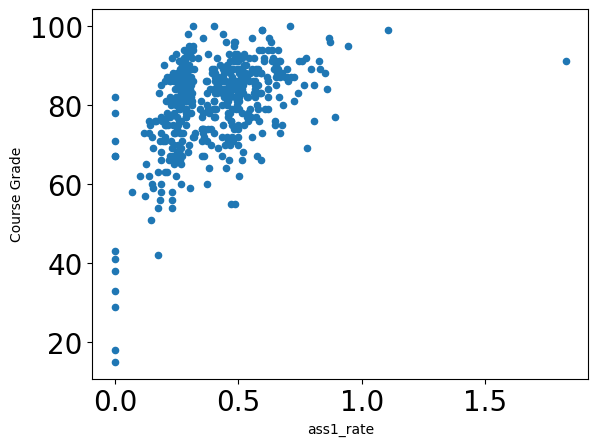

In [101]:
merge_pd.plot('ass1_rate', 'Course Grade', kind='scatter')

In [102]:
import seaborn as sns

<Axes: xlabel='ass1_rate', ylabel='Course Grade'>

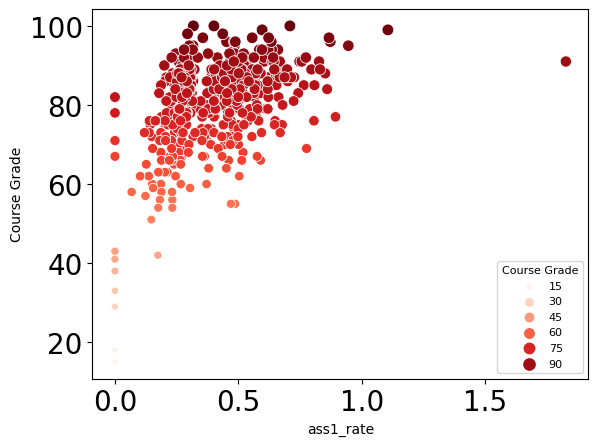

In [103]:
sns.scatterplot(data=merge_pd, x='ass1_rate', y='Course Grade', hue='Course Grade', size='Course Grade', palette="Reds")

<Axes: xlabel='ass1_rate', ylabel='Course Grade'>

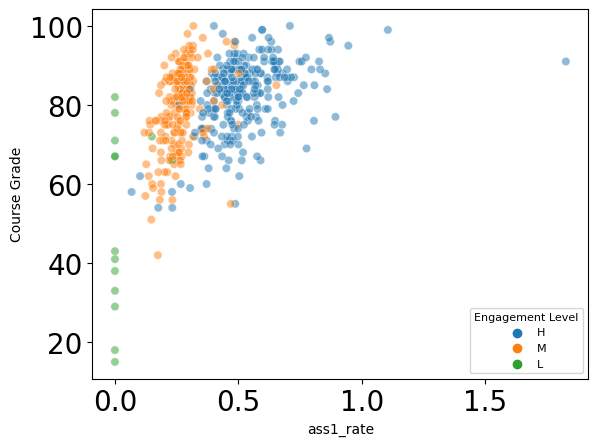

In [104]:
sns.scatterplot(data=merge_pd, x='ass1_rate', y='Course Grade', hue='Engagement Level',alpha=0.5)

<Axes: xlabel='ass1_rate', ylabel='Assignment01 [8]'>

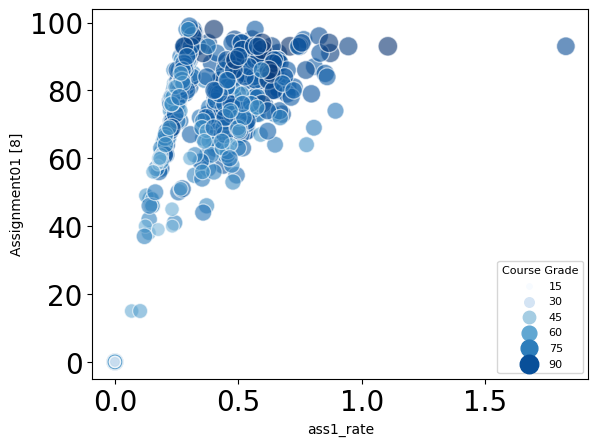

In [105]:
sns.scatterplot(data=merge_pd, x='ass1_rate', y='Assignment01 [8]', hue='Course Grade', size='Course Grade', sizes=(15, 200), palette="Blues",alpha=0.6)

<Axes: xlabel='ass1_rate_minmax_norm', ylabel='Course Grade'>

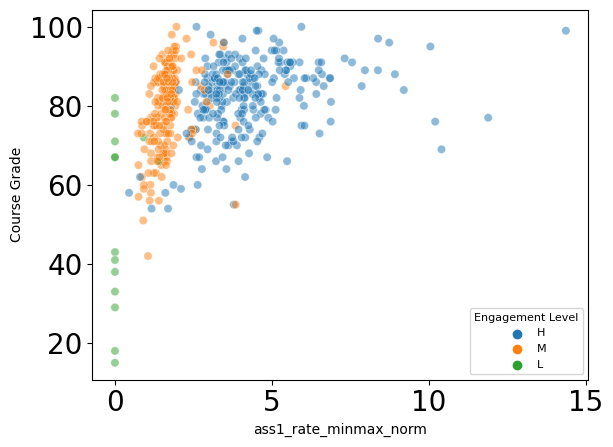

In [106]:
sns.scatterplot(data=merge_pd, x='ass1_rate_minmax_norm', y='Course Grade', hue='Engagement Level',alpha=0.5)

<Axes: xlabel='ass1_rate_minmax_norm', ylabel='Final Exam [35]'>

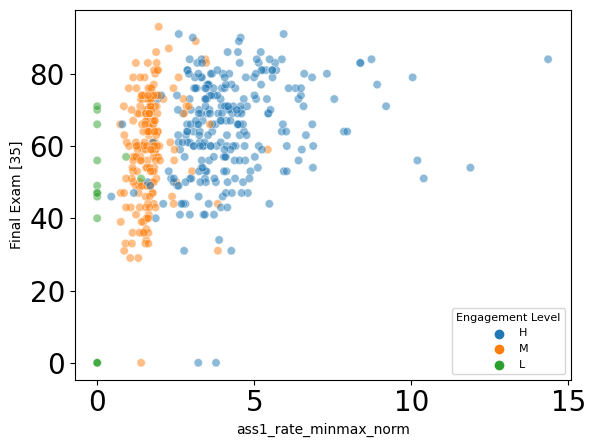

In [107]:
sns.scatterplot(data=merge_pd, x='ass1_rate_minmax_norm', y='Final Exam [35]', hue='Engagement Level',alpha=0.5)

<Axes: xlabel='ass1_rate_minmax_norm', ylabel='Assignment01 [8]'>

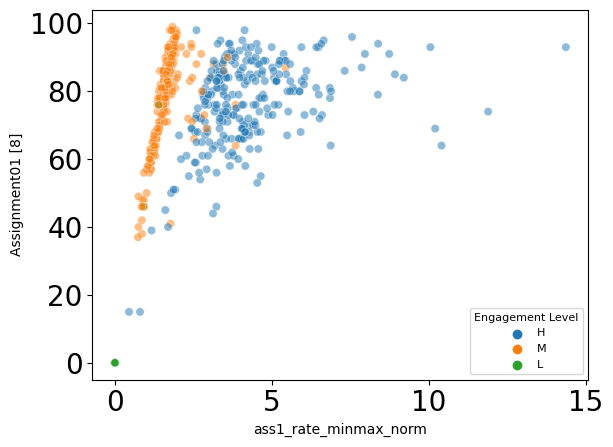

In [108]:
sns.scatterplot(data=merge_pd, x='ass1_rate_minmax_norm', y='Assignment01 [8]', hue='Engagement Level',alpha=0.5)

<Axes: xlabel='ass1_rate_minmax_norm', ylabel='ass1_score_minmax_norm'>

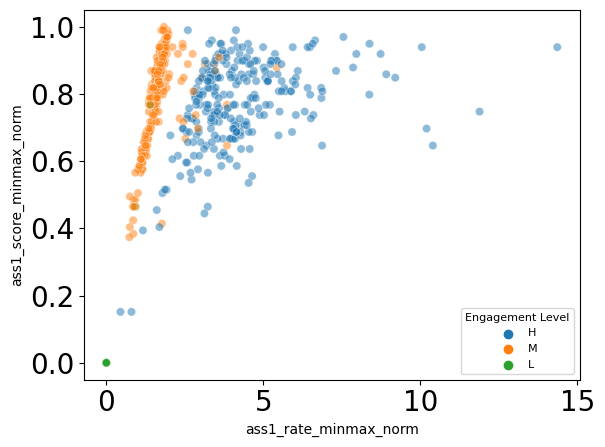

In [109]:
sns.scatterplot(data=merge_pd, x='ass1_rate_minmax_norm', y='ass1_score_minmax_norm', hue='Engagement Level',alpha=0.5)

<Axes: xlabel='ass1_rate_minmax_norm', ylabel='ass1_time_minmax_norm'>

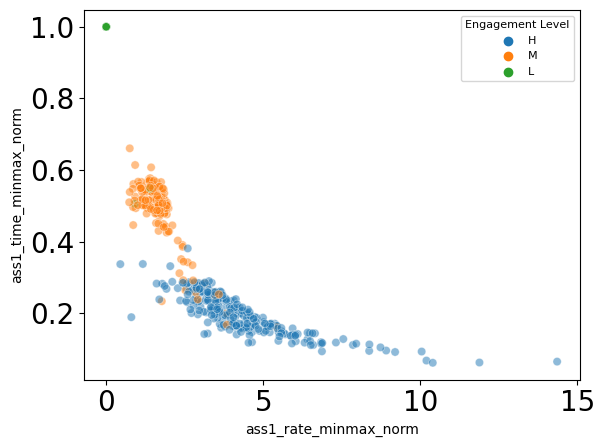

In [110]:
sns.scatterplot(data=merge_pd, x='ass1_rate_minmax_norm', y='ass1_time_minmax_norm', hue='Engagement Level',alpha=0.5)

<Axes: xlabel='ass1_rate_minmax_norm', ylabel='ass1_score_minmax_norm'>

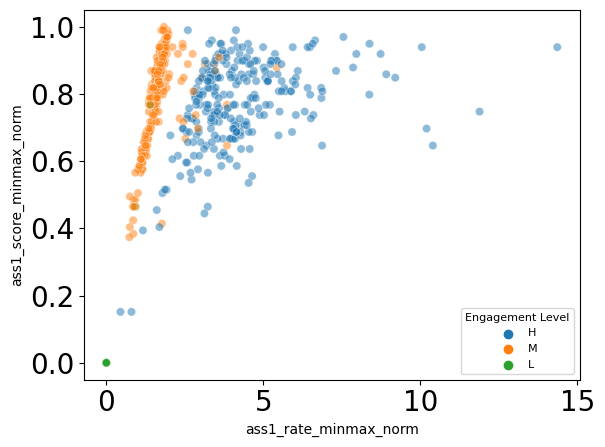

In [111]:
sns.scatterplot(data=merge_pd, x='ass1_rate_minmax_norm', y='ass1_score_minmax_norm', hue='Engagement Level',alpha=0.5)

In [112]:
ass1_h = merge_pd[merge_pd['Engagement Level']=='H']

In [113]:
ass1_h

,Student ID,# Logins,# Content Reads,# Forum Reads,# Forum Posts,# Quiz Reviews before submission,Assignment 1 lateness indicator,Assignment 2 lateness indicator,Assignment 3 lateness indicator,Assignment 1 duration to submit (in hours),...,ass3_rate,ass1_rate_log,ass2_rate_log,ass3_rate_log,ass1_time_minmax_norm,ass1_score_minmax_norm,ass1_rate_minmax_norm,below 60,below 70,below 80
0,student000000,143,344,58,0,3,0,0,0,178.166667,...,0.723099,17.558350,19.869531,17.665519,0.250994,0.919192,3.662204,0,0,0
2,student000251,67,264,0,0,1,0,0,0,135.916667,...,1.065764,17.100831,20.917469,19.234625,0.167680,0.848485,5.060143,0,0,0
3,student000239,67,259,1,1,0,0,0,0,170.950000,...,1.008807,13.420545,20.094408,18.995722,0.236763,0.696970,2.943739,0,0,0
4,student000125,76,340,0,0,4,0,0,0,187.400000,...,0.694789,12.993849,19.478528,17.518381,0.269202,0.686869,2.551502,0,0,1
5,student000155,55,282,0,0,0,0,0,0,173.700000,...,0.731389,16.287499,19.651217,17.707969,0.242186,0.848485,3.503440,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
475,student000149,60,216,0,0,8,0,0,0,130.150000,...,0.614292,15.404562,18.390601,11.189499,0.156309,0.757576,4.846669,0,1,1
476,student000407,55,136,0,0,1,0,0,0,197.050000,...,0.367235,11.356200,12.730423,9.686927,0.288231,0.606061,2.102692,1,1,1
478,student000410,62,301,0,0,0,0,0,0,222.250000,...,0.484561,7.217140,12.865182,13.753988,0.337924,0.393939,1.165765,1,1,1
484,student000428,121,442,0,0,1,0,0,0,146.966667,...,0.674012,3.005888,4.497562,11.965709,0.189470,0.151515,0.799679,0,1,1


In [114]:
ass1_m = merge_pd[merge_pd['Engagement Level']=='M']

In [115]:
ass1_m

,Student ID,# Logins,# Content Reads,# Forum Reads,# Forum Posts,# Quiz Reviews before submission,Assignment 1 lateness indicator,Assignment 2 lateness indicator,Assignment 3 lateness indicator,Assignment 1 duration to submit (in hours),...,ass3_rate,ass1_rate_log,ass2_rate_log,ass3_rate_log,ass1_time_minmax_norm,ass1_score_minmax_norm,ass1_rate_minmax_norm,below 60,below 70,below 80
1,student000004,116,379,0,0,1,0,0,0,325.500000,...,0.322168,15.729352,14.638525,15.098414,0.541526,0.919192,1.697412,0,0,0
7,student000325,60,161,1,1,2,0,0,0,301.150000,...,0.395635,16.994859,14.935588,15.677261,0.493509,0.979798,1.985370,0,0,0
9,student000237,76,189,23,0,12,0,0,0,342.083333,...,0.307561,13.196107,16.494319,14.973531,0.574227,0.777778,1.354478,0,0,0
16,student000199,109,368,0,0,2,0,0,0,329.133333,...,0.327976,15.009153,13.532266,15.147053,0.548690,0.878788,1.601610,0,0,1
17,student000047,76,375,0,0,2,0,0,0,325.250000,...,0.311073,13.311219,13.247677,15.003897,0.541033,0.777778,1.437580,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
468,student000026,45,255,1,0,1,0,0,0,318.666667,...,0.216948,14.746331,13.279752,9.935995,0.528051,0.858586,1.625953,0,1,1
471,student000279,74,311,0,0,1,0,0,0,297.950000,...,0.259353,13.691595,12.848451,10.720872,0.487199,0.787879,1.617161,0,0,1
472,student000418,33,159,0,0,0,0,0,0,362.350000,...,0.181458,9.503428,12.499530,10.056918,0.614191,0.565657,0.920978,1,1,1
473,student000234,71,358,0,0,1,0,0,0,305.466667,...,0.271345,8.738447,14.223173,10.811200,0.502021,0.505051,1.006034,0,0,1


In [116]:
cg_f6 = merge_pd[merge_pd['Course Grade']<=50]

In [117]:
cg_f7 = merge_pd[(merge_pd['Course Grade']<=70) & (merge_pd['Course Grade']>50)]

In [118]:
cg_f8 = merge_pd[(merge_pd['Course Grade']<=80) & (merge_pd['Course Grade']>70)]

In [119]:
cg_f8

,Student ID,# Logins,# Content Reads,# Forum Reads,# Forum Posts,# Quiz Reviews before submission,Assignment 1 lateness indicator,Assignment 2 lateness indicator,Assignment 3 lateness indicator,Assignment 1 duration to submit (in hours),...,ass3_rate,ass1_rate_log,ass2_rate_log,ass3_rate_log,ass1_time_minmax_norm,ass1_score_minmax_norm,ass1_rate_minmax_norm,below 60,below 70,below 80
4,student000125,76,340,0,0,4,0,0,0,187.400000,...,0.694789,12.993849,19.478528,17.518381,0.269202,0.686869,2.551502,0,0,1
11,student000463,85,82,0,0,0,0,0,0,194.916667,...,0.657363,14.983200,17.708000,17.318387,0.284024,0.797980,2.809550,0,0,1
14,student000083,62,232,0,0,1,0,0,0,169.900000,...,0.810941,15.578720,17.605399,18.101980,0.234693,0.808081,3.443142,0,0,1
15,student000317,47,162,0,0,1,0,0,0,123.833333,...,1.564731,9.545675,17.131277,21.089088,0.143852,0.464646,3.230020,0,0,1
16,student000199,109,368,0,0,2,0,0,0,329.133333,...,0.327976,15.009153,13.532266,15.147053,0.548690,0.878788,1.601610,0,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
466,student000187,131,322,0,0,2,0,0,0,107.500000,...,0.629619,15.392868,14.193275,15.025435,0.111644,0.727273,6.514197,0,0,1
467,student000202,63,351,0,0,2,0,0,0,309.583333,...,0.324720,6.451357,10.031952,13.178722,0.510139,0.373737,0.732619,0,0,1
471,student000279,74,311,0,0,1,0,0,0,297.950000,...,0.259353,13.691595,12.848451,10.720872,0.487199,0.787879,1.617161,0,0,1
473,student000234,71,358,0,0,1,0,0,0,305.466667,...,0.271345,8.738447,14.223173,10.811200,0.502021,0.505051,1.006034,0,0,1


<Axes: xlabel='ass1_rate', ylabel='Course Grade'>

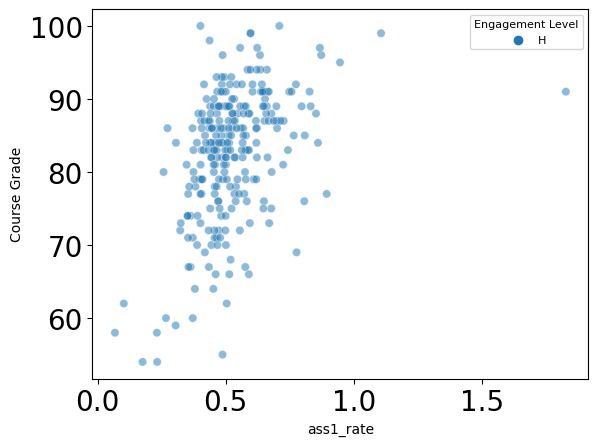

In [120]:
sns.scatterplot(data=ass1_h, x='ass1_rate', y='Course Grade', hue='Engagement Level',alpha=0.5)

<Axes: xlabel='ass1_rate', ylabel='ass1_score_minmax_norm'>

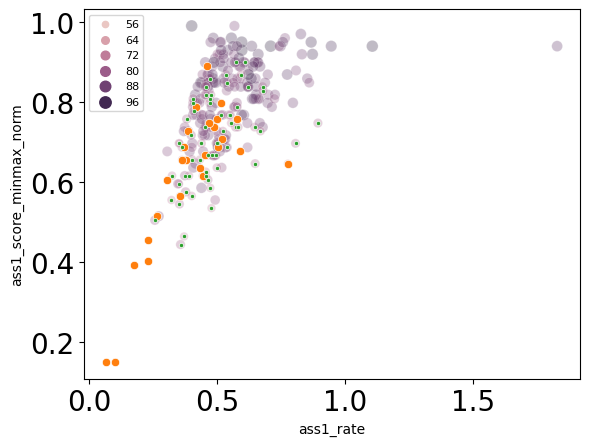

In [121]:
sns.scatterplot(data=ass1_h, x='ass1_rate', y='ass1_score_minmax_norm', hue='Course Grade', size = 'Course Grade',alpha=0.3)
sns.scatterplot(data=cg_f6[cg_f6['Engagement Level']=='H'], x='ass1_rate', y='ass1_score_minmax_norm', marker = 'x', sizes = 60)
sns.scatterplot(data=cg_f7[cg_f7['Engagement Level']=='H'], x='ass1_rate', y='ass1_score_minmax_norm', marker = 'o', sizes = 40)
sns.scatterplot(data=cg_f8[cg_f8['Engagement Level']=='H'], x='ass1_rate', y='ass1_score_minmax_norm', marker = '.', sizes = 40)


<Axes: xlabel='ass1_score_minmax_norm', ylabel='Course Grade'>

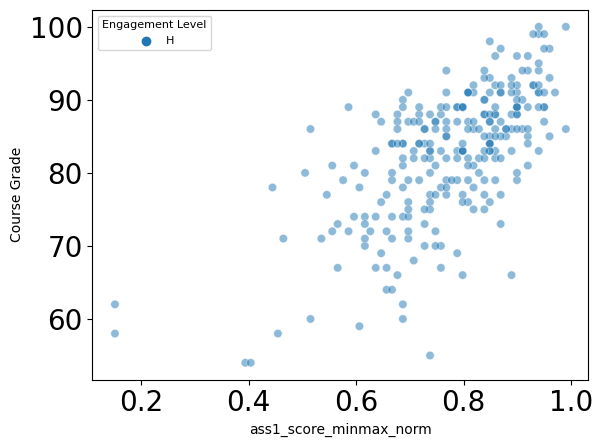

In [125]:
sns.scatterplot(data=ass1_h, x='ass1_score_minmax_norm', y='Course Grade', hue='Engagement Level',alpha=0.5)

<Axes: xlabel='ass1_time_minmax_norm', ylabel='Course Grade'>

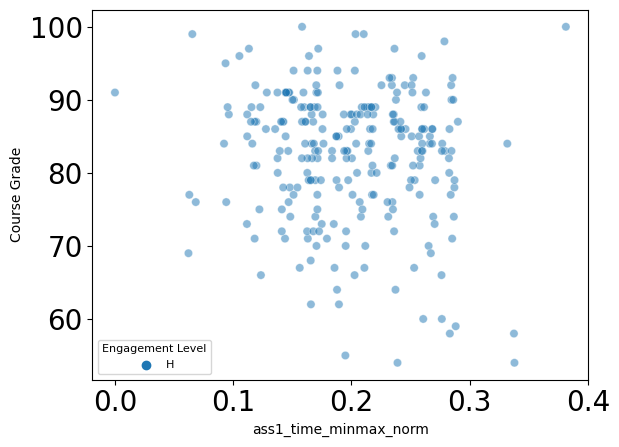

In [123]:
sns.scatterplot(data=ass1_h, x='ass1_time_minmax_norm', y='Course Grade', hue='Engagement Level',alpha=0.5)

<Axes: xlabel='ass1_rate', ylabel='Course Grade'>

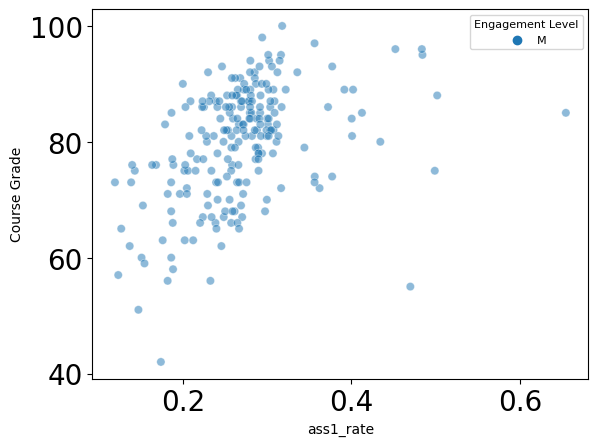

In [126]:
sns.scatterplot(data=ass1_m, x='ass1_rate', y='Course Grade', hue='Engagement Level',alpha=0.5)

<Axes: xlabel='ass1_rate_minmax_norm', ylabel='ass1_score_minmax_norm'>

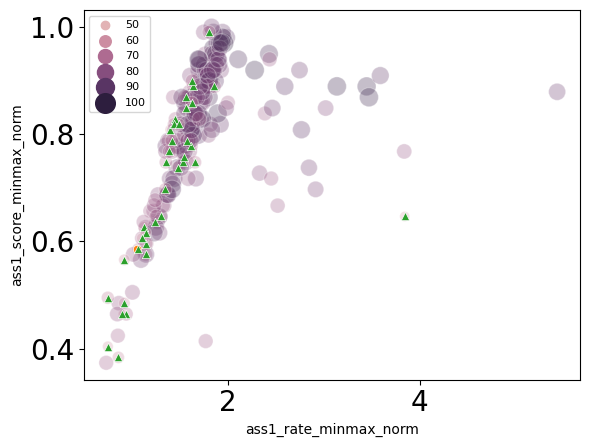

In [ ]:
sns.scatterplot(data=ass1_m, x='ass1_rate_minmax_norm', y='ass1_score_minmax_norm', hue='Course Grade', size = 'Course Grade', sizes=(10, 200),alpha=0.3)
sns.scatterplot(data=cg_f6[cg_f6['Engagement Level']=='M'], x='ass1_rate_minmax_norm', y='ass1_score_minmax_norm', marker = 'o', sizes = 50)
sns.scatterplot(data=cg_f7[cg_f7['Engagement Level']=='M'], x='ass1_rate_minmax_norm', y='ass1_score_minmax_norm', marker = '^', sizes = 50)


<Axes: xlabel='ass1_score_minmax_norm', ylabel='Course Grade'>

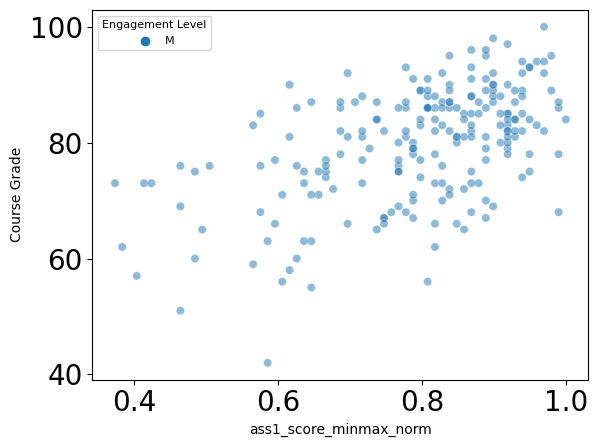

In [ ]:
sns.scatterplot(data=ass1_m, x='ass1_score_minmax_norm', y='Course Grade', hue='Engagement Level',alpha=0.5)

<Axes: xlabel='ass1_time_minmax_norm', ylabel='Course Grade'>

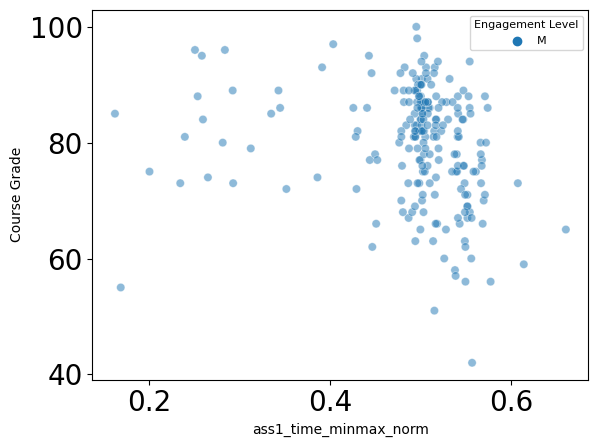

In [ ]:
sns.scatterplot(data=ass1_m, x='ass1_time_minmax_norm', y='Course Grade', hue='Engagement Level',alpha=0.5)

In [ ]:
merge_pd

,Student ID,# Logins,# Content Reads,# Forum Reads,# Forum Posts,# Quiz Reviews before submission,Assignment 1 lateness indicator,Assignment 2 lateness indicator,Assignment 3 lateness indicator,Assignment 1 duration to submit (in hours),...,ass3_rate,ass1_rate_log,ass2_rate_log,ass3_rate_log,ass1_time_minmax_norm,ass1_score_minmax_norm,ass1_rate_minmax_norm,below 60,below 70,below 80
0,student000000,143,344,58,0,3,0,0,0,178.166667,...,0.723099,17.558350,19.869531,17.665519,0.250994,0.919192,3.662204,0,0,0
1,student000004,116,379,0,0,1,0,0,0,325.500000,...,0.322168,15.729352,14.638525,15.098414,0.541526,0.919192,1.697412,0,0,0
2,student000251,67,264,0,0,1,0,0,0,135.916667,...,1.065764,17.100831,20.917469,19.234625,0.167680,0.848485,5.060143,0,0,0
3,student000239,67,259,1,1,0,0,0,0,170.950000,...,1.008807,13.420545,20.094408,18.995722,0.236763,0.696970,2.943739,0,0,0
4,student000125,76,340,0,0,4,0,0,0,187.400000,...,0.694789,12.993849,19.478528,17.518381,0.269202,0.686869,2.551502,0,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
481,student000113,21,80,0,0,2,1,1,1,558.000000,...,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,1,1,1
482,student000223,31,159,0,0,2,1,1,1,558.000000,...,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,1,1,1
483,student000150,18,140,0,0,2,1,0,1,558.000000,...,0.000000,0.000000,3.793277,0.000000,1.000000,0.000000,0.000000,1,1,1
484,student000428,121,442,0,0,1,0,0,0,146.966667,...,0.674012,3.005888,4.497562,11.965709,0.189470,0.151515,0.799679,0,1,1


In [ ]:
merge_pd['Assignment01 [8]'].mean()

75.47942386831275

In [ ]:
merge_pd['Assignment01 [8]'].std()

17.733496421673053

In [ ]:
merge_pd['Assignment02 [12]'].mean()

77.13374485596708

In [ ]:
merge_pd['Assignment02 [12]'].std()

15.179632758713451

In [ ]:
merge_pd['Assignment03 [25]'].mean()

80.87037037037037

In [ ]:
merge_pd['Assignment03 [25]'].std()

12.986498407710632

In [ ]:
merge_pd['Course Grade'].mean()

80.38271604938272

In [ ]:
merge_pd['Course Grade'].std()

11.267031992829931

In [ ]:
ass1_h['Assignment01 [8]'].mean()

76.52713178294573

In [ ]:
ass1_h['Assignment01 [8]'].std()

12.817532690440208

In [ ]:
ass1_m['Assignment01 [8]'].mean()

78.58411214953271

In [ ]:
ass1_m['Assignment01 [8]'].std()

13.482380430468147

In [ ]:
ass1_h['Course Grade'].mean()

82.47674418604652

In [ ]:
ass1_h['Course Grade'].std()

8.99726730348796

In [ ]:
ass1_m['Course Grade'].mean()

79.75233644859813

In [ ]:
ass1_m['Course Grade'].std()

9.93402504880617

In [ ]:
ass1_h['Assignment02 [12]'].mean()

78.95348837209302

In [ ]:
ass1_h['Assignment02 [12]'].std()

10.752149700988694

In [ ]:
ass1_m['Assignment02 [12]'].mean()

77.56542056074767

In [ ]:
ass1_m['Assignment02 [12]'].std()

14.52932668294911

In [ ]:
ass1_h['Assignment03 [25]'].mean()

81.61627906976744

In [ ]:
ass1_h['Assignment03 [25]'].std()

9.751586048370902

In [ ]:
ass1_m['Assignment03 [25]'].mean()

82.1588785046729

In [ ]:
ass1_m['Assignment03 [25]'].std()

10.297590340048522

<Axes: xlabel='ass2_rate', ylabel='Course Grade'>

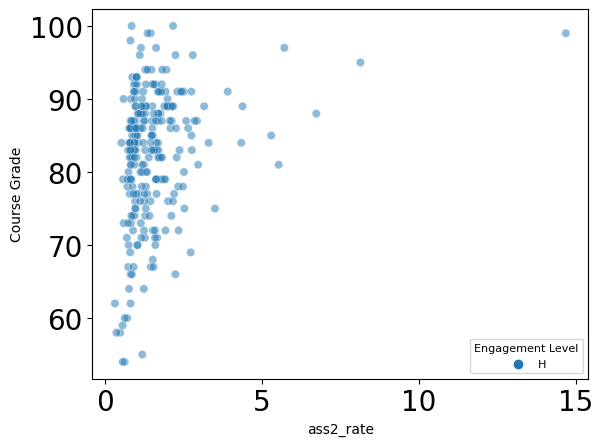

In [ ]:
sns.scatterplot(data=ass1_h, x='ass2_rate', y='Course Grade', hue='Engagement Level',alpha=0.5)

<Axes: xlabel='Assignment02 [12]', ylabel='Course Grade'>

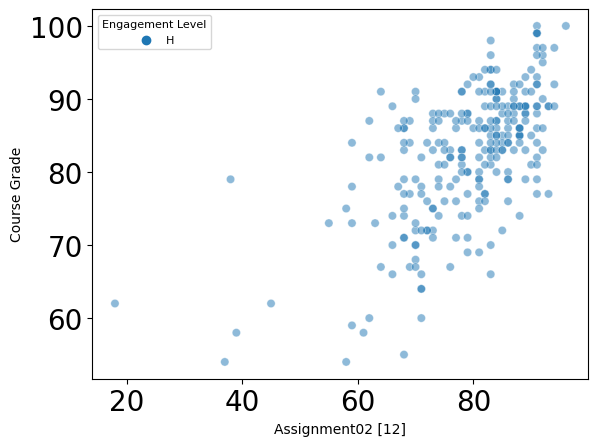

In [ ]:
sns.scatterplot(data=ass1_h, x='Assignment02 [12]', y='Course Grade', hue='Engagement Level',alpha=0.5)

<Axes: xlabel='ass2_rate', ylabel='Course Grade'>

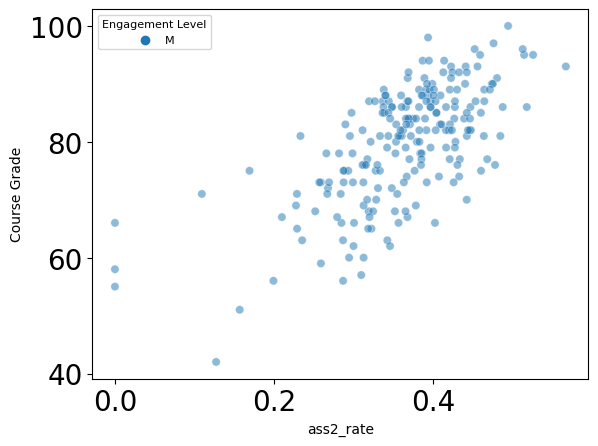

In [ ]:
sns.scatterplot(data=ass1_m, x='ass2_rate', y='Course Grade', hue='Engagement Level',alpha=0.5)

<Axes: xlabel='Assignment02 [12]', ylabel='Course Grade'>

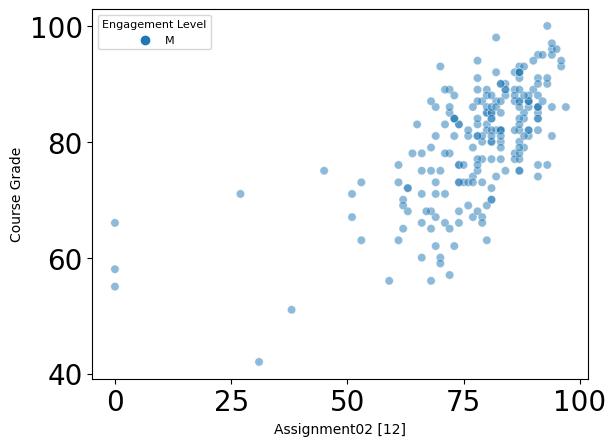

In [ ]:
sns.scatterplot(data=ass1_m, x='Assignment02 [12]', y='Course Grade', hue='Engagement Level',alpha=0.5)

<Axes: xlabel='ass3_rate', ylabel='Course Grade'>

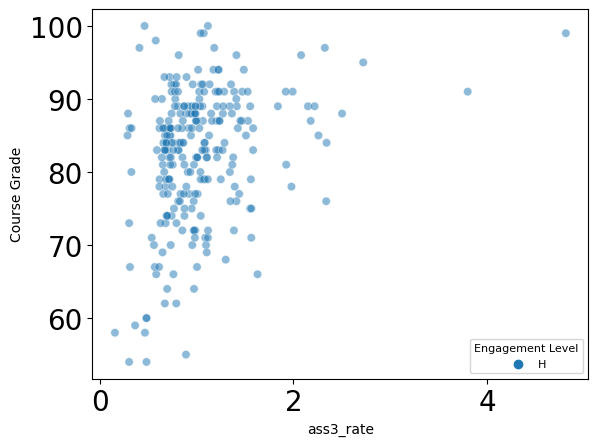

In [ ]:
sns.scatterplot(data=ass1_h, x='ass3_rate', y='Course Grade', hue='Engagement Level',alpha=0.5)

<Axes: xlabel='ass3_rate', ylabel='Course Grade'>

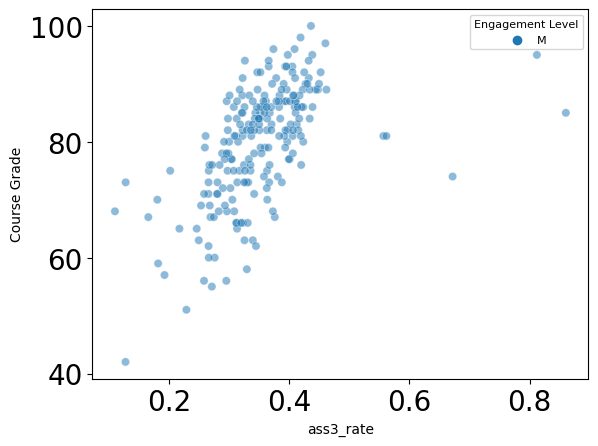

In [ ]:
sns.scatterplot(data=ass1_m, x='ass3_rate', y='Course Grade', hue='Engagement Level',alpha=0.5)

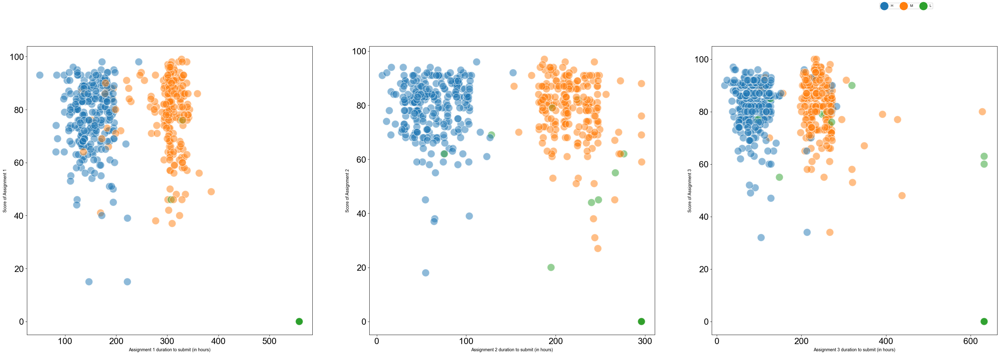

In [ ]:

#plt.figure(figsize=(30,10))
fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(40, 12))

sns.scatterplot(data=merge_pd, x='Assignment 1 duration to submit (in hours)', y='Assignment01 [8]', hue='Engagement Level', s =300, alpha=0.5, ax=ax1)
sns.scatterplot(data=merge_pd, x='Assignment 2 duration to submit (in hours)', y='Assignment02 [12]', hue='Engagement Level', s =300, alpha=0.5, ax=ax2)
sns.scatterplot(data=merge_pd, x='Assignment 3 duration to submit (in hours)', y='Assignment03 [25]', hue='Engagement Level', s =300, alpha=0.5, ax=ax3)
ax1.set_ylabel("Score of Assignment 1")
ax2.set_ylabel("Score of Assignment 2")
ax3.set_ylabel("Score of Assignment 3")
handles, labels = ax1.get_legend_handles_labels()
fig.legend(handles, labels, loc='upper right', ncol=3, bbox_to_anchor=(.85, 1), markerscale=3)
ax1.get_legend().remove()
ax2.get_legend().remove()
ax3.get_legend().remove()
sns.set(font_scale = 3)
#sns.title("Correlation between score ")
fig.savefig("time-score-cor.png")

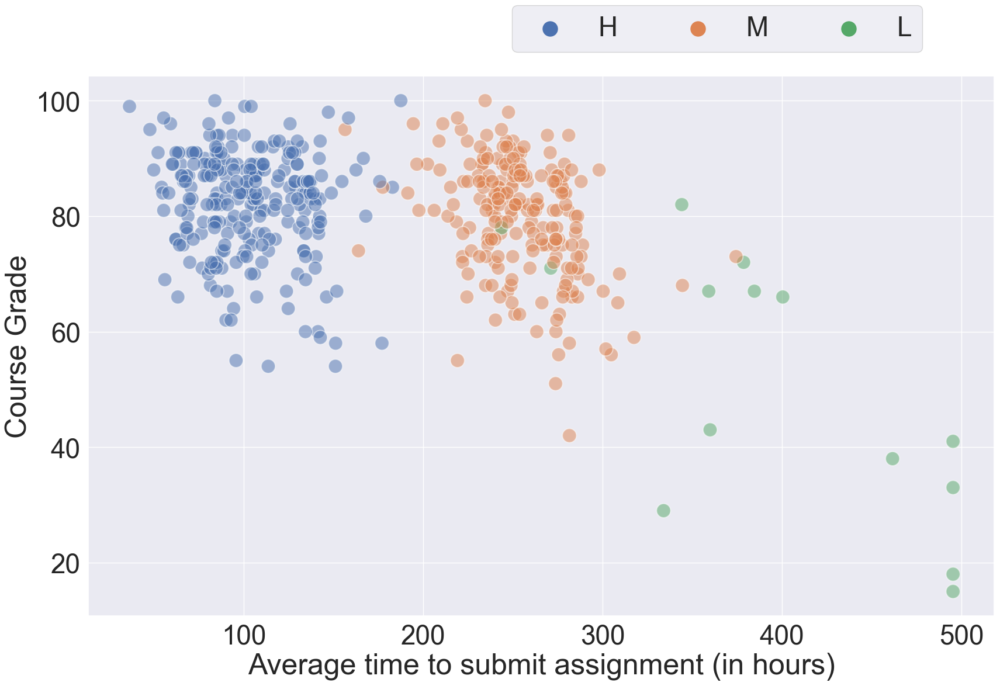

In [ ]:

#plt.figure(figsize=(30,10))
fig, (ax1) = plt.subplots(1, 1, figsize=(20, 12))

sns.scatterplot(data=merge_pd, x='Average time to submit assignment (in hours)', y='Course Grade', hue='Engagement Level', s =300, alpha=0.5)

handles, labels = ax1.get_legend_handles_labels()
fig.legend(handles, labels, loc='upper right', ncol=3, bbox_to_anchor=(.85, 1), markerscale=3)
ax1.get_legend().remove()

sns.set(font_scale = 3)
#sns.title("Correlation between score ")
fig.savefig("avgtime-grade-cor.png")


[<matplotlib.collections.PathCollection object at 0x000002AA69FCDF60>, <matplotlib.collections.PathCollection object at 0x000002AA69FCE3B0>, <matplotlib.collections.PathCollection object at 0x000002AA69FCE800>, <matplotlib.collections.PathCollection object at 0x000002AA69FCEC50>, <matplotlib.collections.PathCollection object at 0x000002AA69FCDE10>, <matplotlib.collections.PathCollection object at 0x000002AA69FCED40>]


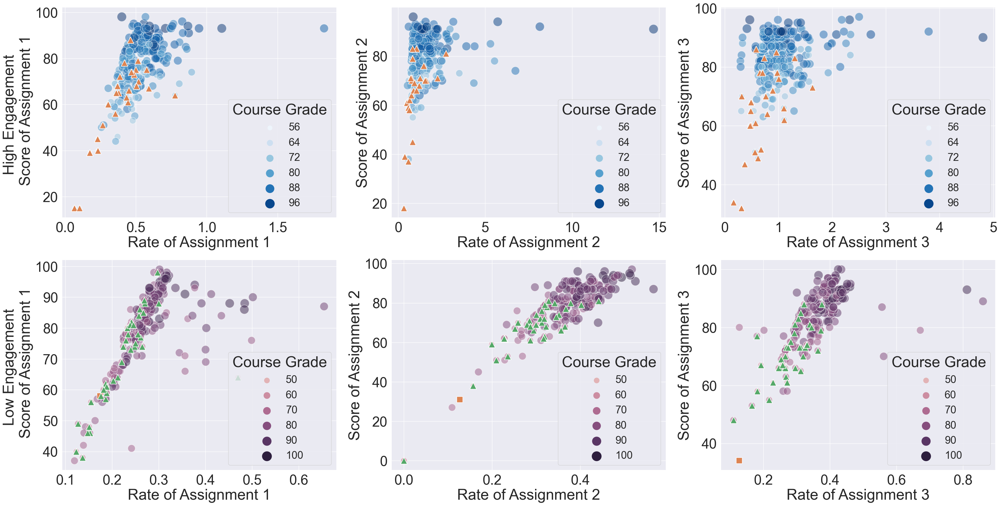

In [ ]:

#plt.figure(figsize=(30,10))
fig, axes = plt.subplots(2, 3, figsize=(40, 20))

sns.scatterplot(data=ass1_h, x='ass1_rate', y='Assignment01 [8]', hue='Course Grade', size = 'Course Grade', palette="Blues", sizes=(100, 500), alpha=0.5, ax=axes[0,0])
sns.scatterplot(data=cg_f6[cg_f6['Engagement Level']=='H'], x='ass1_rate', y='Assignment01 [8]', marker = 's', s = 220, ax=axes[0,0])
sns.scatterplot(data=cg_f7[cg_f7['Engagement Level']=='H'], x='ass1_rate', y='Assignment01 [8]', marker = '^', s = 250, ax=axes[0,0])


sns.scatterplot(data=ass1_h, x='ass2_rate', y='Assignment02 [12]', hue='Course Grade', size = 'Course Grade', palette="Blues", sizes=(100, 500), alpha=0.5, ax=axes[0,1])
sns.scatterplot(data=cg_f6[cg_f6['Engagement Level']=='H'], x='ass2_rate', y='Assignment02 [12]', marker = 's', s = 220, ax=axes[0,1])
sns.scatterplot(data=cg_f7[cg_f7['Engagement Level']=='H'], x='ass2_rate', y='Assignment02 [12]', marker = '^', s = 250, ax=axes[0,1])


sns.scatterplot(data=ass1_h, x='ass3_rate', y='Assignment03 [25]', hue='Course Grade', size = 'Course Grade', palette="Blues", sizes=(100, 500), alpha=0.5, ax=axes[0,2])
sns.scatterplot(data=cg_f6[cg_f6['Engagement Level']=='H'], x='ass3_rate', y='Assignment03 [25]', marker = 's', s = 220, ax=axes[0,2])
sns.scatterplot(data=cg_f7[cg_f7['Engagement Level']=='H'], x='ass3_rate', y='Assignment03 [25]', marker = '^', s = 250, ax=axes[0,2])

sns.scatterplot(data=ass1_m, x='ass1_rate', y='Assignment01 [8]', hue='Course Grade', size = 'Course Grade', sizes=(100, 500), alpha=0.5, ax=axes[1, 0])
sns.scatterplot(data=cg_f6[cg_f6['Engagement Level']=='M'], x='ass1_rate', y='Assignment01 [8]', marker = 's', s = 220, ax=axes[1,0])
sns.scatterplot(data=cg_f7[cg_f7['Engagement Level']=='M'], x='ass1_rate', y='Assignment01 [8]', marker = '^', s = 250, ax=axes[1,0])

sns.scatterplot(data=ass1_m, x='ass2_rate', y='Assignment02 [12]', hue='Course Grade', size = 'Course Grade', sizes=(100, 500), alpha=0.5, ax=axes[1,1])
sns.scatterplot(data=cg_f6[cg_f6['Engagement Level']=='M'], x='ass2_rate', y='Assignment02 [12]', marker = 's', s = 220, ax=axes[1,1])
sns.scatterplot(data=cg_f7[cg_f7['Engagement Level']=='M'], x='ass2_rate', y='Assignment02 [12]', marker = '^', s = 250, ax=axes[1,1])

sns.scatterplot(data=ass1_m, x='ass3_rate', y='Assignment03 [25]', hue='Course Grade', size = 'Course Grade', sizes=(100, 500), alpha=0.5, ax=axes[1,2])
sns.scatterplot(data=cg_f6[cg_f6['Engagement Level']=='M'], x='ass3_rate', y='Assignment03 [25]', marker = 's', s = 220, ax=axes[1,2])
sns.scatterplot(data=cg_f7[cg_f7['Engagement Level']=='M'], x='ass3_rate', y='Assignment03 [25]', marker = '^', s = 250, ax=axes[1,2])

#sns.legend()

for i in range(0, 2):
    for j in range(0, 3):
        axes[i,j].legend(loc='lower right', title="Course Grade", fontsize=25)
        axes[i,j].set_xlabel("Rate of Assignment "+ str(j+1))
        if (i==0) & (j == 0):
            axes[i,j].set_ylabel("High Engagement \n Score of Assignment "+ str(j+1))
        elif (i==1) & (j == 0):
            axes[i,j].set_ylabel("Low Engagement \n Score of Assignment "+ str(j+1))
        else:
            axes[i,j].set_ylabel("Score of Assignment "+ str(j+1))

handles, labels = axes[0,0].get_legend_handles_labels()
print(handles)

sns.set(font_scale = 3)
#sns.title("Correlation between score ")
fig.savefig("rate-score-grade.png")


[<matplotlib.collections.PathCollection object at 0x000002AA6A4354E0>, <matplotlib.collections.PathCollection object at 0x000002AA6A434880>, <matplotlib.collections.PathCollection object at 0x000002AA6A4364D0>, <matplotlib.collections.PathCollection object at 0x000002AA6A436950>, <matplotlib.collections.PathCollection object at 0x000002AA6A436DA0>, <matplotlib.collections.PathCollection object at 0x000002AA6A4371F0>]


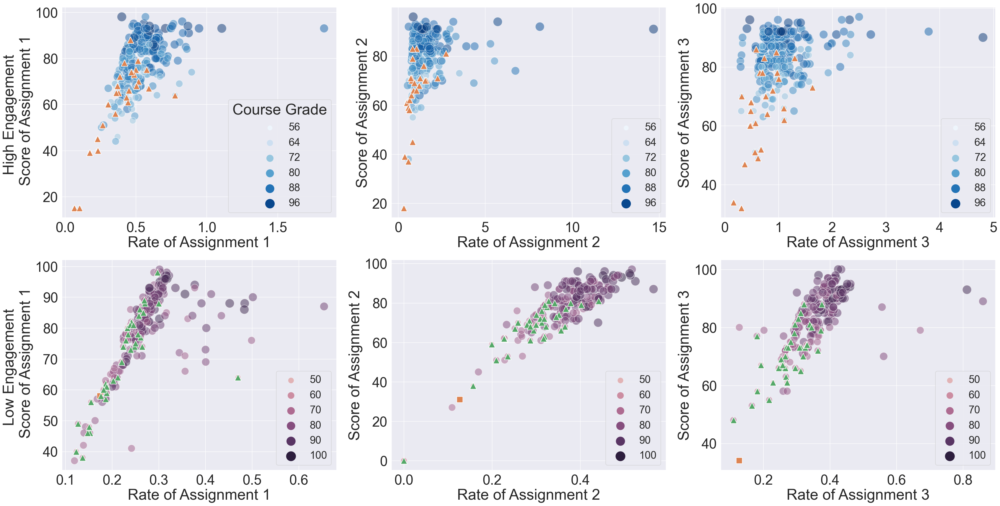

In [ ]:

#plt.figure(figsize=(30,10))
fig, axes = plt.subplots(2, 3, figsize=(40, 20))

sns.scatterplot(data=ass1_h, x='ass1_rate', y='Assignment01 [8]', hue='Course Grade', size = 'Course Grade', palette="Blues", sizes=(100, 500), alpha=0.5, ax=axes[0,0])
sns.scatterplot(data=cg_f6[cg_f6['Engagement Level']=='H'], x='ass1_rate', y='Assignment01 [8]', marker = 's', s = 220, ax=axes[0,0])
sns.scatterplot(data=cg_f7[cg_f7['Engagement Level']=='H'], x='ass1_rate', y='Assignment01 [8]', marker = '^', s = 250, ax=axes[0,0])


sns.scatterplot(data=ass1_h, x='ass2_rate', y='Assignment02 [12]', hue='Course Grade', size = 'Course Grade', palette="Blues", sizes=(100, 500), alpha=0.5, ax=axes[0,1])
sns.scatterplot(data=cg_f6[cg_f6['Engagement Level']=='H'], x='ass2_rate', y='Assignment02 [12]', marker = 's', s = 220, ax=axes[0,1])
sns.scatterplot(data=cg_f7[cg_f7['Engagement Level']=='H'], x='ass2_rate', y='Assignment02 [12]', marker = '^', s = 250, ax=axes[0,1])


sns.scatterplot(data=ass1_h, x='ass3_rate', y='Assignment03 [25]', hue='Course Grade', size = 'Course Grade', palette="Blues", sizes=(100, 500), alpha=0.5, ax=axes[0,2])
sns.scatterplot(data=cg_f6[cg_f6['Engagement Level']=='H'], x='ass3_rate', y='Assignment03 [25]', marker = 's', s = 220, ax=axes[0,2])
sns.scatterplot(data=cg_f7[cg_f7['Engagement Level']=='H'], x='ass3_rate', y='Assignment03 [25]', marker = '^', s = 250, ax=axes[0,2])

sns.scatterplot(data=ass1_m, x='ass1_rate', y='Assignment01 [8]', hue='Course Grade', size = 'Course Grade', sizes=(100, 500), alpha=0.5, ax=axes[1, 0])
sns.scatterplot(data=cg_f6[cg_f6['Engagement Level']=='M'], x='ass1_rate', y='Assignment01 [8]', marker = 's', s = 220, ax=axes[1,0])
sns.scatterplot(data=cg_f7[cg_f7['Engagement Level']=='M'], x='ass1_rate', y='Assignment01 [8]', marker = '^', s = 250, ax=axes[1,0])

sns.scatterplot(data=ass1_m, x='ass2_rate', y='Assignment02 [12]', hue='Course Grade', size = 'Course Grade', sizes=(100, 500), alpha=0.5, ax=axes[1,1])
sns.scatterplot(data=cg_f6[cg_f6['Engagement Level']=='M'], x='ass2_rate', y='Assignment02 [12]', marker = 's', s = 220, ax=axes[1,1])
sns.scatterplot(data=cg_f7[cg_f7['Engagement Level']=='M'], x='ass2_rate', y='Assignment02 [12]', marker = '^', s = 250, ax=axes[1,1])

sns.scatterplot(data=ass1_m, x='ass3_rate', y='Assignment03 [25]', hue='Course Grade', size = 'Course Grade', sizes=(100, 500), alpha=0.5, ax=axes[1,2])
sns.scatterplot(data=cg_f6[cg_f6['Engagement Level']=='M'], x='ass3_rate', y='Assignment03 [25]', marker = 's', s = 220, ax=axes[1,2])
sns.scatterplot(data=cg_f7[cg_f7['Engagement Level']=='M'], x='ass3_rate', y='Assignment03 [25]', marker = '^', s = 250, ax=axes[1,2])

#sns.legend()

for i in range(0, 2):
    for j in range(0, 3):
        axes[i,j].legend(loc='lower right', fontsize=25)
        axes[i,j].set_xlabel("Rate of Assignment "+ str(j+1))
        if (i==0) & (j == 0):
            axes[i,j].set_ylabel("High Engagement \n Score of Assignment "+ str(j+1))
        elif (i==1) & (j == 0):
            axes[i,j].set_ylabel("Low Engagement \n Score of Assignment "+ str(j+1))
        else:
            axes[i,j].set_ylabel("Score of Assignment "+ str(j+1))

handles, labels = axes[0,0].get_legend_handles_labels()
print(handles)

axes[0,0].legend(loc='lower right', title="Course Grade", fontsize=25)

sns.set(font_scale = 3)
#sns.title("Correlation between score ")
fig.savefig("rate-score-grade.png")


In [ ]:
sns.set(font_scale = 1)

<Axes: xlabel='Assignment01 [8]', ylabel='Assignment 1 duration to submit (in hours)'>

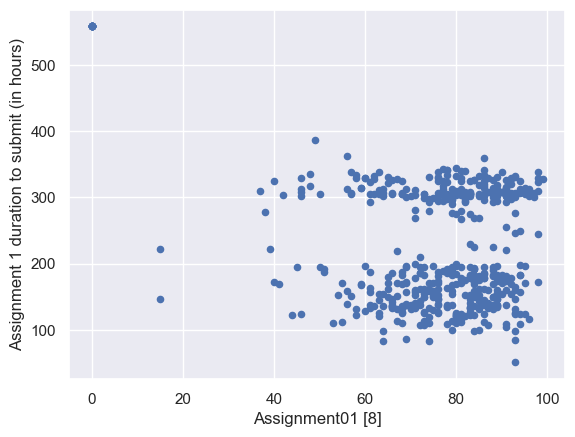

In [ ]:
merge_pd.plot('Assignment01 [8]', 'Assignment 1 duration to submit (in hours)', kind='scatter')

<Axes: xlabel='Assignment01 [8]', ylabel='Assignment 1 duration to submit (in hours)'>

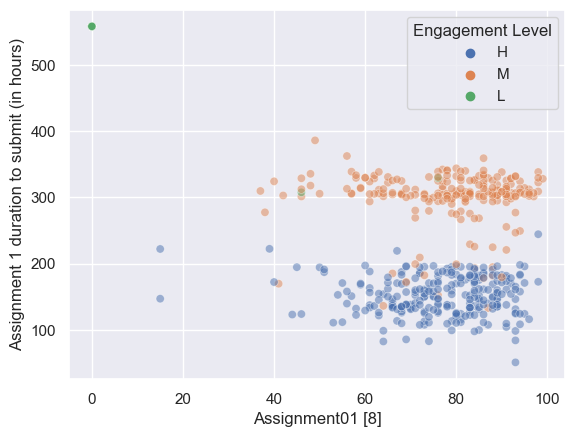

In [ ]:
sns.scatterplot(data=merge_pd, x='Assignment01 [8]', y='Assignment 1 duration to submit (in hours)', hue='Engagement Level',alpha=0.5)

<Axes: xlabel='Assignment01 [8]', ylabel='Assignment 1 duration to submit (in hours)'>

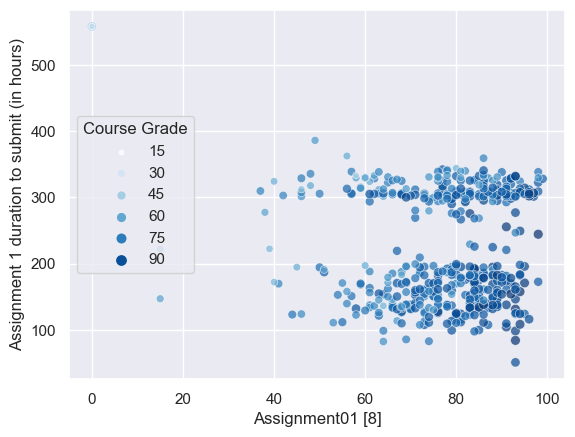

In [ ]:
sns.scatterplot(data=merge_pd, x='Assignment01 [8]', y='Assignment 1 duration to submit (in hours)', hue='Course Grade', size='Course Grade', palette="Blues", sizes=(10,50),alpha=0.7)

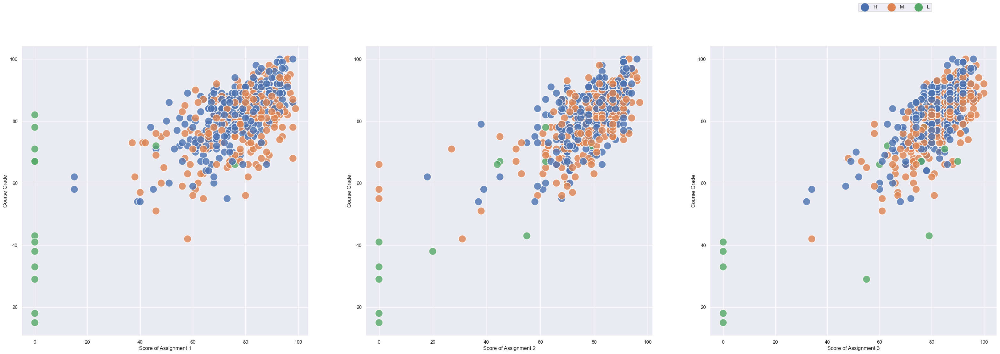

In [ ]:

#plt.figure(figsize=(30,10))
fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(40, 12))

sns.scatterplot(data=merge_pd, x='Assignment01 [8]', y='Course Grade', hue='Engagement Level', s =300, alpha=0.8, ax=ax1)
sns.scatterplot(data=merge_pd, x='Assignment02 [12]', y='Course Grade', hue='Engagement Level', s =300, alpha=0.8, ax=ax2)
sns.scatterplot(data=merge_pd, x='Assignment03 [25]', y='Course Grade', hue='Engagement Level', s =300, alpha=0.8, ax=ax3)
ax1.set_xlabel("Score of Assignment 1")
ax2.set_xlabel("Score of Assignment 2")
ax3.set_xlabel("Score of Assignment 3")

ax1.set_ylabel("Course Grade")
ax2.set_ylabel("Course Grade")
ax3.set_ylabel("Course Grade")
handles, labels = ax1.get_legend_handles_labels()
fig.legend(handles, labels, loc='upper right', ncol=3, bbox_to_anchor=(.85, 1), markerscale=3)
ax1.get_legend().remove()
ax2.get_legend().remove()
ax3.get_legend().remove()
sns.set(font_scale = 3)
#sns.title("Correlation between score ")
fig.savefig("score-assign-course.png")

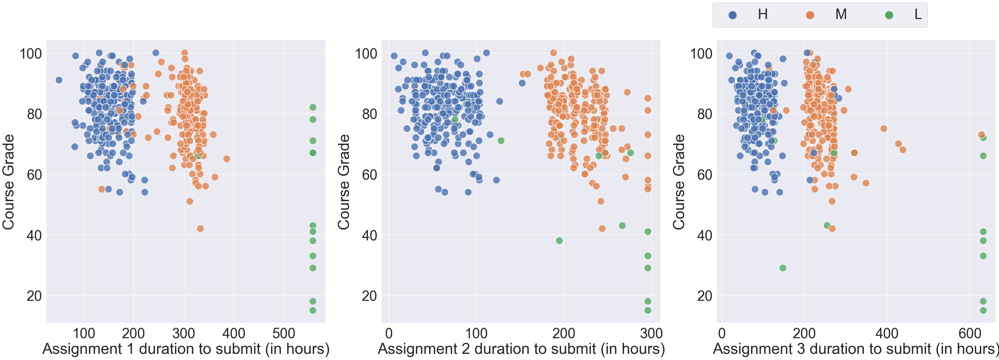

In [ ]:

#plt.figure(figsize=(30,10))
fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(40, 12))

sns.scatterplot(data=merge_pd, x='Assignment 1 duration to submit (in hours)', y='Course Grade', hue='Engagement Level', s =300, alpha=0.8, ax=ax1)
sns.scatterplot(data=merge_pd, x='Assignment 2 duration to submit (in hours)', y='Course Grade', hue='Engagement Level', s =300, alpha=0.8, ax=ax2)
sns.scatterplot(data=merge_pd, x='Assignment 3 duration to submit (in hours)', y='Course Grade', hue='Engagement Level', s =300, alpha=0.8, ax=ax3)

ax1.set_ylabel("Course Grade")
ax2.set_ylabel("Course Grade")
ax3.set_ylabel("Course Grade")
handles, labels = ax1.get_legend_handles_labels()
fig.legend(handles, labels, loc='upper right', ncol=3, bbox_to_anchor=(.85, 1), markerscale=3)
ax1.get_legend().remove()
ax2.get_legend().remove()
ax3.get_legend().remove()
sns.set(font_scale = 3)
#sns.title("Correlation between score ")
#fig.savefig("score-assign-course.png")

<Axes: xlabel='Assignment01 [8]', ylabel='Course Grade'>

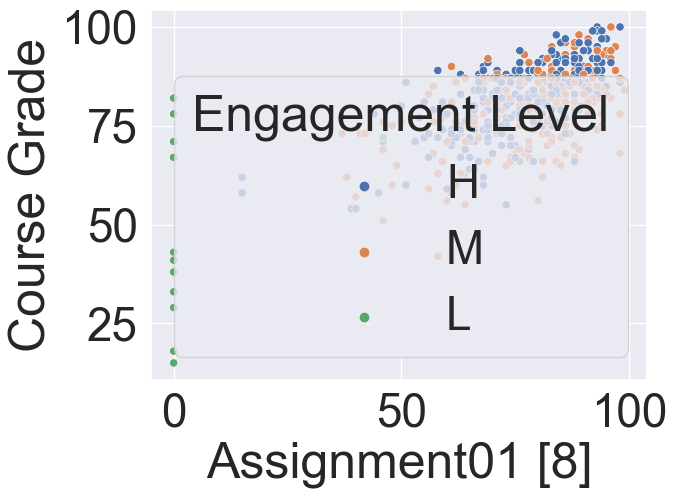

In [ ]:
sns.scatterplot(data=merge_pd, x='Assignment01 [8]', y='Course Grade', hue='Engagement Level')

<Axes: xlabel='Assignment01 [8]', ylabel='Final Exam [35]'>

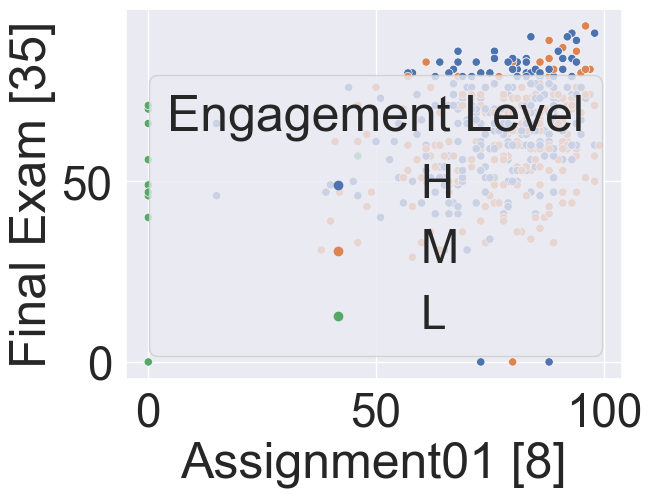

In [ ]:
sns.scatterplot(data=merge_pd, x='Assignment01 [8]', y='Final Exam [35]', hue='Engagement Level')

<Axes: xlabel='Assignment 1 duration to submit (in hours)', ylabel='Course Grade'>

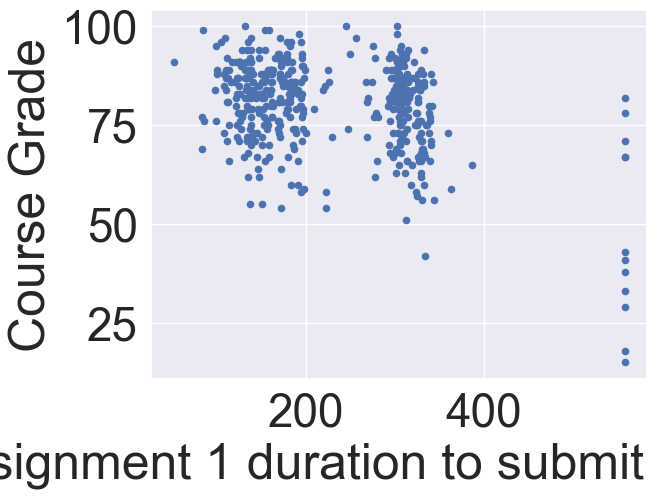

In [ ]:
merge_pd.plot('Assignment 1 duration to submit (in hours)', 'Course Grade', kind='scatter')

<Axes: xlabel='ass2_rate', ylabel='Assignment02 [12]'>

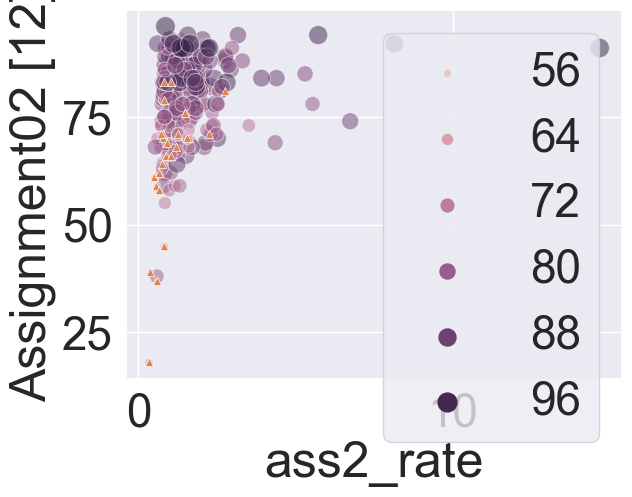

In [ ]:
sns.scatterplot(data=ass1_h, x='ass2_rate', y='Assignment02 [12]', hue='Course Grade', size = 'Course Grade', sizes=(10, 200),alpha=0.5)
sns.scatterplot(data=cg_f6[cg_f6['Engagement Level']=='H'], x='ass2_rate', y='Assignment02 [12]', marker = 'o', sizes = 120)
sns.scatterplot(data=cg_f7[cg_f7['Engagement Level']=='H'], x='ass2_rate', y='Assignment02 [12]', marker = '^', sizes = 120)


<Axes: xlabel='ass2_rate', ylabel='Assignment02 [12]'>

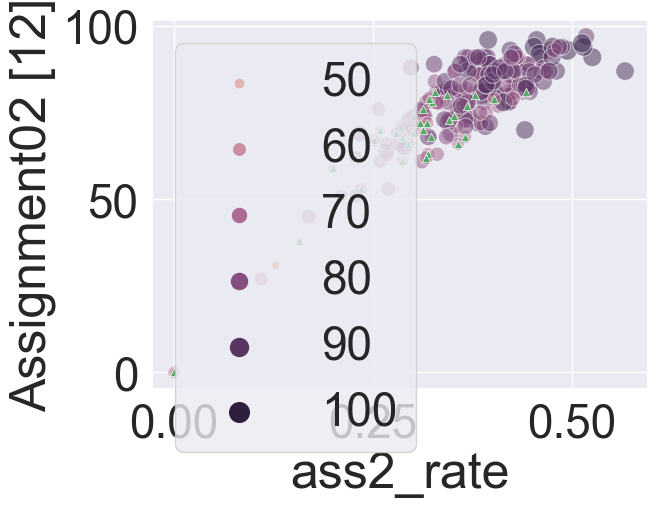

In [ ]:
sns.scatterplot(data=ass1_m, x='ass2_rate', y='Assignment02 [12]', hue='Course Grade', size = 'Course Grade', sizes=(10, 200),alpha=0.5)
sns.scatterplot(data=cg_f6[cg_f6['Engagement Level']=='M'], x='ass2_rate', y='Assignment02 [12]', marker = 'o', sizes = 90)
sns.scatterplot(data=cg_f7[cg_f7['Engagement Level']=='M'], x='ass2_rate', y='Assignment02 [12]', marker = '^', sizes = 90)

<Axes: xlabel='ass3_rate', ylabel='Assignment03 [25]'>

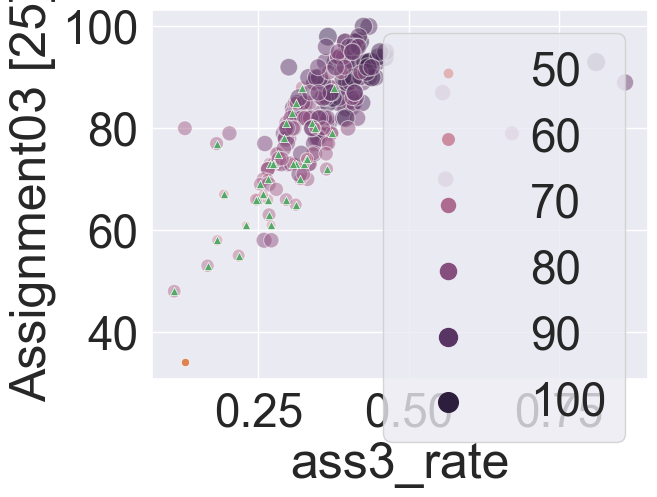

In [ ]:
sns.scatterplot(data=ass1_m, x='ass3_rate', y='Assignment03 [25]', hue='Course Grade', size = 'Course Grade', sizes=(10, 200),alpha=0.5)
sns.scatterplot(data=cg_f6[cg_f6['Engagement Level']=='M'], x='ass3_rate', y='Assignment03 [25]', marker = 'o', sizes = 90)
sns.scatterplot(data=cg_f7[cg_f7['Engagement Level']=='M'], x='ass3_rate', y='Assignment03 [25]', marker = '^', sizes = 90)

<Axes: xlabel='ass3_rate', ylabel='Assignment03 [25]'>

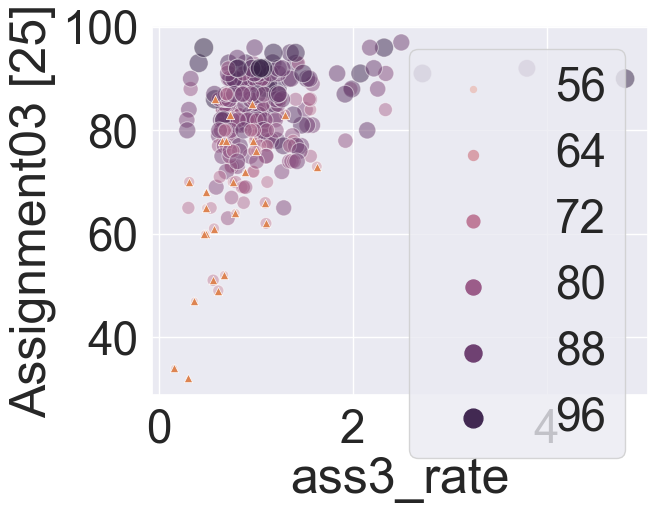

In [ ]:
sns.scatterplot(data=ass1_h, x='ass3_rate', y='Assignment03 [25]', hue='Course Grade', size = 'Course Grade', sizes=(10, 200),alpha=0.5)
sns.scatterplot(data=cg_f6[cg_f6['Engagement Level']=='H'], x='ass3_rate', y='Assignment03 [25]', marker = 'o', sizes = 120)
sns.scatterplot(data=cg_f7[cg_f7['Engagement Level']=='H'], x='ass3_rate', y='Assignment03 [25]', marker = '^', sizes = 120)

<Axes: xlabel='ass2_rate', ylabel='Assignment02 [12]'>

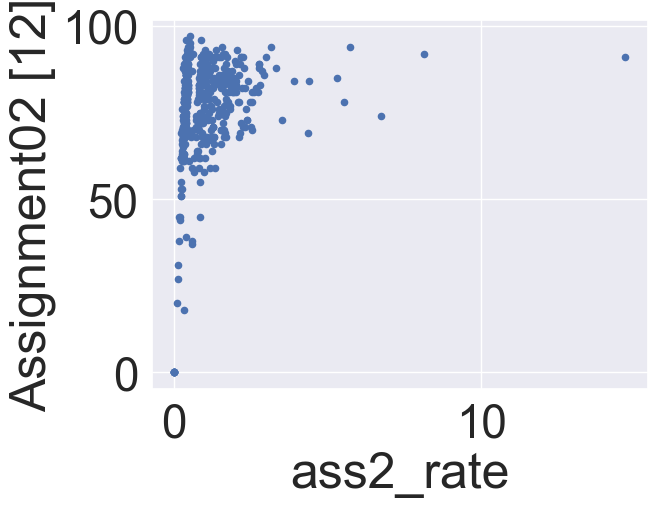

In [ ]:
merge_pd.plot('ass2_rate', 'Assignment02 [12]', kind='scatter')

<Axes: xlabel='ass2_rate', ylabel='Course Grade'>

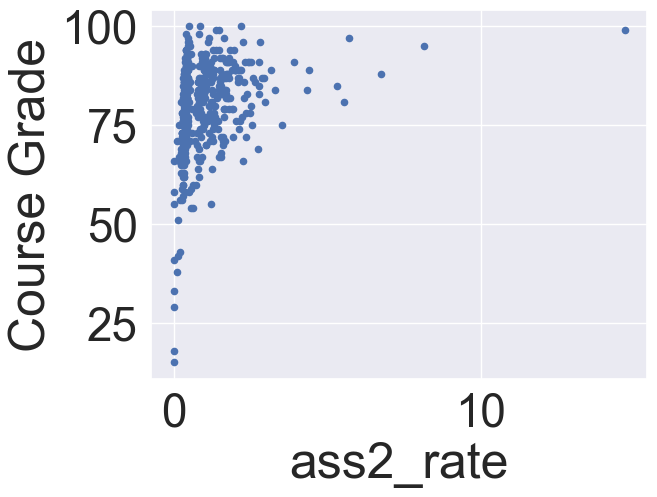

In [ ]:
merge_pd.plot('ass2_rate', 'Course Grade', kind='scatter')

<Axes: xlabel='Assignment02 [12]', ylabel='Assignment 2 duration to submit (in hours)'>

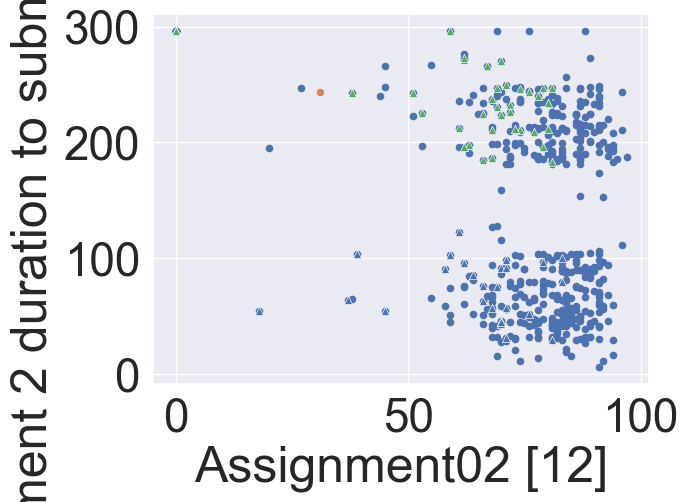

In [ ]:
merge_pd.plot('Assignment02 [12]', 'Assignment 2 duration to submit (in hours)', kind='scatter')
sns.scatterplot(data=cg_f6[cg_f6['Engagement Level']=='H'], x='Assignment02 [12]', y='Assignment 2 duration to submit (in hours)', marker = 'o', sizes = 120)
sns.scatterplot(data=cg_f7[cg_f7['Engagement Level']=='H'], x='Assignment02 [12]', y='Assignment 2 duration to submit (in hours)', marker = '^', sizes = 120)
sns.scatterplot(data=cg_f6[cg_f6['Engagement Level']=='M'], x='Assignment02 [12]', y='Assignment 2 duration to submit (in hours)', marker = 'o', sizes = 120)
sns.scatterplot(data=cg_f7[cg_f7['Engagement Level']=='M'], x='Assignment02 [12]', y='Assignment 2 duration to submit (in hours)', marker = '^', sizes = 120)

<Axes: xlabel='Assignment02 [12]', ylabel='Course Grade'>

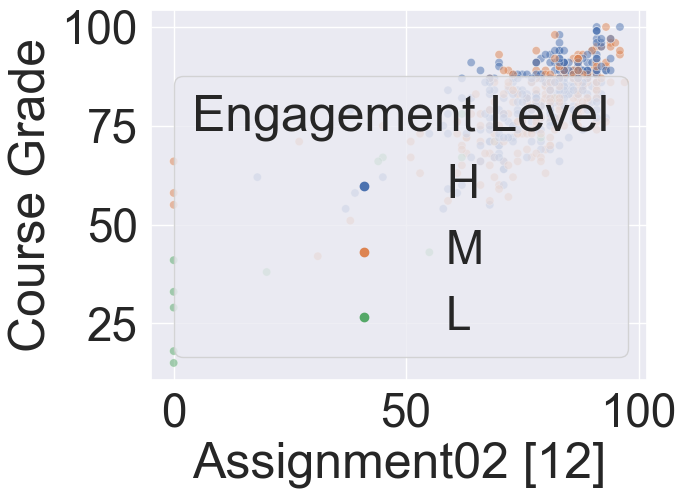

In [ ]:
sns.scatterplot(data=merge_pd, x='Assignment02 [12]', y='Course Grade', hue='Engagement Level',alpha=0.5)

<Axes: xlabel='Assignment02 [12]', ylabel='Final Exam [35]'>

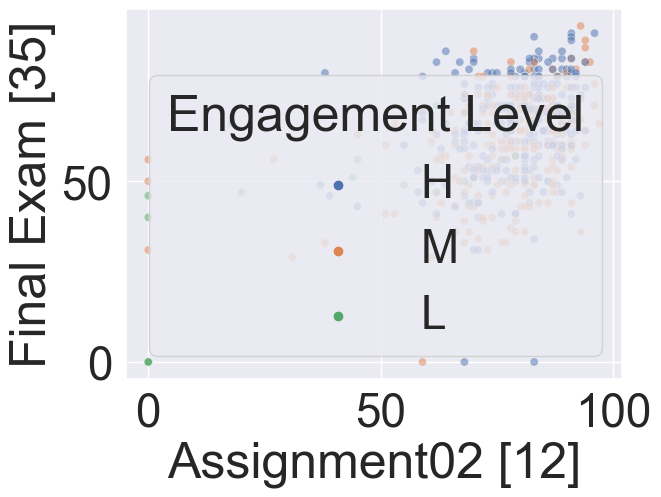

In [ ]:
sns.scatterplot(data=merge_pd, x='Assignment02 [12]', y='Final Exam [35]', hue='Engagement Level',alpha=0.5)

<Axes: xlabel='ass2_rate', ylabel='Course Grade'>

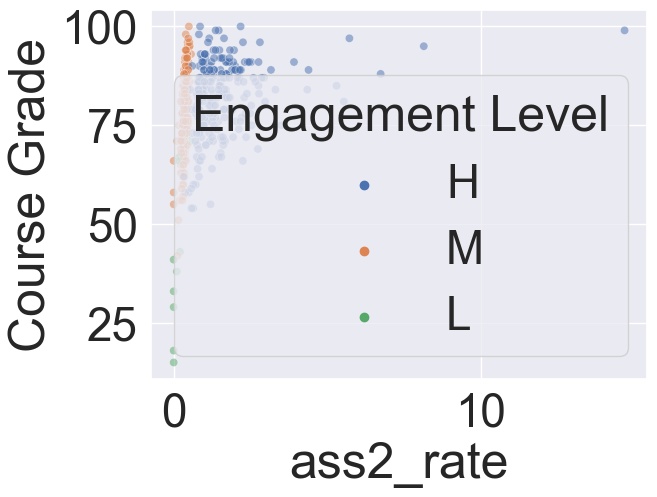

In [ ]:
sns.scatterplot(data=merge_pd, x='ass2_rate', y='Course Grade', hue='Engagement Level',alpha=0.5)

<Axes: xlabel='ass3_rate', ylabel='Course Grade'>

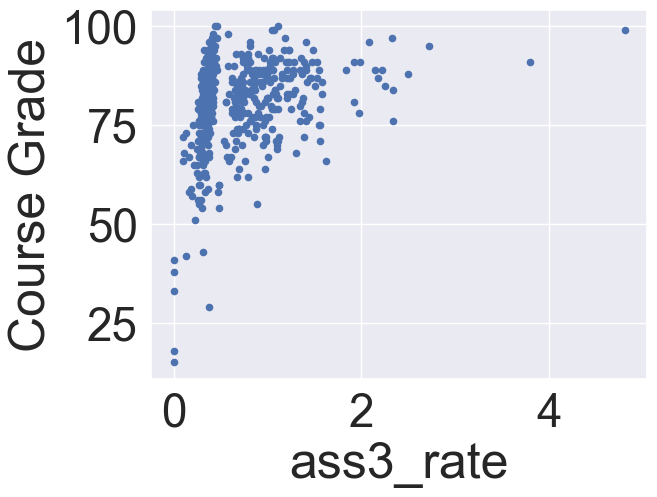

In [ ]:
merge_pd.plot('ass3_rate', 'Course Grade', kind='scatter')

<Axes: xlabel='Assignment03 [25]', ylabel='Assignment 3 duration to submit (in hours)'>

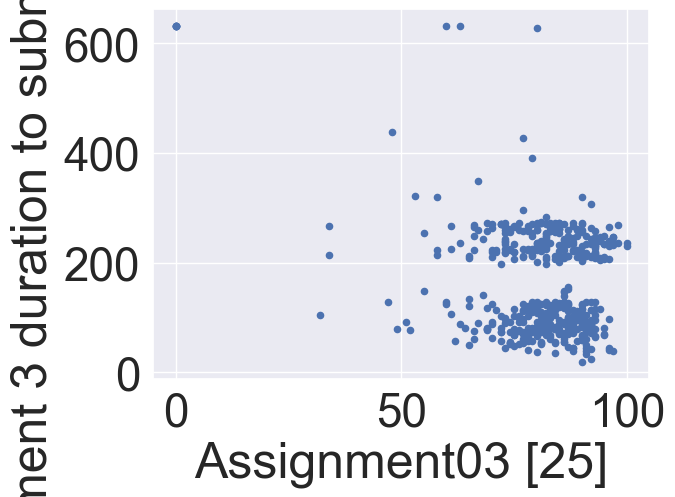

In [ ]:
merge_pd.plot('Assignment03 [25]', 'Assignment 3 duration to submit (in hours)', kind='scatter')

<Axes: xlabel='Assignment 3 duration to submit (in hours)', ylabel='Course Grade'>

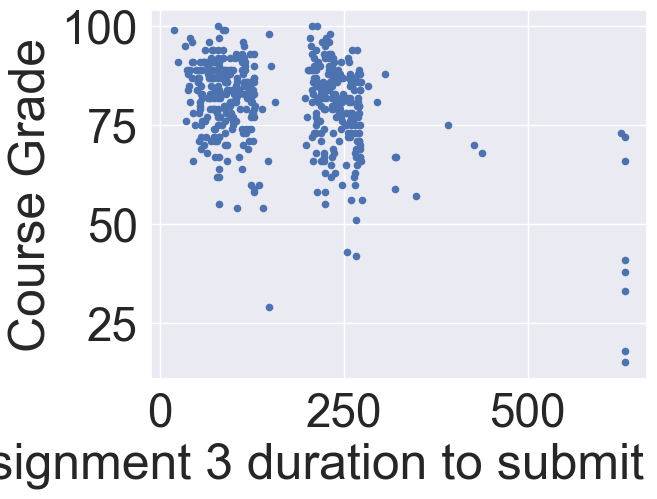

In [ ]:
merge_pd.plot('Assignment 3 duration to submit (in hours)', 'Course Grade', kind='scatter')

<Axes: xlabel='ass3_rate', ylabel='Course Grade'>

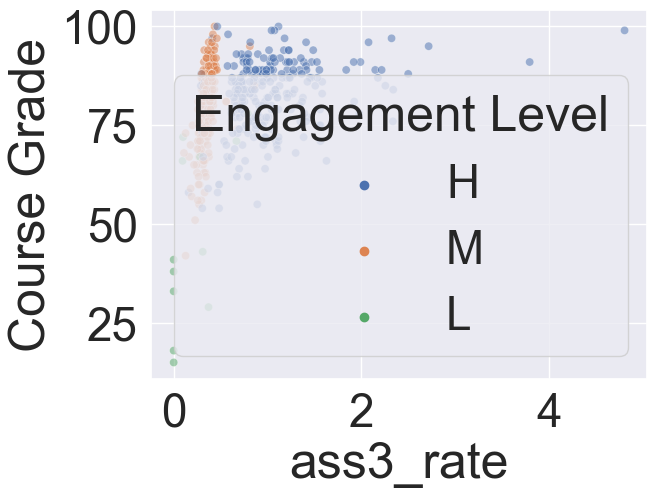

In [ ]:
sns.scatterplot(data=merge_pd, x='ass3_rate', y='Course Grade', hue='Engagement Level',alpha=0.5)

<Axes: xlabel='ass3_rate', ylabel='Final Exam [35]'>

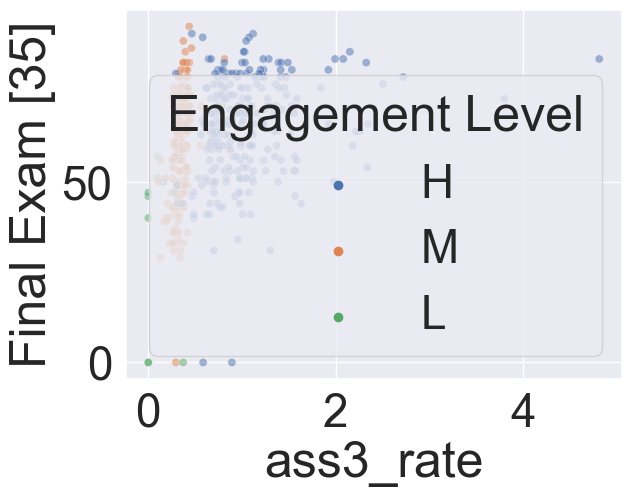

In [ ]:
sns.scatterplot(data=merge_pd, x='ass3_rate', y='Final Exam [35]', hue='Engagement Level',alpha=0.5)

<Axes: xlabel='Assignment 3 duration to submit (in hours)', ylabel='Course Grade'>

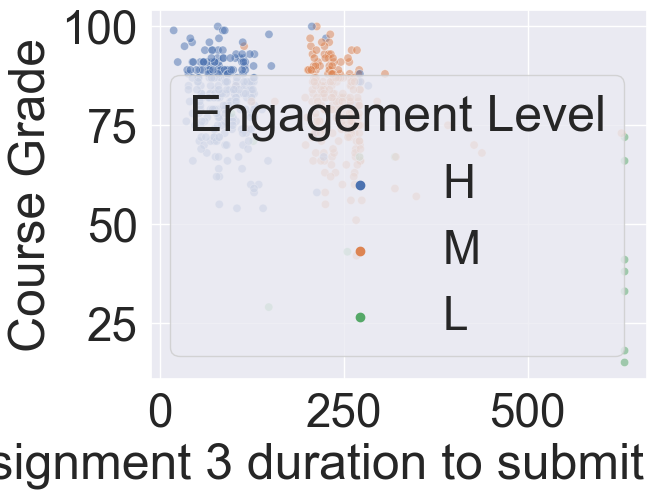

In [ ]:
sns.scatterplot(data=merge_pd, x='Assignment 3 duration to submit (in hours)', y='Course Grade', hue='Engagement Level',alpha=0.5)

<Axes: xlabel='Assignment 3 duration to submit (in hours)', ylabel='Final Exam [35]'>

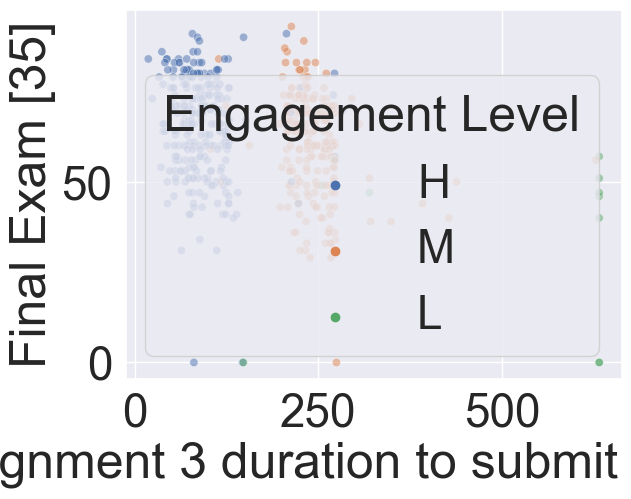

In [ ]:
sns.scatterplot(data=merge_pd, x='Assignment 3 duration to submit (in hours)', y="Final Exam [35]", hue='Engagement Level',alpha=0.5)

<Axes: xlabel='Assignment 1 duration to submit (in hours)', ylabel='Final Exam [35]'>

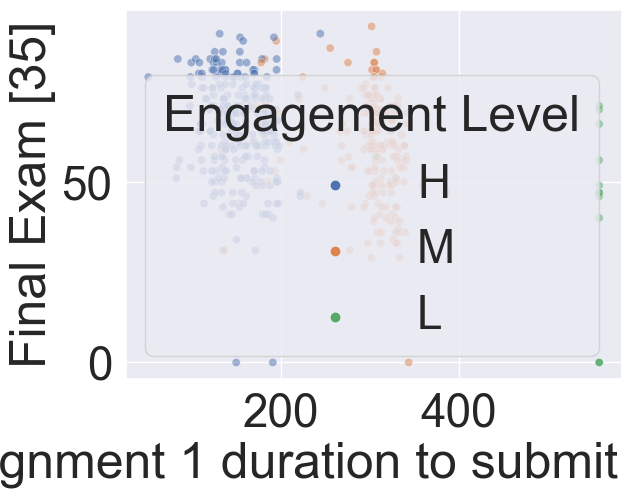

In [ ]:
sns.scatterplot(data=merge_pd, x='Assignment 1 duration to submit (in hours)', y="Final Exam [35]", hue='Engagement Level',alpha=0.5)

<Axes: xlabel='Assignment 2 duration to submit (in hours)', ylabel='Final Exam [35]'>

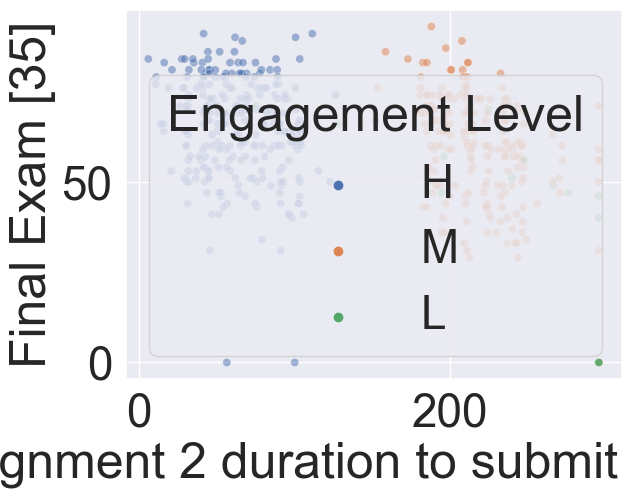

In [ ]:
sns.scatterplot(data=merge_pd, x='Assignment 2 duration to submit (in hours)', y="Final Exam [35]", hue='Engagement Level',alpha=0.5)

<Axes: xlabel='Assignment 3 duration to submit (in hours)', ylabel='Final Exam [35]'>

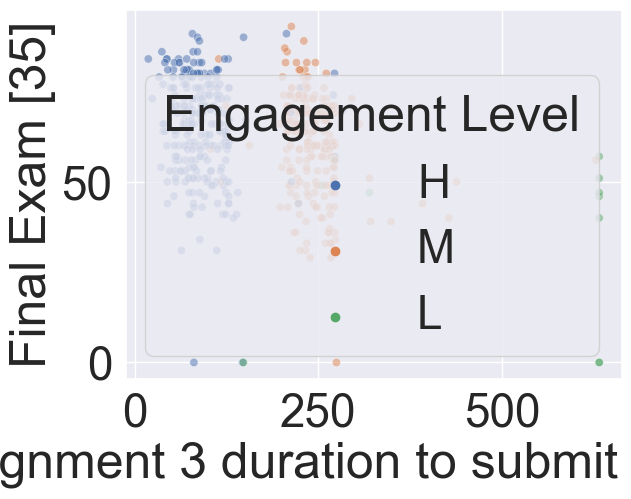

In [ ]:
sns.scatterplot(data=merge_pd, x='Assignment 3 duration to submit (in hours)', y="Final Exam [35]", hue='Engagement Level',alpha=0.5)

In [186]:
import seaborn as sns, numpy as np, pandas as pd, random
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
sns.set_style("whitegrid", {'axes.grid' : False})

fig = plt.figure(figsize=(6,6))

ax = Axes3D(fig)

x = merge_pd["ass1_rate"]
y = merge_pd["ass2_rate"]
z = merge_pd["Course Grade"]


g = ax.scatter(x, y, z, c=z, marker='o', depthshade=False, cmap='Paired', sizes=z)
ax.set_xlabel('X Label')
ax.set_ylabel('Y Label')
ax.set_zlabel('Z Label')

# produce a legend with the unique colors from the scatter
legend = ax.legend(*g.legend_elements(), loc="lower center", title="Course Grade", borderaxespad=-10, ncol=4)
ax.add_artist(legend)

plt.show()

<Figure size 600x600 with 0 Axes>

In [187]:
import plotly.express as px
df = px.data.iris()
fig = px.scatter_3d(df, x='sepal_length', y='sepal_width', z='petal_width',
              color='species')
fig.show()

In [188]:
import plotly.express as px

fig = px.scatter_3d(x = merge_pd["ass1_rate"], y=merge_pd["ass2_rate"], z=merge_pd["Course Grade"],
              color=z)
fig.show()

In [189]:
import plotly.express as px

fig = px.scatter_3d(x = merge_pd["ass1_rate"], y=merge_pd["ass2_rate"], z=merge_pd["Final Exam [35]"],
              color=merge_pd["Engagement Level"])
fig.show()

<Axes: xlabel='Assignment01 [8]', ylabel='Course Grade'>

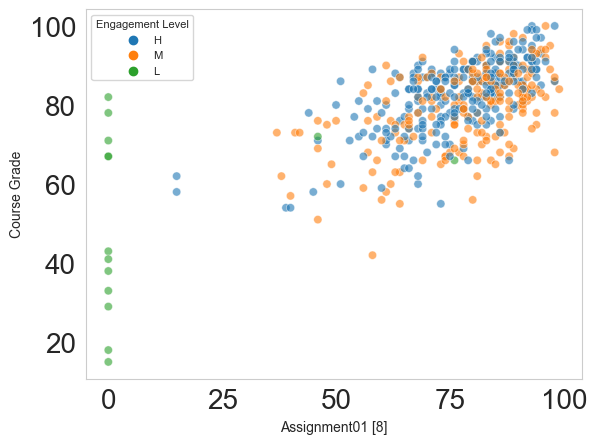

In [190]:
sns.scatterplot(data=merge_pd, x='Assignment01 [8]', y='Course Grade', hue='Engagement Level', alpha=0.6)

<Axes: xlabel='Assignment02 [12]', ylabel='Course Grade'>

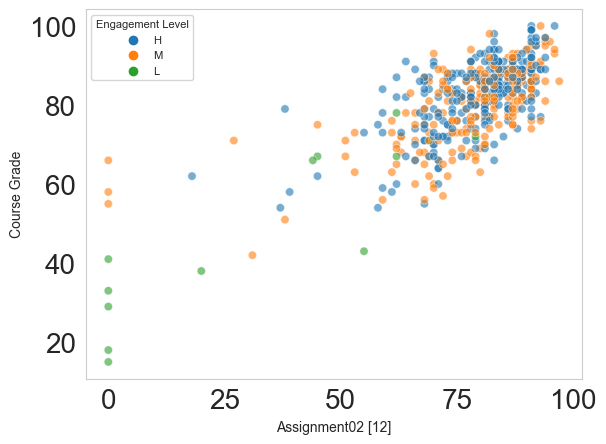

In [191]:
sns.scatterplot(data=merge_pd, x='Assignment02 [12]', y='Course Grade', hue='Engagement Level', alpha=0.6)

<Axes: xlabel='Assignment03 [25]', ylabel='Course Grade'>

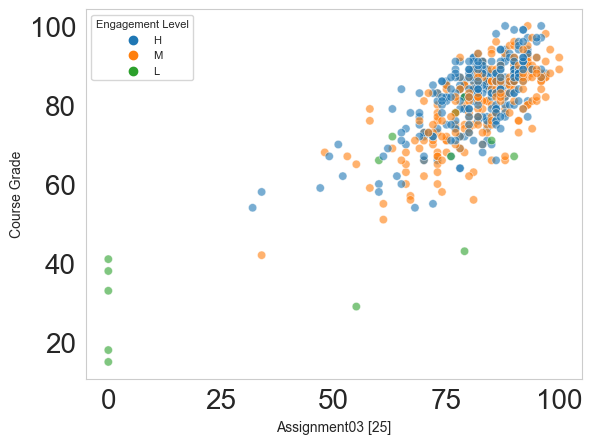

In [192]:
sns.scatterplot(data=merge_pd, x='Assignment03 [25]', y='Course Grade', hue='Engagement Level', alpha=0.6)